# MODEL 1 | BATCH : 2 | LR : 0.01 | 80:20

In [ ]:
import zipfile
import os

zip_file_path = '/content/drive/MyDrive/SKRIPSI/Dataset/PneumoniaDataset80-20.zip'  # Ganti dengan path ke file ZIP Anda
unzip_dir = '/content'  # Ganti dengan direktori di mana Anda ingin mengekstrak file

def extract_zip(zip_file, extract_dir):
    with zipfile.ZipFile(zip_file, 'r') as zip_ref:
        zip_ref.extractall(extract_dir)

def list_files(directory):
    return os.listdir(directory)

# Ekstrak file ZIP
extract_zip(zip_file_path, unzip_dir)

# Tampilkan daftar file yang diekstrak
extracted_files = list_files(unzip_dir)
print(extracted_files)

['.config', 'drive', '__MACOSX', 'PneumoniaDataset80-20', 'sample_data']


In [ ]:
import os

def count_files_in_folder(folder_path):
    # Mengecek apakah path adalah direktori
    if not os.path.isdir(folder_path):
        print(f"{folder_path} bukan direktori.")
        return

    # Menggunakan os.listdir untuk mendapatkan daftar semua file di dalam folder
    all_files = os.listdir(folder_path)

    # Menghitung jumlah file
    file_count = len(all_files)

    print(f"Jumlah file di {folder_path}: {file_count/2}")

# Gantilah 'path_to_your_folder' dengan path folder yang ingin Anda hitung
folder_path = '/content/PneumoniaDataset80-20/train'
count_files_in_folder(folder_path)

Jumlah file di /content/PneumoniaDataset80-20/train: 240.0


In [ ]:
import torch
import os


DEVICE = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

BATCH_SIZE = 2 # Increase / decrease according to GPU memeory.
RESIZE_TO = 300 # Resize the image for training and transforms.
NUM_EPOCHS = 100 # Number of epochs to train for.
NUM_WORKERS = 2 # Number of parallel workers for data loading.

CLASSES = [
    '_background','Lung Opacity'
    # 'helmet','head','person'
]



TRAIN_DIR = '/content/PneumoniaDataset80-20/train'
VALID_DIR = '/content/PneumoniaDataset80-20/test'
# TRAIN_DIR = '/content/Hard-Hat-Sample-3/train'
# VALID_DIR = '/content/Hard-Hat-Sample-3/valid'

# Classes: 0 index is reserved for background.


NUM_CLASSES = len(CLASSES)

# Whether to visualize images after crearing the data loaders.
VISUALIZE_TRANSFORMED_IMAGES = False

# Location to save model and plots.
OUT_DIR = 'outputs'
os.makedirs(OUT_DIR, exist_ok=True)

In [ ]:
import albumentations as A
import cv2
import numpy as np
import torch
import matplotlib.pyplot as plt

from albumentations.pytorch import ToTensorV2


plt.style.use('ggplot')

# This class keeps track of the training and validation loss values
# and helps to get the average for each epoch as well.
class Averager:
    def __init__(self):
        self.current_total = 0.0
        self.iterations = 0.0

    def send(self, value):
        self.current_total += value
        self.iterations += 1

    @property
    def value(self):
        if self.iterations == 0:
            return 0
        else:
            return 1.0 * self.current_total / self.iterations

    def reset(self):
        self.current_total = 0.0
        self.iterations = 0.0

class SaveBestModel:
    """
    Class to save the best model while training. If the current epoch's
    validation mAP @0.5:0.95 IoU higher than the previous highest, then save the
    model state.
    """
    def __init__(
        self, best_valid_map=float(0)
    ):
        self.best_valid_map = best_valid_map

    def __call__(
        self,
        model,
        current_valid_map,
        epoch,
        OUT_DIR,
    ):
        if current_valid_map > self.best_valid_map:
            self.best_valid_map = current_valid_map
            print(f"\nBEST VALIDATION mAP: {self.best_valid_map}")
            print(f"\nSAVING BEST MODEL FOR EPOCH: {epoch+1}\n")
            torch.save({
                'epoch': epoch+1,
                'model_state_dict': model.state_dict(),
                }, f"{OUT_DIR}/best_model.pth")

def collate_fn(batch):
    """
    To handle the data loading as different images may have different number
    of objects and to handle varying size tensors as well.
    """
    return tuple(zip(*batch))

# Define the training tranforms.
def get_train_transform():
    return A.Compose([
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.Rotate(limit=6),
        A.Blur(blur_limit=3, p=0.1),
        A.MotionBlur(blur_limit=3, p=0.1),
        A.MedianBlur(blur_limit=3, p=0.1),
        A.RandomBrightnessContrast(p=0.2),
        ToTensorV2(p=1.0),
    ], bbox_params={
        'format': 'pascal_voc',
        'label_fields': ['labels']
    })


# Define the validation transforms.
def get_valid_transform():
    return A.Compose([
        ToTensorV2(p=1.0),
    ], bbox_params={
        'format': 'pascal_voc',
        'label_fields': ['labels']
    })


def show_tranformed_image(train_loader):
    """
    This function shows the transformed images from the `train_loader`.
    Helps to check whether the tranformed images along with the corresponding
    labels are correct or not.
    Only runs if `VISUALIZE_TRANSFORMED_IMAGES = True` in config.py.
    """
    if len(train_loader) > 0:
        for i in range(1):
            images, targets = next(iter(train_loader))
            images = list(image.to(DEVICE) for image in images)
            targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]
            boxes = targets[i]['boxes'].cpu().numpy().astype(np.int32)
            labels = targets[i]['labels'].cpu().numpy().astype(np.int32)
            sample = images[i].permute(1, 2, 0).cpu().numpy()
            sample = cv2.cvtColor(sample, cv2.COLOR_RGB2BGR)
            for box_num, box in enumerate(boxes):
                cv2.rectangle(sample,
                            (box[0], box[1]),
                            (box[2], box[3]),
                            (0, 0, 255), 2)
                cv2.putText(sample, CLASSES[labels[box_num]],
                            (box[0], box[1]-10), cv2.FONT_HERSHEY_SIMPLEX,
                            1.0, (0, 0, 255), 2)
            cv2.imshow('Transformed image', sample)
            cv2.waitKey(0)
            cv2.destroyAllWindows()

def save_model(epoch, model, optimizer):
    """
    Function to save the trained model till current epoch, or whenver called
    """
    torch.save({
                'epoch': epoch+1,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                }, 'outputs/last_model.pth')

def save_loss_plot(
    OUT_DIR,
    train_loss_list,
    x_label='iterations',
    y_label='train loss',
    save_name='train_loss'
):
    """
    Function to save both train loss graph.

    :param OUT_DIR: Path to save the graphs.
    :param train_loss_list: List containing the training loss values.
    """
    figure_1 = plt.figure(figsize=(10, 7), num=1, clear=True)
    train_ax = figure_1.add_subplot()
    train_ax.plot(train_loss_list, color='tab:blue')
    train_ax.set_xlabel(x_label)
    train_ax.set_ylabel(y_label)
    figure_1.savefig(f"{OUT_DIR}/{save_name}.png")
    print('SAVING PLOTS COMPLETE...')

def save_mAP(OUT_DIR, map_05, map):
    """
    Saves the mAP@0.5 and mAP@0.5:0.95 per epoch.
    :param OUT_DIR: Path to save the graphs.
    :param map_05: List containing mAP values at 0.5 IoU.
    :param map: List containing mAP values at 0.5:0.95 IoU.
    """
    figure = plt.figure(figsize=(10, 7), num=1, clear=True)
    ax = figure.add_subplot()
    ax.plot(
        map_05, color='tab:orange', linestyle='-',
        label='mAP@0.5'
    )
    ax.plot(
        map, color='tab:red', linestyle='-',
        label='mAP@0.5:0.95'
    )
    ax.set_xlabel('Epochs')
    ax.set_ylabel('mAP')
    ax.legend()
    figure.savefig(f"{OUT_DIR}/map.png")

In [ ]:
import torch
import cv2
import numpy as np
import os
import glob as glob
from google.colab.patches import cv2_imshow


from xml.etree import ElementTree as et


from torch.utils.data import Dataset, DataLoader
# from custom_utils import collate_fn, get_train_transform, get_valid_transform

# The dataset class.
class CustomDataset(Dataset):
    def __init__(self, dir_path, width, height, classes, transforms=None):
        self.transforms = transforms
        self.dir_path = dir_path
        self.height = height
        self.width = width
        self.classes = classes
        self.image_file_types = ['*.jpg', '*.jpeg', '*.png', '*.ppm', '*.JPG']
        self.all_image_paths = []

        # Get all the image paths in sorted order.
        for file_type in self.image_file_types:
            self.all_image_paths.extend(glob.glob(os.path.join(self.dir_path, file_type)))
        self.all_images = [image_path.split(os.path.sep)[-1] for image_path in self.all_image_paths]
        self.all_images = sorted(self.all_images)

    def __getitem__(self, idx):
        # Capture the image name and the full image path.
        image_name = self.all_images[idx]
        image_path = os.path.join(self.dir_path, image_name)

        # Read and preprocess the image.
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
        image_resized = cv2.resize(image, (self.width, self.height))
        image_resized /= 255.0

        # Capture the corresponding XML file for getting the annotations.
        annot_filename = os.path.splitext(image_name)[0] + '.xml'
        annot_file_path = os.path.join(self.dir_path, annot_filename)

        boxes = []
        labels = []
        tree = et.parse(annot_file_path)
        root = tree.getroot()

        # Original image width and height.
        image_width = image.shape[1]
        image_height = image.shape[0]

        # Box coordinates for xml files are extracted
        # and corrected for image size given.
        for member in root.findall('object'):
            # Get label and map the `classes`.
            labels.append(self.classes.index(member.find('name').text))

            # Left corner x-coordinates.
            xmin = int(member.find('bndbox').find('xmin').text)
            # Right corner x-coordinates.
            xmax = int(member.find('bndbox').find('xmax').text)
            # Left corner y-coordinates.
            ymin = int(member.find('bndbox').find('ymin').text)
            # Right corner y-coordinates.
            ymax = int(member.find('bndbox').find('ymax').text)

            # Resize the bounding boxes according
            # to resized image `width`, `height`.
            xmin_final = (xmin/image_width)*self.width
            xmax_final = (xmax/image_width)*self.width
            ymin_final = (ymin/image_height)*self.height
            ymax_final = (ymax/image_height)*self.height

            # Check that max coordinates are at least one pixel
            # larger than min coordinates.
            if xmax_final == xmin_final:
                xmax_final += 1
            if ymax_final == ymin_final:
                ymax_final += 1
            # Check that all coordinates are within the image.
            if xmax_final > self.width:
                xmax_final = self.width
            if ymax_final > self.height:
                ymax_final = self.height

            boxes.append([xmin_final, ymin_final, xmax_final, ymax_final])

        # Bounding box to tensor.
        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        # Area of the bounding boxes.
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0]) if len(boxes) > 0 \
            else torch.as_tensor(boxes, dtype=torch.float32)
        # No crowd instances.
        iscrowd = torch.zeros((boxes.shape[0],), dtype=torch.int64)
        # Labels to tensor.
        labels = torch.as_tensor(labels, dtype=torch.int64)

        # Prepare the final `target` dictionary.
        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["area"] = area
        target["iscrowd"] = iscrowd
        image_id = torch.tensor([idx])
        target["image_id"] = image_id

        # Apply the image transforms.
        if self.transforms:
            sample = self.transforms(image = image_resized,
                                     bboxes = target['boxes'],
                                     labels = labels)
            image_resized = sample['image']
            target['boxes'] = torch.Tensor(sample['bboxes'])

        if np.isnan((target['boxes']).numpy()).any() or target['boxes'].shape == torch.Size([0]):
            target['boxes'] = torch.zeros((0, 4), dtype=torch.int64)
        return image_resized, target

    def __len__(self):
        return len(self.all_images)
        # return 500;

# Prepare the final datasets and data loaders.
def create_train_dataset(DIR):
    train_dataset = CustomDataset(
        DIR, RESIZE_TO, RESIZE_TO, CLASSES, get_train_transform()
    )
    return train_dataset
def create_valid_dataset(DIR):
    valid_dataset = CustomDataset(
        DIR, RESIZE_TO, RESIZE_TO, CLASSES, get_valid_transform()
    )
    return valid_dataset
def create_test_dataset(DIR):
    test_dataset = CustomDataset(
        DIR, RESIZE_TO, RESIZE_TO, CLASSES, get_valid_transform()
    )
    return test_dataset
def create_train_loader(train_dataset, num_workers=0):
    train_loader = DataLoader(
        train_dataset,
        batch_size=BATCH_SIZE,
        shuffle=True,
        num_workers=num_workers,
        collate_fn=collate_fn,
        drop_last=True
    )
    return train_loader
def create_valid_loader(valid_dataset, num_workers=0):
    valid_loader = DataLoader(
        valid_dataset,
        batch_size=BATCH_SIZE,
        shuffle=False,
        num_workers=num_workers,
        collate_fn=collate_fn,
        drop_last=True
    )
    return valid_loader
def create_test_loader(test_dataset, num_workers=0):
    test_loader = DataLoader(
        test_dataset,
        batch_size=1,
        shuffle=False,
        num_workers=num_workers,
        collate_fn=collate_fn,
        drop_last=True
    )
    return test_loader


# execute `datasets.py`` using Python command from
# Terminal to visualize sample images
# USAGE: python datasets.py



In [ ]:
import torchvision
import torch

from functools import partial
from torchvision.models.detection import RetinaNet
from torchvision.models.detection.backbone_utils import resnet_fpn_backbone
from torchvision.models.detection.retinanet import RetinaNetClassificationHead
from torchvision.models.detection import RetinaNet_ResNet50_FPN_V2_Weights
from torchvision.models.detection.retinanet import RetinaNetClassificationHead

def create_model(num_classes):
    model = torchvision.models.detection.retinanet_resnet50_fpn_v2(
        weights=RetinaNet_ResNet50_FPN_V2_Weights.COCO_V1
    )
    num_anchors = model.head.classification_head.num_anchors

    model.head.classification_head = RetinaNetClassificationHead(
        in_channels=256,
        num_anchors=num_anchors,
        num_classes=num_classes,
        norm_layer=partial(torch.nn.GroupNorm, 32)
    )
    return model

if __name__ == '__main__':
    model = create_model(2)
    # print(model)
    # Total parameters and trainable parameters.
    total_params = sum(p.numel() for p in model.parameters())
    print(f"{total_params:,} total parameters.")
    total_trainable_params = sum(
        p.numel() for p in model.parameters() if p.requires_grad)
    print(f"{total_trainable_params:,} training parameters.")

Downloading: "https://download.pytorch.org/models/retinanet_resnet50_fpn_v2_coco-5905b1c5.pth" to /root/.cache/torch/hub/checkpoints/retinanet_resnet50_fpn_v2_coco-5905b1c5.pth
100%|██████████| 146M/146M [00:02<00:00, 71.0MB/s]


36,352,630 total parameters.
36,127,286 training parameters.


In [ ]:
!pip install torchmetrics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 840.2/840.2 kB 10.0 MB/s eta 0:00:00


Number of training samples: 240
Number of validation samples: 60

36,352,630 total parameters.
36,127,286 training parameters.
Adjusting learning rate of group 0 to 1.0000e-02.

EPOCH 1 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #1 train loss: 1.657
Epoch #1 mAP: 0.0009000900317914784
Took 0.406 minutes for epoch 0

BEST VALIDATION mAP: 0.0018001800635829568

SAVING BEST MODEL FOR EPOCH: 1

SAVING PLOTS COMPLETE...

EPOCH 2 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #2 train loss: 1.324
Epoch #2 mAP: 0.015989137813448906
Took 0.339 minutes for epoch 1

BEST VALIDATION mAP: 0.07639124244451523

SAVING BEST MODEL FOR EPOCH: 2

SAVING PLOTS COMPLETE...

EPOCH 3 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torchmetrics/utilities/prints.py:43: UserWarning: Encountered more than 100 detections in a single image. This means that certain detections with the lowest scores will be ignored, that may have an undesirable impact on performance. Please consider adjusting the `max_detection_threshold` to suit your use case. To disable this warning, set attribute class `warn_on_many_detections=False`, after initializing the metric.
  warnings.warn(*args, **kwargs)  # noqa: B028


Epoch #3 train loss: 1.188
Epoch #3 mAP: 0.0024348911829292774
Took 0.686 minutes for epoch 2
SAVING PLOTS COMPLETE...

EPOCH 4 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #4 train loss: 1.059
Epoch #4 mAP: 0.02037772722542286
Took 0.350 minutes for epoch 3

BEST VALIDATION mAP: 0.08748581260442734

SAVING BEST MODEL FOR EPOCH: 4

SAVING PLOTS COMPLETE...

EPOCH 5 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #5 train loss: 0.970
Epoch #5 mAP: 0.012328432872891426
Took 0.350 minutes for epoch 4
SAVING PLOTS COMPLETE...

EPOCH 6 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #6 train loss: 0.909
Epoch #6 mAP: 0.020480360835790634
Took 0.347 minutes for epoch 5
SAVING PLOTS COMPLETE...

EPOCH 7 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #7 train loss: 0.852
Epoch #7 mAP: 0.0355500653386116
Took 1.019 minutes for epoch 6

BEST VALIDATION mAP: 0.14219674468040466

SAVING BEST MODEL FOR EPOCH: 7

SAVING PLOTS COMPLETE...

EPOCH 8 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #8 train loss: 0.820
Epoch #8 mAP: 0.060811299830675125
Took 0.351 minutes for epoch 7

BEST VALIDATION mAP: 0.2097836583852768

SAVING BEST MODEL FOR EPOCH: 8

SAVING PLOTS COMPLETE...

EPOCH 9 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7aa0d5893e20>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process


Epoch #9 train loss: 0.782
Epoch #9 mAP: 0.08821244537830353
Took 0.182 minutes for epoch 8

BEST VALIDATION mAP: 0.32111841440200806

SAVING BEST MODEL FOR EPOCH: 9

SAVING PLOTS COMPLETE...

EPOCH 10 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #10 train loss: 0.748
Epoch #10 mAP: 0.14402484893798828
Took 0.184 minutes for epoch 9

BEST VALIDATION mAP: 0.4669557511806488

SAVING BEST MODEL FOR EPOCH: 10

SAVING PLOTS COMPLETE...

EPOCH 11 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #11 train loss: 0.710
Epoch #11 mAP: 0.15616808831691742
Took 0.349 minutes for epoch 10

BEST VALIDATION mAP: 0.47751960158348083

SAVING BEST MODEL FOR EPOCH: 11

SAVING PLOTS COMPLETE...

EPOCH 12 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #12 train loss: 0.679
Epoch #12 mAP: 0.1773848831653595
Took 0.349 minutes for epoch 11

BEST VALIDATION mAP: 0.546093225479126

SAVING BEST MODEL FOR EPOCH: 12

SAVING PLOTS COMPLETE...

EPOCH 13 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #13 train loss: 0.648
Epoch #13 mAP: 0.18863962590694427
Took 0.349 minutes for epoch 12

BEST VALIDATION mAP: 0.5561937689781189

SAVING BEST MODEL FOR EPOCH: 13

SAVING PLOTS COMPLETE...

EPOCH 14 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #14 train loss: 0.620
Epoch #14 mAP: 0.21174411475658417
Took 0.347 minutes for epoch 13

BEST VALIDATION mAP: 0.6290260553359985

SAVING BEST MODEL FOR EPOCH: 14

SAVING PLOTS COMPLETE...

EPOCH 15 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #15 train loss: 0.594
Epoch #15 mAP: 0.18638435006141663
Took 0.182 minutes for epoch 14
SAVING PLOTS COMPLETE...

EPOCH 16 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #16 train loss: 0.574
Epoch #16 mAP: 0.22353482246398926
Took 1.354 minutes for epoch 15

BEST VALIDATION mAP: 0.6386342644691467

SAVING BEST MODEL FOR EPOCH: 16

SAVING PLOTS COMPLETE...

EPOCH 17 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #17 train loss: 0.556
Epoch #17 mAP: 0.2591094374656677
Took 0.350 minutes for epoch 16

BEST VALIDATION mAP: 0.704468309879303

SAVING BEST MODEL FOR EPOCH: 17

SAVING PLOTS COMPLETE...

EPOCH 18 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #18 train loss: 0.562
Epoch #18 mAP: 0.22495810687541962
Took 0.353 minutes for epoch 17
SAVING PLOTS COMPLETE...

EPOCH 19 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #19 train loss: 0.558
Epoch #19 mAP: 0.24933430552482605
Took 0.350 minutes for epoch 18
SAVING PLOTS COMPLETE...

EPOCH 20 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #20 train loss: 0.524
Epoch #20 mAP: 0.26163503527641296
Took 0.350 minutes for epoch 19

BEST VALIDATION mAP: 0.7696636319160461

SAVING BEST MODEL FOR EPOCH: 20

SAVING PLOTS COMPLETE...

EPOCH 21 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #21 train loss: 0.543
Epoch #21 mAP: 0.25551071763038635
Took 0.348 minutes for epoch 20
SAVING PLOTS COMPLETE...

EPOCH 22 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #22 train loss: 0.525
Epoch #22 mAP: 0.2771187126636505
Took 0.354 minutes for epoch 21
SAVING PLOTS COMPLETE...

EPOCH 23 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #23 train loss: 0.522
Epoch #23 mAP: 0.24738149344921112
Took 0.184 minutes for epoch 22
SAVING PLOTS COMPLETE...

EPOCH 24 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #24 train loss: 0.510
Epoch #24 mAP: 0.26372894644737244
Took 0.345 minutes for epoch 23
SAVING PLOTS COMPLETE...

EPOCH 25 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #25 train loss: 0.511
Epoch #25 mAP: 0.25419214367866516
Took 0.350 minutes for epoch 24
SAVING PLOTS COMPLETE...

EPOCH 26 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #26 train loss: 0.505
Epoch #26 mAP: 0.25216221809387207
Took 0.348 minutes for epoch 25
SAVING PLOTS COMPLETE...

EPOCH 27 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #27 train loss: 0.493
Epoch #27 mAP: 0.2758444547653198
Took 0.348 minutes for epoch 26
SAVING PLOTS COMPLETE...

EPOCH 28 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #28 train loss: 0.483
Epoch #28 mAP: 0.27256113290786743
Took 0.346 minutes for epoch 27

BEST VALIDATION mAP: 0.7728458046913147

SAVING BEST MODEL FOR EPOCH: 28

SAVING PLOTS COMPLETE...

EPOCH 29 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #29 train loss: 0.489
Epoch #29 mAP: 0.2695731222629547
Took 0.345 minutes for epoch 28
SAVING PLOTS COMPLETE...

EPOCH 30 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #30 train loss: 0.494
Epoch #30 mAP: 0.30895134806632996
Took 0.348 minutes for epoch 29

BEST VALIDATION mAP: 0.7992202639579773

SAVING BEST MODEL FOR EPOCH: 30

SAVING PLOTS COMPLETE...

EPOCH 31 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #31 train loss: 0.469
Epoch #31 mAP: 0.24606092274188995
Took 0.342 minutes for epoch 30
SAVING PLOTS COMPLETE...

EPOCH 32 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #32 train loss: 0.452
Epoch #32 mAP: 0.2580830454826355
Took 0.347 minutes for epoch 31
SAVING PLOTS COMPLETE...

EPOCH 33 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #33 train loss: 0.450
Epoch #33 mAP: 0.26222991943359375
Took 0.347 minutes for epoch 32
SAVING PLOTS COMPLETE...

EPOCH 34 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #34 train loss: 0.458
Epoch #34 mAP: 0.27350711822509766
Took 0.345 minutes for epoch 33
SAVING PLOTS COMPLETE...

EPOCH 35 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #35 train loss: 0.440
Epoch #35 mAP: 0.26786008477211
Took 0.345 minutes for epoch 34
SAVING PLOTS COMPLETE...

EPOCH 36 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #36 train loss: 0.453
Epoch #36 mAP: 0.282767117023468
Took 0.346 minutes for epoch 35

BEST VALIDATION mAP: 0.8034737706184387

SAVING BEST MODEL FOR EPOCH: 36

SAVING PLOTS COMPLETE...

EPOCH 37 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #37 train loss: 0.447
Epoch #37 mAP: 0.2841762900352478
Took 0.346 minutes for epoch 36
SAVING PLOTS COMPLETE...

EPOCH 38 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7aa0d5893e20>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process


Epoch #38 train loss: 0.442
Epoch #38 mAP: 0.260937362909317
Took 0.348 minutes for epoch 37
SAVING PLOTS COMPLETE...

EPOCH 39 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #39 train loss: 0.420
Epoch #39 mAP: 0.270402193069458
Took 0.347 minutes for epoch 38
SAVING PLOTS COMPLETE...

EPOCH 40 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #40 train loss: 0.429
Epoch #40 mAP: 0.28485751152038574
Took 1.685 minutes for epoch 39
SAVING PLOTS COMPLETE...

EPOCH 41 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #41 train loss: 0.420
Epoch #41 mAP: 0.29943475127220154
Took 0.179 minutes for epoch 40
SAVING PLOTS COMPLETE...

EPOCH 42 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #42 train loss: 0.414
Epoch #42 mAP: 0.25335559248924255
Took 0.178 minutes for epoch 41
SAVING PLOTS COMPLETE...

EPOCH 43 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #43 train loss: 0.412
Epoch #43 mAP: 0.255292683839798
Took 0.344 minutes for epoch 42
SAVING PLOTS COMPLETE...

EPOCH 44 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #44 train loss: 0.412
Epoch #44 mAP: 0.28757935762405396
Took 0.177 minutes for epoch 43
SAVING PLOTS COMPLETE...

EPOCH 45 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #45 train loss: 0.407
Epoch #45 mAP: 0.25277331471443176
Took 0.346 minutes for epoch 44
SAVING PLOTS COMPLETE...

EPOCH 46 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #46 train loss: 0.394
Epoch #46 mAP: 0.27013280987739563
Took 0.347 minutes for epoch 45
SAVING PLOTS COMPLETE...

EPOCH 47 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #47 train loss: 0.396
Epoch #47 mAP: 0.26478686928749084
Took 0.345 minutes for epoch 46
SAVING PLOTS COMPLETE...

EPOCH 48 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #48 train loss: 0.397
Epoch #48 mAP: 0.24168069660663605
Took 0.350 minutes for epoch 47
SAVING PLOTS COMPLETE...

EPOCH 49 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #49 train loss: 0.397
Epoch #49 mAP: 0.26559531688690186
Took 1.853 minutes for epoch 48
SAVING PLOTS COMPLETE...

EPOCH 50 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #50 train loss: 0.400
Epoch #50 mAP: 0.2660125494003296
Took 0.345 minutes for epoch 49
SAVING PLOTS COMPLETE...

EPOCH 51 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #51 train loss: 0.379
Epoch #51 mAP: 0.24128471314907074
Took 0.345 minutes for epoch 50
SAVING PLOTS COMPLETE...

EPOCH 52 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #52 train loss: 0.375
Epoch #52 mAP: 0.2484624683856964
Took 0.346 minutes for epoch 51
SAVING PLOTS COMPLETE...

EPOCH 53 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #53 train loss: 0.363
Epoch #53 mAP: 0.2514044940471649
Took 0.177 minutes for epoch 52
SAVING PLOTS COMPLETE...

EPOCH 54 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7aa0d5893e20>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process


Epoch #54 train loss: 0.375
Epoch #54 mAP: 0.25134745240211487
Took 0.348 minutes for epoch 53
SAVING PLOTS COMPLETE...

EPOCH 55 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #55 train loss: 0.355
Epoch #55 mAP: 0.1980188935995102
Took 0.345 minutes for epoch 54
SAVING PLOTS COMPLETE...

EPOCH 56 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #56 train loss: 0.368
Epoch #56 mAP: 0.25083765387535095
Took 0.348 minutes for epoch 55
SAVING PLOTS COMPLETE...

EPOCH 57 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #57 train loss: 0.358
Epoch #57 mAP: 0.23396198451519012
Took 0.178 minutes for epoch 56
SAVING PLOTS COMPLETE...

EPOCH 58 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #58 train loss: 0.354
Epoch #58 mAP: 0.222731351852417
Took 0.347 minutes for epoch 57
SAVING PLOTS COMPLETE...

EPOCH 59 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #59 train loss: 0.361
Epoch #59 mAP: 0.2723607122898102
Took 1.853 minutes for epoch 58
SAVING PLOTS COMPLETE...

EPOCH 60 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #60 train loss: 0.344
Epoch #60 mAP: 0.27367815375328064
Took 0.176 minutes for epoch 59
SAVING PLOTS COMPLETE...

EPOCH 61 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #61 train loss: 0.341
Epoch #61 mAP: 0.24494795501232147
Took 0.176 minutes for epoch 60
SAVING PLOTS COMPLETE...

EPOCH 62 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #62 train loss: 0.334
Epoch #62 mAP: 0.24467192590236664
Took 0.342 minutes for epoch 61
SAVING PLOTS COMPLETE...

EPOCH 63 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #63 train loss: 0.335
Epoch #63 mAP: 0.24248164892196655
Took 0.343 minutes for epoch 62
SAVING PLOTS COMPLETE...

EPOCH 64 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #64 train loss: 0.357
Epoch #64 mAP: 0.28129658102989197
Took 0.181 minutes for epoch 63
SAVING PLOTS COMPLETE...

EPOCH 65 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #65 train loss: 0.345
Epoch #65 mAP: 0.27385446429252625
Took 0.176 minutes for epoch 64
SAVING PLOTS COMPLETE...

EPOCH 66 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #66 train loss: 0.344
Epoch #66 mAP: 0.256076842546463
Took 0.346 minutes for epoch 65
SAVING PLOTS COMPLETE...

EPOCH 67 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #67 train loss: 0.330
Epoch #67 mAP: 0.27500662207603455
Took 0.346 minutes for epoch 66
SAVING PLOTS COMPLETE...

EPOCH 68 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #68 train loss: 0.321
Epoch #68 mAP: 0.252437025308609
Took 0.176 minutes for epoch 67
SAVING PLOTS COMPLETE...

EPOCH 69 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #69 train loss: 0.313
Epoch #69 mAP: 0.25286829471588135
Took 0.344 minutes for epoch 68
SAVING PLOTS COMPLETE...

EPOCH 70 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #70 train loss: 0.334
Epoch #70 mAP: 0.18584056198596954
Took 1.685 minutes for epoch 69
SAVING PLOTS COMPLETE...

EPOCH 71 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #71 train loss: 0.315
Epoch #71 mAP: 0.2501142919063568
Took 0.346 minutes for epoch 70
SAVING PLOTS COMPLETE...

EPOCH 72 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #72 train loss: 0.321
Epoch #72 mAP: 0.26207515597343445
Took 0.175 minutes for epoch 71
SAVING PLOTS COMPLETE...

EPOCH 73 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #73 train loss: 0.311
Epoch #73 mAP: 0.25621551275253296
Took 0.178 minutes for epoch 72
SAVING PLOTS COMPLETE...

EPOCH 74 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #74 train loss: 0.316
Epoch #74 mAP: 0.25369375944137573
Took 0.346 minutes for epoch 73
SAVING PLOTS COMPLETE...

EPOCH 75 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #75 train loss: 0.312
Epoch #75 mAP: 0.25130218267440796
Took 0.349 minutes for epoch 74
SAVING PLOTS COMPLETE...

EPOCH 76 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #76 train loss: 0.306
Epoch #76 mAP: 0.1820002645254135
Took 0.177 minutes for epoch 75
SAVING PLOTS COMPLETE...

EPOCH 77 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #77 train loss: 0.310
Epoch #77 mAP: 0.2339296042919159
Took 0.345 minutes for epoch 76
SAVING PLOTS COMPLETE...

EPOCH 78 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #78 train loss: 0.292
Epoch #78 mAP: 0.22370611131191254
Took 0.344 minutes for epoch 77
SAVING PLOTS COMPLETE...

EPOCH 79 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #79 train loss: 0.302
Epoch #79 mAP: 0.27358099818229675
Took 0.177 minutes for epoch 78

BEST VALIDATION mAP: 0.8042615056037903

SAVING BEST MODEL FOR EPOCH: 79

SAVING PLOTS COMPLETE...

EPOCH 80 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #80 train loss: 0.285
Epoch #80 mAP: 0.26413264870643616
Took 0.178 minutes for epoch 79
SAVING PLOTS COMPLETE...

EPOCH 81 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #81 train loss: 0.300
Epoch #81 mAP: 0.23424257338047028
Took 0.346 minutes for epoch 80
SAVING PLOTS COMPLETE...

EPOCH 82 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #82 train loss: 0.280
Epoch #82 mAP: 0.2285873144865036
Took 0.344 minutes for epoch 81
SAVING PLOTS COMPLETE...

EPOCH 83 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #83 train loss: 0.282
Epoch #83 mAP: 0.2102949023246765
Took 0.345 minutes for epoch 82
SAVING PLOTS COMPLETE...

EPOCH 84 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #84 train loss: 0.278
Epoch #84 mAP: 0.2554013133049011
Took 0.179 minutes for epoch 83
SAVING PLOTS COMPLETE...

EPOCH 85 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #85 train loss: 0.272
Epoch #85 mAP: 0.25672411918640137
Took 0.345 minutes for epoch 84
SAVING PLOTS COMPLETE...

EPOCH 86 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #86 train loss: 0.276
Epoch #86 mAP: 0.2468855082988739
Took 0.178 minutes for epoch 85
SAVING PLOTS COMPLETE...

EPOCH 87 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #87 train loss: 0.270
Epoch #87 mAP: 0.2177831530570984
Took 0.177 minutes for epoch 86
SAVING PLOTS COMPLETE...

EPOCH 88 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #88 train loss: 0.270
Epoch #88 mAP: 0.2473733127117157
Took 0.176 minutes for epoch 87
SAVING PLOTS COMPLETE...

EPOCH 89 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #89 train loss: 0.255
Epoch #89 mAP: 0.23870515823364258
Took 0.346 minutes for epoch 88
SAVING PLOTS COMPLETE...

EPOCH 90 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #90 train loss: 0.264
Epoch #90 mAP: 0.25745919346809387
Took 0.179 minutes for epoch 89
SAVING PLOTS COMPLETE...

EPOCH 91 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #91 train loss: 0.251
Epoch #91 mAP: 0.23278853297233582
Took 0.344 minutes for epoch 90
SAVING PLOTS COMPLETE...

EPOCH 92 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #92 train loss: 0.253
Epoch #92 mAP: 0.2504986524581909
Took 0.346 minutes for epoch 91
SAVING PLOTS COMPLETE...

EPOCH 93 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #93 train loss: 0.247
Epoch #93 mAP: 0.24855221807956696
Took 0.177 minutes for epoch 92
SAVING PLOTS COMPLETE...

EPOCH 94 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #94 train loss: 0.236
Epoch #94 mAP: 0.2613835334777832
Took 0.345 minutes for epoch 93
SAVING PLOTS COMPLETE...

EPOCH 95 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #95 train loss: 0.253
Epoch #95 mAP: 0.24770653247833252
Took 0.178 minutes for epoch 94
SAVING PLOTS COMPLETE...

EPOCH 96 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #96 train loss: 0.240
Epoch #96 mAP: 0.24135540425777435
Took 0.346 minutes for epoch 95
SAVING PLOTS COMPLETE...

EPOCH 97 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #97 train loss: 0.246
Epoch #97 mAP: 0.24659182131290436
Took 0.181 minutes for epoch 96
SAVING PLOTS COMPLETE...

EPOCH 98 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #98 train loss: 0.251
Epoch #98 mAP: 0.23265863955020905
Took 0.349 minutes for epoch 97
SAVING PLOTS COMPLETE...

EPOCH 99 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #99 train loss: 0.255
Epoch #99 mAP: 0.2233315110206604
Took 0.179 minutes for epoch 98
SAVING PLOTS COMPLETE...

EPOCH 100 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #100 train loss: 0.249
Epoch #100 mAP: 0.2528335452079773
Took 0.344 minutes for epoch 99
SAVING PLOTS COMPLETE...


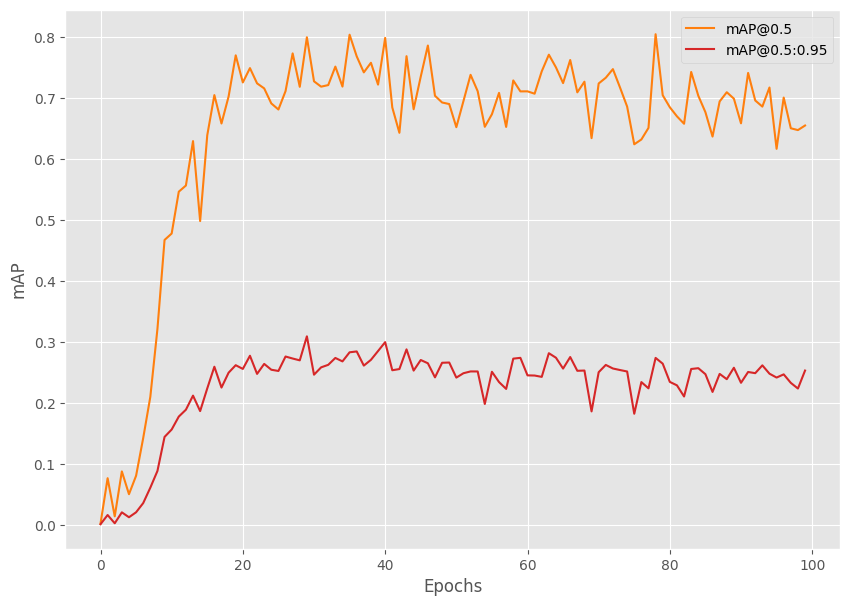

In [ ]:
from tqdm.auto import tqdm
from torchmetrics.detection.mean_ap import MeanAveragePrecision
from torch.optim.lr_scheduler import StepLR
import torch
import matplotlib.pyplot as plt
import time
import os

plt.style.use('ggplot')

seed = 42
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.cuda.manual_seed_all(seed)

# Function for running training iterations.
def train(train_data_loader, model):
    print('Training')
    model.train()

     # initialize tqdm progress bar
    prog_bar = tqdm(train_data_loader, total=len(train_data_loader))

    for i, data in enumerate(prog_bar):
        optimizer.zero_grad()
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]
        loss_dict = model(images, targets)

        losses = sum(loss for loss in loss_dict.values())
        loss_value = losses.item()

        train_loss_hist.send(loss_value)

        losses.backward()
        optimizer.step()

        # update the loss value beside the progress bar for each iteration
        prog_bar.set_description(desc=f"Loss: {loss_value:.4f}")
    return loss_value

# Function for running validation iterations.
def validate(valid_data_loader, model):
    print('Validating')
    model.eval()

    # Initialize tqdm progress bar.
    prog_bar = tqdm(valid_data_loader, total=len(valid_data_loader))
    target = []
    preds = []
    for i, data in enumerate(prog_bar):
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

        with torch.no_grad():
            outputs = model(images, targets)

        # For mAP calculation using Torchmetrics.
        #####################################
        for i in range(len(images)):
            true_dict = dict()
            preds_dict = dict()
            true_dict['boxes'] = targets[i]['boxes'].detach().cpu()
            true_dict['labels'] = targets[i]['labels'].detach().cpu()
            preds_dict['boxes'] = outputs[i]['boxes'].detach().cpu()
            preds_dict['scores'] = outputs[i]['scores'].detach().cpu()
            preds_dict['labels'] = outputs[i]['labels'].detach().cpu()
            preds.append(preds_dict)
            target.append(true_dict)
        #####################################

    metric.reset()
    metric.update(preds, target)
    metric_summary = metric.compute()
    return metric_summary

if __name__ == '__main__':
    os.makedirs('outputs', exist_ok=True)
    train_dataset = create_train_dataset(TRAIN_DIR)
    valid_dataset = create_valid_dataset(VALID_DIR)
    train_loader = create_train_loader(train_dataset, NUM_WORKERS)
    valid_loader = create_valid_loader(valid_dataset, NUM_WORKERS)
    print(f"Number of training samples: {len(train_dataset)}")
    print(f"Number of validation samples: {len(valid_dataset)}\n")

    # Initialize the model and move to the computation device.
    model = create_model(num_classes=NUM_CLASSES)
    model = model.to(DEVICE)
    # print(model)
    # Total parameters and trainable parameters.
    total_params = sum(p.numel() for p in model.parameters())
    print(f"{total_params:,} total parameters.")
    total_trainable_params = sum(
        p.numel() for p in model.parameters() if p.requires_grad)
    print(f"{total_trainable_params:,} training parameters.")
    params = [p for p in model.parameters() if p.requires_grad]
    optimizer = torch.optim.SGD(params, lr=0.01, momentum=0.9, weight_decay=0.0005, nesterov=True)
    scheduler = StepLR(
        optimizer=optimizer, step_size=15, gamma=0.1, verbose=True
    )

    # To monitor training loss
    train_loss_hist = Averager()
    # To store training loss and mAP values.
    train_loss_list = []
    map_50_list = []
    map_list = []

    # Mame to save the trained model with.
    MODEL_NAME = 'model'

    # Whether to show transformed images from data loader or not.
    # if VISUALIZE_TRANSFORMED_IMAGES:
    #     from custom_utils import show_tranformed_image
    #     show_tranformed_image(train_loader)

    # To save best model.
    save_best_model = SaveBestModel()

    metric = MeanAveragePrecision()

    # Training loop.
    for epoch in range(NUM_EPOCHS):
        print(f"\nEPOCH {epoch+1} of {NUM_EPOCHS}")

        # Reset the training loss histories for the current epoch.
        train_loss_hist.reset()

        # Start timer and carry out training and validation.
        start = time.time()
        train_loss = train(train_loader, model)
        metric_summary = validate(valid_loader, model)
        print(f"Epoch #{epoch+1} train loss: {train_loss_hist.value:.3f}")
        print(f"Epoch #{epoch+1} mAP: {metric_summary['map']}")
        end = time.time()
        print(f"Took {((end - start) / 60):.3f} minutes for epoch {epoch}")

        train_loss_list.append(train_loss)
        map_50_list.append(metric_summary['map_50'])
        map_list.append(metric_summary['map'])

        # save the best model till now.
        save_best_model(
            model, float(metric_summary['map_50']), epoch, 'outputs'
        )
        # Save the current epoch model.
        save_model(epoch, model, optimizer)

        # Save loss plot.
        save_loss_plot(OUT_DIR, train_loss_list)

        # Save mAP plot.
        save_mAP(OUT_DIR, map_50_list, map_list)
        # scheduler.step()

In [ ]:
import torch
from tqdm.auto import tqdm
from tqdm import TqdmExperimentalWarning
from torchmetrics.detection.mean_ap import MeanAveragePrecision

# Evaluation function
def validate(valid_data_loader, model):
    model.eval()

    # Initialize tqdm progress bar.
    prog_bar = tqdm(valid_data_loader, total=len(valid_data_loader))
    target = []
    preds = []
    for i, data in enumerate(prog_bar):
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

        with torch.no_grad():
            outputs = model(images, targets)

        # For mAP calculation using Torchmetrics.
        #####################################
        for i in range(len(images)):
            true_dict = dict()
            preds_dict = dict()
            true_dict['boxes'] = targets[i]['boxes'].detach().cpu()
            true_dict['labels'] = targets[i]['labels'].detach().cpu()
            preds_dict['boxes'] = outputs[i]['boxes'].detach().cpu()
            preds_dict['scores'] = outputs[i]['scores'].detach().cpu()
            preds_dict['labels'] = outputs[i]['labels'].detach().cpu()
            preds.append(preds_dict)
            target.append(true_dict)
        #####################################

    metric = MeanAveragePrecision()
    metric.update(preds, target)
    metric_summary = metric.compute()
    return metric_summary

if __name__ == '__main__':
    # Load the best model and trained weights.
    model = create_model(num_classes=NUM_CLASSES)
    checkpoint = torch.load('outputs/best_model.pth', map_location=DEVICE)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.to(DEVICE).eval()

    test_dataset = create_test_dataset(
        '/content/PneumoniaDataset80-20/test'
    )
    test_loader = create_test_loader(test_dataset, num_workers=NUM_WORKERS)

    metric_summary = validate(test_loader, model)
    print(f"mAP_50: {metric_summary['map_50']*100:.3f}")
    print(f"mAP_50_95: {metric_summary['map']*100:.3f}")

  0%|          | 0/60 [00:00<?, ?it/s]

mAP_50: 80.437
mAP_50_95: 27.360


In [ ]:
def make_prediction(model, img, threshold):
    model.eval()
    preds = model(img)
    for id in range(len(preds)) :
        idx_list = []

        for idx, score in enumerate(preds[id]['scores']) :
            if score > threshold :
                idx_list.append(idx)

        preds[id]['boxes'] = preds[id]['boxes'][idx_list]
        preds[id]['labels'] = preds[id]['labels'][idx_list]
        preds[id]['scores'] = preds[id]['scores'][idx_list]

    return preds

def plot_image_from_output(img, annotation):

    img = img.cpu().permute(1,2,0)

    fig,ax = plt.subplots(1)
    ax.imshow(img)

    for idx in range(len(annotation["boxes"])):
        xmin, ymin, xmax, ymax = annotation["boxes"][idx]

        if annotation['labels'][idx] == 1 :
            rect = patches.Rectangle((xmin,ymin),(xmax-xmin),(ymax-ymin),linewidth=1,edgecolor='g',facecolor='none')
        else :
            rect = patches.Rectangle((xmin,ymin),(xmax-xmin),(ymax-ymin),linewidth=1,edgecolor='orange',facecolor='none')

        ax.add_patch(rect)

    plt.show()

In [ ]:
with torch.no_grad():
    print(len(test_loader))
    for imgs, annotations in test_loader:
        imgs = list(img.to(DEVICE) for img in imgs)

        pred = make_prediction(model, imgs, 0.5)
        break

60


({'boxes': tensor([[ 65.0391,  75.5859, 121.8750, 203.3203],
        [166.9922,  78.5156, 239.9414, 211.2305]]), 'labels': tensor([1, 1]), 'area': tensor([7259.9028, 9681.4443]), 'iscrowd': tensor([0, 0]), 'image_id': tensor([0])},)
Target :  tensor([1, 1])


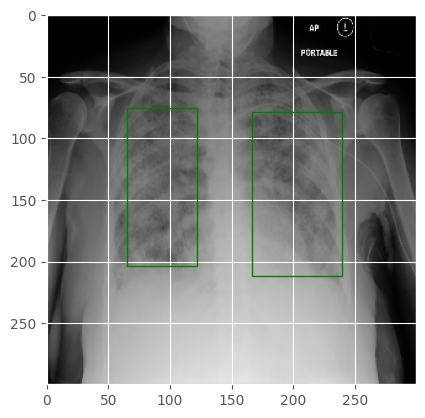

Prediction :  tensor([1, 1], device='cuda:0')
{'boxes': tensor([[ 65.0391,  75.5859, 121.8750, 203.3203],
        [166.9922,  78.5156, 239.9414, 211.2305]]), 'labels': tensor([1, 1]), 'area': tensor([7259.9028, 9681.4443]), 'iscrowd': tensor([0, 0]), 'image_id': tensor([0])}
{'boxes': tensor([[ 56.7218,  61.0753, 123.0944, 203.2630],
        [157.1114,  51.9708, 234.3739, 214.4513]], device='cuda:0'), 'scores': tensor([0.8753, 0.6885], device='cuda:0'), 'labels': tensor([1, 1], device='cuda:0')}


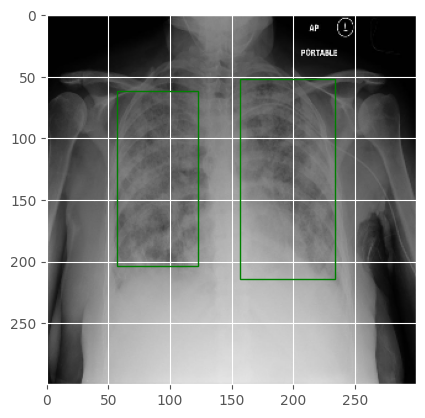

IoU: tensor([[0.7687, 0.0000],
        [0.0000, 0.6727]])


In [ ]:
from torchvision.ops import box_iou
import matplotlib.patches as patches

print(annotations)
_idx = 0
print("Target : ", annotations[_idx]['labels'])
plot_image_from_output(imgs[_idx], annotations[_idx])
print("Prediction : ", pred[_idx]['labels'])
print(annotations[_idx])
print(pred[_idx])

# Create a tensor on the CUDA device
for key in pred[_idx]:
    pred[_idx][key] = pred[_idx][key].cpu()

plot_image_from_output(imgs[_idx], pred[_idx])
iou = box_iou(pred[_idx]['boxes'],annotations[_idx]['boxes'])
print("IoU:", iou)

In [ ]:
from tqdm import tqdm

labels = []
preds_adj_all = []
annot_all = []

for im, annot in tqdm(test_loader, position = 0, leave = True):
    im = list(img.to(DEVICE) for img in im)
    #annot = [{k: v.to(device) for k, v in t.items()} for t in annot]

    for t in annot:
        labels += t['labels']

    with torch.no_grad():
        preds_adj = make_prediction(model, im, 0.5)
        preds_adj = [{k: v.to(torch.device('cpu')) for k, v in t.items()} for t in preds_adj]
        preds_adj_all.append(preds_adj)
        annot_all.append(annot)


100%|██████████| 60/60 [00:01<00:00, 30.09it/s]


In [ ]:
!git clone https://github.com/Pseudo-Lab/Tutorial-Book-Utils
!python Tutorial-Book-Utils/PL_data_loader.py --data FaceMaskDetection

In [ ]:
%cd Tutorial-Book-Utils/
import utils_ObjectDetection as utils

/content/Tutorial-Book-Utils


In [ ]:
sample_metrics = []
for batch_i in range(len(preds_adj_all)):
    sample_metrics += utils.get_batch_statistics(preds_adj_all[batch_i], annot_all[batch_i], iou_threshold=0.5)

true_positives, pred_scores, pred_labels = [torch.cat(x, 0) for x in list(zip(*sample_metrics))]  # batch semua disatukan
precision, recall, AP, f1, ap_class = utils.ap_per_class(true_positives, pred_scores, pred_labels, torch.tensor(labels))
mAP = torch.mean(AP)
print(f'mAP : {mAP}')
print(f'AP : {AP}')

mAP : 0.6988659960224499
AP : tensor([0.6989], dtype=torch.float64)


In [ ]:
sample_metrics = []
for batch_i in range(len(preds_adj_all)):
    sample_metrics += utils.get_batch_statistics(preds_adj_all[batch_i], annot_all[batch_i], iou_threshold=0.4)

true_positives, pred_scores, pred_labels = [torch.cat(x, 0) for x in list(zip(*sample_metrics))]  # batch semua disatukan
precision, recall, AP, f1, ap_class = utils.ap_per_class(true_positives, pred_scores, pred_labels, torch.tensor(labels))
mAP = torch.mean(AP)
print(f'mAP : {mAP}')
print(f'AP : {AP}')

mAP : 0.7655355474076337
AP : tensor([0.7655], dtype=torch.float64)


In [ ]:
sample_metrics = []
for batch_i in range(len(preds_adj_all)):
    sample_metrics += utils.get_batch_statistics(preds_adj_all[batch_i], annot_all[batch_i], iou_threshold=0.3)

true_positives, pred_scores, pred_labels = [torch.cat(x, 0) for x in list(zip(*sample_metrics))]  # batch semua disatukan
precision, recall, AP, f1, ap_class = utils.ap_per_class(true_positives, pred_scores, pred_labels, torch.tensor(labels))
mAP = torch.mean(AP)
print(f'mAP : {mAP}')
print(f'AP : {AP}')

mAP : 0.8098636964696411
AP : tensor([0.8099], dtype=torch.float64)


In [ ]:
import numpy as np
import cv2
import torch
import glob as glob
import os
import time
import argparse
import csv

os.makedirs('inference_outputs/images', exist_ok=True)

COLORS = np.random.uniform(0, 255, size=(len(CLASSES), 3))

# Load the best model and trained weights.
model = create_model(num_classes=NUM_CLASSES)
checkpoint = torch.load('/content/outputs/best_model.pth', map_location=DEVICE)
model.load_state_dict(checkpoint['model_state_dict'])
model.to(DEVICE).eval()

# Directory where all the images are present.
DIR_TEST = '/content/PneumoniaDataset80-20/test'
test_images = glob.glob(f"{DIR_TEST}/*.jpg")
print(f"Test instances: {len(test_images)}")

frame_count = 0 # To count total frames.
total_fps = 0 # To get the final frames per second.
lung_opacity_files = []

for i in range(len(test_images)):
    # Get the image file name for saving output later on.
    image_name = test_images[i].split(os.path.sep)[-1].split('.')[0]
    image = cv2.imread(test_images[i])
    orig_image = image.copy()
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
    image /= 255.0
    image_input = np.transpose(image, (2, 0, 1)).astype(np.float32)
    image_input = torch.tensor(image_input, dtype=torch.float).cuda()
    image_input = torch.unsqueeze(image_input, 0)
    start_time = time.time()
    # Predictions
    with torch.no_grad():
        outputs = model(image_input.to(DEVICE))
    end_time = time.time()

    # Get the current fps.
    fps = 1 / (end_time - start_time)
    total_fps += fps
    frame_count += 1

    # Load all detection to CPU for further operations.
    outputs = [{k: v.to('cpu') for k, v in t.items()} for t in outputs]
    if len(outputs[0]['boxes']) != 0:
        boxes = outputs[0]['boxes'].data.numpy()
        scores = outputs[0]['scores'].data.numpy()
        boxes = boxes[scores >= 0.6].astype(np.int32)
        draw_boxes = boxes.copy()
        # Get all the predicited class names.
        pred_classes = [CLASSES[i] for i in outputs[0]['labels'].cpu().numpy()]
        # Draw the bounding boxes and write the class name on top of it.
        for j, box in enumerate(draw_boxes):
            print(image_name)
            class_name = pred_classes[j]
            color = COLORS[CLASSES.index(class_name)]
            # Recale boxes.
            xmin = int((box[0] / image.shape[1]) * orig_image.shape[1])
            ymin = int((box[1] / image.shape[0]) * orig_image.shape[0])
            xmax = int((box[2] / image.shape[1]) * orig_image.shape[1])
            ymax = int((box[3] / image.shape[0]) * orig_image.shape[0])
            cv2.rectangle(orig_image,
                        (xmin, ymin),
                        (xmax, ymax),
                        color[::-1],
                        3)
            cv2.putText(orig_image,
                        class_name,
                        (xmin, ymin-5),
                        cv2.FONT_HERSHEY_SIMPLEX,
                        0.8,
                        color[::-1],
                        2,
                        lineType=cv2.LINE_AA)
        plt.imshow(cv2.cvtColor(orig_image, cv2.COLOR_BGR2RGB))
        plt.show()

        # Simpan gambar ke direktori
        # cv2.imwrite(f"inference_outputs/images/{image_name}.jpg", orig_image)
    print(f"Image {i+1} done...")
    print('-'*50)

print('TEST PREDICTIONS COMPLETE')
avg_fps = total_fps / frame_count
print(f"Average FPS: {avg_fps:.3f}")

Output hidden; open in https://colab.research.google.com to view.

  0%|          | 0/60 [00:00<?, ?it/s]

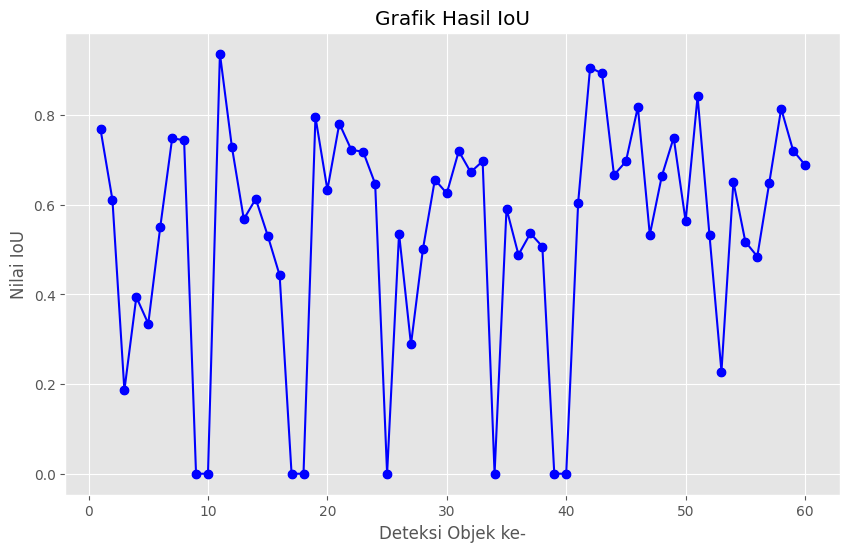

In [ ]:
import shutil
import torch
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
from torchvision.transforms.functional import to_pil_image
from torchvision.ops import box_iou

# Function to calculate Intersection over Union (IoU)
def calculate_iou(box1, box2):
    # Extract coordinates from the bounding box tensors
    box1 = [float(coord) for coord in box1]
    box2 = [float(coord) for coord in box2]

    # Calculate intersection area
    x1_int = max(box1[0], box2[0])
    y1_int = max(box1[1], box2[1])
    x2_int = min(box1[2], box2[2])
    y2_int = min(box1[3], box2[3])

    intersection = max(0, x2_int - x1_int) * max(0, y2_int - y1_int)

    # Calculate union area
    area1 = (box1[2] - box1[0]) * (box1[3] - box1[1])
    area2 = (box2[2] - box2[0]) * (box2[3] - box2[1])
    union = area1 + area2 - intersection

    # Calculate IoU
    iou = intersection / union if union > 0 else 0.0
    return iou

source_path = "/content/drive/MyDrive/SKRIPSI/Hasil/Model_1/best_model.pth"
destination_path = "/content/outputs/best_model.pth"

shutil.copyfile(source_path, destination_path)

def show_iou_graph(images, true_boxes, pred_boxes, threshold=0.5, save_path="iou_graph_model1.png"):
    all_ious = []

    for i in range(len(images)):
        true_boxes_i = true_boxes[i]
        pred_boxes_i = pred_boxes[i]

        ious = []  # To store IoU values for the current image

        for pred_box, score, label in zip(pred_boxes_i['boxes'], pred_boxes_i['scores'], pred_boxes_i['labels']):
            pred_box = [float(b) for b in pred_box]
            if score > threshold:
                # Find the corresponding true bounding box for the label
                true_box = true_boxes_i['boxes'][true_boxes_i['labels'] == label].cpu()
                if len(true_box) > 0:
                    true_box = [float(b) for b in true_box[0]]
                    iou = calculate_iou(pred_box, true_box)
                    ious.append(iou)

        # Store IoU values for the current image
        all_ious.append(ious)

    # Create IoU scatter plot
    plt.figure(figsize=(10, 6))
    plt.scatter(range(1, len(all_ious) + 1), [max(i, default=0) for i in all_ious], color='blue')
    plt.plot(range(1, len(all_ious) + 1), [max(i, default=0) for i in all_ious], linestyle='-', marker='o', color='blue')
    plt.title('Grafik Hasil IoU')
    plt.xlabel('Deteksi Objek ke-')
    plt.ylabel('Nilai IoU')
    plt.savefig(save_path)
    plt.show()

# Update the validate function to return images along with predictions
def validate(valid_data_loader, model):
    model.eval()

    # Initialize tqdm progress bar.
    prog_bar = tqdm(valid_data_loader, total=len(valid_data_loader))
    target = []
    preds = []
    images_list = []

    for i, data in enumerate(prog_bar):
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

        with torch.no_grad():
            outputs = model(images, targets)

        # For mAP calculation using Torchmetrics.
        for i in range(len(images)):
            true_dict = dict()
            preds_dict = dict()
            true_dict['boxes'] = targets[i]['boxes'].detach().cpu()
            true_dict['labels'] = targets[i]['labels'].detach().cpu()
            preds_dict['boxes'] = outputs[i]['boxes'].detach().cpu()
            preds_dict['scores'] = outputs[i]['scores'].detach().cpu()
            preds_dict['labels'] = outputs[i]['labels'].detach().cpu()
            preds.append(preds_dict)
            target.append(true_dict)
            images_list.append(images[i])

    return images_list, preds, target

if __name__ == '__main__':
    model = create_model(num_classes=NUM_CLASSES)
    checkpoint = torch.load('outputs/best_model.pth', map_location=DEVICE)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.to(DEVICE).eval()

    test_dataset = create_test_dataset('/content/PneumoniaDataset80-20/test')
    test_loader = create_test_loader(test_dataset, num_workers=NUM_WORKERS)

    # After calculating metrics, you can display the IoU graph
    images, pred_boxes, true_boxes = validate(test_loader, model)
    # class_names = ['_Background', 'Pneumonia']
    show_iou_graph(images, true_boxes, pred_boxes, save_path='iou_graph_model1.png')

# MODEL 2 | BATCH : 2 | LR : 0.001 | 80:20 (BEST LR)

In [ ]:
import zipfile
import os

zip_file_path = '/content/drive/MyDrive/SKRIPSI/Dataset/PneumoniaDataset80-20.zip'  # Ganti dengan path ke file ZIP Anda
unzip_dir = '/content'  # Ganti dengan direktori di mana Anda ingin mengekstrak file

def extract_zip(zip_file, extract_dir):
    with zipfile.ZipFile(zip_file, 'r') as zip_ref:
        zip_ref.extractall(extract_dir)

def list_files(directory):
    return os.listdir(directory)

# Ekstrak file ZIP
extract_zip(zip_file_path, unzip_dir)

# Tampilkan daftar file yang diekstrak
extracted_files = list_files(unzip_dir)
print(extracted_files)

['.config', 'drive', 'iou_graph_model4.png', 'Face Mask Detection.zip', '__MACOSX', 'PneumoniaDataset85-15', 'PneumoniaDataset80-20', 'outputs', 'Tutorial-Book-Utils', 'sample_data']


In [ ]:
import torch
import os


DEVICE = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

BATCH_SIZE = 2 # Increase / decrease according to GPU memeory.
RESIZE_TO = 300 # Resize the image for training and transforms.
NUM_EPOCHS = 100 # Number of epochs to train for.
NUM_WORKERS = 2 # Number of parallel workers for data loading.

CLASSES = [
    '_background','Lung Opacity'
    # 'helmet','head','person'
]



TRAIN_DIR = '/content/PneumoniaDataset80-20/train'
VALID_DIR = '/content/PneumoniaDataset80-20/test'

# Classes: 0 index is reserved for background.


NUM_CLASSES = len(CLASSES)

# Whether to visualize images after crearing the data loaders.
VISUALIZE_TRANSFORMED_IMAGES = False

# Location to save model and plots.
OUT_DIR = 'outputs'
os.makedirs(OUT_DIR, exist_ok=True)

In [ ]:
import albumentations as A
import cv2
import numpy as np
import torch
import matplotlib.pyplot as plt

from albumentations.pytorch import ToTensorV2


plt.style.use('ggplot')

# This class keeps track of the training and validation loss values
# and helps to get the average for each epoch as well.
class Averager:
    def __init__(self):
        self.current_total = 0.0
        self.iterations = 0.0

    def send(self, value):
        self.current_total += value
        self.iterations += 1

    @property
    def value(self):
        if self.iterations == 0:
            return 0
        else:
            return 1.0 * self.current_total / self.iterations

    def reset(self):
        self.current_total = 0.0
        self.iterations = 0.0

class SaveBestModel:
    """
    Class to save the best model while training. If the current epoch's
    validation mAP @0.5:0.95 IoU higher than the previous highest, then save the
    model state.
    """
    def __init__(
        self, best_valid_map=float(0)
    ):
        self.best_valid_map = best_valid_map

    def __call__(
        self,
        model,
        current_valid_map,
        epoch,
        OUT_DIR,
    ):
        if current_valid_map > self.best_valid_map:
            self.best_valid_map = current_valid_map
            print(f"\nBEST VALIDATION mAP: {self.best_valid_map}")
            print(f"\nSAVING BEST MODEL FOR EPOCH: {epoch+1}\n")
            torch.save({
                'epoch': epoch+1,
                'model_state_dict': model.state_dict(),
                }, f"{OUT_DIR}/best_model.pth")

def collate_fn(batch):
    """
    To handle the data loading as different images may have different number
    of objects and to handle varying size tensors as well.
    """
    return tuple(zip(*batch))

# Define the training tranforms.
def get_train_transform():
    return A.Compose([
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.Rotate(limit=6),
        A.Blur(blur_limit=3, p=0.1),
        A.MotionBlur(blur_limit=3, p=0.1),
        A.MedianBlur(blur_limit=3, p=0.1),
        A.RandomBrightnessContrast(p=0.2),
        ToTensorV2(p=1.0),
    ], bbox_params={
        'format': 'pascal_voc',
        'label_fields': ['labels']
    })


# Define the validation transforms.
def get_valid_transform():
    return A.Compose([
        ToTensorV2(p=1.0),
    ], bbox_params={
        'format': 'pascal_voc',
        'label_fields': ['labels']
    })


def show_tranformed_image(train_loader):
    """
    This function shows the transformed images from the `train_loader`.
    Helps to check whether the tranformed images along with the corresponding
    labels are correct or not.
    Only runs if `VISUALIZE_TRANSFORMED_IMAGES = True` in config.py.
    """
    if len(train_loader) > 0:
        for i in range(1):
            images, targets = next(iter(train_loader))
            images = list(image.to(DEVICE) for image in images)
            targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]
            boxes = targets[i]['boxes'].cpu().numpy().astype(np.int32)
            labels = targets[i]['labels'].cpu().numpy().astype(np.int32)
            sample = images[i].permute(1, 2, 0).cpu().numpy()
            sample = cv2.cvtColor(sample, cv2.COLOR_RGB2BGR)
            for box_num, box in enumerate(boxes):
                cv2.rectangle(sample,
                            (box[0], box[1]),
                            (box[2], box[3]),
                            (0, 0, 255), 2)
                cv2.putText(sample, CLASSES[labels[box_num]],
                            (box[0], box[1]-10), cv2.FONT_HERSHEY_SIMPLEX,
                            1.0, (0, 0, 255), 2)
            cv2.imshow('Transformed image', sample)
            cv2.waitKey(0)
            cv2.destroyAllWindows()

def save_model(epoch, model, optimizer):
    """
    Function to save the trained model till current epoch, or whenver called
    """
    torch.save({
                'epoch': epoch+1,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                }, 'outputs/last_model.pth')

def save_loss_plot(
    OUT_DIR,
    train_loss_list,
    x_label='iterations',
    y_label='train loss',
    save_name='train_loss'
):
    """
    Function to save both train loss graph.

    :param OUT_DIR: Path to save the graphs.
    :param train_loss_list: List containing the training loss values.
    """
    figure_1 = plt.figure(figsize=(10, 7), num=1, clear=True)
    train_ax = figure_1.add_subplot()
    train_ax.plot(train_loss_list, color='tab:blue')
    train_ax.set_xlabel(x_label)
    train_ax.set_ylabel(y_label)
    figure_1.savefig(f"{OUT_DIR}/{save_name}.png")
    print('SAVING PLOTS COMPLETE...')

def save_mAP(OUT_DIR, map_05, map):
    """
    Saves the mAP@0.5 and mAP@0.5:0.95 per epoch.
    :param OUT_DIR: Path to save the graphs.
    :param map_05: List containing mAP values at 0.5 IoU.
    :param map: List containing mAP values at 0.5:0.95 IoU.
    """
    figure = plt.figure(figsize=(10, 7), num=1, clear=True)
    ax = figure.add_subplot()
    ax.plot(
        map_05, color='tab:orange', linestyle='-',
        label='mAP@0.5'
    )
    ax.plot(
        map, color='tab:red', linestyle='-',
        label='mAP@0.5:0.95'
    )
    ax.set_xlabel('Epochs')
    ax.set_ylabel('mAP')
    ax.legend()
    figure.savefig(f"{OUT_DIR}/map.png")

In [ ]:
import torch
import cv2
import numpy as np
import os
import glob as glob
from google.colab.patches import cv2_imshow
from xml.etree import ElementTree as et
from torch.utils.data import Dataset, DataLoader

# The dataset class.
class PneumoniaDataset(Dataset):
    def __init__(self, dir_path, width, height, classes, transforms=None):
        self.transforms = transforms
        self.dir_path = dir_path
        self.height = height
        self.width = width
        self.classes = classes
        self.image_file_types = ['*.jpg', '*.jpeg', '*.png', '*.ppm', '*.JPG']
        self.all_image_paths = []

        # Get all the image paths in sorted order.
        for file_type in self.image_file_types:
            self.all_image_paths.extend(glob.glob(os.path.join(self.dir_path, file_type)))
        self.all_images = [image_path.split(os.path.sep)[-1] for image_path in self.all_image_paths]
        self.all_images = sorted(self.all_images)

    def __getitem__(self, idx):
        # Capture the image name and the full image path.
        image_name = self.all_images[idx]
        image_path = os.path.join(self.dir_path, image_name)

        # Read and preprocess the image.
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
        image_resized = cv2.resize(image, (self.width, self.height))
        image_resized /= 255.0

        # Capture the corresponding XML file for getting the annotations.
        annot_filename = os.path.splitext(image_name)[0] + '.xml'
        annot_file_path = os.path.join(self.dir_path, annot_filename)

        boxes = []
        labels = []
        tree = et.parse(annot_file_path)
        root = tree.getroot()

        # Original image width and height.
        image_width = image.shape[1]
        image_height = image.shape[0]

        # Box coordinates for xml files are extracted
        # and corrected for image size given.
        for member in root.findall('object'):
            # Get label and map the `classes`.
            labels.append(self.classes.index(member.find('name').text))

            # Left corner x-coordinates.
            xmin = int(member.find('bndbox').find('xmin').text)
            # Right corner x-coordinates.
            xmax = int(member.find('bndbox').find('xmax').text)
            # Left corner y-coordinates.
            ymin = int(member.find('bndbox').find('ymin').text)
            # Right corner y-coordinates.
            ymax = int(member.find('bndbox').find('ymax').text)

            # Resize the bounding boxes according
            # to resized image `width`, `height`.
            xmin_final = (xmin/image_width)*self.width
            xmax_final = (xmax/image_width)*self.width
            ymin_final = (ymin/image_height)*self.height
            ymax_final = (ymax/image_height)*self.height

            # Check that max coordinates are at least one pixel
            # larger than min coordinates.
            if xmax_final == xmin_final:
                xmax_final += 1
            if ymax_final == ymin_final:
                ymax_final += 1
            # Check that all coordinates are within the image.
            if xmax_final > self.width:
                xmax_final = self.width
            if ymax_final > self.height:
                ymax_final = self.height

            boxes.append([xmin_final, ymin_final, xmax_final, ymax_final])

        # Bounding box to tensor.
        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        # Area of the bounding boxes.
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0]) if len(boxes) > 0 \
            else torch.as_tensor(boxes, dtype=torch.float32)
        # No crowd instances.
        iscrowd = torch.zeros((boxes.shape[0],), dtype=torch.int64)
        # Labels to tensor.
        labels = torch.as_tensor(labels, dtype=torch.int64)

        # Prepare the final `target` dictionary.
        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["area"] = area
        target["iscrowd"] = iscrowd
        image_id = torch.tensor([idx])
        target["image_id"] = image_id

        # Apply the image transforms.
        if self.transforms:
            sample = self.transforms(image = image_resized,
                                     bboxes = target['boxes'],
                                     labels = labels)
            image_resized = sample['image']
            target['boxes'] = torch.Tensor(sample['bboxes'])

        if np.isnan((target['boxes']).numpy()).any() or target['boxes'].shape == torch.Size([0]):
            target['boxes'] = torch.zeros((0, 4), dtype=torch.int64)
        return image_resized, target

    def __len__(self):
        return len(self.all_images)
        # return 500;

# Prepare the final datasets and data loaders.
def create_train_dataset(DIR):
    train_dataset = PneumoniaDataset(
        DIR, RESIZE_TO, RESIZE_TO, CLASSES, get_train_transform()
    )
    return train_dataset
def create_valid_dataset(DIR):
    valid_dataset = PneumoniaDataset(
        DIR, RESIZE_TO, RESIZE_TO, CLASSES, get_valid_transform()
    )
    return valid_dataset
def create_test_dataset(DIR):
    test_dataset = PneumoniaDataset(
        DIR, RESIZE_TO, RESIZE_TO, CLASSES, get_valid_transform()
    )
    return test_dataset
def create_train_loader(train_dataset, num_workers=0):
    train_loader = DataLoader(
        train_dataset,
        batch_size=BATCH_SIZE,
        shuffle=True,
        num_workers=num_workers,
        collate_fn=collate_fn,
        drop_last=True
    )
    return train_loader
def create_valid_loader(valid_dataset, num_workers=0):
    valid_loader = DataLoader(
        valid_dataset,
        batch_size=BATCH_SIZE,
        shuffle=False,
        num_workers=num_workers,
        collate_fn=collate_fn,
        drop_last=True
    )
    return valid_loader
def create_test_loader(test_dataset, num_workers=0):
    test_loader = DataLoader(
        test_dataset,
        batch_size=1,
        shuffle=False,
        num_workers=num_workers,
        collate_fn=collate_fn,
        drop_last=True
    )
    return test_loader


In [ ]:
import torchvision
import torch

from functools import partial
from torchvision.models.detection import RetinaNet
from torchvision.models.detection.backbone_utils import resnet_fpn_backbone
from torchvision.models.detection.retinanet import RetinaNetClassificationHead
from torchvision.models.detection import RetinaNet_ResNet50_FPN_V2_Weights
from torchvision.models.detection.retinanet import RetinaNetClassificationHead

def create_model(num_classes):
    model = torchvision.models.detection.retinanet_resnet50_fpn_v2(
        weights=RetinaNet_ResNet50_FPN_V2_Weights.COCO_V1
    )
    num_anchors = model.head.classification_head.num_anchors

    model.head.classification_head = RetinaNetClassificationHead(
        in_channels=256,
        num_anchors=num_anchors,
        num_classes=num_classes,
        norm_layer=partial(torch.nn.GroupNorm, 32)
    )
    return model

if __name__ == '__main__':
    model = create_model(2)
    # print(model)
    # Total parameters and trainable parameters.
    total_params = sum(p.numel() for p in model.parameters())
    print(f"{total_params:,} total parameters.")
    total_trainable_params = sum(
        p.numel() for p in model.parameters() if p.requires_grad)
    print(f"{total_trainable_params:,} training parameters.")

Downloading: "https://download.pytorch.org/models/retinanet_resnet50_fpn_v2_coco-5905b1c5.pth" to /root/.cache/torch/hub/checkpoints/retinanet_resnet50_fpn_v2_coco-5905b1c5.pth
100%|██████████| 146M/146M [00:00<00:00, 172MB/s]


36,352,630 total parameters.
36,127,286 training parameters.


In [ ]:
!pip install torchmetrics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 840.2/840.2 kB 11.5 MB/s eta 0:00:00


Number of training samples: 240
Number of validation samples: 60

36,352,630 total parameters.
36,127,286 training parameters.
Adjusting learning rate of group 0 to 1.0000e-03.

EPOCH 1 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torchmetrics/utilities/prints.py:43: UserWarning: Encountered more than 100 detections in a single image. This means that certain detections with the lowest scores will be ignored, that may have an undesirable impact on performance. Please consider adjusting the `max_detection_threshold` to suit your use case. To disable this warning, set attribute class `warn_on_many_detections=False`, after initializing the metric.
  warnings.warn(*args, **kwargs)  # noqa: B028


Epoch #1 train loss: 0.935
Epoch #1 mAP: 0.06738262623548508
Took 0.423 minutes for epoch 0

BEST VALIDATION mAP: 0.26306602358818054

SAVING BEST MODEL FOR EPOCH: 1

SAVING PLOTS COMPLETE...

EPOCH 2 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #2 train loss: 0.758
Epoch #2 mAP: 0.12692689895629883
Took 0.532 minutes for epoch 1

BEST VALIDATION mAP: 0.4333772659301758

SAVING BEST MODEL FOR EPOCH: 2

SAVING PLOTS COMPLETE...

EPOCH 3 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #3 train loss: 0.713
Epoch #3 mAP: 0.14361612498760223
Took 0.355 minutes for epoch 2

BEST VALIDATION mAP: 0.47772833704948425

SAVING BEST MODEL FOR EPOCH: 3

SAVING PLOTS COMPLETE...

EPOCH 4 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #4 train loss: 0.682
Epoch #4 mAP: 0.1623809039592743
Took 0.354 minutes for epoch 3

BEST VALIDATION mAP: 0.5221659541130066

SAVING BEST MODEL FOR EPOCH: 4

SAVING PLOTS COMPLETE...

EPOCH 5 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #5 train loss: 0.659
Epoch #5 mAP: 0.1958593875169754
Took 0.189 minutes for epoch 4

BEST VALIDATION mAP: 0.5704326629638672

SAVING BEST MODEL FOR EPOCH: 5

SAVING PLOTS COMPLETE...

EPOCH 6 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #6 train loss: 0.643
Epoch #6 mAP: 0.2217509150505066
Took 0.357 minutes for epoch 5

BEST VALIDATION mAP: 0.6074846386909485

SAVING BEST MODEL FOR EPOCH: 6

SAVING PLOTS COMPLETE...

EPOCH 7 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #7 train loss: 0.617
Epoch #7 mAP: 0.23221060633659363
Took 1.357 minutes for epoch 6

BEST VALIDATION mAP: 0.65737384557724

SAVING BEST MODEL FOR EPOCH: 7

SAVING PLOTS COMPLETE...

EPOCH 8 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #8 train loss: 0.615
Epoch #8 mAP: 0.22355732321739197
Took 0.190 minutes for epoch 7
SAVING PLOTS COMPLETE...

EPOCH 9 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #9 train loss: 0.602
Epoch #9 mAP: 0.26542070508003235
Took 0.357 minutes for epoch 8

BEST VALIDATION mAP: 0.7086671590805054

SAVING BEST MODEL FOR EPOCH: 9

SAVING PLOTS COMPLETE...

EPOCH 10 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #10 train loss: 0.590
Epoch #10 mAP: 0.2573704123497009
Took 0.355 minutes for epoch 9
SAVING PLOTS COMPLETE...

EPOCH 11 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #11 train loss: 0.578
Epoch #11 mAP: 0.27171632647514343
Took 0.353 minutes for epoch 10
SAVING PLOTS COMPLETE...

EPOCH 12 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a6cf028fac0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a6cf028fac0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #12 train loss: 0.569
Epoch #12 mAP: 0.2675590515136719
Took 0.187 minutes for epoch 11

BEST VALIDATION mAP: 0.7228080630302429

SAVING BEST MODEL FOR EPOCH: 12

SAVING PLOTS COMPLETE...

EPOCH 13 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #13 train loss: 0.567
Epoch #13 mAP: 0.2656906843185425
Took 0.353 minutes for epoch 12

BEST VALIDATION mAP: 0.7338146567344666

SAVING BEST MODEL FOR EPOCH: 13

SAVING PLOTS COMPLETE...

EPOCH 14 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a6cf028fac0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a6cf028fac0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #14 train loss: 0.546
Epoch #14 mAP: 0.2700124979019165
Took 0.209 minutes for epoch 13

BEST VALIDATION mAP: 0.7710278630256653

SAVING BEST MODEL FOR EPOCH: 14

SAVING PLOTS COMPLETE...

EPOCH 15 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a6cf028fac0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a6cf028fac0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #15 train loss: 0.542
Epoch #15 mAP: 0.2751913070678711
Took 0.187 minutes for epoch 14
SAVING PLOTS COMPLETE...

EPOCH 16 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #16 train loss: 0.543
Epoch #16 mAP: 0.28077432513237
Took 0.349 minutes for epoch 15
SAVING PLOTS COMPLETE...

EPOCH 17 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #17 train loss: 0.532
Epoch #17 mAP: 0.28132694959640503
Took 0.355 minutes for epoch 16

BEST VALIDATION mAP: 0.7895811200141907

SAVING BEST MODEL FOR EPOCH: 17

SAVING PLOTS COMPLETE...

EPOCH 18 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #18 train loss: 0.537
Epoch #18 mAP: 0.30975186824798584
Took 0.351 minutes for epoch 17

BEST VALIDATION mAP: 0.793656587600708

SAVING BEST MODEL FOR EPOCH: 18

SAVING PLOTS COMPLETE...

EPOCH 19 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #19 train loss: 0.522
Epoch #19 mAP: 0.26937347650527954
Took 0.185 minutes for epoch 18
SAVING PLOTS COMPLETE...

EPOCH 20 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #20 train loss: 0.510
Epoch #20 mAP: 0.27495014667510986
Took 0.353 minutes for epoch 19
SAVING PLOTS COMPLETE...

EPOCH 21 of 100
Training


Exception ignored in: 

  0%|          | 0/120 [00:00<?, ?it/s]

<function _MultiProcessingDataLoaderIter.__del__ at 0x7a6cf028fac0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a6cf028fac0><function _MultiProcessingDataLoaderIter.__del__ at 0x7a6cf028fac0>

Traceback (most recent call last):
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.p

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #21 train loss: 0.516
Epoch #21 mAP: 0.2861568033695221
Took 0.199 minutes for epoch 20
SAVING PLOTS COMPLETE...

EPOCH 22 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #22 train loss: 0.512
Epoch #22 mAP: 0.30858030915260315
Took 0.353 minutes for epoch 21
SAVING PLOTS COMPLETE...

EPOCH 23 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #23 train loss: 0.507
Epoch #23 mAP: 0.2931203544139862
Took 0.353 minutes for epoch 22
SAVING PLOTS COMPLETE...

EPOCH 24 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #24 train loss: 0.504
Epoch #24 mAP: 0.30603650212287903
Took 0.352 minutes for epoch 23
SAVING PLOTS COMPLETE...

EPOCH 25 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #25 train loss: 0.491
Epoch #25 mAP: 0.29895204305648804
Took 0.352 minutes for epoch 24
SAVING PLOTS COMPLETE...

EPOCH 26 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #26 train loss: 0.486
Epoch #26 mAP: 0.26550668478012085
Took 0.356 minutes for epoch 25
SAVING PLOTS COMPLETE...

EPOCH 27 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #27 train loss: 0.488
Epoch #27 mAP: 0.30149194598197937
Took 0.356 minutes for epoch 26

BEST VALIDATION mAP: 0.8165881633758545

SAVING BEST MODEL FOR EPOCH: 27

SAVING PLOTS COMPLETE...

EPOCH 28 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #28 train loss: 0.480
Epoch #28 mAP: 0.2993026077747345
Took 0.352 minutes for epoch 27
SAVING PLOTS COMPLETE...

EPOCH 29 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #29 train loss: 0.472
Epoch #29 mAP: 0.31157541275024414
Took 0.352 minutes for epoch 28
SAVING PLOTS COMPLETE...

EPOCH 30 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #30 train loss: 0.472
Epoch #30 mAP: 0.28491970896720886
Took 0.354 minutes for epoch 29
SAVING PLOTS COMPLETE...

EPOCH 31 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #31 train loss: 0.466
Epoch #31 mAP: 0.28346946835517883
Took 0.354 minutes for epoch 30
SAVING PLOTS COMPLETE...

EPOCH 32 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #32 train loss: 0.455
Epoch #32 mAP: 0.2905998229980469
Took 0.355 minutes for epoch 31
SAVING PLOTS COMPLETE...

EPOCH 33 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #33 train loss: 0.453
Epoch #33 mAP: 0.2951003313064575
Took 0.354 minutes for epoch 32
SAVING PLOTS COMPLETE...

EPOCH 34 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #34 train loss: 0.450
Epoch #34 mAP: 0.32151249051094055
Took 0.188 minutes for epoch 33

BEST VALIDATION mAP: 0.8357810974121094

SAVING BEST MODEL FOR EPOCH: 34

SAVING PLOTS COMPLETE...

EPOCH 35 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #35 train loss: 0.438
Epoch #35 mAP: 0.3114188313484192
Took 0.351 minutes for epoch 34

BEST VALIDATION mAP: 0.8438228964805603

SAVING BEST MODEL FOR EPOCH: 35

SAVING PLOTS COMPLETE...

EPOCH 36 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #36 train loss: 0.435
Epoch #36 mAP: 0.3068287968635559
Took 0.354 minutes for epoch 35
SAVING PLOTS COMPLETE...

EPOCH 37 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #37 train loss: 0.442
Epoch #37 mAP: 0.3182518184185028
Took 1.357 minutes for epoch 36
SAVING PLOTS COMPLETE...

EPOCH 38 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #38 train loss: 0.435
Epoch #38 mAP: 0.29918643832206726
Took 0.356 minutes for epoch 37
SAVING PLOTS COMPLETE...

EPOCH 39 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #39 train loss: 0.416
Epoch #39 mAP: 0.2874380052089691
Took 0.352 minutes for epoch 38
SAVING PLOTS COMPLETE...

EPOCH 40 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #40 train loss: 0.420
Epoch #40 mAP: 0.29798951745033264
Took 0.354 minutes for epoch 39
SAVING PLOTS COMPLETE...

EPOCH 41 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #41 train loss: 0.425
Epoch #41 mAP: 0.28749024868011475
Took 0.188 minutes for epoch 40
SAVING PLOTS COMPLETE...

EPOCH 42 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a6cf028fac0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a6cf028fac0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #42 train loss: 0.412
Epoch #42 mAP: 0.29983511567115784
Took 0.354 minutes for epoch 41
SAVING PLOTS COMPLETE...

EPOCH 43 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #43 train loss: 0.411
Epoch #43 mAP: 0.2907905876636505
Took 0.355 minutes for epoch 42
SAVING PLOTS COMPLETE...

EPOCH 44 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #44 train loss: 0.411
Epoch #44 mAP: 0.3006541430950165
Took 0.353 minutes for epoch 43
SAVING PLOTS COMPLETE...

EPOCH 45 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #45 train loss: 0.398
Epoch #45 mAP: 0.27828025817871094
Took 0.352 minutes for epoch 44
SAVING PLOTS COMPLETE...

EPOCH 46 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #46 train loss: 0.385
Epoch #46 mAP: 0.3007999658584595
Took 0.183 minutes for epoch 45
SAVING PLOTS COMPLETE...

EPOCH 47 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #47 train loss: 0.388
Epoch #47 mAP: 0.3049617409706116
Took 0.353 minutes for epoch 46
SAVING PLOTS COMPLETE...

EPOCH 48 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #48 train loss: 0.388
Epoch #48 mAP: 0.2883415222167969
Took 0.358 minutes for epoch 47
SAVING PLOTS COMPLETE...

EPOCH 49 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #49 train loss: 0.387
Epoch #49 mAP: 0.28880399465560913
Took 0.190 minutes for epoch 48
SAVING PLOTS COMPLETE...

EPOCH 50 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #50 train loss: 0.398
Epoch #50 mAP: 0.2737954258918762
Took 0.356 minutes for epoch 49
SAVING PLOTS COMPLETE...

EPOCH 51 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #51 train loss: 0.370
Epoch #51 mAP: 0.2948981523513794
Took 0.352 minutes for epoch 50
SAVING PLOTS COMPLETE...

EPOCH 52 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #52 train loss: 0.369
Epoch #52 mAP: 0.2920989990234375
Took 0.186 minutes for epoch 51
SAVING PLOTS COMPLETE...

EPOCH 53 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #53 train loss: 0.367
Epoch #53 mAP: 0.2891251742839813
Took 0.185 minutes for epoch 52
SAVING PLOTS COMPLETE...

EPOCH 54 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #54 train loss: 0.369
Epoch #54 mAP: 0.3222440481185913
Took 0.353 minutes for epoch 53
SAVING PLOTS COMPLETE...

EPOCH 55 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #55 train loss: 0.364
Epoch #55 mAP: 0.2805533707141876
Took 0.353 minutes for epoch 54
SAVING PLOTS COMPLETE...

EPOCH 56 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #56 train loss: 0.355
Epoch #56 mAP: 0.2921414375305176
Took 1.359 minutes for epoch 55
SAVING PLOTS COMPLETE...

EPOCH 57 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #57 train loss: 0.358
Epoch #57 mAP: 0.3015168607234955
Took 0.353 minutes for epoch 56
SAVING PLOTS COMPLETE...

EPOCH 58 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #58 train loss: 0.336
Epoch #58 mAP: 0.27466559410095215
Took 0.353 minutes for epoch 57
SAVING PLOTS COMPLETE...

EPOCH 59 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #59 train loss: 0.345
Epoch #59 mAP: 0.2909749150276184
Took 0.188 minutes for epoch 58
SAVING PLOTS COMPLETE...

EPOCH 60 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #60 train loss: 0.338
Epoch #60 mAP: 0.27381521463394165
Took 0.188 minutes for epoch 59
SAVING PLOTS COMPLETE...

EPOCH 61 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #61 train loss: 0.333
Epoch #61 mAP: 0.2616135776042938
Took 0.355 minutes for epoch 60
SAVING PLOTS COMPLETE...

EPOCH 62 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #62 train loss: 0.335
Epoch #62 mAP: 0.28288930654525757
Took 0.188 minutes for epoch 61
SAVING PLOTS COMPLETE...

EPOCH 63 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #63 train loss: 0.336
Epoch #63 mAP: 0.27990657091140747
Took 0.187 minutes for epoch 62
SAVING PLOTS COMPLETE...

EPOCH 64 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #64 train loss: 0.328
Epoch #64 mAP: 0.28427553176879883
Took 0.355 minutes for epoch 63
SAVING PLOTS COMPLETE...

EPOCH 65 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #65 train loss: 0.332
Epoch #65 mAP: 0.29610082507133484
Took 0.355 minutes for epoch 64
SAVING PLOTS COMPLETE...

EPOCH 66 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a6cf028fac0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a6cf028fac0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #66 train loss: 0.330
Epoch #66 mAP: 0.27966710925102234
Took 1.538 minutes for epoch 65
SAVING PLOTS COMPLETE...

EPOCH 67 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #67 train loss: 0.320
Epoch #67 mAP: 0.2822892665863037
Took 0.356 minutes for epoch 66
SAVING PLOTS COMPLETE...

EPOCH 68 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #68 train loss: 0.309
Epoch #68 mAP: 0.2806800901889801
Took 0.353 minutes for epoch 67
SAVING PLOTS COMPLETE...

EPOCH 69 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #69 train loss: 0.312
Epoch #69 mAP: 0.2919582724571228
Took 0.188 minutes for epoch 68
SAVING PLOTS COMPLETE...

EPOCH 70 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #70 train loss: 0.309
Epoch #70 mAP: 0.28586500883102417
Took 0.188 minutes for epoch 69
SAVING PLOTS COMPLETE...

EPOCH 71 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #71 train loss: 0.306
Epoch #71 mAP: 0.2766914367675781
Took 0.353 minutes for epoch 70
SAVING PLOTS COMPLETE...

EPOCH 72 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #72 train loss: 0.295
Epoch #72 mAP: 0.2592054605484009
Took 0.186 minutes for epoch 71
SAVING PLOTS COMPLETE...

EPOCH 73 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #73 train loss: 0.296
Epoch #73 mAP: 0.28052952885627747
Took 0.351 minutes for epoch 72
SAVING PLOTS COMPLETE...

EPOCH 74 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #74 train loss: 0.297
Epoch #74 mAP: 0.2576189637184143
Took 0.188 minutes for epoch 73
SAVING PLOTS COMPLETE...

EPOCH 75 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #75 train loss: 0.303
Epoch #75 mAP: 0.2745794653892517
Took 0.184 minutes for epoch 74
SAVING PLOTS COMPLETE...

EPOCH 76 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #76 train loss: 0.291
Epoch #76 mAP: 0.2941092550754547
Took 1.528 minutes for epoch 75
SAVING PLOTS COMPLETE...

EPOCH 77 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #77 train loss: 0.299
Epoch #77 mAP: 0.2986307740211487
Took 0.354 minutes for epoch 76
SAVING PLOTS COMPLETE...

EPOCH 78 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #78 train loss: 0.284
Epoch #78 mAP: 0.2704976797103882
Took 0.184 minutes for epoch 77
SAVING PLOTS COMPLETE...

EPOCH 79 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #79 train loss: 0.272
Epoch #79 mAP: 0.28714147210121155
Took 0.356 minutes for epoch 78
SAVING PLOTS COMPLETE...

EPOCH 80 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #80 train loss: 0.282
Epoch #80 mAP: 0.28765472769737244
Took 0.188 minutes for epoch 79
SAVING PLOTS COMPLETE...

EPOCH 81 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #81 train loss: 0.278
Epoch #81 mAP: 0.2892211675643921
Took 0.189 minutes for epoch 80
SAVING PLOTS COMPLETE...

EPOCH 82 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #82 train loss: 0.266
Epoch #82 mAP: 0.28492382168769836
Took 0.355 minutes for epoch 81
SAVING PLOTS COMPLETE...

EPOCH 83 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #83 train loss: 0.274
Epoch #83 mAP: 0.2687438130378723
Took 0.188 minutes for epoch 82
SAVING PLOTS COMPLETE...

EPOCH 84 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #84 train loss: 0.269
Epoch #84 mAP: 0.28308552503585815
Took 0.352 minutes for epoch 83
SAVING PLOTS COMPLETE...

EPOCH 85 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #85 train loss: 0.263
Epoch #85 mAP: 0.27448657155036926
Took 0.186 minutes for epoch 84
SAVING PLOTS COMPLETE...

EPOCH 86 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #86 train loss: 0.257
Epoch #86 mAP: 0.2766241133213043
Took 0.186 minutes for epoch 85
SAVING PLOTS COMPLETE...

EPOCH 87 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #87 train loss: 0.258
Epoch #87 mAP: 0.27792730927467346
Took 0.354 minutes for epoch 86
SAVING PLOTS COMPLETE...

EPOCH 88 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #88 train loss: 0.258
Epoch #88 mAP: 0.2615831196308136
Took 0.191 minutes for epoch 87
SAVING PLOTS COMPLETE...

EPOCH 89 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #89 train loss: 0.246
Epoch #89 mAP: 0.26288437843322754
Took 0.355 minutes for epoch 88
SAVING PLOTS COMPLETE...

EPOCH 90 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #90 train loss: 0.253
Epoch #90 mAP: 0.271016001701355
Took 0.187 minutes for epoch 89
SAVING PLOTS COMPLETE...

EPOCH 91 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #91 train loss: 0.243
Epoch #91 mAP: 0.25818362832069397
Took 0.355 minutes for epoch 90
SAVING PLOTS COMPLETE...

EPOCH 92 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #92 train loss: 0.256
Epoch #92 mAP: 0.2686440944671631
Took 0.185 minutes for epoch 91
SAVING PLOTS COMPLETE...

EPOCH 93 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #93 train loss: 0.239
Epoch #93 mAP: 0.2542494237422943
Took 0.185 minutes for epoch 92
SAVING PLOTS COMPLETE...

EPOCH 94 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #94 train loss: 0.242
Epoch #94 mAP: 0.290548175573349
Took 0.347 minutes for epoch 93
SAVING PLOTS COMPLETE...

EPOCH 95 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #95 train loss: 0.250
Epoch #95 mAP: 0.2673666179180145
Took 0.182 minutes for epoch 94
SAVING PLOTS COMPLETE...

EPOCH 96 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #96 train loss: 0.244
Epoch #96 mAP: 0.26099249720573425
Took 0.353 minutes for epoch 95
SAVING PLOTS COMPLETE...

EPOCH 97 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #97 train loss: 0.241
Epoch #97 mAP: 0.27942943572998047
Took 0.184 minutes for epoch 96
SAVING PLOTS COMPLETE...

EPOCH 98 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #98 train loss: 0.243
Epoch #98 mAP: 0.276675283908844
Took 1.196 minutes for epoch 97
SAVING PLOTS COMPLETE...

EPOCH 99 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #99 train loss: 0.236
Epoch #99 mAP: 0.2760447561740875
Took 0.354 minutes for epoch 98
SAVING PLOTS COMPLETE...

EPOCH 100 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #100 train loss: 0.229
Epoch #100 mAP: 0.28836342692375183
Took 0.186 minutes for epoch 99
SAVING PLOTS COMPLETE...


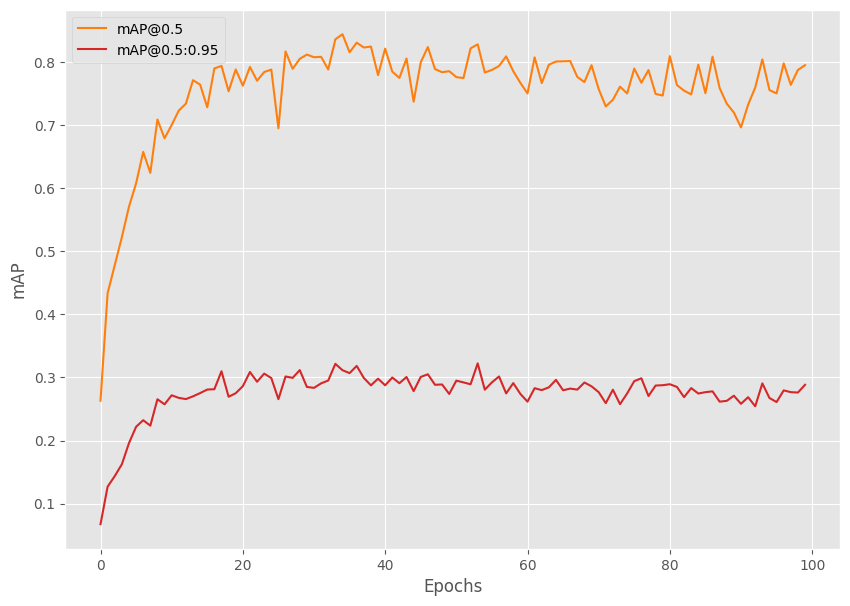

In [ ]:
from tqdm.auto import tqdm
from torchmetrics.detection.mean_ap import MeanAveragePrecision
from torch.optim.lr_scheduler import StepLR
import torch
import matplotlib.pyplot as plt
import time
import os

plt.style.use('ggplot')

seed = 42
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.cuda.manual_seed_all(seed)

# Function for running training iterations.
def train(train_data_loader, model):
    print('Training')
    model.train()

     # initialize tqdm progress bar
    prog_bar = tqdm(train_data_loader, total=len(train_data_loader))

    for i, data in enumerate(prog_bar):
        optimizer.zero_grad()
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]
        loss_dict = model(images, targets)

        losses = sum(loss for loss in loss_dict.values())
        loss_value = losses.item()

        train_loss_hist.send(loss_value)

        losses.backward()
        optimizer.step()

        # update the loss value beside the progress bar for each iteration
        prog_bar.set_description(desc=f"Loss: {loss_value:.4f}")
    return loss_value

# Function for running validation iterations.
def validate(valid_data_loader, model):
    print('Validating')
    model.eval()

    # Initialize tqdm progress bar.
    prog_bar = tqdm(valid_data_loader, total=len(valid_data_loader))
    target = []
    preds = []
    for i, data in enumerate(prog_bar):
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

        with torch.no_grad():
            outputs = model(images, targets)

        # For mAP calculation using Torchmetrics.
        #####################################
        for i in range(len(images)):
            true_dict = dict()
            preds_dict = dict()
            true_dict['boxes'] = targets[i]['boxes'].detach().cpu()
            true_dict['labels'] = targets[i]['labels'].detach().cpu()
            preds_dict['boxes'] = outputs[i]['boxes'].detach().cpu()
            preds_dict['scores'] = outputs[i]['scores'].detach().cpu()
            preds_dict['labels'] = outputs[i]['labels'].detach().cpu()
            preds.append(preds_dict)
            target.append(true_dict)
        #####################################

    metric.reset()
    metric.update(preds, target)
    metric_summary = metric.compute()
    return metric_summary

if __name__ == '__main__':
    os.makedirs('outputs', exist_ok=True)
    train_dataset = create_train_dataset(TRAIN_DIR)
    valid_dataset = create_valid_dataset(VALID_DIR)
    train_loader = create_train_loader(train_dataset, NUM_WORKERS)
    valid_loader = create_valid_loader(valid_dataset, NUM_WORKERS)
    print(f"Number of training samples: {len(train_dataset)}")
    print(f"Number of validation samples: {len(valid_dataset)}\n")

    # Initialize the model and move to the computation device.
    model = create_model(num_classes=NUM_CLASSES)
    model = model.to(DEVICE)
    # print(model)
    # Total parameters and trainable parameters.
    total_params = sum(p.numel() for p in model.parameters())
    print(f"{total_params:,} total parameters.")
    total_trainable_params = sum(
        p.numel() for p in model.parameters() if p.requires_grad)
    print(f"{total_trainable_params:,} training parameters.")
    params = [p for p in model.parameters() if p.requires_grad]
    optimizer = torch.optim.SGD(params, lr=0.001, momentum=0.9, weight_decay=0.0005, nesterov=True)
    scheduler = StepLR(
        optimizer=optimizer, step_size=15, gamma=0.1, verbose=True
    )

    # To monitor training loss
    train_loss_hist = Averager()
    # To store training loss and mAP values.
    train_loss_list = []
    map_50_list = []
    map_list = []

    # Mame to save the trained model with.
    MODEL_NAME = 'model'

    # Whether to show transformed images from data loader or not.
    # if VISUALIZE_TRANSFORMED_IMAGES:
    #     from custom_utils import show_tranformed_image
    #     show_tranformed_image(train_loader)

    # To save best model.
    save_best_model = SaveBestModel()

    metric = MeanAveragePrecision()

    # Training loop.
    for epoch in range(NUM_EPOCHS):
        print(f"\nEPOCH {epoch+1} of {NUM_EPOCHS}")

        # Reset the training loss histories for the current epoch.
        train_loss_hist.reset()

        # Start timer and carry out training and validation.
        start = time.time()
        train_loss = train(train_loader, model)
        metric_summary = validate(valid_loader, model)
        print(f"Epoch #{epoch+1} train loss: {train_loss_hist.value:.3f}")
        print(f"Epoch #{epoch+1} mAP: {metric_summary['map']}")
        end = time.time()
        print(f"Took {((end - start) / 60):.3f} minutes for epoch {epoch}")

        train_loss_list.append(train_loss)
        map_50_list.append(metric_summary['map_50'])
        map_list.append(metric_summary['map'])

        # save the best model till now.
        save_best_model(
            model, float(metric_summary['map_50']), epoch, 'outputs'
        )
        # Save the current epoch model.
        save_model(epoch, model, optimizer)

        # Save loss plot.
        save_loss_plot(OUT_DIR, train_loss_list)

        # Save mAP plot.
        save_mAP(OUT_DIR, map_50_list, map_list)
        # scheduler.step()

In [ ]:
import shutil

source_path = "/content/drive/MyDrive/SKRIPSI/Hasil/Model_2/best_model.pth"
destination_path = "/content/outputs/best_model2.pth"

shutil.copyfile(source_path, destination_path)

'/content/outputs/best_model2.pth'

In [ ]:
import torch
from tqdm.auto import tqdm
from tqdm import TqdmExperimentalWarning
from torchmetrics.detection.mean_ap import MeanAveragePrecision

# Evaluation function
def validate(valid_data_loader, model):
    model.eval()

    # Initialize tqdm progress bar.
    prog_bar = tqdm(valid_data_loader, total=len(valid_data_loader))
    target = []
    preds = []
    for i, data in enumerate(prog_bar):
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

        with torch.no_grad():
            outputs = model(images, targets)

        # For mAP calculation using Torchmetrics.
        #####################################
        for i in range(len(images)):
            true_dict = dict()
            preds_dict = dict()
            true_dict['boxes'] = targets[i]['boxes'].detach().cpu()
            true_dict['labels'] = targets[i]['labels'].detach().cpu()
            preds_dict['boxes'] = outputs[i]['boxes'].detach().cpu()
            preds_dict['scores'] = outputs[i]['scores'].detach().cpu()
            preds_dict['labels'] = outputs[i]['labels'].detach().cpu()
            preds.append(preds_dict)
            target.append(true_dict)
        #####################################

    metric = MeanAveragePrecision()
    metric.update(preds, target)
    metric_summary = metric.compute()
    return metric_summary

if __name__ == '__main__':
    # Load the best model and trained weights.
    model = create_model(num_classes=NUM_CLASSES)
    checkpoint = torch.load('/content/outputs/best_model2.pth', map_location=DEVICE)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.to(DEVICE).eval()

    test_dataset = create_test_dataset(
        '/content/PneumoniaDataset80-20/test'
    )
    test_loader = create_test_loader(test_dataset, num_workers=NUM_WORKERS)

    metric_summary = validate(test_loader, model)
    print(f"mAP_50: {metric_summary['map_50']*100:.3f}")
    print(f"mAP_50_95: {metric_summary['map']*100:.3f}")

  0%|          | 0/60 [00:00<?, ?it/s]

mAP_50: 84.382
mAP_50_95: 31.142


In [ ]:
def make_prediction(model, img, threshold):
    model.eval()
    preds = model(img)
    for id in range(len(preds)) :
        idx_list = []

        for idx, score in enumerate(preds[id]['scores']) :
            if score > threshold :
                idx_list.append(idx)

        preds[id]['boxes'] = preds[id]['boxes'][idx_list]
        preds[id]['labels'] = preds[id]['labels'][idx_list]
        preds[id]['scores'] = preds[id]['scores'][idx_list]

    return preds

def plot_image_from_output(img, annotation):

    img = img.cpu().permute(1,2,0)

    fig,ax = plt.subplots(1)
    ax.imshow(img)

    for idx in range(len(annotation["boxes"])):
        xmin, ymin, xmax, ymax = annotation["boxes"][idx]

        if annotation['labels'][idx] == 1 :
            rect = patches.Rectangle((xmin,ymin),(xmax-xmin),(ymax-ymin),linewidth=1,edgecolor='g',facecolor='none')
        else :
            rect = patches.Rectangle((xmin,ymin),(xmax-xmin),(ymax-ymin),linewidth=1,edgecolor='orange',facecolor='none')

        ax.add_patch(rect)

    plt.show()

In [ ]:
with torch.no_grad():
    print(len(test_loader))
    for imgs, annotations in test_loader:
        imgs = list(img.to(DEVICE) for img in imgs)

        pred = make_prediction(model, imgs, 0.5)
        break

60


({'boxes': tensor([[ 65.0391,  75.5859, 121.8750, 203.3203],
        [166.9922,  78.5156, 239.9414, 211.2305]]), 'labels': tensor([1, 1]), 'area': tensor([7259.9028, 9681.4443]), 'iscrowd': tensor([0, 0]), 'image_id': tensor([0])},)
Target :  tensor([1, 1])


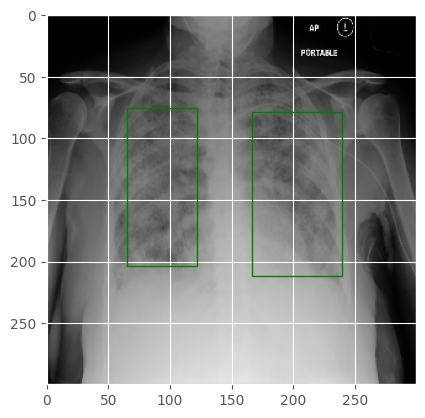

Prediction :  tensor([1, 1], device='cuda:0')
{'boxes': tensor([[ 65.0391,  75.5859, 121.8750, 203.3203],
        [166.9922,  78.5156, 239.9414, 211.2305]]), 'labels': tensor([1, 1]), 'area': tensor([7259.9028, 9681.4443]), 'iscrowd': tensor([0, 0]), 'image_id': tensor([0])}
{'boxes': tensor([[ 56.4169,  58.4750, 128.6629, 208.0304],
        [154.4691,  52.7041, 235.9232, 210.6403]], device='cuda:0'), 'scores': tensor([0.7953, 0.6943], device='cuda:0'), 'labels': tensor([1, 1], device='cuda:0')}


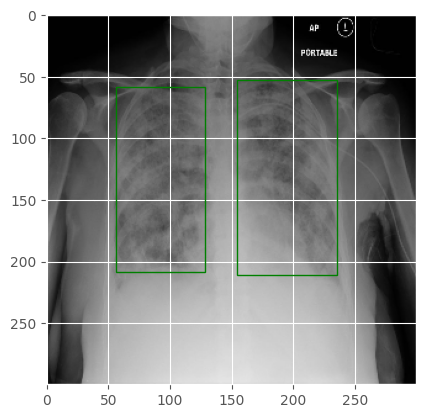

IoU: tensor([[0.6719, 0.0000],
        [0.0000, 0.6777]])


In [ ]:
from torchvision.ops import box_iou
import matplotlib.patches as patches

print(annotations)
_idx = 0
print("Target : ", annotations[_idx]['labels'])
plot_image_from_output(imgs[_idx], annotations[_idx])
print("Prediction : ", pred[_idx]['labels'])
print(annotations[_idx])
print(pred[_idx])

# Create a tensor on the CUDA device
for key in pred[_idx]:
    pred[_idx][key] = pred[_idx][key].cpu()

plot_image_from_output(imgs[_idx], pred[_idx])
iou = box_iou(pred[_idx]['boxes'],annotations[_idx]['boxes'])
print("IoU:", iou)

In [ ]:
from tqdm import tqdm

labels = []
preds_adj_all = []
annot_all = []

for im, annot in tqdm(test_loader, position = 0, leave = True):
    im = list(img.to(DEVICE) for img in im)
    #annot = [{k: v.to(device) for k, v in t.items()} for t in annot]

    for t in annot:
        labels += t['labels']

    with torch.no_grad():
        preds_adj = make_prediction(model, im, 0.5)
        preds_adj = [{k: v.to(torch.device('cpu')) for k, v in t.items()} for t in preds_adj]
        preds_adj_all.append(preds_adj)
        annot_all.append(annot)


100%|██████████| 60/60 [00:02<00:00, 26.48it/s]


In [ ]:
!git clone https://github.com/Pseudo-Lab/Tutorial-Book-Utils
!python Tutorial-Book-Utils/PL_data_loader.py --data FaceMaskDetection

Cloning into 'Tutorial-Book-Utils'...
remote: Enumerating objects: 45, done.
remote: Counting objects: 100% (45/45), done.
remote: Compressing objects: 100% (39/39), done.
remote: Total 45 (delta 18), reused 17 (delta 5), pack-reused 0
Receiving objects: 100% (45/45), 11.62 KiB | 5.81 MiB/s, done.
Resolving deltas: 100% (18/18), done.
Access denied with the following error:

 	Cannot retrieve the public link of the file. You may need to change
	the permission to 'Anyone with the link', or have had many accesses. 

You may still be able to access the file from the browser:

	 https://drive.google.com/uc?id=16Gzn1w38yZLJpzmzKcRIRveFeHZtCEr7 

Face Mask Detection.zip download complete!


In [ ]:
%cd Tutorial-Book-Utils/
import utils_ObjectDetection as utils

/content/Tutorial-Book-Utils


In [ ]:
sample_metrics = []
for batch_i in range(len(preds_adj_all)):
    sample_metrics += utils.get_batch_statistics(preds_adj_all[batch_i], annot_all[batch_i], iou_threshold=0.5)

true_positives, pred_scores, pred_labels = [torch.cat(x, 0) for x in list(zip(*sample_metrics))]  # batch semua disatukan
precision, recall, AP, f1, ap_class = utils.ap_per_class(true_positives, pred_scores, pred_labels, torch.tensor(labels))
mAP = torch.mean(AP)
print(f'mAP : {mAP}')
print(f'AP : {AP}')

mAP : 0.7730366518442875
AP : tensor([0.7730], dtype=torch.float64)


In [ ]:
sample_metrics = []
for batch_i in range(len(preds_adj_all)):
    sample_metrics += utils.get_batch_statistics(preds_adj_all[batch_i], annot_all[batch_i], iou_threshold=0.4)

true_positives, pred_scores, pred_labels = [torch.cat(x, 0) for x in list(zip(*sample_metrics))]  # batch semua disatukan
precision, recall, AP, f1, ap_class = utils.ap_per_class(true_positives, pred_scores, pred_labels, torch.tensor(labels))
mAP = torch.mean(AP)
print(f'mAP : {mAP}')
print(f'AP : {AP}')

mAP : 0.8184054964259388
AP : tensor([0.8184], dtype=torch.float64)


In [ ]:
sample_metrics = []
for batch_i in range(len(preds_adj_all)):
    sample_metrics += utils.get_batch_statistics(preds_adj_all[batch_i], annot_all[batch_i], iou_threshold=0.3)

true_positives, pred_scores, pred_labels = [torch.cat(x, 0) for x in list(zip(*sample_metrics))]  # batch semua disatukan
precision, recall, AP, f1, ap_class = utils.ap_per_class(true_positives, pred_scores, pred_labels, torch.tensor(labels))
mAP = torch.mean(AP)
print(f'mAP : {mAP}')
print(f'AP : {AP}')

mAP : 0.8378634069591442
AP : tensor([0.8379], dtype=torch.float64)


  0%|          | 0/60 [00:00<?, ?it/s]

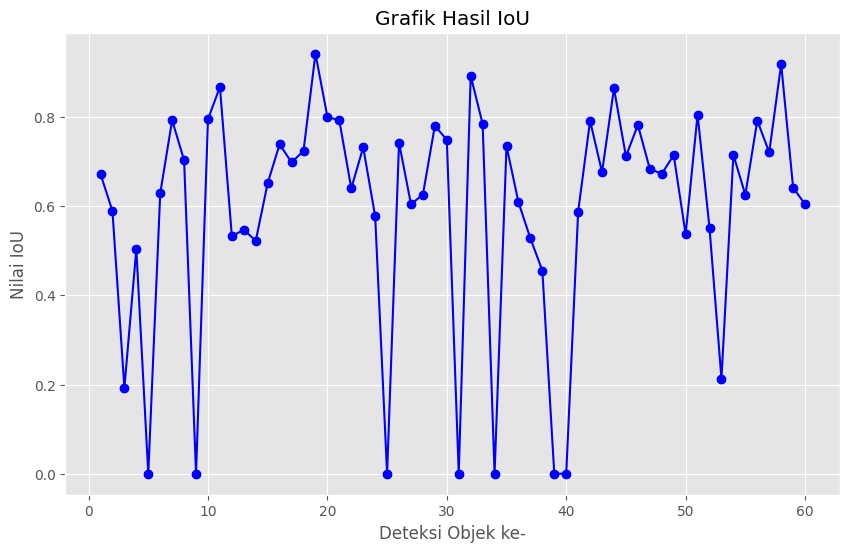

In [ ]:
import shutil
import torch
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
from torchvision.transforms.functional import to_pil_image
from torchvision.ops import box_iou

# Function to calculate Intersection over Union (IoU)
def calculate_iou(box1, box2):
    # Extract coordinates from the bounding box tensors
    box1 = [float(coord) for coord in box1]
    box2 = [float(coord) for coord in box2]

    # Calculate intersection area
    x1_int = max(box1[0], box2[0])
    y1_int = max(box1[1], box2[1])
    x2_int = min(box1[2], box2[2])
    y2_int = min(box1[3], box2[3])

    intersection = max(0, x2_int - x1_int) * max(0, y2_int - y1_int)

    # Calculate union area
    area1 = (box1[2] - box1[0]) * (box1[3] - box1[1])
    area2 = (box2[2] - box2[0]) * (box2[3] - box2[1])
    union = area1 + area2 - intersection

    # Calculate IoU
    iou = intersection / union if union > 0 else 0.0
    return iou

source_path = "/content/drive/MyDrive/SKRIPSI/Hasil/Model_2/best_model.pth"
destination_path = "/content/outputs/best_model.pth"

shutil.copyfile(source_path, destination_path)

def show_iou_graph(images, true_boxes, pred_boxes, threshold=0.5, save_path="iou_graph_model2.png"):
    all_ious = []

    for i in range(len(images)):
        true_boxes_i = true_boxes[i]
        pred_boxes_i = pred_boxes[i]

        ious = []  # To store IoU values for the current image

        for pred_box, score, label in zip(pred_boxes_i['boxes'], pred_boxes_i['scores'], pred_boxes_i['labels']):
            pred_box = [float(b) for b in pred_box]
            if score > threshold:
                # Find the corresponding true bounding box for the label
                true_box = true_boxes_i['boxes'][true_boxes_i['labels'] == label].cpu()
                if len(true_box) > 0:
                    true_box = [float(b) for b in true_box[0]]
                    iou = calculate_iou(pred_box, true_box)
                    ious.append(iou)

        # Store IoU values for the current image
        all_ious.append(ious)

    # Create IoU scatter plot
    plt.figure(figsize=(10, 6))
    plt.scatter(range(1, len(all_ious) + 1), [max(i, default=0) for i in all_ious], color='blue')
    plt.plot(range(1, len(all_ious) + 1), [max(i, default=0) for i in all_ious], linestyle='-', marker='o', color='blue')
    plt.title('Grafik Hasil IoU')
    plt.xlabel('Deteksi Objek ke-')
    plt.ylabel('Nilai IoU')
    plt.savefig(save_path)
    plt.show()

# Update the validate function to return images along with predictions
def validate(valid_data_loader, model):
    model.eval()

    # Initialize tqdm progress bar.
    prog_bar = tqdm(valid_data_loader, total=len(valid_data_loader))
    target = []
    preds = []
    images_list = []

    for i, data in enumerate(prog_bar):
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

        with torch.no_grad():
            outputs = model(images, targets)

        # For mAP calculation using Torchmetrics.
        for i in range(len(images)):
            true_dict = dict()
            preds_dict = dict()
            true_dict['boxes'] = targets[i]['boxes'].detach().cpu()
            true_dict['labels'] = targets[i]['labels'].detach().cpu()
            preds_dict['boxes'] = outputs[i]['boxes'].detach().cpu()
            preds_dict['scores'] = outputs[i]['scores'].detach().cpu()
            preds_dict['labels'] = outputs[i]['labels'].detach().cpu()
            preds.append(preds_dict)
            target.append(true_dict)
            images_list.append(images[i])

    return images_list, preds, target

if __name__ == '__main__':
    model = create_model(num_classes=NUM_CLASSES)
    checkpoint = torch.load('outputs/best_model.pth', map_location=DEVICE)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.to(DEVICE).eval()

    test_dataset = create_test_dataset('/content/PneumoniaDataset80-20/test')
    test_loader = create_test_loader(test_dataset, num_workers=NUM_WORKERS)

    # After calculating metrics, you can display the IoU graph
    images, pred_boxes, true_boxes = validate(test_loader, model)
    # class_names = ['_Background', 'Pneumonia']
    show_iou_graph(images, true_boxes, pred_boxes, save_path='iou_graph_model2.png')

  0%|          | 0/60 [00:00<?, ?it/s]

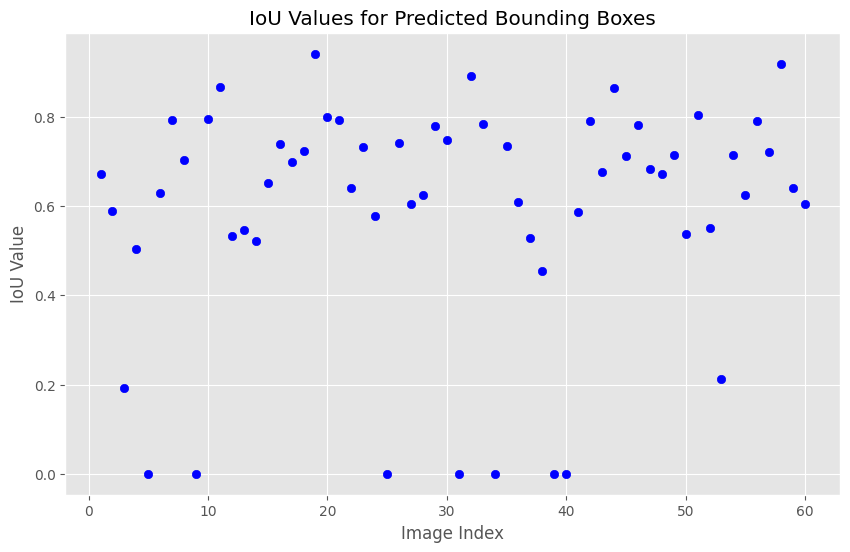

In [ ]:
import shutil
import torch
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
from torchvision.transforms.functional import to_pil_image
from torchvision.ops import box_iou

# Function to calculate Intersection over Union (IoU)
def calculate_iou(box1, box2):
    # Extract coordinates from the bounding box tensors
    box1 = [float(coord) for coord in box1]
    box2 = [float(coord) for coord in box2]

    # Calculate intersection area
    x1_int = max(box1[0], box2[0])
    y1_int = max(box1[1], box2[1])
    x2_int = min(box1[2], box2[2])
    y2_int = min(box1[3], box2[3])

    intersection = max(0, x2_int - x1_int) * max(0, y2_int - y1_int)

    # Calculate union area
    area1 = (box1[2] - box1[0]) * (box1[3] - box1[1])
    area2 = (box2[2] - box2[0]) * (box2[3] - box2[1])
    union = area1 + area2 - intersection

    # Calculate IoU
    iou = intersection / union if union > 0 else 0.0
    return iou

source_path = "/content/drive/MyDrive/SKRIPSI/Hasil/Model_2/best_model.pth"
destination_path = "/content/outputs/best_model.pth"

shutil.copyfile(source_path, destination_path)

def show_iou_graph(images, true_boxes, pred_boxes, threshold=0.5, save_path="iou_graph_model2.png"):
    all_ious = []

    for i in range(len(images)):
        true_boxes_i = true_boxes[i]
        pred_boxes_i = pred_boxes[i]

        ious = []  # To store IoU values for the current image

        for pred_box, score, label in zip(pred_boxes_i['boxes'], pred_boxes_i['scores'], pred_boxes_i['labels']):
            pred_box = [float(b) for b in pred_box]
            if score > threshold:
                # Find the corresponding true bounding box for the label
                true_box = true_boxes_i['boxes'][true_boxes_i['labels'] == label].cpu()
                if len(true_box) > 0:
                    true_box = [float(b) for b in true_box[0]]
                    iou = calculate_iou(pred_box, true_box)
                    ious.append(iou)

        # Store IoU values for the current image
        all_ious.append(ious)

    # Create IoU scatter plot
    plt.figure(figsize=(10, 6))
    plt.scatter(range(1, len(all_ious) + 1), [max(i, default=0) for i in all_ious], color='blue')
    plt.title('IoU Values for Predicted Bounding Boxes')
    plt.xlabel('Image Index')
    plt.ylabel('IoU Value')
    plt.savefig(save_path)
    plt.show()

# Update the validate function to return images along with predictions
def validate(valid_data_loader, model):
    model.eval()

    # Initialize tqdm progress bar.
    prog_bar = tqdm(valid_data_loader, total=len(valid_data_loader))
    target = []
    preds = []
    images_list = []

    for i, data in enumerate(prog_bar):
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

        with torch.no_grad():
            outputs = model(images, targets)

        # For mAP calculation using Torchmetrics.
        for i in range(len(images)):
            true_dict = dict()
            preds_dict = dict()
            true_dict['boxes'] = targets[i]['boxes'].detach().cpu()
            true_dict['labels'] = targets[i]['labels'].detach().cpu()
            preds_dict['boxes'] = outputs[i]['boxes'].detach().cpu()
            preds_dict['scores'] = outputs[i]['scores'].detach().cpu()
            preds_dict['labels'] = outputs[i]['labels'].detach().cpu()
            preds.append(preds_dict)
            target.append(true_dict)
            images_list.append(images[i])

    return images_list, preds, target

if __name__ == '__main__':
    model = create_model(num_classes=NUM_CLASSES)
    checkpoint = torch.load('outputs/best_model.pth', map_location=DEVICE)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.to(DEVICE).eval()

    test_dataset = create_test_dataset('/content/PneumoniaDataset80-20/test')
    test_loader = create_test_loader(test_dataset, num_workers=NUM_WORKERS)

    # After calculating metrics, you can display the IoU graph
    images, pred_boxes, true_boxes = validate(test_loader, model)
    # class_names = ['_Background', 'Pneumonia']
    show_iou_graph(images, true_boxes, pred_boxes, save_path='iou_graph_model2.png')

In [ ]:
import numpy as np
import cv2
import torch
import glob as glob
import os
import time
import argparse
import csv

os.makedirs('inference_outputs/images', exist_ok=True)

COLORS = np.random.uniform(0, 255, size=(len(CLASSES), 3))

# Load the best model and trained weights.
model = create_model(num_classes=NUM_CLASSES)
checkpoint = torch.load('/content/outputs/best_model2.pth', map_location=DEVICE)
model.load_state_dict(checkpoint['model_state_dict'])
model.to(DEVICE).eval()

# Directory where all the images are present.
DIR_TEST = '/content/PneumoniaDataset80-20/test'
test_images = glob.glob(f"{DIR_TEST}/*.jpg")
print(f"Test instances: {len(test_images)}")

frame_count = 0 # To count total frames.
total_fps = 0 # To get the final frames per second.
lung_opacity_files = []

for i in range(len(test_images)):
    # Get the image file name for saving output later on.
    image_name = test_images[i].split(os.path.sep)[-1].split('.')[0]
    image = cv2.imread(test_images[i])
    orig_image = image.copy()
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
    image /= 255.0
    image_input = np.transpose(image, (2, 0, 1)).astype(np.float32)
    image_input = torch.tensor(image_input, dtype=torch.float).cuda()
    image_input = torch.unsqueeze(image_input, 0)
    start_time = time.time()
    # Predictions
    with torch.no_grad():
        outputs = model(image_input.to(DEVICE))
    end_time = time.time()

    # Get the current fps.
    fps = 1 / (end_time - start_time)
    total_fps += fps
    frame_count += 1

    # Load all detection to CPU for further operations.
    outputs = [{k: v.to('cpu') for k, v in t.items()} for t in outputs]
    if len(outputs[0]['boxes']) != 0:
        boxes = outputs[0]['boxes'].data.numpy()
        scores = outputs[0]['scores'].data.numpy()
        boxes = boxes[scores >= 0.6].astype(np.int32)
        draw_boxes = boxes.copy()
        # Get all the predicited class names.
        pred_classes = [CLASSES[i] for i in outputs[0]['labels'].cpu().numpy()]
        # Draw the bounding boxes and write the class name on top of it.
        for j, box in enumerate(draw_boxes):
            print(image_name)
            class_name = pred_classes[j]
            color = COLORS[CLASSES.index(class_name)]
            # Recale boxes.
            xmin = int((box[0] / image.shape[1]) * orig_image.shape[1])
            ymin = int((box[1] / image.shape[0]) * orig_image.shape[0])
            xmax = int((box[2] / image.shape[1]) * orig_image.shape[1])
            ymax = int((box[3] / image.shape[0]) * orig_image.shape[0])
            cv2.rectangle(orig_image,
                        (xmin, ymin),
                        (xmax, ymax),
                        color[::-1],
                        3)
            cv2.putText(orig_image,
                        class_name,
                        (xmin, ymin-5),
                        cv2.FONT_HERSHEY_SIMPLEX,
                        0.8,
                        color[::-1],
                        2,
                        lineType=cv2.LINE_AA)
        plt.imshow(cv2.cvtColor(orig_image, cv2.COLOR_BGR2RGB))
        plt.show()

        # Simpan gambar ke direktori
        # cv2.imwrite(f"inference_outputs/images/{image_name}.jpg", orig_image)
    print(f"Image {i+1} done...")
    print('-'*50)

print('TEST PREDICTIONS COMPLETE')
avg_fps = total_fps / frame_count
print(f"Average FPS: {avg_fps:.3f}")

Output hidden; open in https://colab.research.google.com to view.

# MODEL 3 | BATCH : 2 | LR : 0.0001 | 80:20

In [ ]:
import zipfile
import os

zip_file_path = '/content/drive/MyDrive/SKRIPSI/Dataset/PneumoniaDataset80-20.zip'  # Ganti dengan path ke file ZIP Anda
unzip_dir = '/content'  # Ganti dengan direktori di mana Anda ingin mengekstrak file

def extract_zip(zip_file, extract_dir):
    with zipfile.ZipFile(zip_file, 'r') as zip_ref:
        zip_ref.extractall(extract_dir)

def list_files(directory):
    return os.listdir(directory)

# Ekstrak file ZIP
extract_zip(zip_file_path, unzip_dir)

# Tampilkan daftar file yang diekstrak
extracted_files = list_files(unzip_dir)
print(extracted_files)

['.config', 'drive', '__MACOSX', 'PneumoniaDataset80-20', 'sample_data']


In [ ]:
import torch
import os


DEVICE = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

BATCH_SIZE = 2 # Increase / decrease according to GPU memeory.
RESIZE_TO = 300 # Resize the image for training and transforms.
NUM_EPOCHS = 100 # Number of epochs to train for.
NUM_WORKERS = 2 # Number of parallel workers for data loading.

CLASSES = [
    '_background','Lung Opacity'
    # 'helmet','head','person'
]



TRAIN_DIR = '/content/PneumoniaDataset80-20/train'
VALID_DIR = '/content/PneumoniaDataset80-20/test'

# Classes: 0 index is reserved for background.


NUM_CLASSES = len(CLASSES)

# Whether to visualize images after crearing the data loaders.
VISUALIZE_TRANSFORMED_IMAGES = False

# Location to save model and plots.
OUT_DIR = 'outputs'
os.makedirs(OUT_DIR, exist_ok=True)

In [ ]:
import albumentations as A
import cv2
import numpy as np
import torch
import matplotlib.pyplot as plt

from albumentations.pytorch import ToTensorV2


plt.style.use('ggplot')

# This class keeps track of the training and validation loss values
# and helps to get the average for each epoch as well.
class Averager:
    def __init__(self):
        self.current_total = 0.0
        self.iterations = 0.0

    def send(self, value):
        self.current_total += value
        self.iterations += 1

    @property
    def value(self):
        if self.iterations == 0:
            return 0
        else:
            return 1.0 * self.current_total / self.iterations

    def reset(self):
        self.current_total = 0.0
        self.iterations = 0.0

class SaveBestModel:
    """
    Class to save the best model while training. If the current epoch's
    validation mAP @0.5:0.95 IoU higher than the previous highest, then save the
    model state.
    """
    def __init__(
        self, best_valid_map=float(0)
    ):
        self.best_valid_map = best_valid_map

    def __call__(
        self,
        model,
        current_valid_map,
        epoch,
        OUT_DIR,
    ):
        if current_valid_map > self.best_valid_map:
            self.best_valid_map = current_valid_map
            print(f"\nBEST VALIDATION mAP: {self.best_valid_map}")
            print(f"\nSAVING BEST MODEL FOR EPOCH: {epoch+1}\n")
            torch.save({
                'epoch': epoch+1,
                'model_state_dict': model.state_dict(),
                }, f"{OUT_DIR}/best_model.pth")

def collate_fn(batch):
    """
    To handle the data loading as different images may have different number
    of objects and to handle varying size tensors as well.
    """
    return tuple(zip(*batch))

# Define the training tranforms.
def get_train_transform():
    return A.Compose([
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.Rotate(limit=6),
        A.Blur(blur_limit=3, p=0.1),
        A.MotionBlur(blur_limit=3, p=0.1),
        A.MedianBlur(blur_limit=3, p=0.1),
        A.RandomBrightnessContrast(p=0.2),
        ToTensorV2(p=1.0),
    ], bbox_params={
        'format': 'pascal_voc',
        'label_fields': ['labels']
    })


# Define the validation transforms.
def get_valid_transform():
    return A.Compose([
        ToTensorV2(p=1.0),
    ], bbox_params={
        'format': 'pascal_voc',
        'label_fields': ['labels']
    })


def show_tranformed_image(train_loader):
    """
    This function shows the transformed images from the `train_loader`.
    Helps to check whether the tranformed images along with the corresponding
    labels are correct or not.
    Only runs if `VISUALIZE_TRANSFORMED_IMAGES = True` in config.py.
    """
    if len(train_loader) > 0:
        for i in range(1):
            images, targets = next(iter(train_loader))
            images = list(image.to(DEVICE) for image in images)
            targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]
            boxes = targets[i]['boxes'].cpu().numpy().astype(np.int32)
            labels = targets[i]['labels'].cpu().numpy().astype(np.int32)
            sample = images[i].permute(1, 2, 0).cpu().numpy()
            sample = cv2.cvtColor(sample, cv2.COLOR_RGB2BGR)
            for box_num, box in enumerate(boxes):
                cv2.rectangle(sample,
                            (box[0], box[1]),
                            (box[2], box[3]),
                            (0, 0, 255), 2)
                cv2.putText(sample, CLASSES[labels[box_num]],
                            (box[0], box[1]-10), cv2.FONT_HERSHEY_SIMPLEX,
                            1.0, (0, 0, 255), 2)
            cv2.imshow('Transformed image', sample)
            cv2.waitKey(0)
            cv2.destroyAllWindows()

def save_model(epoch, model, optimizer):
    """
    Function to save the trained model till current epoch, or whenver called
    """
    torch.save({
                'epoch': epoch+1,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                }, 'outputs/last_model.pth')

def save_loss_plot(
    OUT_DIR,
    train_loss_list,
    x_label='iterations',
    y_label='train loss',
    save_name='train_loss'
):
    """
    Function to save both train loss graph.

    :param OUT_DIR: Path to save the graphs.
    :param train_loss_list: List containing the training loss values.
    """
    figure_1 = plt.figure(figsize=(10, 7), num=1, clear=True)
    train_ax = figure_1.add_subplot()
    train_ax.plot(train_loss_list, color='tab:blue')
    train_ax.set_xlabel(x_label)
    train_ax.set_ylabel(y_label)
    figure_1.savefig(f"{OUT_DIR}/{save_name}.png")
    print('SAVING PLOTS COMPLETE...')

def save_mAP(OUT_DIR, map_05, map):
    """
    Saves the mAP@0.5 and mAP@0.5:0.95 per epoch.
    :param OUT_DIR: Path to save the graphs.
    :param map_05: List containing mAP values at 0.5 IoU.
    :param map: List containing mAP values at 0.5:0.95 IoU.
    """
    figure = plt.figure(figsize=(10, 7), num=1, clear=True)
    ax = figure.add_subplot()
    ax.plot(
        map_05, color='tab:orange', linestyle='-',
        label='mAP@0.5'
    )
    ax.plot(
        map, color='tab:red', linestyle='-',
        label='mAP@0.5:0.95'
    )
    ax.set_xlabel('Epochs')
    ax.set_ylabel('mAP')
    ax.legend()
    figure.savefig(f"{OUT_DIR}/map.png")

In [ ]:
import torch
import cv2
import numpy as np
import os
import glob as glob
from google.colab.patches import cv2_imshow
from xml.etree import ElementTree as et
from torch.utils.data import Dataset, DataLoader

# The dataset class.
class PneumoniaDataset(Dataset):
    def __init__(self, dir_path, width, height, classes, transforms=None):
        self.transforms = transforms
        self.dir_path = dir_path
        self.height = height
        self.width = width
        self.classes = classes
        self.image_file_types = ['*.jpg', '*.jpeg', '*.png', '*.ppm', '*.JPG']
        self.all_image_paths = []

        # Get all the image paths in sorted order.
        for file_type in self.image_file_types:
            self.all_image_paths.extend(glob.glob(os.path.join(self.dir_path, file_type)))
        self.all_images = [image_path.split(os.path.sep)[-1] for image_path in self.all_image_paths]
        self.all_images = sorted(self.all_images)

    def __getitem__(self, idx):
        # Capture the image name and the full image path.
        image_name = self.all_images[idx]
        image_path = os.path.join(self.dir_path, image_name)

        # Read and preprocess the image.
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
        image_resized = cv2.resize(image, (self.width, self.height))
        image_resized /= 255.0

        # Capture the corresponding XML file for getting the annotations.
        annot_filename = os.path.splitext(image_name)[0] + '.xml'
        annot_file_path = os.path.join(self.dir_path, annot_filename)

        boxes = []
        labels = []
        tree = et.parse(annot_file_path)
        root = tree.getroot()

        # Original image width and height.
        image_width = image.shape[1]
        image_height = image.shape[0]

        # Box coordinates for xml files are extracted
        # and corrected for image size given.
        for member in root.findall('object'):
            # Get label and map the `classes`.
            labels.append(self.classes.index(member.find('name').text))

            # Left corner x-coordinates.
            xmin = int(member.find('bndbox').find('xmin').text)
            # Right corner x-coordinates.
            xmax = int(member.find('bndbox').find('xmax').text)
            # Left corner y-coordinates.
            ymin = int(member.find('bndbox').find('ymin').text)
            # Right corner y-coordinates.
            ymax = int(member.find('bndbox').find('ymax').text)

            # Resize the bounding boxes according
            # to resized image `width`, `height`.
            xmin_final = (xmin/image_width)*self.width
            xmax_final = (xmax/image_width)*self.width
            ymin_final = (ymin/image_height)*self.height
            ymax_final = (ymax/image_height)*self.height

            # Check that max coordinates are at least one pixel
            # larger than min coordinates.
            if xmax_final == xmin_final:
                xmax_final += 1
            if ymax_final == ymin_final:
                ymax_final += 1
            # Check that all coordinates are within the image.
            if xmax_final > self.width:
                xmax_final = self.width
            if ymax_final > self.height:
                ymax_final = self.height

            boxes.append([xmin_final, ymin_final, xmax_final, ymax_final])

        # Bounding box to tensor.
        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        # Area of the bounding boxes.
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0]) if len(boxes) > 0 \
            else torch.as_tensor(boxes, dtype=torch.float32)
        # No crowd instances.
        iscrowd = torch.zeros((boxes.shape[0],), dtype=torch.int64)
        # Labels to tensor.
        labels = torch.as_tensor(labels, dtype=torch.int64)

        # Prepare the final `target` dictionary.
        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["area"] = area
        target["iscrowd"] = iscrowd
        image_id = torch.tensor([idx])
        target["image_id"] = image_id

        # Apply the image transforms.
        if self.transforms:
            sample = self.transforms(image = image_resized,
                                     bboxes = target['boxes'],
                                     labels = labels)
            image_resized = sample['image']
            target['boxes'] = torch.Tensor(sample['bboxes'])

        if np.isnan((target['boxes']).numpy()).any() or target['boxes'].shape == torch.Size([0]):
            target['boxes'] = torch.zeros((0, 4), dtype=torch.int64)
        return image_resized, target

    def __len__(self):
        return len(self.all_images)
        # return 500;

# Prepare the final datasets and data loaders.
def create_train_dataset(DIR):
    train_dataset = PneumoniaDataset(
        DIR, RESIZE_TO, RESIZE_TO, CLASSES, get_train_transform()
    )
    return train_dataset
def create_valid_dataset(DIR):
    valid_dataset = PneumoniaDataset(
        DIR, RESIZE_TO, RESIZE_TO, CLASSES, get_valid_transform()
    )
    return valid_dataset
def create_test_dataset(DIR):
    test_dataset = PneumoniaDataset(
        DIR, RESIZE_TO, RESIZE_TO, CLASSES, get_valid_transform()
    )
    return test_dataset
def create_train_loader(train_dataset, num_workers=0):
    train_loader = DataLoader(
        train_dataset,
        batch_size=BATCH_SIZE,
        shuffle=True,
        num_workers=num_workers,
        collate_fn=collate_fn,
        drop_last=True
    )
    return train_loader
def create_valid_loader(valid_dataset, num_workers=0):
    valid_loader = DataLoader(
        valid_dataset,
        batch_size=BATCH_SIZE,
        shuffle=False,
        num_workers=num_workers,
        collate_fn=collate_fn,
        drop_last=True
    )
    return valid_loader
def create_test_loader(test_dataset, num_workers=0):
    test_loader = DataLoader(
        test_dataset,
        batch_size=1,
        shuffle=False,
        num_workers=num_workers,
        collate_fn=collate_fn,
        drop_last=True
    )
    return test_loader


In [ ]:
import torchvision
import torch

from functools import partial
from torchvision.models.detection import RetinaNet
from torchvision.models.detection.backbone_utils import resnet_fpn_backbone
from torchvision.models.detection.retinanet import RetinaNetClassificationHead
from torchvision.models.detection import RetinaNet_ResNet50_FPN_V2_Weights
from torchvision.models.detection.retinanet import RetinaNetClassificationHead

def create_model(num_classes):
    model = torchvision.models.detection.retinanet_resnet50_fpn_v2(
        weights=RetinaNet_ResNet50_FPN_V2_Weights.COCO_V1
    )
    num_anchors = model.head.classification_head.num_anchors

    model.head.classification_head = RetinaNetClassificationHead(
        in_channels=256,
        num_anchors=num_anchors,
        num_classes=num_classes,
        norm_layer=partial(torch.nn.GroupNorm, 32)
    )
    return model

if __name__ == '__main__':
    model = create_model(2)
    # print(model)
    # Total parameters and trainable parameters.
    total_params = sum(p.numel() for p in model.parameters())
    print(f"{total_params:,} total parameters.")
    total_trainable_params = sum(
        p.numel() for p in model.parameters() if p.requires_grad)
    print(f"{total_trainable_params:,} training parameters.")

Downloading: "https://download.pytorch.org/models/retinanet_resnet50_fpn_v2_coco-5905b1c5.pth" to /root/.cache/torch/hub/checkpoints/retinanet_resnet50_fpn_v2_coco-5905b1c5.pth
100%|██████████| 146M/146M [00:01<00:00, 152MB/s]


36,352,630 total parameters.
36,127,286 training parameters.


In [ ]:
!pip install torchmetrics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 840.2/840.2 kB 5.5 MB/s eta 0:00:00


Number of training samples: 240
Number of validation samples: 60

36,352,630 total parameters.
36,127,286 training parameters.
Adjusting learning rate of group 0 to 1.0000e-04.

EPOCH 1 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torchmetrics/utilities/prints.py:43: UserWarning: Encountered more than 100 detections in a single image. This means that certain detections with the lowest scores will be ignored, that may have an undesirable impact on performance. Please consider adjusting the `max_detection_threshold` to suit your use case. To disable this warning, set attribute class `warn_on_many_detections=False`, after initializing the metric.
  warnings.warn(*args, **kwargs)  # noqa: B028


Epoch #1 train loss: 1.258
Epoch #1 mAP: 0.019695913419127464
Took 0.423 minutes for epoch 0

BEST VALIDATION mAP: 0.09471908211708069

SAVING BEST MODEL FOR EPOCH: 1

SAVING PLOTS COMPLETE...

EPOCH 2 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #2 train loss: 0.912
Epoch #2 mAP: 0.0341414250433445
Took 0.183 minutes for epoch 1

BEST VALIDATION mAP: 0.148552805185318

SAVING BEST MODEL FOR EPOCH: 2

SAVING PLOTS COMPLETE...

EPOCH 3 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #3 train loss: 0.851
Epoch #3 mAP: 0.04441008344292641
Took 0.182 minutes for epoch 2

BEST VALIDATION mAP: 0.18553675711154938

SAVING BEST MODEL FOR EPOCH: 3

SAVING PLOTS COMPLETE...

EPOCH 4 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7c8e561b7ac0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
Exception ignored in:     <function _MultiProcessingDataLoaderIter.__del__ at 0x7c8e561b7ac0>if w.is_alive():
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    
self._shutdown_workers()  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive

  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
        assert self._parent_pid == os.getpid(), 'can only test a child process'if w.is_alive():

  File "/usr/lib/python3.10/multiprocessing/process.py", line 1

Epoch #4 train loss: 0.826
Epoch #4 mAP: 0.051193952560424805
Took 0.185 minutes for epoch 3

BEST VALIDATION mAP: 0.21740442514419556

SAVING BEST MODEL FOR EPOCH: 4

SAVING PLOTS COMPLETE...

EPOCH 5 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #5 train loss: 0.808
Epoch #5 mAP: 0.059344273060560226
Took 1.351 minutes for epoch 4

BEST VALIDATION mAP: 0.23137906193733215

SAVING BEST MODEL FOR EPOCH: 5

SAVING PLOTS COMPLETE...

EPOCH 6 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7c8e561b7ac0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7c8e561b7ac0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #6 train loss: 0.796
Epoch #6 mAP: 0.06728658080101013
Took 0.184 minutes for epoch 5

BEST VALIDATION mAP: 0.26478448510169983

SAVING BEST MODEL FOR EPOCH: 6

SAVING PLOTS COMPLETE...

EPOCH 7 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #7 train loss: 0.772
Epoch #7 mAP: 0.07742393761873245
Took 0.348 minutes for epoch 6

BEST VALIDATION mAP: 0.3124034106731415

SAVING BEST MODEL FOR EPOCH: 7

SAVING PLOTS COMPLETE...

EPOCH 8 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #8 train loss: 0.763
Epoch #8 mAP: 0.10454055666923523
Took 0.347 minutes for epoch 7

BEST VALIDATION mAP: 0.3816194236278534

SAVING BEST MODEL FOR EPOCH: 8

SAVING PLOTS COMPLETE...

EPOCH 9 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #9 train loss: 0.754
Epoch #9 mAP: 0.0980542004108429
Took 1.021 minutes for epoch 8
SAVING PLOTS COMPLETE...

EPOCH 10 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #10 train loss: 0.751
Epoch #10 mAP: 0.11336472630500793
Took 0.350 minutes for epoch 9

BEST VALIDATION mAP: 0.39894920587539673

SAVING BEST MODEL FOR EPOCH: 10

SAVING PLOTS COMPLETE...

EPOCH 11 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #11 train loss: 0.737
Epoch #11 mAP: 0.1210157573223114
Took 0.349 minutes for epoch 10

BEST VALIDATION mAP: 0.42064887285232544

SAVING BEST MODEL FOR EPOCH: 11

SAVING PLOTS COMPLETE...

EPOCH 12 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #12 train loss: 0.730
Epoch #12 mAP: 0.14341111481189728
Took 0.349 minutes for epoch 11

BEST VALIDATION mAP: 0.48500925302505493

SAVING BEST MODEL FOR EPOCH: 12

SAVING PLOTS COMPLETE...

EPOCH 13 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #13 train loss: 0.722
Epoch #13 mAP: 0.14400805532932281
Took 0.351 minutes for epoch 12
SAVING PLOTS COMPLETE...

EPOCH 14 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #14 train loss: 0.711
Epoch #14 mAP: 0.14619910717010498
Took 1.187 minutes for epoch 13
SAVING PLOTS COMPLETE...

EPOCH 15 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #15 train loss: 0.708
Epoch #15 mAP: 0.14660410583019257
Took 0.350 minutes for epoch 14

BEST VALIDATION mAP: 0.494804322719574

SAVING BEST MODEL FOR EPOCH: 15

SAVING PLOTS COMPLETE...

EPOCH 16 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #16 train loss: 0.713
Epoch #16 mAP: 0.15129025280475616
Took 0.181 minutes for epoch 15

BEST VALIDATION mAP: 0.5089568495750427

SAVING BEST MODEL FOR EPOCH: 16

SAVING PLOTS COMPLETE...

EPOCH 17 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #17 train loss: 0.697
Epoch #17 mAP: 0.16473624110221863
Took 0.347 minutes for epoch 16

BEST VALIDATION mAP: 0.5396507978439331

SAVING BEST MODEL FOR EPOCH: 17

SAVING PLOTS COMPLETE...

EPOCH 18 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #18 train loss: 0.693
Epoch #18 mAP: 0.17317640781402588
Took 0.185 minutes for epoch 17

BEST VALIDATION mAP: 0.5560111999511719

SAVING BEST MODEL FOR EPOCH: 18

SAVING PLOTS COMPLETE...

EPOCH 19 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #19 train loss: 0.692
Epoch #19 mAP: 0.17725111544132233
Took 1.523 minutes for epoch 18

BEST VALIDATION mAP: 0.5727289319038391

SAVING BEST MODEL FOR EPOCH: 19

SAVING PLOTS COMPLETE...

EPOCH 20 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #20 train loss: 0.685
Epoch #20 mAP: 0.184523805975914
Took 0.350 minutes for epoch 19

BEST VALIDATION mAP: 0.5871014595031738

SAVING BEST MODEL FOR EPOCH: 20

SAVING PLOTS COMPLETE...

EPOCH 21 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #21 train loss: 0.680
Epoch #21 mAP: 0.16555584967136383
Took 0.348 minutes for epoch 20
SAVING PLOTS COMPLETE...

EPOCH 22 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #22 train loss: 0.672
Epoch #22 mAP: 0.18790745735168457
Took 0.183 minutes for epoch 21
SAVING PLOTS COMPLETE...

EPOCH 23 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #23 train loss: 0.673
Epoch #23 mAP: 0.18342524766921997
Took 0.351 minutes for epoch 22

BEST VALIDATION mAP: 0.5973916053771973

SAVING BEST MODEL FOR EPOCH: 23

SAVING PLOTS COMPLETE...

EPOCH 24 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #24 train loss: 0.670
Epoch #24 mAP: 0.1714295744895935
Took 1.355 minutes for epoch 23
SAVING PLOTS COMPLETE...

EPOCH 25 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #25 train loss: 0.656
Epoch #25 mAP: 0.17589153349399567
Took 0.348 minutes for epoch 24
SAVING PLOTS COMPLETE...

EPOCH 26 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #26 train loss: 0.665
Epoch #26 mAP: 0.1650705188512802
Took 0.350 minutes for epoch 25
SAVING PLOTS COMPLETE...

EPOCH 27 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #27 train loss: 0.659
Epoch #27 mAP: 0.1923360973596573
Took 0.351 minutes for epoch 26
SAVING PLOTS COMPLETE...

EPOCH 28 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #28 train loss: 0.654
Epoch #28 mAP: 0.19140279293060303
Took 0.350 minutes for epoch 27
SAVING PLOTS COMPLETE...

EPOCH 29 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #29 train loss: 0.649
Epoch #29 mAP: 0.19676658511161804
Took 0.181 minutes for epoch 28

BEST VALIDATION mAP: 0.6147795915603638

SAVING BEST MODEL FOR EPOCH: 29

SAVING PLOTS COMPLETE...

EPOCH 30 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7c8e561b7ac0>Exception ignored in: 
<function _MultiProcessingDataLoaderIter.__del__ at 0x7c8e561b7ac0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()    
self._shutdown_workers()  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers

      File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
if w.is_alive():    
if w.is_alive():  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive

      File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
assert self._parent_pid == os.getpid(), 'can only test a

Epoch #30 train loss: 0.648
Epoch #30 mAP: 0.18806417286396027
Took 1.355 minutes for epoch 29

BEST VALIDATION mAP: 0.6359978318214417

SAVING BEST MODEL FOR EPOCH: 30

SAVING PLOTS COMPLETE...

EPOCH 31 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #31 train loss: 0.644
Epoch #31 mAP: 0.19968362152576447
Took 0.347 minutes for epoch 30
SAVING PLOTS COMPLETE...

EPOCH 32 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #32 train loss: 0.639
Epoch #32 mAP: 0.2007826715707779
Took 0.349 minutes for epoch 31

BEST VALIDATION mAP: 0.6396327018737793

SAVING BEST MODEL FOR EPOCH: 32

SAVING PLOTS COMPLETE...

EPOCH 33 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #33 train loss: 0.636
Epoch #33 mAP: 0.22051267325878143
Took 0.350 minutes for epoch 32

BEST VALIDATION mAP: 0.6908577680587769

SAVING BEST MODEL FOR EPOCH: 33

SAVING PLOTS COMPLETE...

EPOCH 34 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #34 train loss: 0.635
Epoch #34 mAP: 0.20934319496154785
Took 0.348 minutes for epoch 33
SAVING PLOTS COMPLETE...

EPOCH 35 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #35 train loss: 0.626
Epoch #35 mAP: 0.21624788641929626
Took 0.348 minutes for epoch 34

BEST VALIDATION mAP: 0.7034962773323059

SAVING BEST MODEL FOR EPOCH: 35

SAVING PLOTS COMPLETE...

EPOCH 36 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #36 train loss: 0.628
Epoch #36 mAP: 0.20093227922916412
Took 0.349 minutes for epoch 35
SAVING PLOTS COMPLETE...

EPOCH 37 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #37 train loss: 0.623
Epoch #37 mAP: 0.21601225435733795
Took 0.350 minutes for epoch 36
SAVING PLOTS COMPLETE...

EPOCH 38 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #38 train loss: 0.624
Epoch #38 mAP: 0.19378206133842468
Took 0.350 minutes for epoch 37
SAVING PLOTS COMPLETE...

EPOCH 39 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #39 train loss: 0.623
Epoch #39 mAP: 0.20785559713840485
Took 0.349 minutes for epoch 38
SAVING PLOTS COMPLETE...

EPOCH 40 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #40 train loss: 0.616
Epoch #40 mAP: 0.21258938312530518
Took 0.349 minutes for epoch 39
SAVING PLOTS COMPLETE...

EPOCH 41 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #41 train loss: 0.613
Epoch #41 mAP: 0.22815825045108795
Took 0.347 minutes for epoch 40
SAVING PLOTS COMPLETE...

EPOCH 42 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #42 train loss: 0.618
Epoch #42 mAP: 0.19997093081474304
Took 0.351 minutes for epoch 41
SAVING PLOTS COMPLETE...

EPOCH 43 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #43 train loss: 0.613
Epoch #43 mAP: 0.21711792051792145
Took 0.350 minutes for epoch 42
SAVING PLOTS COMPLETE...

EPOCH 44 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #44 train loss: 0.609
Epoch #44 mAP: 0.21320821344852448
Took 0.350 minutes for epoch 43
SAVING PLOTS COMPLETE...

EPOCH 45 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #45 train loss: 0.605
Epoch #45 mAP: 0.2228611260652542
Took 0.351 minutes for epoch 44
SAVING PLOTS COMPLETE...

EPOCH 46 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #46 train loss: 0.607
Epoch #46 mAP: 0.22161825001239777
Took 0.348 minutes for epoch 45
SAVING PLOTS COMPLETE...

EPOCH 47 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #47 train loss: 0.598
Epoch #47 mAP: 0.22521072626113892
Took 0.348 minutes for epoch 46
SAVING PLOTS COMPLETE...

EPOCH 48 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #48 train loss: 0.603
Epoch #48 mAP: 0.20725776255130768
Took 0.350 minutes for epoch 47
SAVING PLOTS COMPLETE...

EPOCH 49 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #49 train loss: 0.593
Epoch #49 mAP: 0.21340227127075195
Took 0.183 minutes for epoch 48
SAVING PLOTS COMPLETE...

EPOCH 50 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #50 train loss: 0.607
Epoch #50 mAP: 0.22654934227466583
Took 0.348 minutes for epoch 49
SAVING PLOTS COMPLETE...

EPOCH 51 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #51 train loss: 0.595
Epoch #51 mAP: 0.21144327521324158
Took 0.348 minutes for epoch 50
SAVING PLOTS COMPLETE...

EPOCH 52 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #52 train loss: 0.583
Epoch #52 mAP: 0.22659625113010406
Took 0.181 minutes for epoch 51
SAVING PLOTS COMPLETE...

EPOCH 53 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #53 train loss: 0.587
Epoch #53 mAP: 0.23758850991725922
Took 0.348 minutes for epoch 52

BEST VALIDATION mAP: 0.7129098176956177

SAVING BEST MODEL FOR EPOCH: 53

SAVING PLOTS COMPLETE...

EPOCH 54 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #54 train loss: 0.589
Epoch #54 mAP: 0.23409733176231384
Took 0.351 minutes for epoch 53

BEST VALIDATION mAP: 0.7161348462104797

SAVING BEST MODEL FOR EPOCH: 54

SAVING PLOTS COMPLETE...

EPOCH 55 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #55 train loss: 0.589
Epoch #55 mAP: 0.24421721696853638
Took 0.350 minutes for epoch 54
SAVING PLOTS COMPLETE...

EPOCH 56 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #56 train loss: 0.587
Epoch #56 mAP: 0.2226664125919342
Took 0.182 minutes for epoch 55
SAVING PLOTS COMPLETE...

EPOCH 57 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #57 train loss: 0.587
Epoch #57 mAP: 0.23392967879772186
Took 0.351 minutes for epoch 56
SAVING PLOTS COMPLETE...

EPOCH 58 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #58 train loss: 0.581
Epoch #58 mAP: 0.2322007268667221
Took 0.184 minutes for epoch 57
SAVING PLOTS COMPLETE...

EPOCH 59 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #59 train loss: 0.580
Epoch #59 mAP: 0.2351464480161667
Took 0.350 minutes for epoch 58
SAVING PLOTS COMPLETE...

EPOCH 60 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #60 train loss: 0.579
Epoch #60 mAP: 0.24156582355499268
Took 0.346 minutes for epoch 59
SAVING PLOTS COMPLETE...

EPOCH 61 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #61 train loss: 0.579
Epoch #61 mAP: 0.2344941943883896
Took 1.688 minutes for epoch 60
SAVING PLOTS COMPLETE...

EPOCH 62 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #62 train loss: 0.568
Epoch #62 mAP: 0.23644357919692993
Took 0.350 minutes for epoch 61

BEST VALIDATION mAP: 0.7180012464523315

SAVING BEST MODEL FOR EPOCH: 62

SAVING PLOTS COMPLETE...

EPOCH 63 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #63 train loss: 0.577
Epoch #63 mAP: 0.22958511114120483
Took 0.183 minutes for epoch 62
SAVING PLOTS COMPLETE...

EPOCH 64 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #64 train loss: 0.578
Epoch #64 mAP: 0.23315301537513733
Took 0.347 minutes for epoch 63
SAVING PLOTS COMPLETE...

EPOCH 65 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #65 train loss: 0.575
Epoch #65 mAP: 0.23873357474803925
Took 0.180 minutes for epoch 64
SAVING PLOTS COMPLETE...

EPOCH 66 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #66 train loss: 0.573
Epoch #66 mAP: 0.2323315441608429
Took 0.350 minutes for epoch 65
SAVING PLOTS COMPLETE...

EPOCH 67 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #67 train loss: 0.571
Epoch #67 mAP: 0.2526606023311615
Took 0.348 minutes for epoch 66
SAVING PLOTS COMPLETE...

EPOCH 68 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #68 train loss: 0.564
Epoch #68 mAP: 0.23226487636566162
Took 0.348 minutes for epoch 67
SAVING PLOTS COMPLETE...

EPOCH 69 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #69 train loss: 0.559
Epoch #69 mAP: 0.23884429037570953
Took 0.184 minutes for epoch 68
SAVING PLOTS COMPLETE...

EPOCH 70 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #70 train loss: 0.562
Epoch #70 mAP: 0.23445668816566467
Took 0.350 minutes for epoch 69
SAVING PLOTS COMPLETE...

EPOCH 71 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #71 train loss: 0.567
Epoch #71 mAP: 0.2481711506843567
Took 0.349 minutes for epoch 70
SAVING PLOTS COMPLETE...

EPOCH 72 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #72 train loss: 0.557
Epoch #72 mAP: 0.2574184238910675
Took 0.348 minutes for epoch 71

BEST VALIDATION mAP: 0.7182406783103943

SAVING BEST MODEL FOR EPOCH: 72

SAVING PLOTS COMPLETE...

EPOCH 73 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #73 train loss: 0.554
Epoch #73 mAP: 0.25156572461128235
Took 0.348 minutes for epoch 72
SAVING PLOTS COMPLETE...

EPOCH 74 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #74 train loss: 0.558
Epoch #74 mAP: 0.25211861729621887
Took 0.181 minutes for epoch 73
SAVING PLOTS COMPLETE...

EPOCH 75 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #75 train loss: 0.558
Epoch #75 mAP: 0.24786250293254852
Took 0.348 minutes for epoch 74
SAVING PLOTS COMPLETE...

EPOCH 76 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/120 [00:40<?, ?it/s]

Epoch #76 train loss: 0.550
Epoch #76 mAP: 0.24660535156726837
Took 0.515 minutes for epoch 75
SAVING PLOTS COMPLETE...

EPOCH 77 of 100
Training
Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #77 train loss: 0.554
Epoch #77 mAP: 0.2525259554386139
Took 1.645 minutes for epoch 76
SAVING PLOTS COMPLETE...

EPOCH 78 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #78 train loss: 0.546
Epoch #78 mAP: 0.23627686500549316
Took 0.349 minutes for epoch 77
SAVING PLOTS COMPLETE...

EPOCH 79 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #79 train loss: 0.547
Epoch #79 mAP: 0.2643894553184509
Took 0.348 minutes for epoch 78

BEST VALIDATION mAP: 0.7593053579330444

SAVING BEST MODEL FOR EPOCH: 79

SAVING PLOTS COMPLETE...

EPOCH 80 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #80 train loss: 0.550
Epoch #80 mAP: 0.2571204602718353
Took 0.347 minutes for epoch 79
SAVING PLOTS COMPLETE...

EPOCH 81 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #81 train loss: 0.551
Epoch #81 mAP: 0.2534940540790558
Took 0.349 minutes for epoch 80
SAVING PLOTS COMPLETE...

EPOCH 82 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #82 train loss: 0.545
Epoch #82 mAP: 0.26030632853507996
Took 0.349 minutes for epoch 81
SAVING PLOTS COMPLETE...

EPOCH 83 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #83 train loss: 0.548
Epoch #83 mAP: 0.2614591419696808
Took 0.349 minutes for epoch 82
SAVING PLOTS COMPLETE...

EPOCH 84 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #84 train loss: 0.548
Epoch #84 mAP: 0.2657057046890259
Took 0.352 minutes for epoch 83
SAVING PLOTS COMPLETE...

EPOCH 85 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #85 train loss: 0.542
Epoch #85 mAP: 0.25649285316467285
Took 0.348 minutes for epoch 84
SAVING PLOTS COMPLETE...

EPOCH 86 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #86 train loss: 0.551
Epoch #86 mAP: 0.2596733570098877
Took 0.350 minutes for epoch 85
SAVING PLOTS COMPLETE...

EPOCH 87 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #87 train loss: 0.544
Epoch #87 mAP: 0.26342257857322693
Took 0.350 minutes for epoch 86
SAVING PLOTS COMPLETE...

EPOCH 88 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #88 train loss: 0.542
Epoch #88 mAP: 0.26735690236091614
Took 0.348 minutes for epoch 87
SAVING PLOTS COMPLETE...

EPOCH 89 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #89 train loss: 0.522
Epoch #89 mAP: 0.25970199704170227
Took 0.349 minutes for epoch 88
SAVING PLOTS COMPLETE...

EPOCH 90 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #90 train loss: 0.532
Epoch #90 mAP: 0.2672092318534851
Took 0.350 minutes for epoch 89
SAVING PLOTS COMPLETE...

EPOCH 91 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #91 train loss: 0.539
Epoch #91 mAP: 0.26481086015701294
Took 0.347 minutes for epoch 90
SAVING PLOTS COMPLETE...

EPOCH 92 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #92 train loss: 0.539
Epoch #92 mAP: 0.26407095789909363
Took 1.688 minutes for epoch 91
SAVING PLOTS COMPLETE...

EPOCH 93 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #93 train loss: 0.527
Epoch #93 mAP: 0.2575382590293884
Took 0.349 minutes for epoch 92
SAVING PLOTS COMPLETE...

EPOCH 94 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #94 train loss: 0.529
Epoch #94 mAP: 0.2731139659881592
Took 0.349 minutes for epoch 93

BEST VALIDATION mAP: 0.7899979948997498

SAVING BEST MODEL FOR EPOCH: 94

SAVING PLOTS COMPLETE...

EPOCH 95 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #95 train loss: 0.523
Epoch #95 mAP: 0.251003623008728
Took 0.350 minutes for epoch 94
SAVING PLOTS COMPLETE...

EPOCH 96 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #96 train loss: 0.525
Epoch #96 mAP: 0.26965150237083435
Took 0.184 minutes for epoch 95
SAVING PLOTS COMPLETE...

EPOCH 97 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #97 train loss: 0.531
Epoch #97 mAP: 0.2543390691280365
Took 0.346 minutes for epoch 96
SAVING PLOTS COMPLETE...

EPOCH 98 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #98 train loss: 0.525
Epoch #98 mAP: 0.2610153257846832
Took 0.349 minutes for epoch 97
SAVING PLOTS COMPLETE...

EPOCH 99 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #99 train loss: 0.525
Epoch #99 mAP: 0.26900652050971985
Took 0.349 minutes for epoch 98
SAVING PLOTS COMPLETE...

EPOCH 100 of 100
Training


  0%|          | 0/120 [00:00<?, ?it/s]

Validating


  0%|          | 0/30 [00:00<?, ?it/s]

Epoch #100 train loss: 0.526
Epoch #100 mAP: 0.2590787708759308
Took 1.855 minutes for epoch 99
SAVING PLOTS COMPLETE...


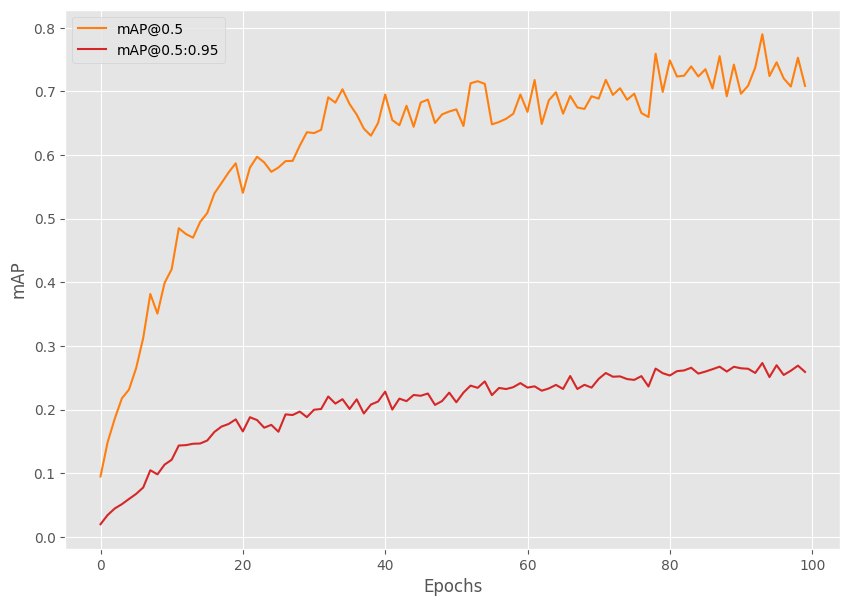

In [ ]:
from tqdm.auto import tqdm
from torchmetrics.detection.mean_ap import MeanAveragePrecision
from torch.optim.lr_scheduler import StepLR
import torch
import matplotlib.pyplot as plt
import time
import os

plt.style.use('ggplot')

seed = 42
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.cuda.manual_seed_all(seed)

# Function for running training iterations.
def train(train_data_loader, model):
    print('Training')
    model.train()

     # initialize tqdm progress bar
    prog_bar = tqdm(train_data_loader, total=len(train_data_loader))

    for i, data in enumerate(prog_bar):
        optimizer.zero_grad()
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]
        loss_dict = model(images, targets)

        losses = sum(loss for loss in loss_dict.values())
        loss_value = losses.item()

        train_loss_hist.send(loss_value)

        losses.backward()
        optimizer.step()

        # update the loss value beside the progress bar for each iteration
        prog_bar.set_description(desc=f"Loss: {loss_value:.4f}")
    return loss_value

# Function for running validation iterations.
def validate(valid_data_loader, model):
    print('Validating')
    model.eval()

    # Initialize tqdm progress bar.
    prog_bar = tqdm(valid_data_loader, total=len(valid_data_loader))
    target = []
    preds = []
    for i, data in enumerate(prog_bar):
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

        with torch.no_grad():
            outputs = model(images, targets)

        # For mAP calculation using Torchmetrics.
        #####################################
        for i in range(len(images)):
            true_dict = dict()
            preds_dict = dict()
            true_dict['boxes'] = targets[i]['boxes'].detach().cpu()
            true_dict['labels'] = targets[i]['labels'].detach().cpu()
            preds_dict['boxes'] = outputs[i]['boxes'].detach().cpu()
            preds_dict['scores'] = outputs[i]['scores'].detach().cpu()
            preds_dict['labels'] = outputs[i]['labels'].detach().cpu()
            preds.append(preds_dict)
            target.append(true_dict)
        #####################################

    metric.reset()
    metric.update(preds, target)
    metric_summary = metric.compute()
    return metric_summary

if __name__ == '__main__':
    os.makedirs('outputs', exist_ok=True)
    train_dataset = create_train_dataset(TRAIN_DIR)
    valid_dataset = create_valid_dataset(VALID_DIR)
    train_loader = create_train_loader(train_dataset, NUM_WORKERS)
    valid_loader = create_valid_loader(valid_dataset, NUM_WORKERS)
    print(f"Number of training samples: {len(train_dataset)}")
    print(f"Number of validation samples: {len(valid_dataset)}\n")

    # Initialize the model and move to the computation device.
    model = create_model(num_classes=NUM_CLASSES)
    model = model.to(DEVICE)
    # print(model)
    # Total parameters and trainable parameters.
    total_params = sum(p.numel() for p in model.parameters())
    print(f"{total_params:,} total parameters.")
    total_trainable_params = sum(
        p.numel() for p in model.parameters() if p.requires_grad)
    print(f"{total_trainable_params:,} training parameters.")
    params = [p for p in model.parameters() if p.requires_grad]
    optimizer = torch.optim.SGD(params, lr=0.0001, momentum=0.9, weight_decay=0.0005, nesterov=True)
    scheduler = StepLR(
        optimizer=optimizer, step_size=15, gamma=0.1, verbose=True
    )

    # To monitor training loss
    train_loss_hist = Averager()
    # To store training loss and mAP values.
    train_loss_list = []
    map_50_list = []
    map_list = []

    # Mame to save the trained model with.
    MODEL_NAME = 'model'

    # Whether to show transformed images from data loader or not.
    # if VISUALIZE_TRANSFORMED_IMAGES:
    #     from custom_utils import show_tranformed_image
    #     show_tranformed_image(train_loader)

    # To save best model.
    save_best_model = SaveBestModel()

    metric = MeanAveragePrecision()

    # Training loop.
    for epoch in range(NUM_EPOCHS):
        print(f"\nEPOCH {epoch+1} of {NUM_EPOCHS}")

        # Reset the training loss histories for the current epoch.
        train_loss_hist.reset()

        # Start timer and carry out training and validation.
        start = time.time()
        train_loss = train(train_loader, model)
        metric_summary = validate(valid_loader, model)
        print(f"Epoch #{epoch+1} train loss: {train_loss_hist.value:.3f}")
        print(f"Epoch #{epoch+1} mAP: {metric_summary['map']}")
        end = time.time()
        print(f"Took {((end - start) / 60):.3f} minutes for epoch {epoch}")

        train_loss_list.append(train_loss)
        map_50_list.append(metric_summary['map_50'])
        map_list.append(metric_summary['map'])

        # save the best model till now.
        save_best_model(
            model, float(metric_summary['map_50']), epoch, 'outputs'
        )
        # Save the current epoch model.
        save_model(epoch, model, optimizer)

        # Save loss plot.
        save_loss_plot(OUT_DIR, train_loss_list)

        # Save mAP plot.
        save_mAP(OUT_DIR, map_50_list, map_list)
        # scheduler.step()

In [ ]:
import torch
from tqdm.auto import tqdm
from tqdm import TqdmExperimentalWarning
from torchmetrics.detection.mean_ap import MeanAveragePrecision

# Evaluation function
def validate(valid_data_loader, model):
    model.eval()

    # Initialize tqdm progress bar.
    prog_bar = tqdm(valid_data_loader, total=len(valid_data_loader))
    target = []
    preds = []
    for i, data in enumerate(prog_bar):
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

        with torch.no_grad():
            outputs = model(images, targets)

        # For mAP calculation using Torchmetrics.
        #####################################
        for i in range(len(images)):
            true_dict = dict()
            preds_dict = dict()
            true_dict['boxes'] = targets[i]['boxes'].detach().cpu()
            true_dict['labels'] = targets[i]['labels'].detach().cpu()
            preds_dict['boxes'] = outputs[i]['boxes'].detach().cpu()
            preds_dict['scores'] = outputs[i]['scores'].detach().cpu()
            preds_dict['labels'] = outputs[i]['labels'].detach().cpu()
            preds.append(preds_dict)
            target.append(true_dict)
        #####################################

    metric = MeanAveragePrecision()
    metric.update(preds, target)
    metric_summary = metric.compute()
    return metric_summary

if __name__ == '__main__':
    # Load the best model and trained weights.
    model = create_model(num_classes=NUM_CLASSES)
    checkpoint = torch.load('outputs/best_model.pth', map_location=DEVICE)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.to(DEVICE).eval()

    test_dataset = create_test_dataset(
        '/content/PneumoniaDataset80-20/test'
    )
    test_loader = create_test_loader(test_dataset, num_workers=NUM_WORKERS)

    metric_summary = validate(test_loader, model)
    print(f"mAP_50: {metric_summary['map_50']*100:.3f}")
    print(f"mAP_50_95: {metric_summary['map']*100:.3f}")

  0%|          | 0/60 [00:00<?, ?it/s]

mAP_50: 78.999
mAP_50_95: 27.314


In [ ]:
def make_prediction(model, img, threshold):
    model.eval()
    preds = model(img)
    for id in range(len(preds)) :
        idx_list = []

        for idx, score in enumerate(preds[id]['scores']) :
            if score > threshold :
                idx_list.append(idx)

        preds[id]['boxes'] = preds[id]['boxes'][idx_list]
        preds[id]['labels'] = preds[id]['labels'][idx_list]
        preds[id]['scores'] = preds[id]['scores'][idx_list]

    return preds

def plot_image_from_output(img, annotation):

    img = img.cpu().permute(1,2,0)

    fig,ax = plt.subplots(1)
    ax.imshow(img)

    for idx in range(len(annotation["boxes"])):
        xmin, ymin, xmax, ymax = annotation["boxes"][idx]

        if annotation['labels'][idx] == 1 :
            rect = patches.Rectangle((xmin,ymin),(xmax-xmin),(ymax-ymin),linewidth=1,edgecolor='g',facecolor='none')
        else :
            rect = patches.Rectangle((xmin,ymin),(xmax-xmin),(ymax-ymin),linewidth=1,edgecolor='orange',facecolor='none')

        ax.add_patch(rect)

    plt.show()

In [ ]:
with torch.no_grad():
    print(len(test_loader))
    for imgs, annotations in test_loader:
        imgs = list(img.to(DEVICE) for img in imgs)

        pred = make_prediction(model, imgs, 0.5)
        break

60


({'boxes': tensor([[ 65.0391,  75.5859, 121.8750, 203.3203],
        [166.9922,  78.5156, 239.9414, 211.2305]]), 'labels': tensor([1, 1]), 'area': tensor([7259.9028, 9681.4443]), 'iscrowd': tensor([0, 0]), 'image_id': tensor([0])},)
Target :  tensor([1, 1])


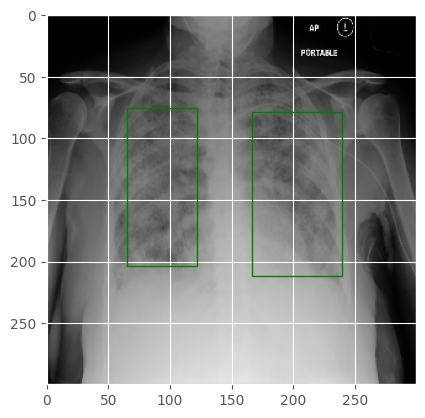

Prediction :  tensor([1, 1], device='cuda:0')
{'boxes': tensor([[ 65.0391,  75.5859, 121.8750, 203.3203],
        [166.9922,  78.5156, 239.9414, 211.2305]]), 'labels': tensor([1, 1]), 'area': tensor([7259.9028, 9681.4443]), 'iscrowd': tensor([0, 0]), 'image_id': tensor([0])}
{'boxes': tensor([[ 55.9461,  67.1741, 129.7005, 213.5288],
        [151.7008,  54.4691, 235.9758, 205.3044]], device='cuda:0'), 'scores': tensor([0.6743, 0.5597], device='cuda:0'), 'labels': tensor([1, 1], device='cuda:0')}


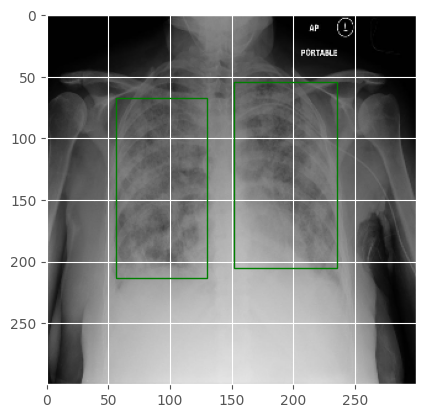

IoU: tensor([[0.6726, 0.0000],
        [0.0000, 0.6409]])


In [ ]:
from torchvision.ops import box_iou
import matplotlib.patches as patches

print(annotations)
_idx = 0
print("Target : ", annotations[_idx]['labels'])
plot_image_from_output(imgs[_idx], annotations[_idx])
print("Prediction : ", pred[_idx]['labels'])
print(annotations[_idx])
print(pred[_idx])

# Create a tensor on the CUDA device
for key in pred[_idx]:
    pred[_idx][key] = pred[_idx][key].cpu()

plot_image_from_output(imgs[_idx], pred[_idx])
iou = box_iou(pred[_idx]['boxes'],annotations[_idx]['boxes'])
print("IoU:", iou)

In [ ]:
from tqdm import tqdm

labels = []
preds_adj_all = []
annot_all = []

for im, annot in tqdm(test_loader, position = 0, leave = True):
    im = list(img.to(DEVICE) for img in im)
    #annot = [{k: v.to(device) for k, v in t.items()} for t in annot]

    for t in annot:
        labels += t['labels']

    with torch.no_grad():
        preds_adj = make_prediction(model, im, 0.5)
        preds_adj = [{k: v.to(torch.device('cpu')) for k, v in t.items()} for t in preds_adj]
        preds_adj_all.append(preds_adj)
        annot_all.append(annot)


100%|██████████| 60/60 [00:02<00:00, 28.80it/s]


In [ ]:
!git clone https://github.com/Pseudo-Lab/Tutorial-Book-Utils
!python Tutorial-Book-Utils/PL_data_loader.py --data FaceMaskDetection

Cloning into 'Tutorial-Book-Utils'...
remote: Enumerating objects: 45, done.
remote: Counting objects: 100% (45/45), done.
remote: Compressing objects: 100% (39/39), done.
remote: Total 45 (delta 18), reused 17 (delta 5), pack-reused 0
Receiving objects: 100% (45/45), 11.62 KiB | 11.62 MiB/s, done.
Resolving deltas: 100% (18/18), done.
Access denied with the following error:

 	Cannot retrieve the public link of the file. You may need to change
	the permission to 'Anyone with the link', or have had many accesses. 

You may still be able to access the file from the browser:

	 https://drive.google.com/uc?id=16Gzn1w38yZLJpzmzKcRIRveFeHZtCEr7 

Face Mask Detection.zip download complete!


In [ ]:
%cd Tutorial-Book-Utils/
import utils_ObjectDetection as utils

/content/Tutorial-Book-Utils


In [ ]:
sample_metrics = []
for batch_i in range(len(preds_adj_all)):
    sample_metrics += utils.get_batch_statistics(preds_adj_all[batch_i], annot_all[batch_i], iou_threshold=0.5)

true_positives, pred_scores, pred_labels = [torch.cat(x, 0) for x in list(zip(*sample_metrics))]  # batch semua disatukan
precision, recall, AP, f1, ap_class = utils.ap_per_class(true_positives, pred_scores, pred_labels, torch.tensor(labels))
mAP = torch.mean(AP)
print(f'mAP : {mAP}')
print(f'AP : {AP}')

mAP : 0.6136133941571575
AP : tensor([0.6136], dtype=torch.float64)


In [ ]:
sample_metrics = []
for batch_i in range(len(preds_adj_all)):
    sample_metrics += utils.get_batch_statistics(preds_adj_all[batch_i], annot_all[batch_i], iou_threshold=0.4)

true_positives, pred_scores, pred_labels = [torch.cat(x, 0) for x in list(zip(*sample_metrics))]  # batch semua disatukan
precision, recall, AP, f1, ap_class = utils.ap_per_class(true_positives, pred_scores, pred_labels, torch.tensor(labels))
mAP = torch.mean(AP)
print(f'mAP : {mAP}')
print(f'AP : {AP}')

mAP : 0.6623508729259235
AP : tensor([0.6624], dtype=torch.float64)


In [ ]:
sample_metrics = []
for batch_i in range(len(preds_adj_all)):
    sample_metrics += utils.get_batch_statistics(preds_adj_all[batch_i], annot_all[batch_i], iou_threshold=0.3)

true_positives, pred_scores, pred_labels = [torch.cat(x, 0) for x in list(zip(*sample_metrics))]  # batch semua disatukan
precision, recall, AP, f1, ap_class = utils.ap_per_class(true_positives, pred_scores, pred_labels, torch.tensor(labels))
mAP = torch.mean(AP)
print(f'mAP : {mAP}')
print(f'AP : {AP}')

mAP : 0.7254091221041605
AP : tensor([0.7254], dtype=torch.float64)


In [ ]:
import numpy as np
import cv2
import torch
import glob as glob
import os
import time
import argparse
import csv

os.makedirs('inference_outputs/images', exist_ok=True)

COLORS = np.random.uniform(0, 255, size=(len(CLASSES), 3))

# Load the best model and trained weights.
model = create_model(num_classes=NUM_CLASSES)
checkpoint = torch.load('/content/outputs/best_model.pth', map_location=DEVICE)
model.load_state_dict(checkpoint['model_state_dict'])
model.to(DEVICE).eval()

# Directory where all the images are present.
DIR_TEST = '/content/PneumoniaDataset80-20/test'
test_images = glob.glob(f"{DIR_TEST}/*.jpg")
print(f"Test instances: {len(test_images)}")

frame_count = 0 # To count total frames.
total_fps = 0 # To get the final frames per second.
lung_opacity_files = []

for i in range(len(test_images)):
    # Get the image file name for saving output later on.
    image_name = test_images[i].split(os.path.sep)[-1].split('.')[0]
    image = cv2.imread(test_images[i])
    orig_image = image.copy()
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
    image /= 255.0
    image_input = np.transpose(image, (2, 0, 1)).astype(np.float32)
    image_input = torch.tensor(image_input, dtype=torch.float).cuda()
    image_input = torch.unsqueeze(image_input, 0)
    start_time = time.time()
    # Predictions
    with torch.no_grad():
        outputs = model(image_input.to(DEVICE))
    end_time = time.time()

    # Get the current fps.
    fps = 1 / (end_time - start_time)
    total_fps += fps
    frame_count += 1

    # Load all detection to CPU for further operations.
    outputs = [{k: v.to('cpu') for k, v in t.items()} for t in outputs]
    if len(outputs[0]['boxes']) != 0:
        boxes = outputs[0]['boxes'].data.numpy()
        scores = outputs[0]['scores'].data.numpy()
        boxes = boxes[scores >= 0.6].astype(np.int32)
        draw_boxes = boxes.copy()
        # Get all the predicited class names.
        pred_classes = [CLASSES[i] for i in outputs[0]['labels'].cpu().numpy()]
        # Draw the bounding boxes and write the class name on top of it.
        for j, box in enumerate(draw_boxes):
            print(image_name)
            class_name = pred_classes[j]
            color = COLORS[CLASSES.index(class_name)]
            # Recale boxes.
            xmin = int((box[0] / image.shape[1]) * orig_image.shape[1])
            ymin = int((box[1] / image.shape[0]) * orig_image.shape[0])
            xmax = int((box[2] / image.shape[1]) * orig_image.shape[1])
            ymax = int((box[3] / image.shape[0]) * orig_image.shape[0])
            cv2.rectangle(orig_image,
                        (xmin, ymin),
                        (xmax, ymax),
                        color[::-1],
                        3)
            cv2.putText(orig_image,
                        class_name,
                        (xmin, ymin-5),
                        cv2.FONT_HERSHEY_SIMPLEX,
                        0.8,
                        color[::-1],
                        2,
                        lineType=cv2.LINE_AA)
        plt.imshow(cv2.cvtColor(orig_image, cv2.COLOR_BGR2RGB))
        plt.show()

        # Simpan gambar ke direktori
        # cv2.imwrite(f"inference_outputs/images/{image_name}.jpg", orig_image)
    print(f"Image {i+1} done...")
    print('-'*50)

print('TEST PREDICTIONS COMPLETE')
avg_fps = total_fps / frame_count
print(f"Average FPS: {avg_fps:.3f}")

Output hidden; open in https://colab.research.google.com to view.

  0%|          | 0/60 [00:00<?, ?it/s]

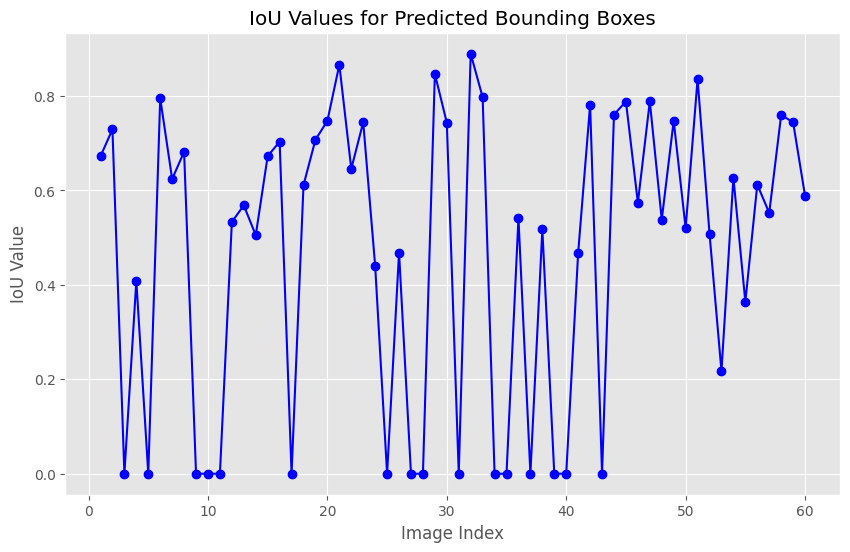

In [ ]:
import shutil
import torch
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
from torchvision.transforms.functional import to_pil_image
from torchvision.ops import box_iou

# Function to calculate Intersection over Union (IoU)
def calculate_iou(box1, box2):
    # Extract coordinates from the bounding box tensors
    box1 = [float(coord) for coord in box1]
    box2 = [float(coord) for coord in box2]

    # Calculate intersection area
    x1_int = max(box1[0], box2[0])
    y1_int = max(box1[1], box2[1])
    x2_int = min(box1[2], box2[2])
    y2_int = min(box1[3], box2[3])

    intersection = max(0, x2_int - x1_int) * max(0, y2_int - y1_int)

    # Calculate union area
    area1 = (box1[2] - box1[0]) * (box1[3] - box1[1])
    area2 = (box2[2] - box2[0]) * (box2[3] - box2[1])
    union = area1 + area2 - intersection

    # Calculate IoU
    iou = intersection / union if union > 0 else 0.0
    return iou

source_path = "/content/drive/MyDrive/SKRIPSI/Hasil/Model_3/best_model.pth"
destination_path = "/content/outputs/best_model.pth"

shutil.copyfile(source_path, destination_path)

def show_iou_graph(images, true_boxes, pred_boxes, threshold=0.5, save_path="iou_graph_model3.png"):
    all_ious = []

    for i in range(len(images)):
        true_boxes_i = true_boxes[i]
        pred_boxes_i = pred_boxes[i]

        ious = []  # To store IoU values for the current image

        for pred_box, score, label in zip(pred_boxes_i['boxes'], pred_boxes_i['scores'], pred_boxes_i['labels']):
            pred_box = [float(b) for b in pred_box]
            if score > threshold:
                # Find the corresponding true bounding box for the label
                true_box = true_boxes_i['boxes'][true_boxes_i['labels'] == label].cpu()
                if len(true_box) > 0:
                    true_box = [float(b) for b in true_box[0]]
                    iou = calculate_iou(pred_box, true_box)
                    ious.append(iou)

        # Store IoU values for the current image
        all_ious.append(ious)

    # Create IoU scatter plot
    plt.figure(figsize=(10, 6))
    plt.scatter(range(1, len(all_ious) + 1), [max(i, default=0) for i in all_ious], color='blue')
    plt.plot(range(1, len(all_ious) + 1), [max(i, default=0) for i in all_ious], linestyle='-', marker='o', color='blue')
    plt.title('Grafik Hasil IoU')
    plt.xlabel('Deteksi Objek ke-')
    plt.ylabel('Nilai IoU')
    plt.savefig(save_path)
    plt.show()

# Update the validate function to return images along with predictions
def validate(valid_data_loader, model):
    model.eval()

    # Initialize tqdm progress bar.
    prog_bar = tqdm(valid_data_loader, total=len(valid_data_loader))
    target = []
    preds = []
    images_list = []

    for i, data in enumerate(prog_bar):
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

        with torch.no_grad():
            outputs = model(images, targets)

        # For mAP calculation using Torchmetrics.
        for i in range(len(images)):
            true_dict = dict()
            preds_dict = dict()
            true_dict['boxes'] = targets[i]['boxes'].detach().cpu()
            true_dict['labels'] = targets[i]['labels'].detach().cpu()
            preds_dict['boxes'] = outputs[i]['boxes'].detach().cpu()
            preds_dict['scores'] = outputs[i]['scores'].detach().cpu()
            preds_dict['labels'] = outputs[i]['labels'].detach().cpu()
            preds.append(preds_dict)
            target.append(true_dict)
            images_list.append(images[i])

    return images_list, preds, target

if __name__ == '__main__':
    model = create_model(num_classes=NUM_CLASSES)
    checkpoint = torch.load('outputs/best_model.pth', map_location=DEVICE)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.to(DEVICE).eval()

    test_dataset = create_test_dataset('/content/PneumoniaDataset80-20/test')
    test_loader = create_test_loader(test_dataset, num_workers=NUM_WORKERS)

    # After calculating metrics, you can display the IoU graph
    images, pred_boxes, true_boxes = validate(test_loader, model)
    # class_names = ['_Background', 'Pneumonia']
    show_iou_graph(images, true_boxes, pred_boxes, save_path='iou_graph_model3.png')

# MODEL 4 | BATCH : 4 | LR : 0.001 | 80:20 | BEST(LR)

In [ ]:
import zipfile
import os

zip_file_path = '/content/drive/MyDrive/SKRIPSI/Dataset/PneumoniaDataset80-20.zip'  # Ganti dengan path ke file ZIP Anda
unzip_dir = '/content'  # Ganti dengan direktori di mana Anda ingin mengekstrak file

def extract_zip(zip_file, extract_dir):
    with zipfile.ZipFile(zip_file, 'r') as zip_ref:
        zip_ref.extractall(extract_dir)

def list_files(directory):
    return os.listdir(directory)

# Ekstrak file ZIP
extract_zip(zip_file_path, unzip_dir)

# Tampilkan daftar file yang diekstrak
extracted_files = list_files(unzip_dir)
print(extracted_files)

['.config', 'drive', '__MACOSX', 'PneumoniaDataset80-20', 'sample_data']


In [ ]:
import torch
import os


DEVICE = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

BATCH_SIZE = 4 # Increase / decrease according to GPU memeory.
RESIZE_TO = 300 # Resize the image for training and transforms.
NUM_EPOCHS = 100 # Number of epochs to train for.
NUM_WORKERS = 2 # Number of parallel workers for data loading.

CLASSES = [
    '_background','Lung Opacity'
    # 'helmet','head','person'
]



TRAIN_DIR = '/content/PneumoniaDataset80-20/train'
VALID_DIR = '/content/PneumoniaDataset80-20/test'

# Classes: 0 index is reserved for background.


NUM_CLASSES = len(CLASSES)

# Whether to visualize images after crearing the data loaders.
VISUALIZE_TRANSFORMED_IMAGES = False

# Location to save model and plots.
OUT_DIR = 'outputs'
os.makedirs(OUT_DIR, exist_ok=True)

In [ ]:
import albumentations as A
import cv2
import numpy as np
import torch
import matplotlib.pyplot as plt

from albumentations.pytorch import ToTensorV2


plt.style.use('ggplot')

# This class keeps track of the training and validation loss values
# and helps to get the average for each epoch as well.
class Averager:
    def __init__(self):
        self.current_total = 0.0
        self.iterations = 0.0

    def send(self, value):
        self.current_total += value
        self.iterations += 1

    @property
    def value(self):
        if self.iterations == 0:
            return 0
        else:
            return 1.0 * self.current_total / self.iterations

    def reset(self):
        self.current_total = 0.0
        self.iterations = 0.0

class SaveBestModel:
    """
    Class to save the best model while training. If the current epoch's
    validation mAP @0.5:0.95 IoU higher than the previous highest, then save the
    model state.
    """
    def __init__(
        self, best_valid_map=float(0)
    ):
        self.best_valid_map = best_valid_map

    def __call__(
        self,
        model,
        current_valid_map,
        epoch,
        OUT_DIR,
    ):
        if current_valid_map > self.best_valid_map:
            self.best_valid_map = current_valid_map
            print(f"\nBEST VALIDATION mAP: {self.best_valid_map}")
            print(f"\nSAVING BEST MODEL FOR EPOCH: {epoch+1}\n")
            torch.save({
                'epoch': epoch+1,
                'model_state_dict': model.state_dict(),
                }, f"{OUT_DIR}/best_model.pth")

def collate_fn(batch):
    """
    To handle the data loading as different images may have different number
    of objects and to handle varying size tensors as well.
    """
    return tuple(zip(*batch))

# Define the training tranforms.
def get_train_transform():
    return A.Compose([
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.Rotate(limit=6),
        A.Blur(blur_limit=3, p=0.1),
        A.MotionBlur(blur_limit=3, p=0.1),
        A.MedianBlur(blur_limit=3, p=0.1),
        A.RandomBrightnessContrast(p=0.2),
        ToTensorV2(p=1.0),
    ], bbox_params={
        'format': 'pascal_voc',
        'label_fields': ['labels']
    })


# Define the validation transforms.
def get_valid_transform():
    return A.Compose([
        ToTensorV2(p=1.0),
    ], bbox_params={
        'format': 'pascal_voc',
        'label_fields': ['labels']
    })


def show_tranformed_image(train_loader):
    """
    This function shows the transformed images from the `train_loader`.
    Helps to check whether the tranformed images along with the corresponding
    labels are correct or not.
    Only runs if `VISUALIZE_TRANSFORMED_IMAGES = True` in config.py.
    """
    if len(train_loader) > 0:
        for i in range(1):
            images, targets = next(iter(train_loader))
            images = list(image.to(DEVICE) for image in images)
            targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]
            boxes = targets[i]['boxes'].cpu().numpy().astype(np.int32)
            labels = targets[i]['labels'].cpu().numpy().astype(np.int32)
            sample = images[i].permute(1, 2, 0).cpu().numpy()
            sample = cv2.cvtColor(sample, cv2.COLOR_RGB2BGR)
            for box_num, box in enumerate(boxes):
                cv2.rectangle(sample,
                            (box[0], box[1]),
                            (box[2], box[3]),
                            (0, 0, 255), 2)
                cv2.putText(sample, CLASSES[labels[box_num]],
                            (box[0], box[1]-10), cv2.FONT_HERSHEY_SIMPLEX,
                            1.0, (0, 0, 255), 2)
            cv2.imshow('Transformed image', sample)
            cv2.waitKey(0)
            cv2.destroyAllWindows()

def save_model(epoch, model, optimizer):
    """
    Function to save the trained model till current epoch, or whenver called
    """
    torch.save({
                'epoch': epoch+1,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                }, 'outputs/last_model.pth')

def save_loss_plot(
    OUT_DIR,
    train_loss_list,
    x_label='iterations',
    y_label='train loss',
    save_name='train_loss'
):
    """
    Function to save both train loss graph.

    :param OUT_DIR: Path to save the graphs.
    :param train_loss_list: List containing the training loss values.
    """
    figure_1 = plt.figure(figsize=(10, 7), num=1, clear=True)
    train_ax = figure_1.add_subplot()
    train_ax.plot(train_loss_list, color='tab:blue')
    train_ax.set_xlabel(x_label)
    train_ax.set_ylabel(y_label)
    figure_1.savefig(f"{OUT_DIR}/{save_name}.png")
    print('SAVING PLOTS COMPLETE...')

def save_mAP(OUT_DIR, map_05, map):
    """
    Saves the mAP@0.5 and mAP@0.5:0.95 per epoch.
    :param OUT_DIR: Path to save the graphs.
    :param map_05: List containing mAP values at 0.5 IoU.
    :param map: List containing mAP values at 0.5:0.95 IoU.
    """
    figure = plt.figure(figsize=(10, 7), num=1, clear=True)
    ax = figure.add_subplot()
    ax.plot(
        map_05, color='tab:orange', linestyle='-',
        label='mAP@0.5'
    )
    ax.plot(
        map, color='tab:red', linestyle='-',
        label='mAP@0.5:0.95'
    )
    ax.set_xlabel('Epochs')
    ax.set_ylabel('mAP')
    ax.legend()
    figure.savefig(f"{OUT_DIR}/map.png")

In [ ]:
import torch
import cv2
import numpy as np
import os
import glob as glob
from google.colab.patches import cv2_imshow
from xml.etree import ElementTree as et
from torch.utils.data import Dataset, DataLoader

# The dataset class.
class PneumoniaDataset(Dataset):
    def __init__(self, dir_path, width, height, classes, transforms=None):
        self.transforms = transforms
        self.dir_path = dir_path
        self.height = height
        self.width = width
        self.classes = classes
        self.image_file_types = ['*.jpg', '*.jpeg', '*.png', '*.ppm', '*.JPG']
        self.all_image_paths = []

        # Get all the image paths in sorted order.
        for file_type in self.image_file_types:
            self.all_image_paths.extend(glob.glob(os.path.join(self.dir_path, file_type)))
        self.all_images = [image_path.split(os.path.sep)[-1] for image_path in self.all_image_paths]
        self.all_images = sorted(self.all_images)

    def __getitem__(self, idx):
        # Capture the image name and the full image path.
        image_name = self.all_images[idx]
        image_path = os.path.join(self.dir_path, image_name)

        # Read and preprocess the image.
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
        image_resized = cv2.resize(image, (self.width, self.height))
        image_resized /= 255.0

        # Capture the corresponding XML file for getting the annotations.
        annot_filename = os.path.splitext(image_name)[0] + '.xml'
        annot_file_path = os.path.join(self.dir_path, annot_filename)

        boxes = []
        labels = []
        tree = et.parse(annot_file_path)
        root = tree.getroot()

        # Original image width and height.
        image_width = image.shape[1]
        image_height = image.shape[0]

        # Box coordinates for xml files are extracted
        # and corrected for image size given.
        for member in root.findall('object'):
            # Get label and map the `classes`.
            labels.append(self.classes.index(member.find('name').text))

            # Left corner x-coordinates.
            xmin = int(member.find('bndbox').find('xmin').text)
            # Right corner x-coordinates.
            xmax = int(member.find('bndbox').find('xmax').text)
            # Left corner y-coordinates.
            ymin = int(member.find('bndbox').find('ymin').text)
            # Right corner y-coordinates.
            ymax = int(member.find('bndbox').find('ymax').text)

            # Resize the bounding boxes according
            # to resized image `width`, `height`.
            xmin_final = (xmin/image_width)*self.width
            xmax_final = (xmax/image_width)*self.width
            ymin_final = (ymin/image_height)*self.height
            ymax_final = (ymax/image_height)*self.height

            # Check that max coordinates are at least one pixel
            # larger than min coordinates.
            if xmax_final == xmin_final:
                xmax_final += 1
            if ymax_final == ymin_final:
                ymax_final += 1
            # Check that all coordinates are within the image.
            if xmax_final > self.width:
                xmax_final = self.width
            if ymax_final > self.height:
                ymax_final = self.height

            boxes.append([xmin_final, ymin_final, xmax_final, ymax_final])

        # Bounding box to tensor.
        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        # Area of the bounding boxes.
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0]) if len(boxes) > 0 \
            else torch.as_tensor(boxes, dtype=torch.float32)
        # No crowd instances.
        iscrowd = torch.zeros((boxes.shape[0],), dtype=torch.int64)
        # Labels to tensor.
        labels = torch.as_tensor(labels, dtype=torch.int64)

        # Prepare the final `target` dictionary.
        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["area"] = area
        target["iscrowd"] = iscrowd
        image_id = torch.tensor([idx])
        target["image_id"] = image_id

        # Apply the image transforms.
        if self.transforms:
            sample = self.transforms(image = image_resized,
                                     bboxes = target['boxes'],
                                     labels = labels)
            image_resized = sample['image']
            target['boxes'] = torch.Tensor(sample['bboxes'])

        if np.isnan((target['boxes']).numpy()).any() or target['boxes'].shape == torch.Size([0]):
            target['boxes'] = torch.zeros((0, 4), dtype=torch.int64)
        return image_resized, target

    def __len__(self):
        return len(self.all_images)
        # return 500;

# Prepare the final datasets and data loaders.
def create_train_dataset(DIR):
    train_dataset = PneumoniaDataset(
        DIR, RESIZE_TO, RESIZE_TO, CLASSES, get_train_transform()
    )
    return train_dataset
def create_valid_dataset(DIR):
    valid_dataset = PneumoniaDataset(
        DIR, RESIZE_TO, RESIZE_TO, CLASSES, get_valid_transform()
    )
    return valid_dataset
def create_test_dataset(DIR):
    test_dataset = PneumoniaDataset(
        DIR, RESIZE_TO, RESIZE_TO, CLASSES, get_valid_transform()
    )
    return test_dataset
def create_train_loader(train_dataset, num_workers=0):
    train_loader = DataLoader(
        train_dataset,
        batch_size=BATCH_SIZE,
        shuffle=True,
        num_workers=num_workers,
        collate_fn=collate_fn,
        drop_last=True
    )
    return train_loader
def create_valid_loader(valid_dataset, num_workers=0):
    valid_loader = DataLoader(
        valid_dataset,
        batch_size=BATCH_SIZE,
        shuffle=False,
        num_workers=num_workers,
        collate_fn=collate_fn,
        drop_last=True
    )
    return valid_loader
def create_test_loader(test_dataset, num_workers=0):
    test_loader = DataLoader(
        test_dataset,
        batch_size=1,
        shuffle=False,
        num_workers=num_workers,
        collate_fn=collate_fn,
        drop_last=True
    )
    return test_loader


In [ ]:
import torchvision
import torch

from functools import partial
from torchvision.models.detection import RetinaNet
from torchvision.models.detection.backbone_utils import resnet_fpn_backbone
from torchvision.models.detection.retinanet import RetinaNetClassificationHead
from torchvision.models.detection import RetinaNet_ResNet50_FPN_V2_Weights
from torchvision.models.detection.retinanet import RetinaNetClassificationHead

def create_model(num_classes):
    model = torchvision.models.detection.retinanet_resnet50_fpn_v2(
        weights=RetinaNet_ResNet50_FPN_V2_Weights.COCO_V1
    )
    num_anchors = model.head.classification_head.num_anchors

    model.head.classification_head = RetinaNetClassificationHead(
        in_channels=256,
        num_anchors=num_anchors,
        num_classes=num_classes,
        norm_layer=partial(torch.nn.GroupNorm, 32)
    )
    return model

if __name__ == '__main__':
    model = create_model(2)
    # print(model)
    # Total parameters and trainable parameters.
    total_params = sum(p.numel() for p in model.parameters())
    print(f"{total_params:,} total parameters.")
    total_trainable_params = sum(
        p.numel() for p in model.parameters() if p.requires_grad)
    print(f"{total_trainable_params:,} training parameters.")

Downloading: "https://download.pytorch.org/models/retinanet_resnet50_fpn_v2_coco-5905b1c5.pth" to /root/.cache/torch/hub/checkpoints/retinanet_resnet50_fpn_v2_coco-5905b1c5.pth
100%|██████████| 146M/146M [00:00<00:00, 184MB/s]


36,352,630 total parameters.
36,127,286 training parameters.


In [ ]:
!pip install torchmetrics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 840.2/840.2 kB 12.5 MB/s eta 0:00:00


Number of training samples: 240
Number of validation samples: 60

36,352,630 total parameters.
36,127,286 training parameters.
Adjusting learning rate of group 0 to 1.0000e-03.

EPOCH 1 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torchmetrics/utilities/prints.py:43: UserWarning: Encountered more than 100 detections in a single image. This means that certain detections with the lowest scores will be ignored, that may have an undesirable impact on performance. Please consider adjusting the `max_detection_threshold` to suit your use case. To disable this warning, set attribute class `warn_on_many_detections=False`, after initializing the metric.
  warnings.warn(*args, **kwargs)  # noqa: B028


Epoch #1 train loss: 1.028
Epoch #1 mAP: 0.05615278705954552
Took 0.379 minutes for epoch 0

BEST VALIDATION mAP: 0.20142030715942383

SAVING BEST MODEL FOR EPOCH: 1

SAVING PLOTS COMPLETE...

EPOCH 2 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7c024669fa30>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'Exception ignored in: 
<function _MultiProcessingDataLoaderIter.__del__ at 0x7c024669fa30>AssertionError
: Traceback (most recent call last):
can only test a child process  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__

    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #2 train loss: 0.810
Epoch #2 mAP: 0.10885664820671082
Took 0.319 minutes for epoch 1

BEST VALIDATION mAP: 0.36093103885650635

SAVING BEST MODEL FOR EPOCH: 2

SAVING PLOTS COMPLETE...

EPOCH 3 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #3 train loss: 0.762
Epoch #3 mAP: 0.11664021760225296
Took 0.153 minutes for epoch 2

BEST VALIDATION mAP: 0.3663596510887146

SAVING BEST MODEL FOR EPOCH: 3

SAVING PLOTS COMPLETE...

EPOCH 4 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #4 train loss: 0.728
Epoch #4 mAP: 0.14845344424247742
Took 0.319 minutes for epoch 3

BEST VALIDATION mAP: 0.48188337683677673

SAVING BEST MODEL FOR EPOCH: 4

SAVING PLOTS COMPLETE...

EPOCH 5 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #5 train loss: 0.700
Epoch #5 mAP: 0.15802986919879913
Took 0.318 minutes for epoch 4

BEST VALIDATION mAP: 0.5188032388687134

SAVING BEST MODEL FOR EPOCH: 5

SAVING PLOTS COMPLETE...

EPOCH 6 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #6 train loss: 0.684
Epoch #6 mAP: 0.18347997963428497
Took 0.317 minutes for epoch 5

BEST VALIDATION mAP: 0.53635174036026

SAVING BEST MODEL FOR EPOCH: 6

SAVING PLOTS COMPLETE...

EPOCH 7 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #7 train loss: 0.665
Epoch #7 mAP: 0.19050298631191254
Took 0.313 minutes for epoch 6

BEST VALIDATION mAP: 0.5545461177825928

SAVING BEST MODEL FOR EPOCH: 7

SAVING PLOTS COMPLETE...

EPOCH 8 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #8 train loss: 0.643
Epoch #8 mAP: 0.1966714709997177
Took 0.315 minutes for epoch 7

BEST VALIDATION mAP: 0.5755577683448792

SAVING BEST MODEL FOR EPOCH: 8

SAVING PLOTS COMPLETE...

EPOCH 9 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #9 train loss: 0.640
Epoch #9 mAP: 0.2199656367301941
Took 0.315 minutes for epoch 8

BEST VALIDATION mAP: 0.6072873473167419

SAVING BEST MODEL FOR EPOCH: 9

SAVING PLOTS COMPLETE...

EPOCH 10 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #10 train loss: 0.637
Epoch #10 mAP: 0.21077854931354523
Took 0.148 minutes for epoch 9

BEST VALIDATION mAP: 0.6333706974983215

SAVING BEST MODEL FOR EPOCH: 10

SAVING PLOTS COMPLETE...

EPOCH 11 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #11 train loss: 0.621
Epoch #11 mAP: 0.2377924621105194
Took 0.314 minutes for epoch 10

BEST VALIDATION mAP: 0.6764491200447083

SAVING BEST MODEL FOR EPOCH: 11

SAVING PLOTS COMPLETE...

EPOCH 12 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #12 train loss: 0.608
Epoch #12 mAP: 0.23845241963863373
Took 0.314 minutes for epoch 11
SAVING PLOTS COMPLETE...

EPOCH 13 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #13 train loss: 0.609
Epoch #13 mAP: 0.22885306179523468
Took 0.315 minutes for epoch 12

BEST VALIDATION mAP: 0.7032512426376343

SAVING BEST MODEL FOR EPOCH: 13

SAVING PLOTS COMPLETE...

EPOCH 14 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #14 train loss: 0.591
Epoch #14 mAP: 0.24738574028015137
Took 0.145 minutes for epoch 13

BEST VALIDATION mAP: 0.7242181301116943

SAVING BEST MODEL FOR EPOCH: 14

SAVING PLOTS COMPLETE...

EPOCH 15 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #15 train loss: 0.584
Epoch #15 mAP: 0.25243592262268066
Took 0.314 minutes for epoch 14
SAVING PLOTS COMPLETE...

EPOCH 16 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #16 train loss: 0.580
Epoch #16 mAP: 0.25633254647254944
Took 0.150 minutes for epoch 15
SAVING PLOTS COMPLETE...

EPOCH 17 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #17 train loss: 0.580
Epoch #17 mAP: 0.25236400961875916
Took 0.317 minutes for epoch 16
SAVING PLOTS COMPLETE...

EPOCH 18 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7c024669fa30>Exception ignored in: 
<function _MultiProcessingDataLoaderIter.__del__ at 0x7c024669fa30>Traceback (most recent call last):

  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
Traceback (most recent call last):
      File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
self._shutdown_workers()    self._shutdown_workers()

  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
        if w.is_alive():
if w.is_alive():  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive

      File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
assert self._parent_pid == os.getpid(), 'can only test a

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #18 train loss: 0.573
Epoch #18 mAP: 0.25691094994544983
Took 0.161 minutes for epoch 17
SAVING PLOTS COMPLETE...

EPOCH 19 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #19 train loss: 0.562
Epoch #19 mAP: 0.27003344893455505
Took 0.317 minutes for epoch 18

BEST VALIDATION mAP: 0.7259258031845093

SAVING BEST MODEL FOR EPOCH: 19

SAVING PLOTS COMPLETE...

EPOCH 20 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #20 train loss: 0.563
Epoch #20 mAP: 0.2704136073589325
Took 0.316 minutes for epoch 19

BEST VALIDATION mAP: 0.7287078499794006

SAVING BEST MODEL FOR EPOCH: 20

SAVING PLOTS COMPLETE...

EPOCH 21 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7c024669fa30>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
Exception ignored in:     <function _MultiProcessingDataLoaderIter.__del__ at 0x7c024669fa30>if w.is_alive():

  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
Traceback (most recent call last):
    assert self._parent_pid == os.getpid(), 'can only test a child process'
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
AssertionError    self._shutdown_workers(): 
can only test a child process  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers

    if w.is_alive():
  File "/usr/lib/

Epoch #21 train loss: 0.554
Epoch #21 mAP: 0.2718241214752197
Took 0.150 minutes for epoch 20
SAVING PLOTS COMPLETE...

EPOCH 22 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #22 train loss: 0.541
Epoch #22 mAP: 0.272333562374115
Took 0.314 minutes for epoch 21
SAVING PLOTS COMPLETE...

EPOCH 23 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #23 train loss: 0.546
Epoch #23 mAP: 0.2757844626903534
Took 0.316 minutes for epoch 22

BEST VALIDATION mAP: 0.7295899391174316

SAVING BEST MODEL FOR EPOCH: 23

SAVING PLOTS COMPLETE...

EPOCH 24 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #24 train loss: 0.551
Epoch #24 mAP: 0.2820819318294525
Took 0.149 minutes for epoch 23

BEST VALIDATION mAP: 0.7481510043144226

SAVING BEST MODEL FOR EPOCH: 24

SAVING PLOTS COMPLETE...

EPOCH 25 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7c024669fa30>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child processException ignored in: 
<function _MultiProcessingDataLoaderIter.__del__ at 0x7c024669fa30>

Exception ignored in: Traceback (most recent call last):
<function _MultiProcessingDataLoaderIter.__del__ at 0x7c024669fa30>  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__

    Traceback (most recent call last):
self._shutdown_workers()  File "/usr/local/lib/pyt

Epoch #25 train loss: 0.530
Epoch #25 mAP: 0.2929140329360962
Took 0.165 minutes for epoch 24
SAVING PLOTS COMPLETE...

EPOCH 26 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #26 train loss: 0.526
Epoch #26 mAP: 0.27338868379592896
Took 0.315 minutes for epoch 25
SAVING PLOTS COMPLETE...

EPOCH 27 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #27 train loss: 0.530
Epoch #27 mAP: 0.2941147983074188
Took 0.314 minutes for epoch 26

BEST VALIDATION mAP: 0.7548075914382935

SAVING BEST MODEL FOR EPOCH: 27

SAVING PLOTS COMPLETE...

EPOCH 28 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #28 train loss: 0.522
Epoch #28 mAP: 0.29283976554870605
Took 0.315 minutes for epoch 27
SAVING PLOTS COMPLETE...

EPOCH 29 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #29 train loss: 0.524
Epoch #29 mAP: 0.28498461842536926
Took 0.314 minutes for epoch 28

BEST VALIDATION mAP: 0.7782160639762878

SAVING BEST MODEL FOR EPOCH: 29

SAVING PLOTS COMPLETE...

EPOCH 30 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #30 train loss: 0.517
Epoch #30 mAP: 0.2942289412021637
Took 0.315 minutes for epoch 29
SAVING PLOTS COMPLETE...

EPOCH 31 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #31 train loss: 0.506
Epoch #31 mAP: 0.29153263568878174
Took 0.314 minutes for epoch 30
SAVING PLOTS COMPLETE...

EPOCH 32 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #32 train loss: 0.510
Epoch #32 mAP: 0.2920682728290558
Took 0.314 minutes for epoch 31
SAVING PLOTS COMPLETE...

EPOCH 33 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #33 train loss: 0.498
Epoch #33 mAP: 0.28357061743736267
Took 1.654 minutes for epoch 32
SAVING PLOTS COMPLETE...

EPOCH 34 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #34 train loss: 0.495
Epoch #34 mAP: 0.284817099571228
Took 0.315 minutes for epoch 33
SAVING PLOTS COMPLETE...

EPOCH 35 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #35 train loss: 0.490
Epoch #35 mAP: 0.30939191579818726
Took 0.315 minutes for epoch 34

BEST VALIDATION mAP: 0.7793757319450378

SAVING BEST MODEL FOR EPOCH: 35

SAVING PLOTS COMPLETE...

EPOCH 36 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #36 train loss: 0.490
Epoch #36 mAP: 0.2997952401638031
Took 0.147 minutes for epoch 35
SAVING PLOTS COMPLETE...

EPOCH 37 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #37 train loss: 0.488
Epoch #37 mAP: 0.2881976366043091
Took 0.313 minutes for epoch 36
SAVING PLOTS COMPLETE...

EPOCH 38 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #38 train loss: 0.486
Epoch #38 mAP: 0.28749215602874756
Took 0.314 minutes for epoch 37

BEST VALIDATION mAP: 0.781200647354126

SAVING BEST MODEL FOR EPOCH: 38

SAVING PLOTS COMPLETE...

EPOCH 39 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #39 train loss: 0.474
Epoch #39 mAP: 0.3052266538143158
Took 0.314 minutes for epoch 38

BEST VALIDATION mAP: 0.7968929409980774

SAVING BEST MODEL FOR EPOCH: 39

SAVING PLOTS COMPLETE...

EPOCH 40 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #40 train loss: 0.476
Epoch #40 mAP: 0.29407161474227905
Took 0.315 minutes for epoch 39
SAVING PLOTS COMPLETE...

EPOCH 41 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #41 train loss: 0.460
Epoch #41 mAP: 0.28760796785354614
Took 0.316 minutes for epoch 40
SAVING PLOTS COMPLETE...

EPOCH 42 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #42 train loss: 0.471
Epoch #42 mAP: 0.2843284010887146
Took 0.315 minutes for epoch 41
SAVING PLOTS COMPLETE...

EPOCH 43 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #43 train loss: 0.462
Epoch #43 mAP: 0.28380289673805237
Took 0.316 minutes for epoch 42
SAVING PLOTS COMPLETE...

EPOCH 44 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #44 train loss: 0.462
Epoch #44 mAP: 0.2957838773727417
Took 0.315 minutes for epoch 43

BEST VALIDATION mAP: 0.8098669648170471

SAVING BEST MODEL FOR EPOCH: 44

SAVING PLOTS COMPLETE...

EPOCH 45 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7c024669fa30>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7c024669fa30>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #45 train loss: 0.451
Epoch #45 mAP: 0.2992933392524719
Took 0.148 minutes for epoch 44

BEST VALIDATION mAP: 0.8112330436706543

SAVING BEST MODEL FOR EPOCH: 45

SAVING PLOTS COMPLETE...

EPOCH 46 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #46 train loss: 0.456
Epoch #46 mAP: 0.30298495292663574
Took 0.149 minutes for epoch 45
SAVING PLOTS COMPLETE...

EPOCH 47 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #47 train loss: 0.450
Epoch #47 mAP: 0.29751044511795044
Took 0.148 minutes for epoch 46
SAVING PLOTS COMPLETE...

EPOCH 48 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #48 train loss: 0.448
Epoch #48 mAP: 0.29469913244247437
Took 0.148 minutes for epoch 47
SAVING PLOTS COMPLETE...

EPOCH 49 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #49 train loss: 0.446
Epoch #49 mAP: 0.28898170590400696
Took 0.315 minutes for epoch 48
SAVING PLOTS COMPLETE...

EPOCH 50 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #50 train loss: 0.446
Epoch #50 mAP: 0.2943958044052124
Took 0.314 minutes for epoch 49
SAVING PLOTS COMPLETE...

EPOCH 51 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #51 train loss: 0.433
Epoch #51 mAP: 0.279808908700943
Took 0.314 minutes for epoch 50
SAVING PLOTS COMPLETE...

EPOCH 52 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #52 train loss: 0.432
Epoch #52 mAP: 0.3045470416545868
Took 1.820 minutes for epoch 51
SAVING PLOTS COMPLETE...

EPOCH 53 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #53 train loss: 0.422
Epoch #53 mAP: 0.2952500879764557
Took 0.312 minutes for epoch 52
SAVING PLOTS COMPLETE...

EPOCH 54 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #54 train loss: 0.433
Epoch #54 mAP: 0.31411880254745483
Took 0.315 minutes for epoch 53
SAVING PLOTS COMPLETE...

EPOCH 55 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #55 train loss: 0.417
Epoch #55 mAP: 0.2967630922794342
Took 0.146 minutes for epoch 54
SAVING PLOTS COMPLETE...

EPOCH 56 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7c024669fa30>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7c024669fa30>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #56 train loss: 0.415
Epoch #56 mAP: 0.3014456331729889
Took 0.150 minutes for epoch 55
SAVING PLOTS COMPLETE...

EPOCH 57 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #57 train loss: 0.424
Epoch #57 mAP: 0.29557517170906067
Took 0.315 minutes for epoch 56
SAVING PLOTS COMPLETE...

EPOCH 58 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #58 train loss: 0.411
Epoch #58 mAP: 0.28266653418540955
Took 0.315 minutes for epoch 57
SAVING PLOTS COMPLETE...

EPOCH 59 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #59 train loss: 0.415
Epoch #59 mAP: 0.301082968711853
Took 0.147 minutes for epoch 58
SAVING PLOTS COMPLETE...

EPOCH 60 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #60 train loss: 0.398
Epoch #60 mAP: 0.2831715941429138
Took 0.148 minutes for epoch 59
SAVING PLOTS COMPLETE...

EPOCH 61 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #61 train loss: 0.407
Epoch #61 mAP: 0.29898950457572937
Took 0.315 minutes for epoch 60
SAVING PLOTS COMPLETE...

EPOCH 62 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #62 train loss: 0.389
Epoch #62 mAP: 0.29944145679473877
Took 0.313 minutes for epoch 61
SAVING PLOTS COMPLETE...

EPOCH 63 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #63 train loss: 0.404
Epoch #63 mAP: 0.29203054308891296
Took 0.317 minutes for epoch 62
SAVING PLOTS COMPLETE...

EPOCH 64 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #64 train loss: 0.397
Epoch #64 mAP: 0.27814561128616333
Took 0.314 minutes for epoch 63
SAVING PLOTS COMPLETE...

EPOCH 65 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #65 train loss: 0.403
Epoch #65 mAP: 0.2920859754085541
Took 0.314 minutes for epoch 64
SAVING PLOTS COMPLETE...

EPOCH 66 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #66 train loss: 0.397
Epoch #66 mAP: 0.2876425087451935
Took 0.313 minutes for epoch 65
SAVING PLOTS COMPLETE...

EPOCH 67 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #67 train loss: 0.395
Epoch #67 mAP: 0.3118561804294586
Took 0.147 minutes for epoch 66
SAVING PLOTS COMPLETE...

EPOCH 68 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #68 train loss: 0.376
Epoch #68 mAP: 0.3009237051010132
Took 0.315 minutes for epoch 67
SAVING PLOTS COMPLETE...

EPOCH 69 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #69 train loss: 0.380
Epoch #69 mAP: 0.3075297474861145
Took 0.315 minutes for epoch 68
SAVING PLOTS COMPLETE...

EPOCH 70 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #70 train loss: 0.372
Epoch #70 mAP: 0.2897489368915558
Took 0.315 minutes for epoch 69
SAVING PLOTS COMPLETE...

EPOCH 71 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #71 train loss: 0.379
Epoch #71 mAP: 0.29246246814727783
Took 0.313 minutes for epoch 70
SAVING PLOTS COMPLETE...

EPOCH 72 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #72 train loss: 0.372
Epoch #72 mAP: 0.2978745996952057
Took 0.146 minutes for epoch 71
SAVING PLOTS COMPLETE...

EPOCH 73 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #73 train loss: 0.362
Epoch #73 mAP: 0.29605787992477417
Took 0.148 minutes for epoch 72
SAVING PLOTS COMPLETE...

EPOCH 74 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #74 train loss: 0.373
Epoch #74 mAP: 0.30310866236686707
Took 0.314 minutes for epoch 73
SAVING PLOTS COMPLETE...

EPOCH 75 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #75 train loss: 0.363
Epoch #75 mAP: 0.30135980248451233
Took 0.315 minutes for epoch 74

BEST VALIDATION mAP: 0.8117017149925232

SAVING BEST MODEL FOR EPOCH: 75

SAVING PLOTS COMPLETE...

EPOCH 76 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #76 train loss: 0.361
Epoch #76 mAP: 0.30036652088165283
Took 0.314 minutes for epoch 75
SAVING PLOTS COMPLETE...

EPOCH 77 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #77 train loss: 0.359
Epoch #77 mAP: 0.2779468297958374
Took 0.147 minutes for epoch 76
SAVING PLOTS COMPLETE...

EPOCH 78 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #78 train loss: 0.356
Epoch #78 mAP: 0.2960033714771271
Took 0.147 minutes for epoch 77
SAVING PLOTS COMPLETE...

EPOCH 79 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #79 train loss: 0.346
Epoch #79 mAP: 0.2879613935947418
Took 0.313 minutes for epoch 78
SAVING PLOTS COMPLETE...

EPOCH 80 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #80 train loss: 0.342
Epoch #80 mAP: 0.2827259302139282
Took 0.313 minutes for epoch 79
SAVING PLOTS COMPLETE...

EPOCH 81 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #81 train loss: 0.349
Epoch #81 mAP: 0.29124972224235535
Took 0.146 minutes for epoch 80
SAVING PLOTS COMPLETE...

EPOCH 82 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #82 train loss: 0.349
Epoch #82 mAP: 0.27973300218582153
Took 0.147 minutes for epoch 81
SAVING PLOTS COMPLETE...

EPOCH 83 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #83 train loss: 0.345
Epoch #83 mAP: 0.30021044611930847
Took 0.147 minutes for epoch 82
SAVING PLOTS COMPLETE...

EPOCH 84 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #84 train loss: 0.334
Epoch #84 mAP: 0.294308602809906
Took 0.315 minutes for epoch 83
SAVING PLOTS COMPLETE...

EPOCH 85 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #85 train loss: 0.333
Epoch #85 mAP: 0.29434317350387573
Took 0.147 minutes for epoch 84
SAVING PLOTS COMPLETE...

EPOCH 86 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #86 train loss: 0.342
Epoch #86 mAP: 0.28669440746307373
Took 0.315 minutes for epoch 85
SAVING PLOTS COMPLETE...

EPOCH 87 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #87 train loss: 0.336
Epoch #87 mAP: 0.2789365351200104
Took 0.148 minutes for epoch 86
SAVING PLOTS COMPLETE...

EPOCH 88 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #88 train loss: 0.322
Epoch #88 mAP: 0.2912695109844208
Took 0.148 minutes for epoch 87
SAVING PLOTS COMPLETE...

EPOCH 89 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #89 train loss: 0.315
Epoch #89 mAP: 0.2916002571582794
Took 0.314 minutes for epoch 88
SAVING PLOTS COMPLETE...

EPOCH 90 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #90 train loss: 0.325
Epoch #90 mAP: 0.2786322236061096
Took 0.146 minutes for epoch 89
SAVING PLOTS COMPLETE...

EPOCH 91 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #91 train loss: 0.323
Epoch #91 mAP: 0.27745482325553894
Took 0.314 minutes for epoch 90
SAVING PLOTS COMPLETE...

EPOCH 92 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #92 train loss: 0.329
Epoch #92 mAP: 0.2838379144668579
Took 0.146 minutes for epoch 91
SAVING PLOTS COMPLETE...

EPOCH 93 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #93 train loss: 0.306
Epoch #93 mAP: 0.29992735385894775
Took 0.148 minutes for epoch 92
SAVING PLOTS COMPLETE...

EPOCH 94 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #94 train loss: 0.320
Epoch #94 mAP: 0.29116290807724
Took 0.314 minutes for epoch 93
SAVING PLOTS COMPLETE...

EPOCH 95 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #95 train loss: 0.306
Epoch #95 mAP: 0.2785432040691376
Took 0.148 minutes for epoch 94
SAVING PLOTS COMPLETE...

EPOCH 96 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #96 train loss: 0.318
Epoch #96 mAP: 0.28500786423683167
Took 0.146 minutes for epoch 95
SAVING PLOTS COMPLETE...

EPOCH 97 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #97 train loss: 0.309
Epoch #97 mAP: 0.2750442326068878
Took 0.145 minutes for epoch 96
SAVING PLOTS COMPLETE...

EPOCH 98 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #98 train loss: 0.306
Epoch #98 mAP: 0.28347405791282654
Took 0.147 minutes for epoch 97
SAVING PLOTS COMPLETE...

EPOCH 99 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #99 train loss: 0.300
Epoch #99 mAP: 0.2914254665374756
Took 0.147 minutes for epoch 98
SAVING PLOTS COMPLETE...

EPOCH 100 of 100
Training


  0%|          | 0/60 [00:00<?, ?it/s]

Validating


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch #100 train loss: 0.298
Epoch #100 mAP: 0.300392210483551
Took 0.146 minutes for epoch 99

BEST VALIDATION mAP: 0.8162254095077515

SAVING BEST MODEL FOR EPOCH: 100

SAVING PLOTS COMPLETE...


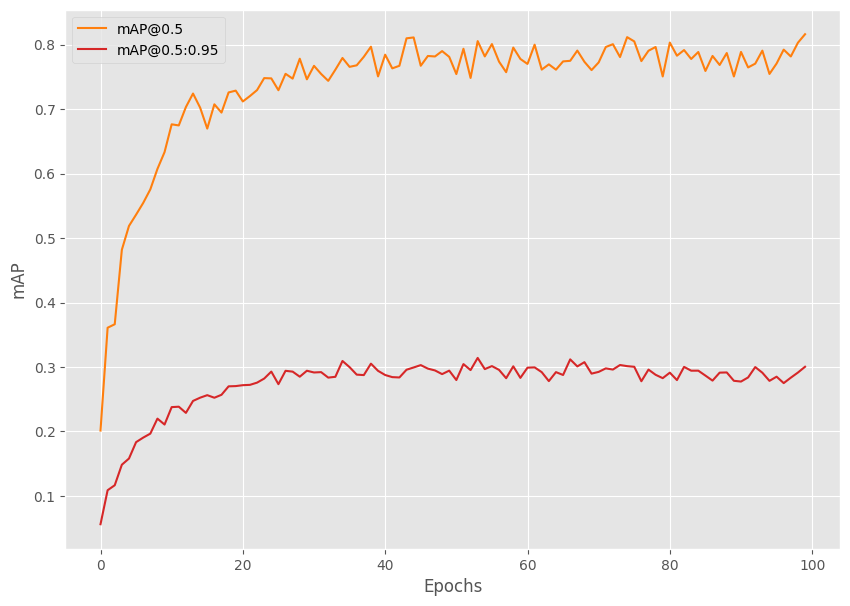

In [ ]:
from tqdm.auto import tqdm
from torchmetrics.detection.mean_ap import MeanAveragePrecision
from torch.optim.lr_scheduler import StepLR
import torch
import matplotlib.pyplot as plt
import time
import os

plt.style.use('ggplot')

seed = 42
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.cuda.manual_seed_all(seed)

# Function for running training iterations.
def train(train_data_loader, model):
    print('Training')
    model.train()

     # initialize tqdm progress bar
    prog_bar = tqdm(train_data_loader, total=len(train_data_loader))

    for i, data in enumerate(prog_bar):
        optimizer.zero_grad()
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]
        loss_dict = model(images, targets)

        losses = sum(loss for loss in loss_dict.values())
        loss_value = losses.item()

        train_loss_hist.send(loss_value)

        losses.backward()
        optimizer.step()

        # update the loss value beside the progress bar for each iteration
        prog_bar.set_description(desc=f"Loss: {loss_value:.4f}")
    return loss_value

# Function for running validation iterations.
def validate(valid_data_loader, model):
    print('Validating')
    model.eval()

    # Initialize tqdm progress bar.
    prog_bar = tqdm(valid_data_loader, total=len(valid_data_loader))
    target = []
    preds = []
    for i, data in enumerate(prog_bar):
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

        with torch.no_grad():
            outputs = model(images, targets)

        # For mAP calculation using Torchmetrics.
        #####################################
        for i in range(len(images)):
            true_dict = dict()
            preds_dict = dict()
            true_dict['boxes'] = targets[i]['boxes'].detach().cpu()
            true_dict['labels'] = targets[i]['labels'].detach().cpu()
            preds_dict['boxes'] = outputs[i]['boxes'].detach().cpu()
            preds_dict['scores'] = outputs[i]['scores'].detach().cpu()
            preds_dict['labels'] = outputs[i]['labels'].detach().cpu()
            preds.append(preds_dict)
            target.append(true_dict)
        #####################################

    metric.reset()
    metric.update(preds, target)
    metric_summary = metric.compute()
    return metric_summary

if __name__ == '__main__':
    os.makedirs('outputs', exist_ok=True)
    train_dataset = create_train_dataset(TRAIN_DIR)
    valid_dataset = create_valid_dataset(VALID_DIR)
    train_loader = create_train_loader(train_dataset, NUM_WORKERS)
    valid_loader = create_valid_loader(valid_dataset, NUM_WORKERS)
    print(f"Number of training samples: {len(train_dataset)}")
    print(f"Number of validation samples: {len(valid_dataset)}\n")

    # Initialize the model and move to the computation device.
    model = create_model(num_classes=NUM_CLASSES)
    model = model.to(DEVICE)
    # print(model)
    # Total parameters and trainable parameters.
    total_params = sum(p.numel() for p in model.parameters())
    print(f"{total_params:,} total parameters.")
    total_trainable_params = sum(
        p.numel() for p in model.parameters() if p.requires_grad)
    print(f"{total_trainable_params:,} training parameters.")
    params = [p for p in model.parameters() if p.requires_grad]
    optimizer = torch.optim.SGD(params, lr=0.001, momentum=0.9, weight_decay=0.0005, nesterov=True)
    scheduler = StepLR(
        optimizer=optimizer, step_size=15, gamma=0.1, verbose=True
    )

    # To monitor training loss
    train_loss_hist = Averager()
    # To store training loss and mAP values.
    train_loss_list = []
    map_50_list = []
    map_list = []

    # Mame to save the trained model with.
    MODEL_NAME = 'model'

    # Whether to show transformed images from data loader or not.
    # if VISUALIZE_TRANSFORMED_IMAGES:
    #     from custom_utils import show_tranformed_image
    #     show_tranformed_image(train_loader)

    # To save best model.
    save_best_model = SaveBestModel()

    metric = MeanAveragePrecision()

    # Training loop.
    for epoch in range(NUM_EPOCHS):
        print(f"\nEPOCH {epoch+1} of {NUM_EPOCHS}")

        # Reset the training loss histories for the current epoch.
        train_loss_hist.reset()

        # Start timer and carry out training and validation.
        start = time.time()
        train_loss = train(train_loader, model)
        metric_summary = validate(valid_loader, model)
        print(f"Epoch #{epoch+1} train loss: {train_loss_hist.value:.3f}")
        print(f"Epoch #{epoch+1} mAP: {metric_summary['map']}")
        end = time.time()
        print(f"Took {((end - start) / 60):.3f} minutes for epoch {epoch}")

        train_loss_list.append(train_loss)
        map_50_list.append(metric_summary['map_50'])
        map_list.append(metric_summary['map'])

        # save the best model till now.
        save_best_model(
            model, float(metric_summary['map_50']), epoch, 'outputs'
        )
        # Save the current epoch model.
        save_model(epoch, model, optimizer)

        # Save loss plot.
        save_loss_plot(OUT_DIR, train_loss_list)

        # Save mAP plot.
        save_mAP(OUT_DIR, map_50_list, map_list)
        # scheduler.step()

In [ ]:
import torch
from tqdm.auto import tqdm
from tqdm import TqdmExperimentalWarning
from torchmetrics.detection.mean_ap import MeanAveragePrecision

# Evaluation function
def validate(valid_data_loader, model):
    model.eval()

    # Initialize tqdm progress bar.
    prog_bar = tqdm(valid_data_loader, total=len(valid_data_loader))
    target = []
    preds = []
    for i, data in enumerate(prog_bar):
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

        with torch.no_grad():
            outputs = model(images, targets)

        # For mAP calculation using Torchmetrics.
        #####################################
        for i in range(len(images)):
            true_dict = dict()
            preds_dict = dict()
            true_dict['boxes'] = targets[i]['boxes'].detach().cpu()
            true_dict['labels'] = targets[i]['labels'].detach().cpu()
            preds_dict['boxes'] = outputs[i]['boxes'].detach().cpu()
            preds_dict['scores'] = outputs[i]['scores'].detach().cpu()
            preds_dict['labels'] = outputs[i]['labels'].detach().cpu()
            preds.append(preds_dict)
            target.append(true_dict)
        #####################################

    metric = MeanAveragePrecision()
    metric.update(preds, target)
    metric_summary = metric.compute()
    return metric_summary

if __name__ == '__main__':
    # Load the best model and trained weights.
    model = create_model(num_classes=NUM_CLASSES)
    checkpoint = torch.load('outputs/best_model.pth', map_location=DEVICE)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.to(DEVICE).eval()

    test_dataset = create_test_dataset(
        '/content/PneumoniaDataset80-20/test'
    )
    test_loader = create_test_loader(test_dataset, num_workers=NUM_WORKERS)

    metric_summary = validate(test_loader, model)
    print(f"mAP_50: {metric_summary['map_50']*100:.3f}")
    print(f"mAP_50_95: {metric_summary['map']*100:.3f}")

  0%|          | 0/60 [00:00<?, ?it/s]

mAP_50: 81.624
mAP_50_95: 30.040


  0%|          | 0/60 [00:00<?, ?it/s]

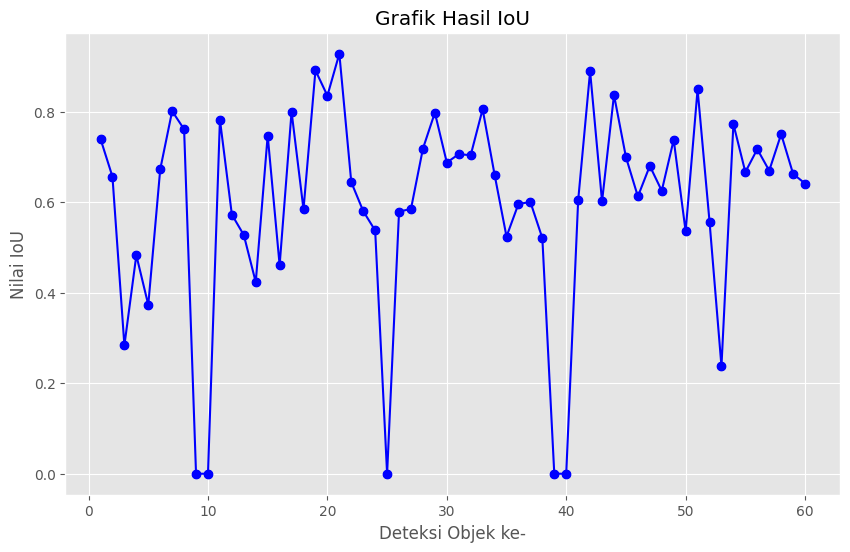

In [ ]:
import shutil
import torch
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
from torchvision.transforms.functional import to_pil_image
from torchvision.ops import box_iou

# Function to calculate Intersection over Union (IoU)
def calculate_iou(box1, box2):
    # Extract coordinates from the bounding box tensors
    box1 = [float(coord) for coord in box1]
    box2 = [float(coord) for coord in box2]

    # Calculate intersection area
    x1_int = max(box1[0], box2[0])
    y1_int = max(box1[1], box2[1])
    x2_int = min(box1[2], box2[2])
    y2_int = min(box1[3], box2[3])

    intersection = max(0, x2_int - x1_int) * max(0, y2_int - y1_int)

    # Calculate union area
    area1 = (box1[2] - box1[0]) * (box1[3] - box1[1])
    area2 = (box2[2] - box2[0]) * (box2[3] - box2[1])
    union = area1 + area2 - intersection

    # Calculate IoU
    iou = intersection / union if union > 0 else 0.0
    return iou

# source_path = "/content/drive/MyDrive/SKRIPSI/Hasil/Model_2/best_model.pth"
# destination_path = "/content/outputs/best_model.pth"

# shutil.copyfile(source_path, destination_path)

def show_iou_graph(images, true_boxes, pred_boxes, threshold=0.5, save_path="/content/iou_graph_model4.png"):
    all_ious = []

    for i in range(len(images)):
        true_boxes_i = true_boxes[i]
        pred_boxes_i = pred_boxes[i]

        ious = []  # To store IoU values for the current image

        for pred_box, score, label in zip(pred_boxes_i['boxes'], pred_boxes_i['scores'], pred_boxes_i['labels']):
            pred_box = [float(b) for b in pred_box]
            if score > threshold:
                # Find the corresponding true bounding box for the label
                true_box = true_boxes_i['boxes'][true_boxes_i['labels'] == label].cpu()
                if len(true_box) > 0:
                    true_box = [float(b) for b in true_box[0]]
                    iou = calculate_iou(pred_box, true_box)
                    ious.append(iou)

        # Store IoU values for the current image
        all_ious.append(ious)

    # Create IoU scatter plot
    plt.figure(figsize=(10, 6))
    plt.scatter(range(1, len(all_ious) + 1), [max(i, default=0) for i in all_ious], color='blue')
    plt.plot(range(1, len(all_ious) + 1), [max(i, default=0) for i in all_ious], linestyle='-', marker='o', color='blue')
    plt.title('Grafik Hasil IoU')
    plt.xlabel('Deteksi Objek ke-')
    plt.ylabel('Nilai IoU')
    plt.savefig(save_path)
    plt.show()

# Update the validate function to return images along with predictions
def validate(valid_data_loader, model):
    model.eval()

    # Initialize tqdm progress bar.
    prog_bar = tqdm(valid_data_loader, total=len(valid_data_loader))
    target = []
    preds = []
    images_list = []

    for i, data in enumerate(prog_bar):
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

        with torch.no_grad():
            outputs = model(images, targets)

        # For mAP calculation using Torchmetrics.
        for i in range(len(images)):
            true_dict = dict()
            preds_dict = dict()
            true_dict['boxes'] = targets[i]['boxes'].detach().cpu()
            true_dict['labels'] = targets[i]['labels'].detach().cpu()
            preds_dict['boxes'] = outputs[i]['boxes'].detach().cpu()
            preds_dict['scores'] = outputs[i]['scores'].detach().cpu()
            preds_dict['labels'] = outputs[i]['labels'].detach().cpu()
            preds.append(preds_dict)
            target.append(true_dict)
            images_list.append(images[i])

    return images_list, preds, target

if __name__ == '__main__':
    model = create_model(num_classes=NUM_CLASSES)
    checkpoint = torch.load('/content/outputs/best_model.pth', map_location=DEVICE)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.to(DEVICE).eval()

    test_dataset = create_test_dataset('/content/PneumoniaDataset80-20/test')
    test_loader = create_test_loader(test_dataset, num_workers=NUM_WORKERS)

    # After calculating metrics, you can display the IoU graph
    images, pred_boxes, true_boxes = validate(test_loader, model)
    # class_names = ['_Background', 'Pneumonia']
    show_iou_graph(images, true_boxes, pred_boxes, save_path='/content/iou_graph_model4.png')

In [ ]:
def make_prediction(model, img, threshold):
    model.eval()
    preds = model(img)
    for id in range(len(preds)) :
        idx_list = []

        for idx, score in enumerate(preds[id]['scores']) :
            if score > threshold :
                idx_list.append(idx)

        preds[id]['boxes'] = preds[id]['boxes'][idx_list]
        preds[id]['labels'] = preds[id]['labels'][idx_list]
        preds[id]['scores'] = preds[id]['scores'][idx_list]

    return preds

def plot_image_from_output(img, annotation):

    img = img.cpu().permute(1,2,0)

    fig,ax = plt.subplots(1)
    ax.imshow(img)

    for idx in range(len(annotation["boxes"])):
        xmin, ymin, xmax, ymax = annotation["boxes"][idx]

        if annotation['labels'][idx] == 1 :
            rect = patches.Rectangle((xmin,ymin),(xmax-xmin),(ymax-ymin),linewidth=1,edgecolor='g',facecolor='none')
        else :
            rect = patches.Rectangle((xmin,ymin),(xmax-xmin),(ymax-ymin),linewidth=1,edgecolor='orange',facecolor='none')

        ax.add_patch(rect)

    plt.show()

In [ ]:
with torch.no_grad():
    print(len(test_loader))
    for imgs, annotations in test_loader:
        imgs = list(img.to(DEVICE) for img in imgs)

        pred = make_prediction(model, imgs, 0.5)
        break

60


({'boxes': tensor([[ 65.0391,  75.5859, 121.8750, 203.3203],
        [166.9922,  78.5156, 239.9414, 211.2305]]), 'labels': tensor([1, 1]), 'area': tensor([7259.9028, 9681.4443]), 'iscrowd': tensor([0, 0]), 'image_id': tensor([0])},)
Target :  tensor([1, 1])


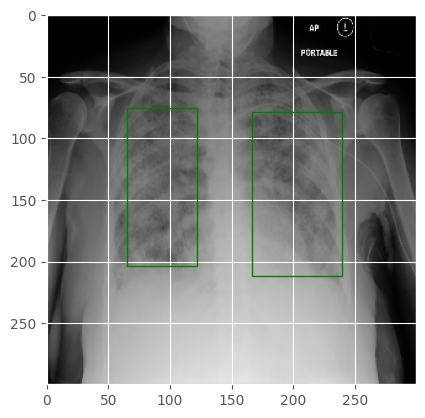

Prediction :  tensor([1, 1], device='cuda:0')
{'boxes': tensor([[ 65.0391,  75.5859, 121.8750, 203.3203],
        [166.9922,  78.5156, 239.9414, 211.2305]]), 'labels': tensor([1, 1]), 'area': tensor([7259.9028, 9681.4443]), 'iscrowd': tensor([0, 0]), 'image_id': tensor([0])}
{'boxes': tensor([[ 60.2748,  65.8153, 131.4813, 203.0678],
        [154.9464,  50.8681, 233.8609, 205.8413]], device='cuda:0'), 'scores': tensor([0.8824, 0.8424], device='cuda:0'), 'labels': tensor([1, 1], device='cuda:0')}


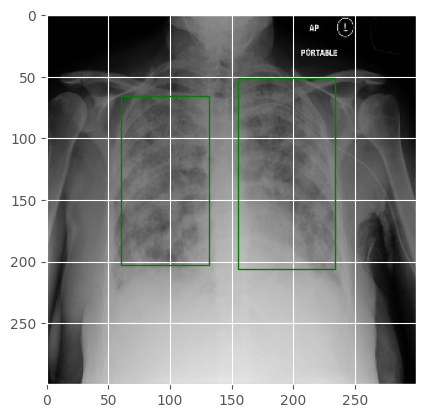

IoU: tensor([[0.7403, 0.0000],
        [0.0000, 0.6355]])


In [ ]:
from torchvision.ops import box_iou
import matplotlib.patches as patches

print(annotations)
_idx = 0
print("Target : ", annotations[_idx]['labels'])
plot_image_from_output(imgs[_idx], annotations[_idx])
print("Prediction : ", pred[_idx]['labels'])
print(annotations[_idx])
print(pred[_idx])

# Create a tensor on the CUDA device
for key in pred[_idx]:
    pred[_idx][key] = pred[_idx][key].cpu()

plot_image_from_output(imgs[_idx], pred[_idx])
iou = box_iou(pred[_idx]['boxes'],annotations[_idx]['boxes'])
print("IoU:", iou)

In [ ]:
from tqdm import tqdm

labels = []
preds_adj_all = []
annot_all = []

for im, annot in tqdm(test_loader, position = 0, leave = True):
    im = list(img.to(DEVICE) for img in im)
    #annot = [{k: v.to(device) for k, v in t.items()} for t in annot]

    for t in annot:
        labels += t['labels']

    with torch.no_grad():
        preds_adj = make_prediction(model, im, 0.5)
        preds_adj = [{k: v.to(torch.device('cpu')) for k, v in t.items()} for t in preds_adj]
        preds_adj_all.append(preds_adj)
        annot_all.append(annot)


100%|██████████| 60/60 [00:02<00:00, 28.73it/s]


In [ ]:
!git clone https://github.com/Pseudo-Lab/Tutorial-Book-Utils
!python Tutorial-Book-Utils/PL_data_loader.py --data FaceMaskDetection

Cloning into 'Tutorial-Book-Utils'...
remote: Enumerating objects: 45, done.
remote: Counting objects: 100% (45/45), done.
remote: Compressing objects: 100% (39/39), done.
remote: Total 45 (delta 18), reused 17 (delta 5), pack-reused 0
Receiving objects: 100% (45/45), 11.62 KiB | 11.62 MiB/s, done.
Resolving deltas: 100% (18/18), done.
Access denied with the following error:

 	Cannot retrieve the public link of the file. You may need to change
	the permission to 'Anyone with the link', or have had many accesses. 

You may still be able to access the file from the browser:

	 https://drive.google.com/uc?id=16Gzn1w38yZLJpzmzKcRIRveFeHZtCEr7 

Face Mask Detection.zip download complete!


In [ ]:
%cd Tutorial-Book-Utils/
import utils_ObjectDetection as utils

/content/Tutorial-Book-Utils


In [ ]:
sample_metrics = []
for batch_i in range(len(preds_adj_all)):
    sample_metrics += utils.get_batch_statistics(preds_adj_all[batch_i], annot_all[batch_i], iou_threshold=0.5)

true_positives, pred_scores, pred_labels = [torch.cat(x, 0) for x in list(zip(*sample_metrics))]  # batch semua disatukan
precision, recall, AP, f1, ap_class = utils.ap_per_class(true_positives, pred_scores, pred_labels, torch.tensor(labels))
mAP = torch.mean(AP)
print(f'mAP : {mAP}')
print(f'AP : {AP}')

mAP : 0.7583758653468475
AP : tensor([0.7584], dtype=torch.float64)


In [ ]:
sample_metrics = []
for batch_i in range(len(preds_adj_all)):
    sample_metrics += utils.get_batch_statistics(preds_adj_all[batch_i], annot_all[batch_i], iou_threshold=0.4)

true_positives, pred_scores, pred_labels = [torch.cat(x, 0) for x in list(zip(*sample_metrics))]  # batch semua disatukan
precision, recall, AP, f1, ap_class = utils.ap_per_class(true_positives, pred_scores, pred_labels, torch.tensor(labels))
mAP = torch.mean(AP)
print(f'mAP : {mAP}')
print(f'AP : {AP}')

mAP : 0.8355847313454579
AP : tensor([0.8356], dtype=torch.float64)


In [ ]:
sample_metrics = []
for batch_i in range(len(preds_adj_all)):
    sample_metrics += utils.get_batch_statistics(preds_adj_all[batch_i], annot_all[batch_i], iou_threshold=0.3)

true_positives, pred_scores, pred_labels = [torch.cat(x, 0) for x in list(zip(*sample_metrics))]  # batch semua disatukan
precision, recall, AP, f1, ap_class = utils.ap_per_class(true_positives, pred_scores, pred_labels, torch.tensor(labels))
mAP = torch.mean(AP)
print(f'mAP : {mAP}')
print(f'AP : {AP}')

mAP : 0.865664340272307
AP : tensor([0.8657], dtype=torch.float64)


In [ ]:
import numpy as np
import cv2
import torch
import glob as glob
import os
import time
import argparse
import csv

os.makedirs('inference_outputs/images', exist_ok=True)

COLORS = np.random.uniform(0, 255, size=(len(CLASSES), 3))

# Load the best model and trained weights.
model = create_model(num_classes=NUM_CLASSES)
checkpoint = torch.load('/content/outputs/best_model.pth', map_location=DEVICE)
model.load_state_dict(checkpoint['model_state_dict'])
model.to(DEVICE).eval()

# Directory where all the images are present.
DIR_TEST = '/content/PneumoniaDataset80-20/test'
test_images = glob.glob(f"{DIR_TEST}/*.jpg")
print(f"Test instances: {len(test_images)}")

frame_count = 0 # To count total frames.
total_fps = 0 # To get the final frames per second.
lung_opacity_files = []

for i in range(len(test_images)):
    # Get the image file name for saving output later on.
    image_name = test_images[i].split(os.path.sep)[-1].split('.')[0]
    image = cv2.imread(test_images[i])
    orig_image = image.copy()
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
    image /= 255.0
    image_input = np.transpose(image, (2, 0, 1)).astype(np.float32)
    image_input = torch.tensor(image_input, dtype=torch.float).cuda()
    image_input = torch.unsqueeze(image_input, 0)
    start_time = time.time()
    # Predictions
    with torch.no_grad():
        outputs = model(image_input.to(DEVICE))
    end_time = time.time()

    # Get the current fps.
    fps = 1 / (end_time - start_time)
    total_fps += fps
    frame_count += 1

    # Load all detection to CPU for further operations.
    outputs = [{k: v.to('cpu') for k, v in t.items()} for t in outputs]
    if len(outputs[0]['boxes']) != 0:
        boxes = outputs[0]['boxes'].data.numpy()
        scores = outputs[0]['scores'].data.numpy()
        boxes = boxes[scores >= 0.6].astype(np.int32)
        draw_boxes = boxes.copy()
        # Get all the predicited class names.
        pred_classes = [CLASSES[i] for i in outputs[0]['labels'].cpu().numpy()]
        # Draw the bounding boxes and write the class name on top of it.
        for j, box in enumerate(draw_boxes):
            print(image_name)
            class_name = pred_classes[j]
            color = COLORS[CLASSES.index(class_name)]
            # Recale boxes.
            xmin = int((box[0] / image.shape[1]) * orig_image.shape[1])
            ymin = int((box[1] / image.shape[0]) * orig_image.shape[0])
            xmax = int((box[2] / image.shape[1]) * orig_image.shape[1])
            ymax = int((box[3] / image.shape[0]) * orig_image.shape[0])
            cv2.rectangle(orig_image,
                        (xmin, ymin),
                        (xmax, ymax),
                        color[::-1],
                        3)
            cv2.putText(orig_image,
                        class_name,
                        (xmin, ymin-5),
                        cv2.FONT_HERSHEY_SIMPLEX,
                        0.8,
                        color[::-1],
                        2,
                        lineType=cv2.LINE_AA)
        plt.imshow(cv2.cvtColor(orig_image, cv2.COLOR_BGR2RGB))
        plt.show()

        # Simpan gambar ke direktori
        # cv2.imwrite(f"inference_outputs/images/{image_name}.jpg", orig_image)
    print(f"Image {i+1} done...")
    print('-'*50)

print('TEST PREDICTIONS COMPLETE')
avg_fps = total_fps / frame_count
print(f"Average FPS: {avg_fps:.3f}")

Output hidden; open in https://colab.research.google.com to view.

# MODEL 5 | BATCH : 8 | LR : 0.001 | 80:20

In [ ]:
import zipfile
import os

zip_file_path = '/content/drive/MyDrive/SKRIPSI/Dataset/PneumoniaDataset80-20.zip'  # Ganti dengan path ke file ZIP Anda
unzip_dir = '/content'  # Ganti dengan direktori di mana Anda ingin mengekstrak file

def extract_zip(zip_file, extract_dir):
    with zipfile.ZipFile(zip_file, 'r') as zip_ref:
        zip_ref.extractall(extract_dir)

def list_files(directory):
    return os.listdir(directory)

# Ekstrak file ZIP
extract_zip(zip_file_path, unzip_dir)

# Tampilkan daftar file yang diekstrak
extracted_files = list_files(unzip_dir)
print(extracted_files)

['.config', 'drive', '__MACOSX', 'PneumoniaDataset80-20', 'sample_data']


In [ ]:
import torch
import os


DEVICE = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

BATCH_SIZE = 8 # Increase / decrease according to GPU memeory.
RESIZE_TO = 300 # Resize the image for training and transforms.
NUM_EPOCHS = 100 # Number of epochs to train for.
NUM_WORKERS = 2 # Number of parallel workers for data loading.

CLASSES = [
    '_background','Lung Opacity'
    # 'helmet','head','person'
]



TRAIN_DIR = '/content/PneumoniaDataset80-20/train'
VALID_DIR = '/content/PneumoniaDataset80-20/test'

# Classes: 0 index is reserved for background.


NUM_CLASSES = len(CLASSES)

# Whether to visualize images after crearing the data loaders.
VISUALIZE_TRANSFORMED_IMAGES = False

# Location to save model and plots.
OUT_DIR = 'outputs'
os.makedirs(OUT_DIR, exist_ok=True)

In [ ]:
import albumentations as A
import cv2
import numpy as np
import torch
import matplotlib.pyplot as plt

from albumentations.pytorch import ToTensorV2


plt.style.use('ggplot')

# This class keeps track of the training and validation loss values
# and helps to get the average for each epoch as well.
class Averager:
    def __init__(self):
        self.current_total = 0.0
        self.iterations = 0.0

    def send(self, value):
        self.current_total += value
        self.iterations += 1

    @property
    def value(self):
        if self.iterations == 0:
            return 0
        else:
            return 1.0 * self.current_total / self.iterations

    def reset(self):
        self.current_total = 0.0
        self.iterations = 0.0

class SaveBestModel:
    """
    Class to save the best model while training. If the current epoch's
    validation mAP @0.5:0.95 IoU higher than the previous highest, then save the
    model state.
    """
    def __init__(
        self, best_valid_map=float(0)
    ):
        self.best_valid_map = best_valid_map

    def __call__(
        self,
        model,
        current_valid_map,
        epoch,
        OUT_DIR,
    ):
        if current_valid_map > self.best_valid_map:
            self.best_valid_map = current_valid_map
            print(f"\nBEST VALIDATION mAP: {self.best_valid_map}")
            print(f"\nSAVING BEST MODEL FOR EPOCH: {epoch+1}\n")
            torch.save({
                'epoch': epoch+1,
                'model_state_dict': model.state_dict(),
                }, f"{OUT_DIR}/best_model.pth")

def collate_fn(batch):
    """
    To handle the data loading as different images may have different number
    of objects and to handle varying size tensors as well.
    """
    return tuple(zip(*batch))

# Define the training tranforms.
def get_train_transform():
    return A.Compose([
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.Rotate(limit=6),
        A.Blur(blur_limit=3, p=0.1),
        A.MotionBlur(blur_limit=3, p=0.1),
        A.MedianBlur(blur_limit=3, p=0.1),
        A.RandomBrightnessContrast(p=0.2),
        ToTensorV2(p=1.0),
    ], bbox_params={
        'format': 'pascal_voc',
        'label_fields': ['labels']
    })


# Define the validation transforms.
def get_valid_transform():
    return A.Compose([
        ToTensorV2(p=1.0),
    ], bbox_params={
        'format': 'pascal_voc',
        'label_fields': ['labels']
    })


def show_tranformed_image(train_loader):
    """
    This function shows the transformed images from the `train_loader`.
    Helps to check whether the tranformed images along with the corresponding
    labels are correct or not.
    Only runs if `VISUALIZE_TRANSFORMED_IMAGES = True` in config.py.
    """
    if len(train_loader) > 0:
        for i in range(1):
            images, targets = next(iter(train_loader))
            images = list(image.to(DEVICE) for image in images)
            targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]
            boxes = targets[i]['boxes'].cpu().numpy().astype(np.int32)
            labels = targets[i]['labels'].cpu().numpy().astype(np.int32)
            sample = images[i].permute(1, 2, 0).cpu().numpy()
            sample = cv2.cvtColor(sample, cv2.COLOR_RGB2BGR)
            for box_num, box in enumerate(boxes):
                cv2.rectangle(sample,
                            (box[0], box[1]),
                            (box[2], box[3]),
                            (0, 0, 255), 2)
                cv2.putText(sample, CLASSES[labels[box_num]],
                            (box[0], box[1]-10), cv2.FONT_HERSHEY_SIMPLEX,
                            1.0, (0, 0, 255), 2)
            cv2.imshow('Transformed image', sample)
            cv2.waitKey(0)
            cv2.destroyAllWindows()

def save_model(epoch, model, optimizer):
    """
    Function to save the trained model till current epoch, or whenver called
    """
    torch.save({
                'epoch': epoch+1,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                }, 'outputs/last_model.pth')

def save_loss_plot(
    OUT_DIR,
    train_loss_list,
    x_label='iterations',
    y_label='train loss',
    save_name='train_loss'
):
    """
    Function to save both train loss graph.

    :param OUT_DIR: Path to save the graphs.
    :param train_loss_list: List containing the training loss values.
    """
    figure_1 = plt.figure(figsize=(10, 7), num=1, clear=True)
    train_ax = figure_1.add_subplot()
    train_ax.plot(train_loss_list, color='tab:blue')
    train_ax.set_xlabel(x_label)
    train_ax.set_ylabel(y_label)
    figure_1.savefig(f"{OUT_DIR}/{save_name}.png")
    print('SAVING PLOTS COMPLETE...')

def save_mAP(OUT_DIR, map_05, map):
    """
    Saves the mAP@0.5 and mAP@0.5:0.95 per epoch.
    :param OUT_DIR: Path to save the graphs.
    :param map_05: List containing mAP values at 0.5 IoU.
    :param map: List containing mAP values at 0.5:0.95 IoU.
    """
    figure = plt.figure(figsize=(10, 7), num=1, clear=True)
    ax = figure.add_subplot()
    ax.plot(
        map_05, color='tab:orange', linestyle='-',
        label='mAP@0.5'
    )
    ax.plot(
        map, color='tab:red', linestyle='-',
        label='mAP@0.5:0.95'
    )
    ax.set_xlabel('Epochs')
    ax.set_ylabel('mAP')
    ax.legend()
    figure.savefig(f"{OUT_DIR}/map.png")

In [ ]:
import torch
import cv2
import numpy as np
import os
import glob as glob
from google.colab.patches import cv2_imshow
from xml.etree import ElementTree as et
from torch.utils.data import Dataset, DataLoader

# The dataset class.
class PneumoniaDataset(Dataset):
    def __init__(self, dir_path, width, height, classes, transforms=None):
        self.transforms = transforms
        self.dir_path = dir_path
        self.height = height
        self.width = width
        self.classes = classes
        self.image_file_types = ['*.jpg', '*.jpeg', '*.png', '*.ppm', '*.JPG']
        self.all_image_paths = []

        # Get all the image paths in sorted order.
        for file_type in self.image_file_types:
            self.all_image_paths.extend(glob.glob(os.path.join(self.dir_path, file_type)))
        self.all_images = [image_path.split(os.path.sep)[-1] for image_path in self.all_image_paths]
        self.all_images = sorted(self.all_images)

    def __getitem__(self, idx):
        # Capture the image name and the full image path.
        image_name = self.all_images[idx]
        image_path = os.path.join(self.dir_path, image_name)

        # Read and preprocess the image.
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
        image_resized = cv2.resize(image, (self.width, self.height))
        image_resized /= 255.0

        # Capture the corresponding XML file for getting the annotations.
        annot_filename = os.path.splitext(image_name)[0] + '.xml'
        annot_file_path = os.path.join(self.dir_path, annot_filename)

        boxes = []
        labels = []
        tree = et.parse(annot_file_path)
        root = tree.getroot()

        # Original image width and height.
        image_width = image.shape[1]
        image_height = image.shape[0]

        # Box coordinates for xml files are extracted
        # and corrected for image size given.
        for member in root.findall('object'):
            # Get label and map the `classes`.
            labels.append(self.classes.index(member.find('name').text))

            # Left corner x-coordinates.
            xmin = int(member.find('bndbox').find('xmin').text)
            # Right corner x-coordinates.
            xmax = int(member.find('bndbox').find('xmax').text)
            # Left corner y-coordinates.
            ymin = int(member.find('bndbox').find('ymin').text)
            # Right corner y-coordinates.
            ymax = int(member.find('bndbox').find('ymax').text)

            # Resize the bounding boxes according
            # to resized image `width`, `height`.
            xmin_final = (xmin/image_width)*self.width
            xmax_final = (xmax/image_width)*self.width
            ymin_final = (ymin/image_height)*self.height
            ymax_final = (ymax/image_height)*self.height

            # Check that max coordinates are at least one pixel
            # larger than min coordinates.
            if xmax_final == xmin_final:
                xmax_final += 1
            if ymax_final == ymin_final:
                ymax_final += 1
            # Check that all coordinates are within the image.
            if xmax_final > self.width:
                xmax_final = self.width
            if ymax_final > self.height:
                ymax_final = self.height

            boxes.append([xmin_final, ymin_final, xmax_final, ymax_final])

        # Bounding box to tensor.
        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        # Area of the bounding boxes.
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0]) if len(boxes) > 0 \
            else torch.as_tensor(boxes, dtype=torch.float32)
        # No crowd instances.
        iscrowd = torch.zeros((boxes.shape[0],), dtype=torch.int64)
        # Labels to tensor.
        labels = torch.as_tensor(labels, dtype=torch.int64)

        # Prepare the final `target` dictionary.
        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["area"] = area
        target["iscrowd"] = iscrowd
        image_id = torch.tensor([idx])
        target["image_id"] = image_id

        # Apply the image transforms.
        if self.transforms:
            sample = self.transforms(image = image_resized,
                                     bboxes = target['boxes'],
                                     labels = labels)
            image_resized = sample['image']
            target['boxes'] = torch.Tensor(sample['bboxes'])

        if np.isnan((target['boxes']).numpy()).any() or target['boxes'].shape == torch.Size([0]):
            target['boxes'] = torch.zeros((0, 4), dtype=torch.int64)
        return image_resized, target

    def __len__(self):
        return len(self.all_images)
        # return 500;

# Prepare the final datasets and data loaders.
def create_train_dataset(DIR):
    train_dataset = PneumoniaDataset(
        DIR, RESIZE_TO, RESIZE_TO, CLASSES, get_train_transform()
    )
    return train_dataset
def create_valid_dataset(DIR):
    valid_dataset = PneumoniaDataset(
        DIR, RESIZE_TO, RESIZE_TO, CLASSES, get_valid_transform()
    )
    return valid_dataset
def create_test_dataset(DIR):
    test_dataset = PneumoniaDataset(
        DIR, RESIZE_TO, RESIZE_TO, CLASSES, get_valid_transform()
    )
    return test_dataset
def create_train_loader(train_dataset, num_workers=0):
    train_loader = DataLoader(
        train_dataset,
        batch_size=BATCH_SIZE,
        shuffle=True,
        num_workers=num_workers,
        collate_fn=collate_fn,
        drop_last=True
    )
    return train_loader
def create_valid_loader(valid_dataset, num_workers=0):
    valid_loader = DataLoader(
        valid_dataset,
        batch_size=BATCH_SIZE,
        shuffle=False,
        num_workers=num_workers,
        collate_fn=collate_fn,
        drop_last=True
    )
    return valid_loader
def create_test_loader(test_dataset, num_workers=0):
    test_loader = DataLoader(
        test_dataset,
        batch_size=1,
        shuffle=False,
        num_workers=num_workers,
        collate_fn=collate_fn,
        drop_last=True
    )
    return test_loader


In [ ]:
import torchvision
import torch

from functools import partial
from torchvision.models.detection import RetinaNet
from torchvision.models.detection.backbone_utils import resnet_fpn_backbone
from torchvision.models.detection.retinanet import RetinaNetClassificationHead
from torchvision.models.detection import RetinaNet_ResNet50_FPN_V2_Weights
from torchvision.models.detection.retinanet import RetinaNetClassificationHead

def create_model(num_classes):
    model = torchvision.models.detection.retinanet_resnet50_fpn_v2(
        weights=RetinaNet_ResNet50_FPN_V2_Weights.COCO_V1
    )
    num_anchors = model.head.classification_head.num_anchors

    model.head.classification_head = RetinaNetClassificationHead(
        in_channels=256,
        num_anchors=num_anchors,
        num_classes=num_classes,
        norm_layer=partial(torch.nn.GroupNorm, 32)
    )
    return model

if __name__ == '__main__':
    model = create_model(2)
    # print(model)
    # Total parameters and trainable parameters.
    total_params = sum(p.numel() for p in model.parameters())
    print(f"{total_params:,} total parameters.")
    total_trainable_params = sum(
        p.numel() for p in model.parameters() if p.requires_grad)
    print(f"{total_trainable_params:,} training parameters.")

Downloading: "https://download.pytorch.org/models/retinanet_resnet50_fpn_v2_coco-5905b1c5.pth" to /root/.cache/torch/hub/checkpoints/retinanet_resnet50_fpn_v2_coco-5905b1c5.pth
100%|██████████| 146M/146M [00:00<00:00, 176MB/s]


36,352,630 total parameters.
36,127,286 training parameters.


In [ ]:
!pip install torchmetrics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 840.2/840.2 kB 5.6 MB/s eta 0:00:00


Number of training samples: 240
Number of validation samples: 60

36,352,630 total parameters.
36,127,286 training parameters.
Adjusting learning rate of group 0 to 1.0000e-03.

EPOCH 1 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torchmetrics/utilities/prints.py:43: UserWarning: Encountered more than 100 detections in a single image. This means that certain detections with the lowest scores will be ignored, that may have an undesirable impact on performance. Please consider adjusting the `max_detection_threshold` to suit your use case. To disable this warning, set attribute class `warn_on_many_detections=False`, after initializing the metric.
  warnings.warn(*args, **kwargs)  # noqa: B028


Epoch #1 train loss: 1.192
Epoch #1 mAP: 0.037077028304338455
Took 0.199 minutes for epoch 0

BEST VALIDATION mAP: 0.12057670205831528

SAVING BEST MODEL FOR EPOCH: 1

SAVING PLOTS COMPLETE...

EPOCH 2 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #2 train loss: 0.864
Epoch #2 mAP: 0.055720359086990356
Took 0.645 minutes for epoch 1

BEST VALIDATION mAP: 0.19213712215423584

SAVING BEST MODEL FOR EPOCH: 2

SAVING PLOTS COMPLETE...

EPOCH 3 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #3 train loss: 0.808
Epoch #3 mAP: 0.08157063275575638
Took 0.141 minutes for epoch 2

BEST VALIDATION mAP: 0.29747188091278076

SAVING BEST MODEL FOR EPOCH: 3

SAVING PLOTS COMPLETE...

EPOCH 4 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #4 train loss: 0.770
Epoch #4 mAP: 0.11146789789199829
Took 0.140 minutes for epoch 3

BEST VALIDATION mAP: 0.4194764792919159

SAVING BEST MODEL FOR EPOCH: 4

SAVING PLOTS COMPLETE...

EPOCH 5 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #5 train loss: 0.757
Epoch #5 mAP: 0.12669117748737335
Took 0.142 minutes for epoch 4
SAVING PLOTS COMPLETE...

EPOCH 6 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #6 train loss: 0.733
Epoch #6 mAP: 0.13816818594932556
Took 1.316 minutes for epoch 5

BEST VALIDATION mAP: 0.429406076669693

SAVING BEST MODEL FOR EPOCH: 6

SAVING PLOTS COMPLETE...

EPOCH 7 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #7 train loss: 0.715
Epoch #7 mAP: 0.1359400749206543
Took 0.139 minutes for epoch 6

BEST VALIDATION mAP: 0.4466842710971832

SAVING BEST MODEL FOR EPOCH: 7

SAVING PLOTS COMPLETE...

EPOCH 8 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #8 train loss: 0.699
Epoch #8 mAP: 0.15839362144470215
Took 0.139 minutes for epoch 7

BEST VALIDATION mAP: 0.5240281820297241

SAVING BEST MODEL FOR EPOCH: 8

SAVING PLOTS COMPLETE...

EPOCH 9 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #9 train loss: 0.684
Epoch #9 mAP: 0.1628025770187378
Took 0.139 minutes for epoch 8

BEST VALIDATION mAP: 0.563035786151886

SAVING BEST MODEL FOR EPOCH: 9

SAVING PLOTS COMPLETE...

EPOCH 10 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #10 train loss: 0.688
Epoch #10 mAP: 0.16258546710014343
Took 0.140 minutes for epoch 9
SAVING PLOTS COMPLETE...

EPOCH 11 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #11 train loss: 0.668
Epoch #11 mAP: 0.1838015615940094
Took 0.139 minutes for epoch 10

BEST VALIDATION mAP: 0.5781587958335876

SAVING BEST MODEL FOR EPOCH: 11

SAVING PLOTS COMPLETE...

EPOCH 12 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #12 train loss: 0.662
Epoch #12 mAP: 0.19874729216098785
Took 0.140 minutes for epoch 11

BEST VALIDATION mAP: 0.6179901361465454

SAVING BEST MODEL FOR EPOCH: 12

SAVING PLOTS COMPLETE...

EPOCH 13 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #13 train loss: 0.655
Epoch #13 mAP: 0.17507131397724152
Took 0.139 minutes for epoch 12
SAVING PLOTS COMPLETE...

EPOCH 14 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #14 train loss: 0.644
Epoch #14 mAP: 0.194148987531662
Took 0.139 minutes for epoch 13
SAVING PLOTS COMPLETE...

EPOCH 15 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #15 train loss: 0.629
Epoch #15 mAP: 0.2051684558391571
Took 1.645 minutes for epoch 14
SAVING PLOTS COMPLETE...

EPOCH 16 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #16 train loss: 0.633
Epoch #16 mAP: 0.1917688399553299
Took 0.139 minutes for epoch 15
SAVING PLOTS COMPLETE...

EPOCH 17 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #17 train loss: 0.628
Epoch #17 mAP: 0.20510247349739075
Took 0.139 minutes for epoch 16

BEST VALIDATION mAP: 0.6328310370445251

SAVING BEST MODEL FOR EPOCH: 17

SAVING PLOTS COMPLETE...

EPOCH 18 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #18 train loss: 0.611
Epoch #18 mAP: 0.20245657861232758
Took 0.137 minutes for epoch 17
SAVING PLOTS COMPLETE...

EPOCH 19 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #19 train loss: 0.618
Epoch #19 mAP: 0.21152645349502563
Took 0.140 minutes for epoch 18
SAVING PLOTS COMPLETE...

EPOCH 20 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #20 train loss: 0.606
Epoch #20 mAP: 0.20768237113952637
Took 0.139 minutes for epoch 19

BEST VALIDATION mAP: 0.6457791328430176

SAVING BEST MODEL FOR EPOCH: 20

SAVING PLOTS COMPLETE...

EPOCH 21 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #21 train loss: 0.597
Epoch #21 mAP: 0.22149571776390076
Took 1.980 minutes for epoch 20

BEST VALIDATION mAP: 0.6569026112556458

SAVING BEST MODEL FOR EPOCH: 21

SAVING PLOTS COMPLETE...

EPOCH 22 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #22 train loss: 0.595
Epoch #22 mAP: 0.23215538263320923
Took 0.138 minutes for epoch 21

BEST VALIDATION mAP: 0.6792030334472656

SAVING BEST MODEL FOR EPOCH: 22

SAVING PLOTS COMPLETE...

EPOCH 23 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #23 train loss: 0.596
Epoch #23 mAP: 0.22013814747333527
Took 0.140 minutes for epoch 22
SAVING PLOTS COMPLETE...

EPOCH 24 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #24 train loss: 0.593
Epoch #24 mAP: 0.2399442344903946
Took 0.138 minutes for epoch 23
SAVING PLOTS COMPLETE...

EPOCH 25 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #25 train loss: 0.585
Epoch #25 mAP: 0.23697257041931152
Took 0.139 minutes for epoch 24
SAVING PLOTS COMPLETE...

EPOCH 26 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #26 train loss: 0.581
Epoch #26 mAP: 0.21958568692207336
Took 0.139 minutes for epoch 25
SAVING PLOTS COMPLETE...

EPOCH 27 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #27 train loss: 0.577
Epoch #27 mAP: 0.23553965985774994
Took 2.310 minutes for epoch 26
SAVING PLOTS COMPLETE...

EPOCH 28 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #28 train loss: 0.570
Epoch #28 mAP: 0.2356349676847458
Took 0.136 minutes for epoch 27
SAVING PLOTS COMPLETE...

EPOCH 29 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #29 train loss: 0.566
Epoch #29 mAP: 0.24516643583774567
Took 0.137 minutes for epoch 28

BEST VALIDATION mAP: 0.6920347809791565

SAVING BEST MODEL FOR EPOCH: 29

SAVING PLOTS COMPLETE...

EPOCH 30 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #30 train loss: 0.564
Epoch #30 mAP: 0.24788670241832733
Took 0.138 minutes for epoch 29

BEST VALIDATION mAP: 0.7123811841011047

SAVING BEST MODEL FOR EPOCH: 30

SAVING PLOTS COMPLETE...

EPOCH 31 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #31 train loss: 0.557
Epoch #31 mAP: 0.25806963443756104
Took 0.137 minutes for epoch 30
SAVING PLOTS COMPLETE...

EPOCH 32 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #32 train loss: 0.556
Epoch #32 mAP: 0.2512568533420563
Took 0.137 minutes for epoch 31
SAVING PLOTS COMPLETE...

EPOCH 33 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #33 train loss: 0.559
Epoch #33 mAP: 0.25110942125320435
Took 0.138 minutes for epoch 32

BEST VALIDATION mAP: 0.7131236791610718

SAVING BEST MODEL FOR EPOCH: 33

SAVING PLOTS COMPLETE...

EPOCH 34 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #34 train loss: 0.550
Epoch #34 mAP: 0.2531052529811859
Took 2.311 minutes for epoch 33
SAVING PLOTS COMPLETE...

EPOCH 35 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #35 train loss: 0.550
Epoch #35 mAP: 0.2556202709674835
Took 0.137 minutes for epoch 34
SAVING PLOTS COMPLETE...

EPOCH 36 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #36 train loss: 0.538
Epoch #36 mAP: 0.24543800950050354
Took 0.137 minutes for epoch 35

BEST VALIDATION mAP: 0.725640594959259

SAVING BEST MODEL FOR EPOCH: 36

SAVING PLOTS COMPLETE...

EPOCH 37 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #37 train loss: 0.536
Epoch #37 mAP: 0.2528548240661621
Took 0.138 minutes for epoch 36
SAVING PLOTS COMPLETE...

EPOCH 38 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #38 train loss: 0.540
Epoch #38 mAP: 0.24745167791843414
Took 0.139 minutes for epoch 37
SAVING PLOTS COMPLETE...

EPOCH 39 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #39 train loss: 0.532
Epoch #39 mAP: 0.2576068043708801
Took 0.138 minutes for epoch 38
SAVING PLOTS COMPLETE...

EPOCH 40 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #40 train loss: 0.526
Epoch #40 mAP: 0.2568410634994507
Took 0.138 minutes for epoch 39
SAVING PLOTS COMPLETE...

EPOCH 41 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #41 train loss: 0.515
Epoch #41 mAP: 0.25450024008750916
Took 2.478 minutes for epoch 40

BEST VALIDATION mAP: 0.7372565269470215

SAVING BEST MODEL FOR EPOCH: 41

SAVING PLOTS COMPLETE...

EPOCH 42 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #42 train loss: 0.524
Epoch #42 mAP: 0.2551041841506958
Took 0.137 minutes for epoch 41
SAVING PLOTS COMPLETE...

EPOCH 43 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #43 train loss: 0.519
Epoch #43 mAP: 0.2469799965620041
Took 0.137 minutes for epoch 42
SAVING PLOTS COMPLETE...

EPOCH 44 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #44 train loss: 0.517
Epoch #44 mAP: 0.25887244939804077
Took 0.138 minutes for epoch 43
SAVING PLOTS COMPLETE...

EPOCH 45 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #45 train loss: 0.515
Epoch #45 mAP: 0.2605125904083252
Took 0.136 minutes for epoch 44
SAVING PLOTS COMPLETE...

EPOCH 46 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #46 train loss: 0.511
Epoch #46 mAP: 0.25964421033859253
Took 0.137 minutes for epoch 45
SAVING PLOTS COMPLETE...

EPOCH 47 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #47 train loss: 0.510
Epoch #47 mAP: 0.26365387439727783
Took 0.136 minutes for epoch 46

BEST VALIDATION mAP: 0.7550275325775146

SAVING BEST MODEL FOR EPOCH: 47

SAVING PLOTS COMPLETE...

EPOCH 48 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #48 train loss: 0.500
Epoch #48 mAP: 0.25846073031425476
Took 2.644 minutes for epoch 47
SAVING PLOTS COMPLETE...

EPOCH 49 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #49 train loss: 0.504
Epoch #49 mAP: 0.26391854882240295
Took 0.137 minutes for epoch 48
SAVING PLOTS COMPLETE...

EPOCH 50 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #50 train loss: 0.499
Epoch #50 mAP: 0.2538231313228607
Took 0.137 minutes for epoch 49
SAVING PLOTS COMPLETE...

EPOCH 51 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #51 train loss: 0.493
Epoch #51 mAP: 0.2621115744113922
Took 0.136 minutes for epoch 50
SAVING PLOTS COMPLETE...

EPOCH 52 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #52 train loss: 0.498
Epoch #52 mAP: 0.26123932003974915
Took 0.138 minutes for epoch 51
SAVING PLOTS COMPLETE...

EPOCH 53 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #53 train loss: 0.494
Epoch #53 mAP: 0.26500973105430603
Took 0.136 minutes for epoch 52
SAVING PLOTS COMPLETE...

EPOCH 54 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #54 train loss: 0.491
Epoch #54 mAP: 0.26235058903694153
Took 0.137 minutes for epoch 53
SAVING PLOTS COMPLETE...

EPOCH 55 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #55 train loss: 0.488
Epoch #55 mAP: 0.2556167542934418
Took 0.138 minutes for epoch 54
SAVING PLOTS COMPLETE...

EPOCH 56 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #56 train loss: 0.488
Epoch #56 mAP: 0.25884056091308594
Took 0.136 minutes for epoch 55
SAVING PLOTS COMPLETE...

EPOCH 57 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #57 train loss: 0.479
Epoch #57 mAP: 0.2688238322734833
Took 0.136 minutes for epoch 56

BEST VALIDATION mAP: 0.7678176164627075

SAVING BEST MODEL FOR EPOCH: 57

SAVING PLOTS COMPLETE...

EPOCH 58 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #58 train loss: 0.473
Epoch #58 mAP: 0.25210508704185486
Took 0.137 minutes for epoch 57
SAVING PLOTS COMPLETE...

EPOCH 59 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #59 train loss: 0.492
Epoch #59 mAP: 0.2554794251918793
Took 0.137 minutes for epoch 58
SAVING PLOTS COMPLETE...

EPOCH 60 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #60 train loss: 0.474
Epoch #60 mAP: 0.265593558549881
Took 0.136 minutes for epoch 59
SAVING PLOTS COMPLETE...

EPOCH 61 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #61 train loss: 0.473
Epoch #61 mAP: 0.2710517644882202
Took 0.136 minutes for epoch 60
SAVING PLOTS COMPLETE...

EPOCH 62 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #62 train loss: 0.467
Epoch #62 mAP: 0.28460755944252014
Took 0.137 minutes for epoch 61
SAVING PLOTS COMPLETE...

EPOCH 63 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #63 train loss: 0.479
Epoch #63 mAP: 0.2606738805770874
Took 0.137 minutes for epoch 62
SAVING PLOTS COMPLETE...

EPOCH 64 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #64 train loss: 0.469
Epoch #64 mAP: 0.2639215588569641
Took 2.478 minutes for epoch 63
SAVING PLOTS COMPLETE...

EPOCH 65 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #65 train loss: 0.482
Epoch #65 mAP: 0.2754240930080414
Took 0.136 minutes for epoch 64
SAVING PLOTS COMPLETE...

EPOCH 66 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #66 train loss: 0.466
Epoch #66 mAP: 0.25935402512550354
Took 0.136 minutes for epoch 65
SAVING PLOTS COMPLETE...

EPOCH 67 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #67 train loss: 0.455
Epoch #67 mAP: 0.26461419463157654
Took 0.137 minutes for epoch 66
SAVING PLOTS COMPLETE...

EPOCH 68 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #68 train loss: 0.457
Epoch #68 mAP: 0.2603018581867218
Took 0.136 minutes for epoch 67
SAVING PLOTS COMPLETE...

EPOCH 69 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #69 train loss: 0.453
Epoch #69 mAP: 0.25965407490730286
Took 0.137 minutes for epoch 68
SAVING PLOTS COMPLETE...

EPOCH 70 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #70 train loss: 0.461
Epoch #70 mAP: 0.2668452262878418
Took 0.136 minutes for epoch 69
SAVING PLOTS COMPLETE...

EPOCH 71 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #71 train loss: 0.455
Epoch #71 mAP: 0.25065064430236816
Took 0.135 minutes for epoch 70
SAVING PLOTS COMPLETE...

EPOCH 72 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #72 train loss: 0.443
Epoch #72 mAP: 0.26027408242225647
Took 0.134 minutes for epoch 71
SAVING PLOTS COMPLETE...

EPOCH 73 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #73 train loss: 0.444
Epoch #73 mAP: 0.24763530492782593
Took 0.137 minutes for epoch 72
SAVING PLOTS COMPLETE...

EPOCH 74 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #74 train loss: 0.445
Epoch #74 mAP: 0.24517954885959625
Took 0.135 minutes for epoch 73
SAVING PLOTS COMPLETE...

EPOCH 75 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #75 train loss: 0.446
Epoch #75 mAP: 0.2446492314338684
Took 0.136 minutes for epoch 74
SAVING PLOTS COMPLETE...

EPOCH 76 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #76 train loss: 0.432
Epoch #76 mAP: 0.2585850656032562
Took 0.135 minutes for epoch 75
SAVING PLOTS COMPLETE...

EPOCH 77 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #77 train loss: 0.430
Epoch #77 mAP: 0.2718316614627838
Took 0.136 minutes for epoch 76
SAVING PLOTS COMPLETE...

EPOCH 78 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #78 train loss: 0.429
Epoch #78 mAP: 0.26778191328048706
Took 0.137 minutes for epoch 77
SAVING PLOTS COMPLETE...

EPOCH 79 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #79 train loss: 0.434
Epoch #79 mAP: 0.2631106972694397
Took 0.136 minutes for epoch 78
SAVING PLOTS COMPLETE...

EPOCH 80 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #80 train loss: 0.438
Epoch #80 mAP: 0.2685135006904602
Took 0.136 minutes for epoch 79
SAVING PLOTS COMPLETE...

EPOCH 81 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #81 train loss: 0.426
Epoch #81 mAP: 0.25883564352989197
Took 0.137 minutes for epoch 80
SAVING PLOTS COMPLETE...

EPOCH 82 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #82 train loss: 0.425
Epoch #82 mAP: 0.2638346254825592
Took 0.137 minutes for epoch 81
SAVING PLOTS COMPLETE...

EPOCH 83 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #83 train loss: 0.427
Epoch #83 mAP: 0.2779199779033661
Took 0.136 minutes for epoch 82
SAVING PLOTS COMPLETE...

EPOCH 84 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #84 train loss: 0.427
Epoch #84 mAP: 0.2778429687023163
Took 0.137 minutes for epoch 83
SAVING PLOTS COMPLETE...

EPOCH 85 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #85 train loss: 0.415
Epoch #85 mAP: 0.27770665287971497
Took 0.136 minutes for epoch 84

BEST VALIDATION mAP: 0.7684134244918823

SAVING BEST MODEL FOR EPOCH: 85

SAVING PLOTS COMPLETE...

EPOCH 86 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #86 train loss: 0.419
Epoch #86 mAP: 0.27717795968055725
Took 0.136 minutes for epoch 85
SAVING PLOTS COMPLETE...

EPOCH 87 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #87 train loss: 0.416
Epoch #87 mAP: 0.27406689524650574
Took 0.136 minutes for epoch 86
SAVING PLOTS COMPLETE...

EPOCH 88 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #88 train loss: 0.409
Epoch #88 mAP: 0.2819949984550476
Took 0.136 minutes for epoch 87

BEST VALIDATION mAP: 0.7739081978797913

SAVING BEST MODEL FOR EPOCH: 88

SAVING PLOTS COMPLETE...

EPOCH 89 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #89 train loss: 0.405
Epoch #89 mAP: 0.263959676027298
Took 0.135 minutes for epoch 88
SAVING PLOTS COMPLETE...

EPOCH 90 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #90 train loss: 0.408
Epoch #90 mAP: 0.27706924080848694
Took 0.136 minutes for epoch 89
SAVING PLOTS COMPLETE...

EPOCH 91 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7c50c4b97a30>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7c50c4b97a30>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
        assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
Exception ignored in: <function _Multi

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #91 train loss: 0.410
Epoch #91 mAP: 0.28013402223587036
Took 0.156 minutes for epoch 90
SAVING PLOTS COMPLETE...

EPOCH 92 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #92 train loss: 0.406
Epoch #92 mAP: 0.27173471450805664
Took 0.136 minutes for epoch 91

BEST VALIDATION mAP: 0.7786225080490112

SAVING BEST MODEL FOR EPOCH: 92

SAVING PLOTS COMPLETE...

EPOCH 93 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #93 train loss: 0.391
Epoch #93 mAP: 0.26943835616111755
Took 0.136 minutes for epoch 92
SAVING PLOTS COMPLETE...

EPOCH 94 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #94 train loss: 0.407
Epoch #94 mAP: 0.27510932087898254
Took 0.135 minutes for epoch 93
SAVING PLOTS COMPLETE...

EPOCH 95 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #95 train loss: 0.391
Epoch #95 mAP: 0.27138882875442505
Took 0.136 minutes for epoch 94
SAVING PLOTS COMPLETE...

EPOCH 96 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #96 train loss: 0.401
Epoch #96 mAP: 0.27158865332603455
Took 0.136 minutes for epoch 95
SAVING PLOTS COMPLETE...

EPOCH 97 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #97 train loss: 0.396
Epoch #97 mAP: 0.2773560583591461
Took 0.137 minutes for epoch 96

BEST VALIDATION mAP: 0.7826166152954102

SAVING BEST MODEL FOR EPOCH: 97

SAVING PLOTS COMPLETE...

EPOCH 98 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #98 train loss: 0.402
Epoch #98 mAP: 0.2728044092655182
Took 0.137 minutes for epoch 97
SAVING PLOTS COMPLETE...

EPOCH 99 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #99 train loss: 0.392
Epoch #99 mAP: 0.2782221734523773
Took 0.135 minutes for epoch 98
SAVING PLOTS COMPLETE...

EPOCH 100 of 100
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #100 train loss: 0.401
Epoch #100 mAP: 0.2664521634578705
Took 0.136 minutes for epoch 99
SAVING PLOTS COMPLETE...


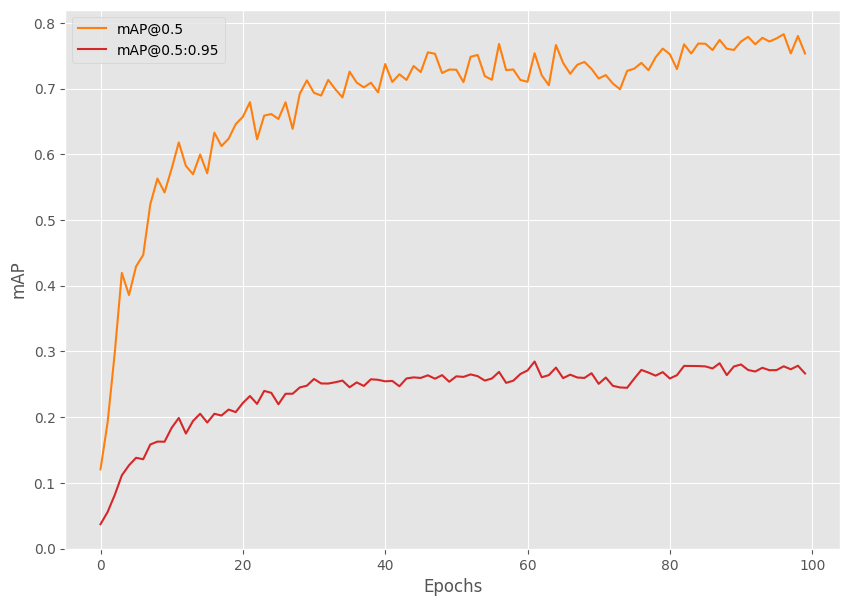

In [ ]:
from tqdm.auto import tqdm
from torchmetrics.detection.mean_ap import MeanAveragePrecision
from torch.optim.lr_scheduler import StepLR
import torch
import matplotlib.pyplot as plt
import time
import os

plt.style.use('ggplot')

seed = 42
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.cuda.manual_seed_all(seed)

# Function for running training iterations.
def train(train_data_loader, model):
    print('Training')
    model.train()

     # initialize tqdm progress bar
    prog_bar = tqdm(train_data_loader, total=len(train_data_loader))

    for i, data in enumerate(prog_bar):
        optimizer.zero_grad()
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]
        loss_dict = model(images, targets)

        losses = sum(loss for loss in loss_dict.values())
        loss_value = losses.item()

        train_loss_hist.send(loss_value)

        losses.backward()
        optimizer.step()

        # update the loss value beside the progress bar for each iteration
        prog_bar.set_description(desc=f"Loss: {loss_value:.4f}")
    return loss_value

# Function for running validation iterations.
def validate(valid_data_loader, model):
    print('Validating')
    model.eval()

    # Initialize tqdm progress bar.
    prog_bar = tqdm(valid_data_loader, total=len(valid_data_loader))
    target = []
    preds = []
    for i, data in enumerate(prog_bar):
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

        with torch.no_grad():
            outputs = model(images, targets)

        # For mAP calculation using Torchmetrics.
        #####################################
        for i in range(len(images)):
            true_dict = dict()
            preds_dict = dict()
            true_dict['boxes'] = targets[i]['boxes'].detach().cpu()
            true_dict['labels'] = targets[i]['labels'].detach().cpu()
            preds_dict['boxes'] = outputs[i]['boxes'].detach().cpu()
            preds_dict['scores'] = outputs[i]['scores'].detach().cpu()
            preds_dict['labels'] = outputs[i]['labels'].detach().cpu()
            preds.append(preds_dict)
            target.append(true_dict)
        #####################################

    metric.reset()
    metric.update(preds, target)
    metric_summary = metric.compute()
    return metric_summary

if __name__ == '__main__':
    os.makedirs('outputs', exist_ok=True)
    train_dataset = create_train_dataset(TRAIN_DIR)
    valid_dataset = create_valid_dataset(VALID_DIR)
    train_loader = create_train_loader(train_dataset, NUM_WORKERS)
    valid_loader = create_valid_loader(valid_dataset, NUM_WORKERS)
    print(f"Number of training samples: {len(train_dataset)}")
    print(f"Number of validation samples: {len(valid_dataset)}\n")

    # Initialize the model and move to the computation device.
    model = create_model(num_classes=NUM_CLASSES)
    model = model.to(DEVICE)
    # print(model)
    # Total parameters and trainable parameters.
    total_params = sum(p.numel() for p in model.parameters())
    print(f"{total_params:,} total parameters.")
    total_trainable_params = sum(
        p.numel() for p in model.parameters() if p.requires_grad)
    print(f"{total_trainable_params:,} training parameters.")
    params = [p for p in model.parameters() if p.requires_grad]
    optimizer = torch.optim.SGD(params, lr=0.001, momentum=0.9, weight_decay=0.0005, nesterov=True)
    scheduler = StepLR(
        optimizer=optimizer, step_size=15, gamma=0.1, verbose=True
    )

    # To monitor training loss
    train_loss_hist = Averager()
    # To store training loss and mAP values.
    train_loss_list = []
    map_50_list = []
    map_list = []

    # Mame to save the trained model with.
    MODEL_NAME = 'model'

    # Whether to show transformed images from data loader or not.
    # if VISUALIZE_TRANSFORMED_IMAGES:
    #     from custom_utils import show_tranformed_image
    #     show_tranformed_image(train_loader)

    # To save best model.
    save_best_model = SaveBestModel()

    metric = MeanAveragePrecision()

    # Training loop.
    for epoch in range(NUM_EPOCHS):
        print(f"\nEPOCH {epoch+1} of {NUM_EPOCHS}")

        # Reset the training loss histories for the current epoch.
        train_loss_hist.reset()

        # Start timer and carry out training and validation.
        start = time.time()
        train_loss = train(train_loader, model)
        metric_summary = validate(valid_loader, model)
        print(f"Epoch #{epoch+1} train loss: {train_loss_hist.value:.3f}")
        print(f"Epoch #{epoch+1} mAP: {metric_summary['map']}")
        end = time.time()
        print(f"Took {((end - start) / 60):.3f} minutes for epoch {epoch}")

        train_loss_list.append(train_loss)
        map_50_list.append(metric_summary['map_50'])
        map_list.append(metric_summary['map'])

        # save the best model till now.
        save_best_model(
            model, float(metric_summary['map_50']), epoch, 'outputs'
        )
        # Save the current epoch model.
        save_model(epoch, model, optimizer)

        # Save loss plot.
        save_loss_plot(OUT_DIR, train_loss_list)

        # Save mAP plot.
        save_mAP(OUT_DIR, map_50_list, map_list)
        # scheduler.step()

In [ ]:
import torch
from tqdm.auto import tqdm
from tqdm import TqdmExperimentalWarning
from torchmetrics.detection.mean_ap import MeanAveragePrecision

# Evaluation function
def validate(valid_data_loader, model):
    model.eval()

    # Initialize tqdm progress bar.
    prog_bar = tqdm(valid_data_loader, total=len(valid_data_loader))
    target = []
    preds = []
    for i, data in enumerate(prog_bar):
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

        with torch.no_grad():
            outputs = model(images, targets)

        # For mAP calculation using Torchmetrics.
        #####################################
        for i in range(len(images)):
            true_dict = dict()
            preds_dict = dict()
            true_dict['boxes'] = targets[i]['boxes'].detach().cpu()
            true_dict['labels'] = targets[i]['labels'].detach().cpu()
            preds_dict['boxes'] = outputs[i]['boxes'].detach().cpu()
            preds_dict['scores'] = outputs[i]['scores'].detach().cpu()
            preds_dict['labels'] = outputs[i]['labels'].detach().cpu()
            preds.append(preds_dict)
            target.append(true_dict)
        #####################################

    metric = MeanAveragePrecision()
    metric.update(preds, target)
    metric_summary = metric.compute()
    return metric_summary

if __name__ == '__main__':
    # Load the best model and trained weights.
    model = create_model(num_classes=NUM_CLASSES)
    checkpoint = torch.load('outputs/best_model.pth', map_location=DEVICE)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.to(DEVICE).eval()

    test_dataset = create_test_dataset(
        '/content/PneumoniaDataset80-20/test'
    )
    test_loader = create_test_loader(test_dataset, num_workers=NUM_WORKERS)

    metric_summary = validate(test_loader, model)
    print(f"mAP_50: {metric_summary['map_50']*100:.3f}")
    print(f"mAP_50_95: {metric_summary['map']*100:.3f}")

  0%|          | 0/60 [00:00<?, ?it/s]

mAP_50: 78.591
mAP_50_95: 28.030


  0%|          | 0/60 [00:00<?, ?it/s]

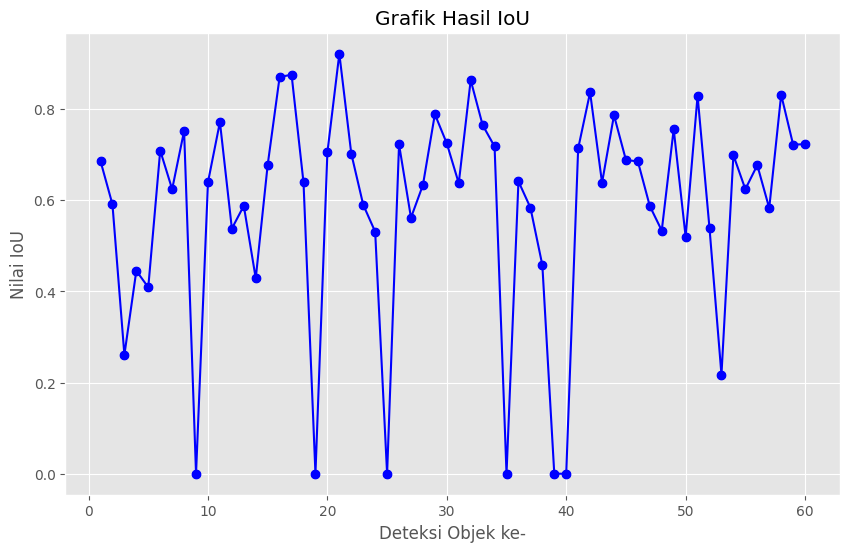

In [ ]:
import shutil
import torch
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
from torchvision.transforms.functional import to_pil_image
from torchvision.ops import box_iou

# Function to calculate Intersection over Union (IoU)
def calculate_iou(box1, box2):
    # Extract coordinates from the bounding box tensors
    box1 = [float(coord) for coord in box1]
    box2 = [float(coord) for coord in box2]

    # Calculate intersection area
    x1_int = max(box1[0], box2[0])
    y1_int = max(box1[1], box2[1])
    x2_int = min(box1[2], box2[2])
    y2_int = min(box1[3], box2[3])

    intersection = max(0, x2_int - x1_int) * max(0, y2_int - y1_int)

    # Calculate union area
    area1 = (box1[2] - box1[0]) * (box1[3] - box1[1])
    area2 = (box2[2] - box2[0]) * (box2[3] - box2[1])
    union = area1 + area2 - intersection

    # Calculate IoU
    iou = intersection / union if union > 0 else 0.0
    return iou

# source_path = "/content/drive/MyDrive/SKRIPSI/Hasil/Model_2/best_model.pth"
# destination_path = "/content/outputs/best_model.pth"

# shutil.copyfile(source_path, destination_path)

def show_iou_graph(images, true_boxes, pred_boxes, threshold=0.5, save_path="/content/iou_graph_model5.png"):
    all_ious = []

    for i in range(len(images)):
        true_boxes_i = true_boxes[i]
        pred_boxes_i = pred_boxes[i]

        ious = []  # To store IoU values for the current image

        for pred_box, score, label in zip(pred_boxes_i['boxes'], pred_boxes_i['scores'], pred_boxes_i['labels']):
            pred_box = [float(b) for b in pred_box]
            if score > threshold:
                # Find the corresponding true bounding box for the label
                true_box = true_boxes_i['boxes'][true_boxes_i['labels'] == label].cpu()
                if len(true_box) > 0:
                    true_box = [float(b) for b in true_box[0]]
                    iou = calculate_iou(pred_box, true_box)
                    ious.append(iou)

        # Store IoU values for the current image
        all_ious.append(ious)

    # Create IoU scatter plot
    plt.figure(figsize=(10, 6))
    plt.scatter(range(1, len(all_ious) + 1), [max(i, default=0) for i in all_ious], color='blue')
    plt.plot(range(1, len(all_ious) + 1), [max(i, default=0) for i in all_ious], linestyle='-', marker='o', color='blue')
    plt.title('Grafik Hasil IoU')
    plt.xlabel('Deteksi Objek ke-')
    plt.ylabel('Nilai IoU')
    plt.savefig(save_path)
    plt.show()

# Update the validate function to return images along with predictions
def validate(valid_data_loader, model):
    model.eval()

    # Initialize tqdm progress bar.
    prog_bar = tqdm(valid_data_loader, total=len(valid_data_loader))
    target = []
    preds = []
    images_list = []

    for i, data in enumerate(prog_bar):
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

        with torch.no_grad():
            outputs = model(images, targets)

        # For mAP calculation using Torchmetrics.
        for i in range(len(images)):
            true_dict = dict()
            preds_dict = dict()
            true_dict['boxes'] = targets[i]['boxes'].detach().cpu()
            true_dict['labels'] = targets[i]['labels'].detach().cpu()
            preds_dict['boxes'] = outputs[i]['boxes'].detach().cpu()
            preds_dict['scores'] = outputs[i]['scores'].detach().cpu()
            preds_dict['labels'] = outputs[i]['labels'].detach().cpu()
            preds.append(preds_dict)
            target.append(true_dict)
            images_list.append(images[i])

    return images_list, preds, target

if __name__ == '__main__':
    model = create_model(num_classes=NUM_CLASSES)
    checkpoint = torch.load('/content/outputs/best_model.pth', map_location=DEVICE)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.to(DEVICE).eval()

    test_dataset = create_test_dataset('/content/PneumoniaDataset80-20/test')
    test_loader = create_test_loader(test_dataset, num_workers=NUM_WORKERS)

    # After calculating metrics, you can display the IoU graph
    images, pred_boxes, true_boxes = validate(test_loader, model)
    # class_names = ['_Background', 'Pneumonia']
    show_iou_graph(images, true_boxes, pred_boxes, save_path='/content/iou_graph_model5.png')

In [ ]:
def make_prediction(model, img, threshold):
    model.eval()
    preds = model(img)
    for id in range(len(preds)) :
        idx_list = []

        for idx, score in enumerate(preds[id]['scores']) :
            if score > threshold :
                idx_list.append(idx)

        preds[id]['boxes'] = preds[id]['boxes'][idx_list]
        preds[id]['labels'] = preds[id]['labels'][idx_list]
        preds[id]['scores'] = preds[id]['scores'][idx_list]

    return preds

def plot_image_from_output(img, annotation):

    img = img.cpu().permute(1,2,0)

    fig,ax = plt.subplots(1)
    ax.imshow(img)

    for idx in range(len(annotation["boxes"])):
        xmin, ymin, xmax, ymax = annotation["boxes"][idx]

        if annotation['labels'][idx] == 1 :
            rect = patches.Rectangle((xmin,ymin),(xmax-xmin),(ymax-ymin),linewidth=1,edgecolor='g',facecolor='none')
        else :
            rect = patches.Rectangle((xmin,ymin),(xmax-xmin),(ymax-ymin),linewidth=1,edgecolor='orange',facecolor='none')

        ax.add_patch(rect)

    plt.show()

In [ ]:
with torch.no_grad():
    print(len(test_loader))
    for imgs, annotations in test_loader:
        imgs = list(img.to(DEVICE) for img in imgs)

        pred = make_prediction(model, imgs, 0.5)
        break

60


({'boxes': tensor([[ 65.0391,  75.5859, 121.8750, 203.3203],
        [166.9922,  78.5156, 239.9414, 211.2305]]), 'labels': tensor([1, 1]), 'area': tensor([7259.9028, 9681.4443]), 'iscrowd': tensor([0, 0]), 'image_id': tensor([0])},)
Target :  tensor([1, 1])


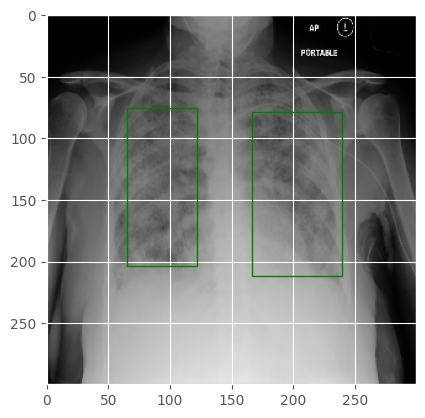

Prediction :  tensor([1, 1], device='cuda:0')
{'boxes': tensor([[ 65.0391,  75.5859, 121.8750, 203.3203],
        [166.9922,  78.5156, 239.9414, 211.2305]]), 'labels': tensor([1, 1]), 'area': tensor([7259.9028, 9681.4443]), 'iscrowd': tensor([0, 0]), 'image_id': tensor([0])}
{'boxes': tensor([[151.8776,  44.7586, 234.3382, 202.4024],
        [ 55.8954,  62.7838, 129.7292, 206.1134]], device='cuda:0'), 'scores': tensor([0.8111, 0.7061], device='cuda:0'), 'labels': tensor([1, 1], device='cuda:0')}


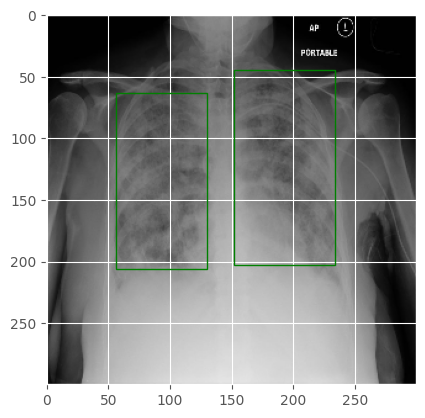

IoU: tensor([[0.0000, 0.5819],
        [0.6860, 0.0000]])


In [ ]:
from torchvision.ops import box_iou
import matplotlib.patches as patches

print(annotations)
_idx = 0
print("Target : ", annotations[_idx]['labels'])
plot_image_from_output(imgs[_idx], annotations[_idx])
print("Prediction : ", pred[_idx]['labels'])
print(annotations[_idx])
print(pred[_idx])

# Create a tensor on the CUDA device
for key in pred[_idx]:
    pred[_idx][key] = pred[_idx][key].cpu()

plot_image_from_output(imgs[_idx], pred[_idx])
iou = box_iou(pred[_idx]['boxes'],annotations[_idx]['boxes'])
print("IoU:", iou)

In [ ]:
from tqdm import tqdm

labels = []
preds_adj_all = []
annot_all = []

for im, annot in tqdm(test_loader, position = 0, leave = True):
    im = list(img.to(DEVICE) for img in im)
    #annot = [{k: v.to(device) for k, v in t.items()} for t in annot]

    for t in annot:
        labels += t['labels']

    with torch.no_grad():
        preds_adj = make_prediction(model, im, 0.5)
        preds_adj = [{k: v.to(torch.device('cpu')) for k, v in t.items()} for t in preds_adj]
        preds_adj_all.append(preds_adj)
        annot_all.append(annot)


100%|██████████| 60/60 [00:02<00:00, 27.20it/s]


In [ ]:
!git clone https://github.com/Pseudo-Lab/Tutorial-Book-Utils
!python Tutorial-Book-Utils/PL_data_loader.py --data FaceMaskDetection

Cloning into 'Tutorial-Book-Utils'...
remote: Enumerating objects: 45, done.
remote: Counting objects: 100% (45/45), done.
remote: Compressing objects: 100% (39/39), done.
remote: Total 45 (delta 18), reused 17 (delta 5), pack-reused 0
Receiving objects: 100% (45/45), 11.62 KiB | 11.62 MiB/s, done.
Resolving deltas: 100% (18/18), done.
Access denied with the following error:

 	Cannot retrieve the public link of the file. You may need to change
	the permission to 'Anyone with the link', or have had many accesses. 

You may still be able to access the file from the browser:

	 https://drive.google.com/uc?id=16Gzn1w38yZLJpzmzKcRIRveFeHZtCEr7 

Face Mask Detection.zip download complete!


In [ ]:
%cd Tutorial-Book-Utils/
import utils_ObjectDetection as utils

/content/Tutorial-Book-Utils


In [ ]:
sample_metrics = []
for batch_i in range(len(preds_adj_all)):
    sample_metrics += utils.get_batch_statistics(preds_adj_all[batch_i], annot_all[batch_i], iou_threshold=0.5)

true_positives, pred_scores, pred_labels = [torch.cat(x, 0) for x in list(zip(*sample_metrics))]  # batch semua disatukan
precision, recall, AP, f1, ap_class = utils.ap_per_class(true_positives, pred_scores, pred_labels, torch.tensor(labels))
mAP = torch.mean(AP)
print(f'mAP : {mAP}')
print(f'AP : {AP}')

mAP : 0.7103177411075134
AP : tensor([0.7103], dtype=torch.float64)


In [ ]:
sample_metrics = []
for batch_i in range(len(preds_adj_all)):
    sample_metrics += utils.get_batch_statistics(preds_adj_all[batch_i], annot_all[batch_i], iou_threshold=0.4)

true_positives, pred_scores, pred_labels = [torch.cat(x, 0) for x in list(zip(*sample_metrics))]  # batch semua disatukan
precision, recall, AP, f1, ap_class = utils.ap_per_class(true_positives, pred_scores, pred_labels, torch.tensor(labels))
mAP = torch.mean(AP)
print(f'mAP : {mAP}')
print(f'AP : {AP}')

mAP : 0.8199760492018389
AP : tensor([0.8200], dtype=torch.float64)


In [ ]:
sample_metrics = []
for batch_i in range(len(preds_adj_all)):
    sample_metrics += utils.get_batch_statistics(preds_adj_all[batch_i], annot_all[batch_i], iou_threshold=0.3)

true_positives, pred_scores, pred_labels = [torch.cat(x, 0) for x in list(zip(*sample_metrics))]  # batch semua disatukan
precision, recall, AP, f1, ap_class = utils.ap_per_class(true_positives, pred_scores, pred_labels, torch.tensor(labels))
mAP = torch.mean(AP)
print(f'mAP : {mAP}')
print(f'AP : {AP}')

mAP : 0.8560532261104985
AP : tensor([0.8561], dtype=torch.float64)


In [ ]:
import numpy as np
import cv2
import torch
import glob as glob
import os
import time
import argparse
import csv

os.makedirs('inference_outputs/images', exist_ok=True)

COLORS = np.random.uniform(0, 255, size=(len(CLASSES), 3))

# Load the best model and trained weights.
model = create_model(num_classes=NUM_CLASSES)
checkpoint = torch.load('/content/outputs/best_model.pth', map_location=DEVICE)
model.load_state_dict(checkpoint['model_state_dict'])
model.to(DEVICE).eval()

# Directory where all the images are present.
DIR_TEST = '/content/PneumoniaDataset80-20/test'
test_images = glob.glob(f"{DIR_TEST}/*.jpg")
print(f"Test instances: {len(test_images)}")

frame_count = 0 # To count total frames.
total_fps = 0 # To get the final frames per second.
lung_opacity_files = []

for i in range(len(test_images)):
    # Get the image file name for saving output later on.
    image_name = test_images[i].split(os.path.sep)[-1].split('.')[0]
    image = cv2.imread(test_images[i])
    orig_image = image.copy()
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
    image /= 255.0
    image_input = np.transpose(image, (2, 0, 1)).astype(np.float32)
    image_input = torch.tensor(image_input, dtype=torch.float).cuda()
    image_input = torch.unsqueeze(image_input, 0)
    start_time = time.time()
    # Predictions
    with torch.no_grad():
        outputs = model(image_input.to(DEVICE))
    end_time = time.time()

    # Get the current fps.
    fps = 1 / (end_time - start_time)
    total_fps += fps
    frame_count += 1

    # Load all detection to CPU for further operations.
    outputs = [{k: v.to('cpu') for k, v in t.items()} for t in outputs]
    if len(outputs[0]['boxes']) != 0:
        boxes = outputs[0]['boxes'].data.numpy()
        scores = outputs[0]['scores'].data.numpy()
        boxes = boxes[scores >= 0.6].astype(np.int32)
        draw_boxes = boxes.copy()
        # Get all the predicited class names.
        pred_classes = [CLASSES[i] for i in outputs[0]['labels'].cpu().numpy()]
        # Draw the bounding boxes and write the class name on top of it.
        for j, box in enumerate(draw_boxes):
            print(image_name)
            class_name = pred_classes[j]
            color = COLORS[CLASSES.index(class_name)]
            # Recale boxes.
            xmin = int((box[0] / image.shape[1]) * orig_image.shape[1])
            ymin = int((box[1] / image.shape[0]) * orig_image.shape[0])
            xmax = int((box[2] / image.shape[1]) * orig_image.shape[1])
            ymax = int((box[3] / image.shape[0]) * orig_image.shape[0])
            cv2.rectangle(orig_image,
                        (xmin, ymin),
                        (xmax, ymax),
                        color[::-1],
                        3)
            cv2.putText(orig_image,
                        class_name,
                        (xmin, ymin-5),
                        cv2.FONT_HERSHEY_SIMPLEX,
                        0.8,
                        color[::-1],
                        2,
                        lineType=cv2.LINE_AA)
        plt.imshow(cv2.cvtColor(orig_image, cv2.COLOR_BGR2RGB))
        plt.show()

        # Simpan gambar ke direktori
        # cv2.imwrite(f"inference_outputs/images/{image_name}.jpg", orig_image)
    print(f"Image {i+1} done...")
    print('-'*50)

print('TEST PREDICTIONS COMPLETE')
avg_fps = total_fps / frame_count
print(f"Average FPS: {avg_fps:.3f}")

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
from google.colab import files

files.download('/content/outputs/best_model.pth')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# MODEL 6 | BATCH : 4 | LR : 0.001 | 85:15

In [ ]:
import zipfile
import os

zip_file_path = '/content/drive/MyDrive/SKRIPSI/Dataset/PneumoniaDataset85-15.zip'  # Ganti dengan path ke file ZIP Anda
unzip_dir = '/content'  # Ganti dengan direktori di mana Anda ingin mengekstrak file

def extract_zip(zip_file, extract_dir):
    with zipfile.ZipFile(zip_file, 'r') as zip_ref:
        zip_ref.extractall(extract_dir)

def list_files(directory):
    return os.listdir(directory)

# Ekstrak file ZIP
extract_zip(zip_file_path, unzip_dir)

# Tampilkan daftar file yang diekstrak
extracted_files = list_files(unzip_dir)
print(extracted_files)

['.config', 'drive', '__MACOSX', 'PneumoniaDataset85-15', 'sample_data']


In [ ]:
import torch
import os


DEVICE = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

BATCH_SIZE = 4 # Increase / decrease according to GPU memeory.
RESIZE_TO = 300 # Resize the image for training and transforms.
NUM_EPOCHS = 100 # Number of epochs to train for.
NUM_WORKERS = 2 # Number of parallel workers for data loading.

CLASSES = [
    '_background','Lung Opacity'
    # 'helmet','head','person'
]



TRAIN_DIR = '/content/PneumoniaDataset85-15/train'
VALID_DIR = '/content/PneumoniaDataset85-15/test'

# Classes: 0 index is reserved for background.


NUM_CLASSES = len(CLASSES)

# Whether to visualize images after crearing the data loaders.
VISUALIZE_TRANSFORMED_IMAGES = False

# Location to save model and plots.
OUT_DIR = 'outputs'
os.makedirs(OUT_DIR, exist_ok=True)

In [ ]:
import albumentations as A
import cv2
import numpy as np
import torch
import matplotlib.pyplot as plt

from albumentations.pytorch import ToTensorV2


plt.style.use('ggplot')

# This class keeps track of the training and validation loss values
# and helps to get the average for each epoch as well.
class Averager:
    def __init__(self):
        self.current_total = 0.0
        self.iterations = 0.0

    def send(self, value):
        self.current_total += value
        self.iterations += 1

    @property
    def value(self):
        if self.iterations == 0:
            return 0
        else:
            return 1.0 * self.current_total / self.iterations

    def reset(self):
        self.current_total = 0.0
        self.iterations = 0.0

class SaveBestModel:
    """
    Class to save the best model while training. If the current epoch's
    validation mAP @0.5:0.95 IoU higher than the previous highest, then save the
    model state.
    """
    def __init__(
        self, best_valid_map=float(0)
    ):
        self.best_valid_map = best_valid_map

    def __call__(
        self,
        model,
        current_valid_map,
        epoch,
        OUT_DIR,
    ):
        if current_valid_map > self.best_valid_map:
            self.best_valid_map = current_valid_map
            print(f"\nBEST VALIDATION mAP: {self.best_valid_map}")
            print(f"\nSAVING BEST MODEL FOR EPOCH: {epoch+1}\n")
            torch.save({
                'epoch': epoch+1,
                'model_state_dict': model.state_dict(),
                }, f"{OUT_DIR}/best_model.pth")

def collate_fn(batch):
    """
    To handle the data loading as different images may have different number
    of objects and to handle varying size tensors as well.
    """
    return tuple(zip(*batch))

# Define the training tranforms.
def get_train_transform():
    return A.Compose([
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.Rotate(limit=6),
        A.Blur(blur_limit=3, p=0.1),
        A.MotionBlur(blur_limit=3, p=0.1),
        A.MedianBlur(blur_limit=3, p=0.1),
        A.RandomBrightnessContrast(p=0.2),
        ToTensorV2(p=1.0),
    ], bbox_params={
        'format': 'pascal_voc',
        'label_fields': ['labels']
    })


# Define the validation transforms.
def get_valid_transform():
    return A.Compose([
        ToTensorV2(p=1.0),
    ], bbox_params={
        'format': 'pascal_voc',
        'label_fields': ['labels']
    })


def show_tranformed_image(train_loader):
    """
    This function shows the transformed images from the `train_loader`.
    Helps to check whether the tranformed images along with the corresponding
    labels are correct or not.
    Only runs if `VISUALIZE_TRANSFORMED_IMAGES = True` in config.py.
    """
    if len(train_loader) > 0:
        for i in range(1):
            images, targets = next(iter(train_loader))
            images = list(image.to(DEVICE) for image in images)
            targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]
            boxes = targets[i]['boxes'].cpu().numpy().astype(np.int32)
            labels = targets[i]['labels'].cpu().numpy().astype(np.int32)
            sample = images[i].permute(1, 2, 0).cpu().numpy()
            sample = cv2.cvtColor(sample, cv2.COLOR_RGB2BGR)
            for box_num, box in enumerate(boxes):
                cv2.rectangle(sample,
                            (box[0], box[1]),
                            (box[2], box[3]),
                            (0, 0, 255), 2)
                cv2.putText(sample, CLASSES[labels[box_num]],
                            (box[0], box[1]-10), cv2.FONT_HERSHEY_SIMPLEX,
                            1.0, (0, 0, 255), 2)
            cv2.imshow('Transformed image', sample)
            cv2.waitKey(0)
            cv2.destroyAllWindows()

def save_model(epoch, model, optimizer):
    """
    Function to save the trained model till current epoch, or whenver called
    """
    torch.save({
                'epoch': epoch+1,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                }, 'outputs/last_model.pth')

def save_loss_plot(
    OUT_DIR,
    train_loss_list,
    x_label='iterations',
    y_label='train loss',
    save_name='train_loss'
):
    """
    Function to save both train loss graph.

    :param OUT_DIR: Path to save the graphs.
    :param train_loss_list: List containing the training loss values.
    """
    figure_1 = plt.figure(figsize=(10, 7), num=1, clear=True)
    train_ax = figure_1.add_subplot()
    train_ax.plot(train_loss_list, color='tab:blue')
    train_ax.set_xlabel(x_label)
    train_ax.set_ylabel(y_label)
    figure_1.savefig(f"{OUT_DIR}/{save_name}.png")
    print('SAVING PLOTS COMPLETE...')

def save_mAP(OUT_DIR, map_05, map):
    """
    Saves the mAP@0.5 and mAP@0.5:0.95 per epoch.
    :param OUT_DIR: Path to save the graphs.
    :param map_05: List containing mAP values at 0.5 IoU.
    :param map: List containing mAP values at 0.5:0.95 IoU.
    """
    figure = plt.figure(figsize=(10, 7), num=1, clear=True)
    ax = figure.add_subplot()
    ax.plot(
        map_05, color='tab:orange', linestyle='-',
        label='mAP@0.5'
    )
    ax.plot(
        map, color='tab:red', linestyle='-',
        label='mAP@0.5:0.95'
    )
    ax.set_xlabel('Epochs')
    ax.set_ylabel('mAP')
    ax.legend()
    figure.savefig(f"{OUT_DIR}/map.png")

In [ ]:
import torch
import cv2
import numpy as np
import os
import glob as glob
from google.colab.patches import cv2_imshow
from xml.etree import ElementTree as et
from torch.utils.data import Dataset, DataLoader

# The dataset class.
class PneumoniaDataset(Dataset):
    def __init__(self, dir_path, width, height, classes, transforms=None):
        self.transforms = transforms
        self.dir_path = dir_path
        self.height = height
        self.width = width
        self.classes = classes
        self.image_file_types = ['*.jpg', '*.jpeg', '*.png', '*.ppm', '*.JPG']
        self.all_image_paths = []

        # Get all the image paths in sorted order.
        for file_type in self.image_file_types:
            self.all_image_paths.extend(glob.glob(os.path.join(self.dir_path, file_type)))
        self.all_images = [image_path.split(os.path.sep)[-1] for image_path in self.all_image_paths]
        self.all_images = sorted(self.all_images)

    def __getitem__(self, idx):
        # Capture the image name and the full image path.
        image_name = self.all_images[idx]
        image_path = os.path.join(self.dir_path, image_name)

        # Read and preprocess the image.
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
        image_resized = cv2.resize(image, (self.width, self.height))
        image_resized /= 255.0

        # Capture the corresponding XML file for getting the annotations.
        annot_filename = os.path.splitext(image_name)[0] + '.xml'
        annot_file_path = os.path.join(self.dir_path, annot_filename)

        boxes = []
        labels = []
        tree = et.parse(annot_file_path)
        root = tree.getroot()

        # Original image width and height.
        image_width = image.shape[1]
        image_height = image.shape[0]

        # Box coordinates for xml files are extracted
        # and corrected for image size given.
        for member in root.findall('object'):
            # Get label and map the `classes`.
            labels.append(self.classes.index(member.find('name').text))

            # Left corner x-coordinates.
            xmin = int(member.find('bndbox').find('xmin').text)
            # Right corner x-coordinates.
            xmax = int(member.find('bndbox').find('xmax').text)
            # Left corner y-coordinates.
            ymin = int(member.find('bndbox').find('ymin').text)
            # Right corner y-coordinates.
            ymax = int(member.find('bndbox').find('ymax').text)

            # Resize the bounding boxes according
            # to resized image `width`, `height`.
            xmin_final = (xmin/image_width)*self.width
            xmax_final = (xmax/image_width)*self.width
            ymin_final = (ymin/image_height)*self.height
            ymax_final = (ymax/image_height)*self.height

            # Check that max coordinates are at least one pixel
            # larger than min coordinates.
            if xmax_final == xmin_final:
                xmax_final += 1
            if ymax_final == ymin_final:
                ymax_final += 1
            # Check that all coordinates are within the image.
            if xmax_final > self.width:
                xmax_final = self.width
            if ymax_final > self.height:
                ymax_final = self.height

            boxes.append([xmin_final, ymin_final, xmax_final, ymax_final])

        # Bounding box to tensor.
        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        # Area of the bounding boxes.
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0]) if len(boxes) > 0 \
            else torch.as_tensor(boxes, dtype=torch.float32)
        # No crowd instances.
        iscrowd = torch.zeros((boxes.shape[0],), dtype=torch.int64)
        # Labels to tensor.
        labels = torch.as_tensor(labels, dtype=torch.int64)

        # Prepare the final `target` dictionary.
        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["area"] = area
        target["iscrowd"] = iscrowd
        image_id = torch.tensor([idx])
        target["image_id"] = image_id

        # Apply the image transforms.
        if self.transforms:
            sample = self.transforms(image = image_resized,
                                     bboxes = target['boxes'],
                                     labels = labels)
            image_resized = sample['image']
            target['boxes'] = torch.Tensor(sample['bboxes'])

        if np.isnan((target['boxes']).numpy()).any() or target['boxes'].shape == torch.Size([0]):
            target['boxes'] = torch.zeros((0, 4), dtype=torch.int64)
        return image_resized, target

    def __len__(self):
        return len(self.all_images)
        # return 500;

# Prepare the final datasets and data loaders.
def create_train_dataset(DIR):
    train_dataset = PneumoniaDataset(
        DIR, RESIZE_TO, RESIZE_TO, CLASSES, get_train_transform()
    )
    return train_dataset
def create_valid_dataset(DIR):
    valid_dataset = PneumoniaDataset(
        DIR, RESIZE_TO, RESIZE_TO, CLASSES, get_valid_transform()
    )
    return valid_dataset
def create_test_dataset(DIR):
    test_dataset = PneumoniaDataset(
        DIR, RESIZE_TO, RESIZE_TO, CLASSES, get_valid_transform()
    )
    return test_dataset
def create_train_loader(train_dataset, num_workers=0):
    train_loader = DataLoader(
        train_dataset,
        batch_size=BATCH_SIZE,
        shuffle=True,
        num_workers=num_workers,
        collate_fn=collate_fn,
        drop_last=True
    )
    return train_loader
def create_valid_loader(valid_dataset, num_workers=0):
    valid_loader = DataLoader(
        valid_dataset,
        batch_size=BATCH_SIZE,
        shuffle=False,
        num_workers=num_workers,
        collate_fn=collate_fn,
        drop_last=True
    )
    return valid_loader
def create_test_loader(test_dataset, num_workers=0):
    test_loader = DataLoader(
        test_dataset,
        batch_size=1,
        shuffle=False,
        num_workers=num_workers,
        collate_fn=collate_fn,
        drop_last=True
    )
    return test_loader


In [ ]:
import torchvision
import torch

from functools import partial
from torchvision.models.detection import RetinaNet
from torchvision.models.detection.backbone_utils import resnet_fpn_backbone
from torchvision.models.detection.retinanet import RetinaNetClassificationHead
from torchvision.models.detection import RetinaNet_ResNet50_FPN_V2_Weights
from torchvision.models.detection.retinanet import RetinaNetClassificationHead

def create_model(num_classes):
    model = torchvision.models.detection.retinanet_resnet50_fpn_v2(
        weights=RetinaNet_ResNet50_FPN_V2_Weights.COCO_V1
    )
    num_anchors = model.head.classification_head.num_anchors

    model.head.classification_head = RetinaNetClassificationHead(
        in_channels=256,
        num_anchors=num_anchors,
        num_classes=num_classes,
        norm_layer=partial(torch.nn.GroupNorm, 32)
    )
    return model

if __name__ == '__main__':
    model = create_model(2)
    # print(model)
    # Total parameters and trainable parameters.
    total_params = sum(p.numel() for p in model.parameters())
    print(f"{total_params:,} total parameters.")
    total_trainable_params = sum(
        p.numel() for p in model.parameters() if p.requires_grad)
    print(f"{total_trainable_params:,} training parameters.")

36,352,630 total parameters.
36,127,286 training parameters.


In [ ]:
!pip install torchmetrics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 840.2/840.2 kB 14.1 MB/s eta 0:00:00


Number of training samples: 255
Number of validation samples: 45

36,352,630 total parameters.
36,127,286 training parameters.
Adjusting learning rate of group 0 to 1.0000e-03.

EPOCH 1 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torchmetrics/utilities/prints.py:43: UserWarning: Encountered more than 100 detections in a single image. This means that certain detections with the lowest scores will be ignored, that may have an undesirable impact on performance. Please consider adjusting the `max_detection_threshold` to suit your use case. To disable this warning, set attribute class `warn_on_many_detections=False`, after initializing the metric.
  warnings.warn(*args, **kwargs)  # noqa: B028


Epoch #1 train loss: 1.028
Epoch #1 mAP: 0.060887016355991364
Took 0.205 minutes for epoch 0

BEST VALIDATION mAP: 0.2422829121351242

SAVING BEST MODEL FOR EPOCH: 1

SAVING PLOTS COMPLETE...

EPOCH 2 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #2 train loss: 0.798
Epoch #2 mAP: 0.09809435158967972
Took 0.314 minutes for epoch 1

BEST VALIDATION mAP: 0.3463723659515381

SAVING BEST MODEL FOR EPOCH: 2

SAVING PLOTS COMPLETE...

EPOCH 3 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #3 train loss: 0.755
Epoch #3 mAP: 0.15764223039150238
Took 0.149 minutes for epoch 2

BEST VALIDATION mAP: 0.5077501535415649

SAVING BEST MODEL FOR EPOCH: 3

SAVING PLOTS COMPLETE...

EPOCH 4 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #4 train loss: 0.718
Epoch #4 mAP: 0.17850430309772491
Took 0.150 minutes for epoch 3

BEST VALIDATION mAP: 0.6211228966712952

SAVING BEST MODEL FOR EPOCH: 4

SAVING PLOTS COMPLETE...

EPOCH 5 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #5 train loss: 0.700
Epoch #5 mAP: 0.19949805736541748
Took 0.147 minutes for epoch 4

BEST VALIDATION mAP: 0.6430867314338684

SAVING BEST MODEL FOR EPOCH: 5

SAVING PLOTS COMPLETE...

EPOCH 6 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #6 train loss: 0.684
Epoch #6 mAP: 0.1879388689994812
Took 0.314 minutes for epoch 5
SAVING PLOTS COMPLETE...

EPOCH 7 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #7 train loss: 0.662
Epoch #7 mAP: 0.21779762208461761
Took 0.149 minutes for epoch 6

BEST VALIDATION mAP: 0.6548631191253662

SAVING BEST MODEL FOR EPOCH: 7

SAVING PLOTS COMPLETE...

EPOCH 8 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #8 train loss: 0.647
Epoch #8 mAP: 0.2386547476053238
Took 0.314 minutes for epoch 7

BEST VALIDATION mAP: 0.7103052735328674

SAVING BEST MODEL FOR EPOCH: 8

SAVING PLOTS COMPLETE...

EPOCH 9 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #9 train loss: 0.641
Epoch #9 mAP: 0.24235545098781586
Took 0.311 minutes for epoch 8

BEST VALIDATION mAP: 0.7195293307304382

SAVING BEST MODEL FOR EPOCH: 9

SAVING PLOTS COMPLETE...

EPOCH 10 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #10 train loss: 0.635
Epoch #10 mAP: 0.23163464665412903
Took 0.313 minutes for epoch 9
SAVING PLOTS COMPLETE...

EPOCH 11 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #11 train loss: 0.620
Epoch #11 mAP: 0.25231224298477173
Took 0.313 minutes for epoch 10
SAVING PLOTS COMPLETE...

EPOCH 12 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #12 train loss: 0.608
Epoch #12 mAP: 0.22690947353839874
Took 0.312 minutes for epoch 11
SAVING PLOTS COMPLETE...

EPOCH 13 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #13 train loss: 0.596
Epoch #13 mAP: 0.24676094949245453
Took 0.145 minutes for epoch 12
SAVING PLOTS COMPLETE...

EPOCH 14 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #14 train loss: 0.596
Epoch #14 mAP: 0.25016680359840393
Took 0.146 minutes for epoch 13

BEST VALIDATION mAP: 0.7496179938316345

SAVING BEST MODEL FOR EPOCH: 14

SAVING PLOTS COMPLETE...

EPOCH 15 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #15 train loss: 0.575
Epoch #15 mAP: 0.25806447863578796
Took 0.313 minutes for epoch 14
SAVING PLOTS COMPLETE...

EPOCH 16 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #16 train loss: 0.575
Epoch #16 mAP: 0.2563168704509735
Took 0.313 minutes for epoch 15
SAVING PLOTS COMPLETE...

EPOCH 17 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #17 train loss: 0.568
Epoch #17 mAP: 0.25160378217697144
Took 0.312 minutes for epoch 16

BEST VALIDATION mAP: 0.750011682510376

SAVING BEST MODEL FOR EPOCH: 17

SAVING PLOTS COMPLETE...

EPOCH 18 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #18 train loss: 0.562
Epoch #18 mAP: 0.2540516257286072
Took 0.146 minutes for epoch 17
SAVING PLOTS COMPLETE...

EPOCH 19 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #19 train loss: 0.568
Epoch #19 mAP: 0.25663119554519653
Took 0.145 minutes for epoch 18
SAVING PLOTS COMPLETE...

EPOCH 20 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #20 train loss: 0.550
Epoch #20 mAP: 0.28154346346855164
Took 0.311 minutes for epoch 19
SAVING PLOTS COMPLETE...

EPOCH 21 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #21 train loss: 0.550
Epoch #21 mAP: 0.2708143889904022
Took 0.146 minutes for epoch 20
SAVING PLOTS COMPLETE...

EPOCH 22 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #22 train loss: 0.543
Epoch #22 mAP: 0.2773687541484833
Took 1.818 minutes for epoch 21

BEST VALIDATION mAP: 0.7762616872787476

SAVING BEST MODEL FOR EPOCH: 22

SAVING PLOTS COMPLETE...

EPOCH 23 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #23 train loss: 0.543
Epoch #23 mAP: 0.28336501121520996
Took 0.313 minutes for epoch 22
SAVING PLOTS COMPLETE...

EPOCH 24 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #24 train loss: 0.531
Epoch #24 mAP: 0.2798769176006317
Took 0.313 minutes for epoch 23
SAVING PLOTS COMPLETE...

EPOCH 25 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #25 train loss: 0.525
Epoch #25 mAP: 0.2779422104358673
Took 0.312 minutes for epoch 24
SAVING PLOTS COMPLETE...

EPOCH 26 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #26 train loss: 0.527
Epoch #26 mAP: 0.28051209449768066
Took 0.145 minutes for epoch 25
SAVING PLOTS COMPLETE...

EPOCH 27 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #27 train loss: 0.525
Epoch #27 mAP: 0.2967755198478699
Took 0.311 minutes for epoch 26

BEST VALIDATION mAP: 0.784544050693512

SAVING BEST MODEL FOR EPOCH: 27

SAVING PLOTS COMPLETE...

EPOCH 28 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #28 train loss: 0.517
Epoch #28 mAP: 0.28842175006866455
Took 0.312 minutes for epoch 27

BEST VALIDATION mAP: 0.7926231622695923

SAVING BEST MODEL FOR EPOCH: 28

SAVING PLOTS COMPLETE...

EPOCH 29 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #29 train loss: 0.512
Epoch #29 mAP: 0.28643569350242615
Took 0.311 minutes for epoch 28
SAVING PLOTS COMPLETE...

EPOCH 30 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #30 train loss: 0.513
Epoch #30 mAP: 0.29829683899879456
Took 0.312 minutes for epoch 29

BEST VALIDATION mAP: 0.7942137122154236

SAVING BEST MODEL FOR EPOCH: 30

SAVING PLOTS COMPLETE...

EPOCH 31 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #31 train loss: 0.498
Epoch #31 mAP: 0.2956511080265045
Took 0.312 minutes for epoch 30
SAVING PLOTS COMPLETE...

EPOCH 32 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f7d95d23a30>Exception ignored in: 
Traceback (most recent call last):
<function _MultiProcessingDataLoaderIter.__del__ at 0x7f7d95d23a30>  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__

Traceback (most recent call last):
      File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
self._shutdown_workers()
    self._shutdown_workers()  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers

      File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
if w.is_alive():
    if w.is_alive():  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive

  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
        assert self._parent_pid == os.getpid(), 'can only te

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #32 train loss: 0.511
Epoch #32 mAP: 0.3125438094139099
Took 0.165 minutes for epoch 31

BEST VALIDATION mAP: 0.8143571019172668

SAVING BEST MODEL FOR EPOCH: 32

SAVING PLOTS COMPLETE...

EPOCH 33 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #33 train loss: 0.499
Epoch #33 mAP: 0.30312493443489075
Took 0.312 minutes for epoch 32
SAVING PLOTS COMPLETE...

EPOCH 34 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #34 train loss: 0.488
Epoch #34 mAP: 0.3045247793197632
Took 0.313 minutes for epoch 33
SAVING PLOTS COMPLETE...

EPOCH 35 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #35 train loss: 0.498
Epoch #35 mAP: 0.289326936006546
Took 0.145 minutes for epoch 34
SAVING PLOTS COMPLETE...

EPOCH 36 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f7d95d23a30>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child processException ignored in: 
<function _MultiProcessingDataLoaderIter.__del__ at 0x7f7d95d23a30>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #36 train loss: 0.491
Epoch #36 mAP: 0.28763142228126526
Took 0.145 minutes for epoch 35
SAVING PLOTS COMPLETE...

EPOCH 37 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #37 train loss: 0.481
Epoch #37 mAP: 0.29785796999931335
Took 0.312 minutes for epoch 36
SAVING PLOTS COMPLETE...

EPOCH 38 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #38 train loss: 0.482
Epoch #38 mAP: 0.2797362804412842
Took 0.144 minutes for epoch 37
SAVING PLOTS COMPLETE...

EPOCH 39 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #39 train loss: 0.487
Epoch #39 mAP: 0.3128901422023773
Took 0.146 minutes for epoch 38
SAVING PLOTS COMPLETE...

EPOCH 40 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #40 train loss: 0.476
Epoch #40 mAP: 0.2915702760219574
Took 0.145 minutes for epoch 39
SAVING PLOTS COMPLETE...

EPOCH 41 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #41 train loss: 0.476
Epoch #41 mAP: 0.30905094742774963
Took 1.485 minutes for epoch 40
SAVING PLOTS COMPLETE...

EPOCH 42 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #42 train loss: 0.457
Epoch #42 mAP: 0.2942045331001282
Took 0.311 minutes for epoch 41
SAVING PLOTS COMPLETE...

EPOCH 43 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #43 train loss: 0.471
Epoch #43 mAP: 0.3011874258518219
Took 0.145 minutes for epoch 42
SAVING PLOTS COMPLETE...

EPOCH 44 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #44 train loss: 0.462
Epoch #44 mAP: 0.30939874053001404
Took 0.311 minutes for epoch 43
SAVING PLOTS COMPLETE...

EPOCH 45 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #45 train loss: 0.462
Epoch #45 mAP: 0.28919553756713867
Took 0.145 minutes for epoch 44
SAVING PLOTS COMPLETE...

EPOCH 46 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #46 train loss: 0.457
Epoch #46 mAP: 0.31156596541404724
Took 0.311 minutes for epoch 45
SAVING PLOTS COMPLETE...

EPOCH 47 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #47 train loss: 0.451
Epoch #47 mAP: 0.30172398686408997
Took 0.144 minutes for epoch 46
SAVING PLOTS COMPLETE...

EPOCH 48 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #48 train loss: 0.455
Epoch #48 mAP: 0.3007251024246216
Took 0.311 minutes for epoch 47
SAVING PLOTS COMPLETE...

EPOCH 49 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #49 train loss: 0.441
Epoch #49 mAP: 0.2998872399330139
Took 0.145 minutes for epoch 48
SAVING PLOTS COMPLETE...

EPOCH 50 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #50 train loss: 0.447
Epoch #50 mAP: 0.30112412571907043
Took 0.311 minutes for epoch 49
SAVING PLOTS COMPLETE...

EPOCH 51 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #51 train loss: 0.442
Epoch #51 mAP: 0.2999979555606842
Took 0.311 minutes for epoch 50
SAVING PLOTS COMPLETE...

EPOCH 52 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #52 train loss: 0.438
Epoch #52 mAP: 0.3126968741416931
Took 0.144 minutes for epoch 51

BEST VALIDATION mAP: 0.8302591443061829

SAVING BEST MODEL FOR EPOCH: 52

SAVING PLOTS COMPLETE...

EPOCH 53 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f7d95d23a30>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f7d95d23a30>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #53 train loss: 0.424
Epoch #53 mAP: 0.3112815022468567
Took 0.148 minutes for epoch 52
SAVING PLOTS COMPLETE...

EPOCH 54 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #54 train loss: 0.427
Epoch #54 mAP: 0.2922687828540802
Took 0.311 minutes for epoch 53
SAVING PLOTS COMPLETE...

EPOCH 55 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #55 train loss: 0.427
Epoch #55 mAP: 0.2953644096851349
Took 0.146 minutes for epoch 54
SAVING PLOTS COMPLETE...

EPOCH 56 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #56 train loss: 0.423
Epoch #56 mAP: 0.2892296314239502
Took 0.312 minutes for epoch 55
SAVING PLOTS COMPLETE...

EPOCH 57 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #57 train loss: 0.409
Epoch #57 mAP: 0.3087719678878784
Took 0.145 minutes for epoch 56
SAVING PLOTS COMPLETE...

EPOCH 58 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #58 train loss: 0.412
Epoch #58 mAP: 0.30734783411026
Took 0.310 minutes for epoch 57
SAVING PLOTS COMPLETE...

EPOCH 59 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #59 train loss: 0.423
Epoch #59 mAP: 0.306484192609787
Took 0.144 minutes for epoch 58
SAVING PLOTS COMPLETE...

EPOCH 60 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #60 train loss: 0.410
Epoch #60 mAP: 0.29764822125434875
Took 0.312 minutes for epoch 59
SAVING PLOTS COMPLETE...

EPOCH 61 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #61 train loss: 0.413
Epoch #61 mAP: 0.2861908972263336
Took 0.144 minutes for epoch 60
SAVING PLOTS COMPLETE...

EPOCH 62 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #62 train loss: 0.398
Epoch #62 mAP: 0.30747610330581665
Took 0.311 minutes for epoch 61
SAVING PLOTS COMPLETE...

EPOCH 63 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #63 train loss: 0.406
Epoch #63 mAP: 0.31014180183410645
Took 0.311 minutes for epoch 62
SAVING PLOTS COMPLETE...

EPOCH 64 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #64 train loss: 0.387
Epoch #64 mAP: 0.3002009689807892
Took 0.145 minutes for epoch 63
SAVING PLOTS COMPLETE...

EPOCH 65 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #65 train loss: 0.386
Epoch #65 mAP: 0.294527143239975
Took 0.311 minutes for epoch 64
SAVING PLOTS COMPLETE...

EPOCH 66 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #66 train loss: 0.399
Epoch #66 mAP: 0.2766493558883667
Took 0.146 minutes for epoch 65
SAVING PLOTS COMPLETE...

EPOCH 67 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #67 train loss: 0.394
Epoch #67 mAP: 0.2914451062679291
Took 0.144 minutes for epoch 66
SAVING PLOTS COMPLETE...

EPOCH 68 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #68 train loss: 0.386
Epoch #68 mAP: 0.3160284161567688
Took 0.143 minutes for epoch 67
SAVING PLOTS COMPLETE...

EPOCH 69 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #69 train loss: 0.386
Epoch #69 mAP: 0.2804672420024872
Took 0.144 minutes for epoch 68
SAVING PLOTS COMPLETE...

EPOCH 70 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #70 train loss: 0.382
Epoch #70 mAP: 0.2906442880630493
Took 0.145 minutes for epoch 69
SAVING PLOTS COMPLETE...

EPOCH 71 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #71 train loss: 0.378
Epoch #71 mAP: 0.2863345742225647
Took 0.145 minutes for epoch 70
SAVING PLOTS COMPLETE...

EPOCH 72 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #72 train loss: 0.378
Epoch #72 mAP: 0.29110756516456604
Took 0.144 minutes for epoch 71
SAVING PLOTS COMPLETE...

EPOCH 73 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #73 train loss: 0.371
Epoch #73 mAP: 0.3029961585998535
Took 0.145 minutes for epoch 72
SAVING PLOTS COMPLETE...

EPOCH 74 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #74 train loss: 0.374
Epoch #74 mAP: 0.3059695065021515
Took 0.145 minutes for epoch 73
SAVING PLOTS COMPLETE...

EPOCH 75 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #75 train loss: 0.380
Epoch #75 mAP: 0.2855075001716614
Took 0.144 minutes for epoch 74
SAVING PLOTS COMPLETE...

EPOCH 76 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #76 train loss: 0.355
Epoch #76 mAP: 0.29036590456962585
Took 0.144 minutes for epoch 75
SAVING PLOTS COMPLETE...

EPOCH 77 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #77 train loss: 0.362
Epoch #77 mAP: 0.28460678458213806
Took 0.145 minutes for epoch 76
SAVING PLOTS COMPLETE...

EPOCH 78 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #78 train loss: 0.359
Epoch #78 mAP: 0.2918335199356079
Took 0.144 minutes for epoch 77
SAVING PLOTS COMPLETE...

EPOCH 79 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #79 train loss: 0.363
Epoch #79 mAP: 0.2957497537136078
Took 0.144 minutes for epoch 78
SAVING PLOTS COMPLETE...

EPOCH 80 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #80 train loss: 0.357
Epoch #80 mAP: 0.2757246196269989
Took 0.145 minutes for epoch 79
SAVING PLOTS COMPLETE...

EPOCH 81 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #81 train loss: 0.347
Epoch #81 mAP: 0.2922576367855072
Took 0.142 minutes for epoch 80
SAVING PLOTS COMPLETE...

EPOCH 82 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #82 train loss: 0.357
Epoch #82 mAP: 0.29175999760627747
Took 0.145 minutes for epoch 81
SAVING PLOTS COMPLETE...

EPOCH 83 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #83 train loss: 0.346
Epoch #83 mAP: 0.29744958877563477
Took 0.145 minutes for epoch 82
SAVING PLOTS COMPLETE...

EPOCH 84 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #84 train loss: 0.342
Epoch #84 mAP: 0.2967265248298645
Took 0.143 minutes for epoch 83
SAVING PLOTS COMPLETE...

EPOCH 85 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #85 train loss: 0.336
Epoch #85 mAP: 0.28848016262054443
Took 0.145 minutes for epoch 84
SAVING PLOTS COMPLETE...

EPOCH 86 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #86 train loss: 0.342
Epoch #86 mAP: 0.28742632269859314
Took 0.144 minutes for epoch 85
SAVING PLOTS COMPLETE...

EPOCH 87 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #87 train loss: 0.342
Epoch #87 mAP: 0.2922322154045105
Took 0.144 minutes for epoch 86
SAVING PLOTS COMPLETE...

EPOCH 88 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #88 train loss: 0.329
Epoch #88 mAP: 0.2928297519683838
Took 0.144 minutes for epoch 87
SAVING PLOTS COMPLETE...

EPOCH 89 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #89 train loss: 0.332
Epoch #89 mAP: 0.2714768946170807
Took 0.143 minutes for epoch 88
SAVING PLOTS COMPLETE...

EPOCH 90 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #90 train loss: 0.336
Epoch #90 mAP: 0.27161529660224915
Took 0.145 minutes for epoch 89
SAVING PLOTS COMPLETE...

EPOCH 91 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #91 train loss: 0.336
Epoch #91 mAP: 0.27222341299057007
Took 0.143 minutes for epoch 90
SAVING PLOTS COMPLETE...

EPOCH 92 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #92 train loss: 0.327
Epoch #92 mAP: 0.27104130387306213
Took 0.145 minutes for epoch 91
SAVING PLOTS COMPLETE...

EPOCH 93 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #93 train loss: 0.329
Epoch #93 mAP: 0.2722329795360565
Took 0.143 minutes for epoch 92
SAVING PLOTS COMPLETE...

EPOCH 94 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #94 train loss: 0.334
Epoch #94 mAP: 0.28141531348228455
Took 0.144 minutes for epoch 93
SAVING PLOTS COMPLETE...

EPOCH 95 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #95 train loss: 0.322
Epoch #95 mAP: 0.28788915276527405
Took 0.145 minutes for epoch 94
SAVING PLOTS COMPLETE...

EPOCH 96 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #96 train loss: 0.312
Epoch #96 mAP: 0.2809368073940277
Took 0.143 minutes for epoch 95
SAVING PLOTS COMPLETE...

EPOCH 97 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #97 train loss: 0.318
Epoch #97 mAP: 0.2839447259902954
Took 0.145 minutes for epoch 96
SAVING PLOTS COMPLETE...

EPOCH 98 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #98 train loss: 0.304
Epoch #98 mAP: 0.2718672454357147
Took 0.145 minutes for epoch 97
SAVING PLOTS COMPLETE...

EPOCH 99 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #99 train loss: 0.315
Epoch #99 mAP: 0.27993300557136536
Took 0.145 minutes for epoch 98
SAVING PLOTS COMPLETE...

EPOCH 100 of 100
Training


  0%|          | 0/63 [00:00<?, ?it/s]

Validating


  0%|          | 0/11 [00:00<?, ?it/s]

Epoch #100 train loss: 0.301
Epoch #100 mAP: 0.28869393467903137
Took 0.145 minutes for epoch 99
SAVING PLOTS COMPLETE...


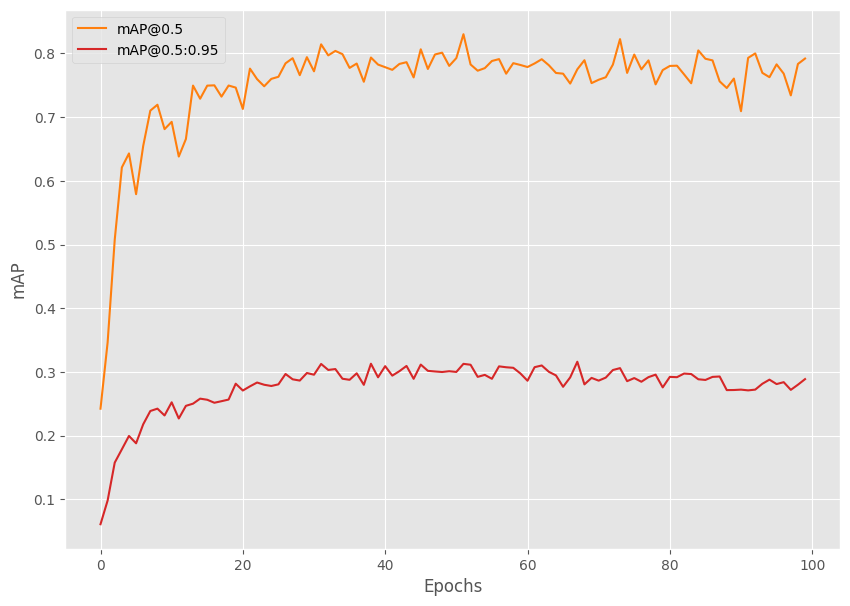

In [ ]:
from tqdm.auto import tqdm
from torchmetrics.detection.mean_ap import MeanAveragePrecision
from torch.optim.lr_scheduler import StepLR
import torch
import matplotlib.pyplot as plt
import time
import os

plt.style.use('ggplot')

seed = 42
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.cuda.manual_seed_all(seed)

# Function for running training iterations.
def train(train_data_loader, model):
    print('Training')
    model.train()

     # initialize tqdm progress bar
    prog_bar = tqdm(train_data_loader, total=len(train_data_loader))

    for i, data in enumerate(prog_bar):
        optimizer.zero_grad()
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]
        loss_dict = model(images, targets)

        losses = sum(loss for loss in loss_dict.values())
        loss_value = losses.item()

        train_loss_hist.send(loss_value)

        losses.backward()
        optimizer.step()

        # update the loss value beside the progress bar for each iteration
        prog_bar.set_description(desc=f"Loss: {loss_value:.4f}")
    return loss_value

# Function for running validation iterations.
def validate(valid_data_loader, model):
    print('Validating')
    model.eval()

    # Initialize tqdm progress bar.
    prog_bar = tqdm(valid_data_loader, total=len(valid_data_loader))
    target = []
    preds = []
    for i, data in enumerate(prog_bar):
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

        with torch.no_grad():
            outputs = model(images, targets)

        # For mAP calculation using Torchmetrics.
        #####################################
        for i in range(len(images)):
            true_dict = dict()
            preds_dict = dict()
            true_dict['boxes'] = targets[i]['boxes'].detach().cpu()
            true_dict['labels'] = targets[i]['labels'].detach().cpu()
            preds_dict['boxes'] = outputs[i]['boxes'].detach().cpu()
            preds_dict['scores'] = outputs[i]['scores'].detach().cpu()
            preds_dict['labels'] = outputs[i]['labels'].detach().cpu()
            preds.append(preds_dict)
            target.append(true_dict)
        #####################################

    metric.reset()
    metric.update(preds, target)
    metric_summary = metric.compute()
    return metric_summary

if __name__ == '__main__':
    os.makedirs('outputs', exist_ok=True)
    train_dataset = create_train_dataset(TRAIN_DIR)
    valid_dataset = create_valid_dataset(VALID_DIR)
    train_loader = create_train_loader(train_dataset, NUM_WORKERS)
    valid_loader = create_valid_loader(valid_dataset, NUM_WORKERS)
    print(f"Number of training samples: {len(train_dataset)}")
    print(f"Number of validation samples: {len(valid_dataset)}\n")

    # Initialize the model and move to the computation device.
    model = create_model(num_classes=NUM_CLASSES)
    model = model.to(DEVICE)
    # print(model)
    # Total parameters and trainable parameters.
    total_params = sum(p.numel() for p in model.parameters())
    print(f"{total_params:,} total parameters.")
    total_trainable_params = sum(
        p.numel() for p in model.parameters() if p.requires_grad)
    print(f"{total_trainable_params:,} training parameters.")
    params = [p for p in model.parameters() if p.requires_grad]
    optimizer = torch.optim.SGD(params, lr=0.001, momentum=0.9, weight_decay=0.0005, nesterov=True)
    scheduler = StepLR(
        optimizer=optimizer, step_size=15, gamma=0.1, verbose=True
    )

    # To monitor training loss
    train_loss_hist = Averager()
    # To store training loss and mAP values.
    train_loss_list = []
    map_50_list = []
    map_list = []

    # Mame to save the trained model with.
    MODEL_NAME = 'model'

    # Whether to show transformed images from data loader or not.
    # if VISUALIZE_TRANSFORMED_IMAGES:
    #     from custom_utils import show_tranformed_image
    #     show_tranformed_image(train_loader)

    # To save best model.
    save_best_model = SaveBestModel()

    metric = MeanAveragePrecision()

    # Training loop.
    for epoch in range(NUM_EPOCHS):
        print(f"\nEPOCH {epoch+1} of {NUM_EPOCHS}")

        # Reset the training loss histories for the current epoch.
        train_loss_hist.reset()

        # Start timer and carry out training and validation.
        start = time.time()
        train_loss = train(train_loader, model)
        metric_summary = validate(valid_loader, model)
        print(f"Epoch #{epoch+1} train loss: {train_loss_hist.value:.3f}")
        print(f"Epoch #{epoch+1} mAP: {metric_summary['map']}")
        end = time.time()
        print(f"Took {((end - start) / 60):.3f} minutes for epoch {epoch}")

        train_loss_list.append(train_loss)
        map_50_list.append(metric_summary['map_50'])
        map_list.append(metric_summary['map'])

        # save the best model till now.
        save_best_model(
            model, float(metric_summary['map_50']), epoch, 'outputs'
        )
        # Save the current epoch model.
        save_model(epoch, model, optimizer)

        # Save loss plot.
        save_loss_plot(OUT_DIR, train_loss_list)

        # Save mAP plot.
        save_mAP(OUT_DIR, map_50_list, map_list)
        # scheduler.step()

In [ ]:
import torch
from tqdm.auto import tqdm
from tqdm import TqdmExperimentalWarning
from torchmetrics.detection.mean_ap import MeanAveragePrecision

# Evaluation function
def validate(valid_data_loader, model):
    model.eval()

    # Initialize tqdm progress bar.
    prog_bar = tqdm(valid_data_loader, total=len(valid_data_loader))
    target = []
    preds = []
    for i, data in enumerate(prog_bar):
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

        with torch.no_grad():
            outputs = model(images, targets)

        # For mAP calculation using Torchmetrics.
        #####################################
        for i in range(len(images)):
            true_dict = dict()
            preds_dict = dict()
            true_dict['boxes'] = targets[i]['boxes'].detach().cpu()
            true_dict['labels'] = targets[i]['labels'].detach().cpu()
            preds_dict['boxes'] = outputs[i]['boxes'].detach().cpu()
            preds_dict['scores'] = outputs[i]['scores'].detach().cpu()
            preds_dict['labels'] = outputs[i]['labels'].detach().cpu()
            preds.append(preds_dict)
            target.append(true_dict)
        #####################################

    metric = MeanAveragePrecision()
    metric.update(preds, target)
    metric_summary = metric.compute()
    return metric_summary

if __name__ == '__main__':
    # Load the best model and trained weights.
    model = create_model(num_classes=NUM_CLASSES)
    checkpoint = torch.load('/content/outputs/best_model.pth', map_location=DEVICE)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.to(DEVICE).eval()

    test_dataset = create_test_dataset(
        '/content/PneumoniaDataset85-15/test'
    )
    test_loader = create_test_loader(test_dataset, num_workers=NUM_WORKERS)

    metric_summary = validate(test_loader, model)
    print(f"mAP_50: {metric_summary['map_50']*100:.3f}")
    print(f"mAP_50_95: {metric_summary['map']*100:.3f}")

  0%|          | 0/45 [00:00<?, ?it/s]

mAP_50: 83.578
mAP_50_95: 31.144


  0%|          | 0/45 [00:00<?, ?it/s]

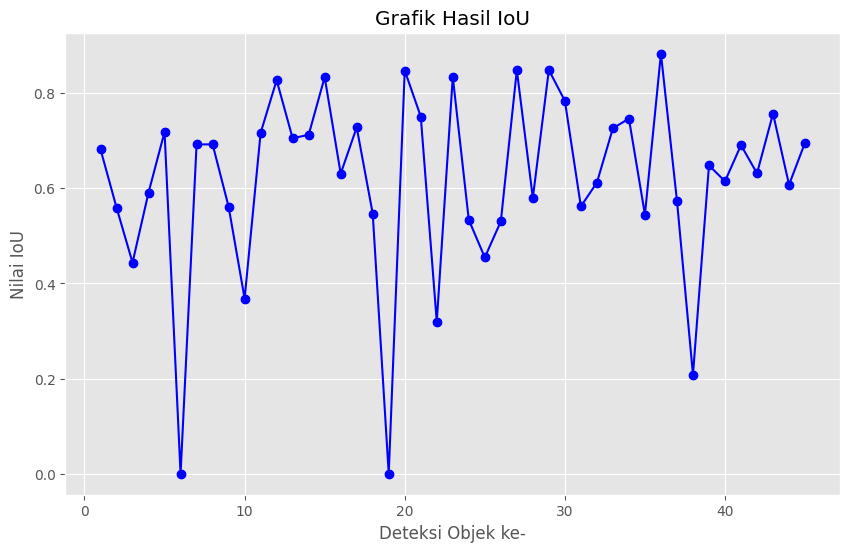

In [ ]:
import shutil
import torch
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
from torchvision.transforms.functional import to_pil_image
from torchvision.ops import box_iou

# Function to calculate Intersection over Union (IoU)
def calculate_iou(box1, box2):
    # Extract coordinates from the bounding box tensors
    box1 = [float(coord) for coord in box1]
    box2 = [float(coord) for coord in box2]

    # Calculate intersection area
    x1_int = max(box1[0], box2[0])
    y1_int = max(box1[1], box2[1])
    x2_int = min(box1[2], box2[2])
    y2_int = min(box1[3], box2[3])

    intersection = max(0, x2_int - x1_int) * max(0, y2_int - y1_int)

    # Calculate union area
    area1 = (box1[2] - box1[0]) * (box1[3] - box1[1])
    area2 = (box2[2] - box2[0]) * (box2[3] - box2[1])
    union = area1 + area2 - intersection

    # Calculate IoU
    iou = intersection / union if union > 0 else 0.0
    return iou

# source_path = "/content/drive/MyDrive/SKRIPSI/Hasil/Model_2/best_model.pth"
# destination_path = "/content/outputs/best_model.pth"

# shutil.copyfile(source_path, destination_path)

def show_iou_graph(images, true_boxes, pred_boxes, threshold=0.5, save_path="/content/iou_graph_model4.png"):
    all_ious = []

    for i in range(len(images)):
        true_boxes_i = true_boxes[i]
        pred_boxes_i = pred_boxes[i]

        ious = []  # To store IoU values for the current image

        for pred_box, score, label in zip(pred_boxes_i['boxes'], pred_boxes_i['scores'], pred_boxes_i['labels']):
            pred_box = [float(b) for b in pred_box]
            if score > threshold:
                # Find the corresponding true bounding box for the label
                true_box = true_boxes_i['boxes'][true_boxes_i['labels'] == label].cpu()
                if len(true_box) > 0:
                    true_box = [float(b) for b in true_box[0]]
                    iou = calculate_iou(pred_box, true_box)
                    ious.append(iou)

        # Store IoU values for the current image
        all_ious.append(ious)

    # Create IoU scatter plot
    plt.figure(figsize=(10, 6))
    plt.scatter(range(1, len(all_ious) + 1), [max(i, default=0) for i in all_ious], color='blue')
    plt.plot(range(1, len(all_ious) + 1), [max(i, default=0) for i in all_ious], linestyle='-', marker='o', color='blue')
    plt.title('Grafik Hasil IoU')
    plt.xlabel('Deteksi Objek ke-')
    plt.ylabel('Nilai IoU')
    plt.savefig(save_path)
    plt.show()

# Update the validate function to return images along with predictions
def validate(valid_data_loader, model):
    model.eval()

    # Initialize tqdm progress bar.
    prog_bar = tqdm(valid_data_loader, total=len(valid_data_loader))
    target = []
    preds = []
    images_list = []

    for i, data in enumerate(prog_bar):
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

        with torch.no_grad():
            outputs = model(images, targets)

        # For mAP calculation using Torchmetrics.
        for i in range(len(images)):
            true_dict = dict()
            preds_dict = dict()
            true_dict['boxes'] = targets[i]['boxes'].detach().cpu()
            true_dict['labels'] = targets[i]['labels'].detach().cpu()
            preds_dict['boxes'] = outputs[i]['boxes'].detach().cpu()
            preds_dict['scores'] = outputs[i]['scores'].detach().cpu()
            preds_dict['labels'] = outputs[i]['labels'].detach().cpu()
            preds.append(preds_dict)
            target.append(true_dict)
            images_list.append(images[i])

    return images_list, preds, target

if __name__ == '__main__':
    model = create_model(num_classes=NUM_CLASSES)
    checkpoint = torch.load('/content/outputs/best_model.pth', map_location=DEVICE)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.to(DEVICE).eval()

    test_dataset = create_test_dataset('/content/PneumoniaDataset85-15/test')
    test_loader = create_test_loader(test_dataset, num_workers=NUM_WORKERS)

    # After calculating metrics, you can display the IoU graph
    images, pred_boxes, true_boxes = validate(test_loader, model)
    # class_names = ['_Background', 'Pneumonia']
    show_iou_graph(images, true_boxes, pred_boxes, save_path='/content/iou_graph_model4.png')

In [ ]:
def make_prediction(model, img, threshold):
    model.eval()
    preds = model(img)
    for id in range(len(preds)) :
        idx_list = []

        for idx, score in enumerate(preds[id]['scores']) :
            if score > threshold :
                idx_list.append(idx)

        preds[id]['boxes'] = preds[id]['boxes'][idx_list]
        preds[id]['labels'] = preds[id]['labels'][idx_list]
        preds[id]['scores'] = preds[id]['scores'][idx_list]

    return preds

def plot_image_from_output(img, annotation):

    img = img.cpu().permute(1,2,0)

    fig,ax = plt.subplots(1)
    ax.imshow(img)

    for idx in range(len(annotation["boxes"])):
        xmin, ymin, xmax, ymax = annotation["boxes"][idx]

        if annotation['labels'][idx] == 1 :
            rect = patches.Rectangle((xmin,ymin),(xmax-xmin),(ymax-ymin),linewidth=1,edgecolor='g',facecolor='none')
        else :
            rect = patches.Rectangle((xmin,ymin),(xmax-xmin),(ymax-ymin),linewidth=1,edgecolor='orange',facecolor='none')

        ax.add_patch(rect)

    plt.show()

In [ ]:
from tqdm import tqdm

labels = []
preds_adj_all = []
annot_all = []

for im, annot in tqdm(test_loader, position = 0, leave = True):
    im = list(img.to(DEVICE) for img in im)
    #annot = [{k: v.to(device) for k, v in t.items()} for t in annot]

    for t in annot:
        labels += t['labels']

    with torch.no_grad():
        preds_adj = make_prediction(model, im, 0.5)
        preds_adj = [{k: v.to(torch.device('cpu')) for k, v in t.items()} for t in preds_adj]
        preds_adj_all.append(preds_adj)
        annot_all.append(annot)


100%|██████████| 45/45 [00:01<00:00, 27.43it/s]


In [ ]:
!git clone https://github.com/Pseudo-Lab/Tutorial-Book-Utils
!python Tutorial-Book-Utils/PL_data_loader.py --data FaceMaskDetection
%cd Tutorial-Book-Utils/
import utils_ObjectDetection as utils

Cloning into 'Tutorial-Book-Utils'...
remote: Enumerating objects: 45, done.
remote: Counting objects: 100% (45/45), done.
remote: Compressing objects: 100% (39/39), done.
remote: Total 45 (delta 18), reused 17 (delta 5), pack-reused 0
Receiving objects: 100% (45/45), 11.62 KiB | 11.62 MiB/s, done.
Resolving deltas: 100% (18/18), done.
Downloading...
From (original): https://drive.google.com/uc?id=16Gzn1w38yZLJpzmzKcRIRveFeHZtCEr7
From (redirected): https://drive.google.com/uc?id=16Gzn1w38yZLJpzmzKcRIRveFeHZtCEr7&confirm=t&uuid=804e611b-ac79-4645-ad68-fde64763dca8
To: /content/Tutorial-Book-Utils/Face Mask Detection.zip
100% 417M/417M [00:02<00:00, 153MB/s]
Face Mask Detection.zip download complete!
/content/Tutorial-Book-Utils/Tutorial-Book-Utils


In [ ]:
sample_metrics = []
for batch_i in range(len(preds_adj_all)):
    sample_metrics += utils.get_batch_statistics(preds_adj_all[batch_i], annot_all[batch_i], iou_threshold=0.5)

true_positives, pred_scores, pred_labels = [torch.cat(x, 0) for x in list(zip(*sample_metrics))]  # batch semua disatukan
precision, recall, AP, f1, ap_class = utils.ap_per_class(true_positives, pred_scores, pred_labels, torch.tensor(labels))
mAP = torch.mean(AP)
print(f'mAP : {mAP}')
print(f'AP : {AP}')

mAP : 0.7715817840650183
AP : tensor([0.7716], dtype=torch.float64)


In [ ]:
sample_metrics = []
for batch_i in range(len(preds_adj_all)):
    sample_metrics += utils.get_batch_statistics(preds_adj_all[batch_i], annot_all[batch_i], iou_threshold=0.4)

true_positives, pred_scores, pred_labels = [torch.cat(x, 0) for x in list(zip(*sample_metrics))]  # batch semua disatukan
precision, recall, AP, f1, ap_class = utils.ap_per_class(true_positives, pred_scores, pred_labels, torch.tensor(labels))
mAP = torch.mean(AP)
print(f'mAP : {mAP}')
print(f'AP : {AP}')

mAP : 0.8437000814409821
AP : tensor([0.8437], dtype=torch.float64)


In [ ]:
sample_metrics = []
for batch_i in range(len(preds_adj_all)):
    sample_metrics += utils.get_batch_statistics(preds_adj_all[batch_i], annot_all[batch_i], iou_threshold=0.3)

true_positives, pred_scores, pred_labels = [torch.cat(x, 0) for x in list(zip(*sample_metrics))]  # batch semua disatukan
precision, recall, AP, f1, ap_class = utils.ap_per_class(true_positives, pred_scores, pred_labels, torch.tensor(labels))
mAP = torch.mean(AP)
print(f'mAP : {mAP}')
print(f'AP : {AP}')

mAP : 0.8985848776084815
AP : tensor([0.8986], dtype=torch.float64)


In [ ]:
import numpy as np
import cv2
import torch
import glob as glob
import os
import time
import argparse
import csv

os.makedirs('inference_outputs/images', exist_ok=True)

COLORS = np.random.uniform(0, 255, size=(len(CLASSES), 3))

# Load the best model and trained weights.
model = create_model(num_classes=NUM_CLASSES)
checkpoint = torch.load('/content/outputs/best_model.pth', map_location=DEVICE)
model.load_state_dict(checkpoint['model_state_dict'])
model.to(DEVICE).eval()

# Directory where all the images are present.
DIR_TEST = '/content/PneumoniaDataset85-15/test'
test_images = glob.glob(f"{DIR_TEST}/*.jpg")
print(f"Test instances: {len(test_images)}")

frame_count = 0 # To count total frames.
total_fps = 0 # To get the final frames per second.
lung_opacity_files = []

for i in range(len(test_images)):
    # Get the image file name for saving output later on.
    image_name = test_images[i].split(os.path.sep)[-1].split('.')[0]
    image = cv2.imread(test_images[i])
    orig_image = image.copy()
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
    image /= 255.0
    image_input = np.transpose(image, (2, 0, 1)).astype(np.float32)
    image_input = torch.tensor(image_input, dtype=torch.float).cuda()
    image_input = torch.unsqueeze(image_input, 0)
    start_time = time.time()
    # Predictions
    with torch.no_grad():
        outputs = model(image_input.to(DEVICE))
    end_time = time.time()

    # Get the current fps.
    fps = 1 / (end_time - start_time)
    total_fps += fps
    frame_count += 1

    # Load all detection to CPU for further operations.
    outputs = [{k: v.to('cpu') for k, v in t.items()} for t in outputs]
    if len(outputs[0]['boxes']) != 0:
        boxes = outputs[0]['boxes'].data.numpy()
        scores = outputs[0]['scores'].data.numpy()
        boxes = boxes[scores >= 0.5].astype(np.int32)
        draw_boxes = boxes.copy()
        # Get all the predicited class names.
        pred_classes = [CLASSES[i] for i in outputs[0]['labels'].cpu().numpy()]
        # Draw the bounding boxes and write the class name on top of it.
        for j, box in enumerate(draw_boxes):
            print(image_name)
            class_name = pred_classes[j]
            color = COLORS[CLASSES.index(class_name)]
            # Recale boxes.
            xmin = int((box[0] / image.shape[1]) * orig_image.shape[1])
            ymin = int((box[1] / image.shape[0]) * orig_image.shape[0])
            xmax = int((box[2] / image.shape[1]) * orig_image.shape[1])
            ymax = int((box[3] / image.shape[0]) * orig_image.shape[0])
            cv2.rectangle(orig_image,
                        (xmin, ymin),
                        (xmax, ymax),
                        color[::-1],
                        3)
            cv2.putText(orig_image,
                        class_name,
                        (xmin, ymin-5),
                        cv2.FONT_HERSHEY_SIMPLEX,
                        0.8,
                        color[::-1],
                        2,
                        lineType=cv2.LINE_AA)
        plt.imshow(cv2.cvtColor(orig_image, cv2.COLOR_BGR2RGB))
        plt.show()

        # Simpan gambar ke direktori
        # cv2.imwrite(f"inference_outputs/images/{image_name}.jpg", orig_image)
    print(f"Image {i+1} done...")
    print('-'*50)

print('TEST PREDICTIONS COMPLETE')
avg_fps = total_fps / frame_count
print(f"Average FPS: {avg_fps:.3f}")

Output hidden; open in https://colab.research.google.com to view.

# MODEL 7 | BATCH : 4 | LR : 0.001 | 90:20 | 300 | BEST MODEL

In [ ]:
import zipfile
import os

zip_file_path = '/content/drive/MyDrive/SKRIPSI/Dataset/PneumoniaDataset90-10.zip'
unzip_dir = '/content'

def extract_zip(zip_file, extract_dir):
    with zipfile.ZipFile(zip_file, 'r') as zip_ref:
        zip_ref.extractall(extract_dir)

def list_files(directory):
    return os.listdir(directory)

extract_zip(zip_file_path, unzip_dir)

extracted_files = list_files(unzip_dir)
print(extracted_files)

['.config', 'drive', '__MACOSX', 'PneumoniaDataset90-10', 'sample_data']


In [ ]:
import torch
import os


DEVICE = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

BATCH_SIZE = 4
RESIZE_TO = 300
NUM_EPOCHS = 100
NUM_WORKERS = 2

CLASSES = ['_background','Lung Opacity']

TRAIN_DIR = '/content/PneumoniaDataset90-10/train'
VALID_DIR = '/content/PneumoniaDataset90-10/test'

NUM_CLASSES = len(CLASSES)

VISUALIZE_TRANSFORMED_IMAGES = False

OUT_DIR = 'outputs'
os.makedirs(OUT_DIR, exist_ok=True)

In [ ]:
import albumentations as A
import cv2
import numpy as np
import torch
import matplotlib.pyplot as plt

from albumentations.pytorch import ToTensorV2


plt.style.use('ggplot')

# This class keeps track of the training and validation loss values
# and helps to get the average for each epoch as well.
class Averager:
    def __init__(self):
        self.current_total = 0.0
        self.iterations = 0.0

    def send(self, value):
        self.current_total += value
        self.iterations += 1

    @property
    def value(self):
        if self.iterations == 0:
            return 0
        else:
            return 1.0 * self.current_total / self.iterations

    def reset(self):
        self.current_total = 0.0
        self.iterations = 0.0

class SaveBestModel:

    def __init__(
        self, best_valid_map=float(0)
    ):

        self.best_valid_map = best_valid_map

    def __call__(
        self,
        model,
        current_valid_map,
        epoch,
        OUT_DIR,
    ):
        if current_valid_map > self.best_valid_map:
            self.best_valid_map = current_valid_map
            print(f"\nBEST VALIDATION mAP: {self.best_valid_map}")
            print(f"\nSAVING BEST MODEL FOR EPOCH: {epoch+1}\n")
            torch.save({
                'epoch': epoch+1,
                'model_state_dict': model.state_dict(),
                }, f"{OUT_DIR}/best_model.pth")

def collate_fn(batch):
    """
    To handle the data loading as different images may have different number
    of objects and to handle varying size tensors as well.
    """
    return tuple(zip(*batch))

# Define the training tranforms.
def get_train_transform():
    return A.Compose([
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.Rotate(limit=6),
        A.Blur(blur_limit=3, p=0.1)
        ToTensorV2(p=1.0),
    ], bbox_params={
        'format': 'pascal_voc',
        'label_fields': ['labels']
    })


# Define the validation transforms.
def get_valid_transform():
    return A.Compose([
        ToTensorV2(p=1.0),
    ], bbox_params={
        'format': 'pascal_voc',
        'label_fields': ['labels']
    })

def save_model(epoch, model, optimizer):
    """
    Function to save the trained model till current epoch, or whenver called
    """
    torch.save({
                'epoch': epoch+1,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                }, 'outputs/last_model.pth')

def save_loss_plot(
    OUT_DIR,
    train_loss_list,
    x_label='iterations',
    y_label='train loss',
    save_name='train_loss'
):
    """
    Function to save both train loss graph.

    :param OUT_DIR: Path to save the graphs.
    :param train_loss_list: List containing the training loss values.
    """
    figure_1 = plt.figure(figsize=(10, 7), num=1, clear=True)
    train_ax = figure_1.add_subplot()
    train_ax.plot(train_loss_list, color='tab:blue')
    train_ax.set_xlabel(x_label)
    train_ax.set_ylabel(y_label)
    figure_1.savefig(f"{OUT_DIR}/{save_name}.png")
    print('SAVING PLOTS COMPLETE...')

def save_mAP(OUT_DIR, map_05, map):
    """
    Saves the mAP@0.5 and mAP@0.5:0.95 per epoch.
    :param OUT_DIR: Path to save the graphs.
    :param map_05: List containing mAP values at 0.5 IoU.
    :param map: List containing mAP values at 0.5:0.95 IoU.
    """
    figure = plt.figure(figsize=(10, 7), num=1, clear=True)
    ax = figure.add_subplot()
    ax.plot(
        map_05, color='tab:orange', linestyle='-',
        label='mAP@0.5'
    )
    ax.plot(
        map, color='tab:red', linestyle='-',
        label='mAP@0.5:0.95'
    )
    ax.set_xlabel('Epochs')
    ax.set_ylabel('mAP')
    ax.legend()
    figure.savefig(f"{OUT_DIR}/map.png")

In [ ]:
import torch
import cv2
import numpy as np
import os
import glob as glob
from google.colab.patches import cv2_imshow
from xml.etree import ElementTree as et
from torch.utils.data import Dataset, DataLoader

# The dataset class.
class PneumoniaDataset(Dataset):
    def __init__(self, dir_path, width, height, classes, transforms=None):
        self.transforms = transforms
        self.dir_path = dir_path
        self.height = height
        self.width = width
        self.classes = classes
        self.image_file_types = ['*.jpg', '*.jpeg', '*.png', '*.JPG']
        self.all_image_paths = []

        # Get all the image paths in sorted order.
        for file_type in self.image_file_types:
            self.all_image_paths.extend(glob.glob(os.path.join(self.dir_path, file_type)))
        self.all_images = [image_path.split(os.path.sep)[-1] for image_path in self.all_image_paths]
        self.all_images = sorted(self.all_images)

    def __getitem__(self, idx):
        # Capture the image name and the full image path.
        image_name = self.all_images[idx]
        image_path = os.path.join(self.dir_path, image_name)

        # Read and preprocess the image.
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
        image_resized = cv2.resize(image, (self.width, self.height))
        image_resized /= 255.0

        # Capture the corresponding XML file for getting the annotations.
        annot_filename = os.path.splitext(image_name)[0] + '.xml'
        annot_file_path = os.path.join(self.dir_path, annot_filename)

        boxes = []
        labels = []
        tree = et.parse(annot_file_path)
        root = tree.getroot()

        # Original image width and height.
        image_width = image.shape[1]
        image_height = image.shape[0]

        # Box coordinates for xml files are extracted
        # and corrected for image size given.
        for member in root.findall('object'):
            # Get label and map the `classes`.
            labels.append(self.classes.index(member.find('name').text))

            # Left corner x-coordinates.
            xmin = int(member.find('bndbox').find('xmin').text)
            # Right corner x-coordinates.
            xmax = int(member.find('bndbox').find('xmax').text)
            # Left corner y-coordinates.
            ymin = int(member.find('bndbox').find('ymin').text)
            # Right corner y-coordinates.
            ymax = int(member.find('bndbox').find('ymax').text)

            # Resize the bounding boxes according
            # to resized image `width`, `height`.
            xmin_final = (xmin/image_width)*self.width
            xmax_final = (xmax/image_width)*self.width
            ymin_final = (ymin/image_height)*self.height
            ymax_final = (ymax/image_height)*self.height

            # Check that max coordinates are at least one pixel
            # larger than min coordinates.
            if xmax_final == xmin_final:
                xmax_final += 1
            if ymax_final == ymin_final:
                ymax_final += 1
            # Check that all coordinates are within the image.
            if xmax_final > self.width:
                xmax_final = self.width
            if ymax_final > self.height:
                ymax_final = self.height

            boxes.append([xmin_final, ymin_final, xmax_final, ymax_final])

        # Bounding box to tensor.
        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        # Area of the bounding boxes.
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0]) if len(boxes) > 0 \
            else torch.as_tensor(boxes, dtype=torch.float32)
        # No crowd instances.
        iscrowd = torch.zeros((boxes.shape[0],), dtype=torch.int64)
        # Labels to tensor.
        labels = torch.as_tensor(labels, dtype=torch.int64)

        # Prepare the final `target` dictionary.
        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["area"] = area
        target["iscrowd"] = iscrowd
        image_id = torch.tensor([idx])
        target["image_id"] = image_id

        # Apply the image transforms.
        if self.transforms:
            sample = self.transforms(image = image_resized,
                                     bboxes = target['boxes'],
                                     labels = labels)
            image_resized = sample['image']
            target['boxes'] = torch.Tensor(sample['bboxes'])

        if np.isnan((target['boxes']).numpy()).any() or target['boxes'].shape == torch.Size([0]):
            target['boxes'] = torch.zeros((0, 4), dtype=torch.int64)
        return image_resized, target

    def __len__(self):
        return len(self.all_images)
        # return 500;

# Prepare the final datasets and data loaders.
def create_train_dataset(DIR):
    train_dataset = PneumoniaDataset(
        DIR, RESIZE_TO, RESIZE_TO, CLASSES, get_train_transform()
    )
    return train_dataset
def create_valid_dataset(DIR):
    valid_dataset = PneumoniaDataset(
        DIR, RESIZE_TO, RESIZE_TO, CLASSES, get_valid_transform()
    )
    return valid_dataset
def create_test_dataset(DIR):
    test_dataset = PneumoniaDataset(
        DIR, RESIZE_TO, RESIZE_TO, CLASSES, get_valid_transform()
    )
    return test_dataset
def create_train_loader(train_dataset, num_workers=0):
    train_loader = DataLoader(
        train_dataset,
        batch_size=BATCH_SIZE,
        shuffle=True,
        num_workers=num_workers,
        collate_fn=collate_fn,
        drop_last=True
    )
    return train_loader
def create_valid_loader(valid_dataset, num_workers=0):
    valid_loader = DataLoader(
        valid_dataset,
        batch_size=BATCH_SIZE,
        shuffle=False,
        num_workers=num_workers,
        collate_fn=collate_fn,
        drop_last=True
    )
    return valid_loader
def create_test_loader(test_dataset, num_workers=0):
    test_loader = DataLoader(
        test_dataset,
        batch_size=1,
        shuffle=False,
        num_workers=num_workers,
        collate_fn=collate_fn,
        drop_last=True
    )
    return test_loader


In [ ]:
import torchvision
import torch

from functools import partial
from torchvision.models.detection import RetinaNet
from torchvision.models.detection.backbone_utils import resnet_fpn_backbone
from torchvision.models.detection.retinanet import RetinaNetClassificationHead
from torchvision.models.detection import RetinaNet_ResNet50_FPN_V2_Weights
from torchvision.models.detection.retinanet import RetinaNetClassificationHead

def create_model(num_classes):
    model = torchvision.models.detection.retinanet_resnet50_fpn_v2(
        weights=RetinaNet_ResNet50_FPN_V2_Weights.COCO_V1
    )
    num_anchors = model.head.classification_head.num_anchors

    model.head.classification_head = RetinaNetClassificationHead(
        in_channels=256,
        num_anchors=num_anchors,
        num_classes=num_classes,
        norm_layer=partial(torch.nn.GroupNorm, 32)
    )
    return model

if __name__ == '__main__':
    model = create_model(2)
    # print(model)
    # Total parameters and trainable parameters.
    total_params = sum(p.numel() for p in model.parameters())
    print(f"{total_params:,} total parameters.")
    total_trainable_params = sum(
        p.numel() for p in model.parameters() if p.requires_grad)
    print(f"{total_trainable_params:,} training parameters.")

Downloading: "https://download.pytorch.org/models/retinanet_resnet50_fpn_v2_coco-5905b1c5.pth" to /root/.cache/torch/hub/checkpoints/retinanet_resnet50_fpn_v2_coco-5905b1c5.pth
100%|██████████| 146M/146M [00:02<00:00, 53.5MB/s]


36,352,630 total parameters.
36,127,286 training parameters.


In [ ]:
!pip install torchmetrics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 840.2/840.2 kB 12.3 MB/s eta 0:00:00


Number of training samples: 270
Number of validation samples: 30

36,352,630 total parameters.
36,127,286 training parameters.
Adjusting learning rate of group 0 to 1.0000e-03.

EPOCH 1 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torchmetrics/utilities/prints.py:43: UserWarning: Encountered more than 100 detections in a single image. This means that certain detections with the lowest scores will be ignored, that may have an undesirable impact on performance. Please consider adjusting the `max_detection_threshold` to suit your use case. To disable this warning, set attribute class `warn_on_many_detections=False`, after initializing the metric.
  warnings.warn(*args, **kwargs)  # noqa: B028


Epoch #1 train loss: 1.018
Epoch #1 mAP: 0.07817398011684418
Took 0.372 minutes for epoch 0

BEST VALIDATION mAP: 0.32088637351989746

SAVING BEST MODEL FOR EPOCH: 1

SAVING PLOTS COMPLETE...

EPOCH 2 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #2 train loss: 0.790
Epoch #2 mAP: 0.14427495002746582
Took 0.150 minutes for epoch 1

BEST VALIDATION mAP: 0.46575862169265747

SAVING BEST MODEL FOR EPOCH: 2

SAVING PLOTS COMPLETE...

EPOCH 3 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #3 train loss: 0.741
Epoch #3 mAP: 0.16395410895347595
Took 0.819 minutes for epoch 2

BEST VALIDATION mAP: 0.5187029242515564

SAVING BEST MODEL FOR EPOCH: 3

SAVING PLOTS COMPLETE...

EPOCH 4 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #4 train loss: 0.717
Epoch #4 mAP: 0.22820937633514404
Took 0.315 minutes for epoch 3

BEST VALIDATION mAP: 0.6189968585968018

SAVING BEST MODEL FOR EPOCH: 4

SAVING PLOTS COMPLETE...

EPOCH 5 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #5 train loss: 0.692
Epoch #5 mAP: 0.20159997045993805
Took 0.314 minutes for epoch 4
SAVING PLOTS COMPLETE...

EPOCH 6 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #6 train loss: 0.666
Epoch #6 mAP: 0.24830611050128937
Took 0.315 minutes for epoch 5

BEST VALIDATION mAP: 0.6948100924491882

SAVING BEST MODEL FOR EPOCH: 6

SAVING PLOTS COMPLETE...

EPOCH 7 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #7 train loss: 0.662
Epoch #7 mAP: 0.2419186681509018
Took 0.314 minutes for epoch 6

BEST VALIDATION mAP: 0.7182900309562683

SAVING BEST MODEL FOR EPOCH: 7

SAVING PLOTS COMPLETE...

EPOCH 8 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78c034cefac0>Exception ignored in: 
<function _MultiProcessingDataLoaderIter.__del__ at 0x78c034cefac0>
Traceback (most recent call last):
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
      File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
self._shutdown_workers()
      File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
self._shutdown_workers()
    if w.is_alive():  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers

      File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
if w.is_alive():
      File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
assert self._parent_pid == os.getpid(), 'can only test a

Epoch #8 train loss: 0.639
Epoch #8 mAP: 0.2859771251678467
Took 0.150 minutes for epoch 7

BEST VALIDATION mAP: 0.7555885910987854

SAVING BEST MODEL FOR EPOCH: 8

SAVING PLOTS COMPLETE...

EPOCH 9 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #9 train loss: 0.626
Epoch #9 mAP: 0.25903797149658203
Took 0.149 minutes for epoch 8
SAVING PLOTS COMPLETE...

EPOCH 10 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #10 train loss: 0.622
Epoch #10 mAP: 0.28965306282043457
Took 0.149 minutes for epoch 9

BEST VALIDATION mAP: 0.7948223352432251

SAVING BEST MODEL FOR EPOCH: 10

SAVING PLOTS COMPLETE...

EPOCH 11 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #11 train loss: 0.610
Epoch #11 mAP: 0.3047175705432892
Took 0.149 minutes for epoch 10

BEST VALIDATION mAP: 0.8111902475357056

SAVING BEST MODEL FOR EPOCH: 11

SAVING PLOTS COMPLETE...

EPOCH 12 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #12 train loss: 0.596
Epoch #12 mAP: 0.28599366545677185
Took 0.147 minutes for epoch 11
SAVING PLOTS COMPLETE...

EPOCH 13 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #13 train loss: 0.588
Epoch #13 mAP: 0.3112185299396515
Took 0.314 minutes for epoch 12

BEST VALIDATION mAP: 0.8484386801719666

SAVING BEST MODEL FOR EPOCH: 13

SAVING PLOTS COMPLETE...

EPOCH 14 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #14 train loss: 0.582
Epoch #14 mAP: 0.2896352708339691
Took 0.314 minutes for epoch 13
SAVING PLOTS COMPLETE...

EPOCH 15 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #15 train loss: 0.577
Epoch #15 mAP: 0.28225788474082947
Took 0.147 minutes for epoch 14
SAVING PLOTS COMPLETE...

EPOCH 16 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #16 train loss: 0.576
Epoch #16 mAP: 0.31491971015930176
Took 0.314 minutes for epoch 15
SAVING PLOTS COMPLETE...

EPOCH 17 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #17 train loss: 0.564
Epoch #17 mAP: 0.3055545389652252
Took 0.314 minutes for epoch 16
SAVING PLOTS COMPLETE...

EPOCH 18 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #18 train loss: 0.560
Epoch #18 mAP: 0.3132101893424988
Took 0.146 minutes for epoch 17
SAVING PLOTS COMPLETE...

EPOCH 19 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78c034cefac0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78c034cefac0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #19 train loss: 0.549
Epoch #19 mAP: 0.3122020661830902
Took 0.147 minutes for epoch 18
SAVING PLOTS COMPLETE...

EPOCH 20 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #20 train loss: 0.542
Epoch #20 mAP: 0.3248615264892578
Took 0.312 minutes for epoch 19

BEST VALIDATION mAP: 0.8513730764389038

SAVING BEST MODEL FOR EPOCH: 20

SAVING PLOTS COMPLETE...

EPOCH 21 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #21 train loss: 0.546
Epoch #21 mAP: 0.3264341652393341
Took 0.147 minutes for epoch 20
SAVING PLOTS COMPLETE...

EPOCH 22 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #22 train loss: 0.539
Epoch #22 mAP: 0.31972405314445496
Took 0.147 minutes for epoch 21
SAVING PLOTS COMPLETE...

EPOCH 23 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #23 train loss: 0.538
Epoch #23 mAP: 0.32473674416542053
Took 0.314 minutes for epoch 22

BEST VALIDATION mAP: 0.8586638569831848

SAVING BEST MODEL FOR EPOCH: 23

SAVING PLOTS COMPLETE...

EPOCH 24 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #24 train loss: 0.523
Epoch #24 mAP: 0.33194658160209656
Took 0.314 minutes for epoch 23
SAVING PLOTS COMPLETE...

EPOCH 25 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #25 train loss: 0.527
Epoch #25 mAP: 0.32846805453300476
Took 0.146 minutes for epoch 24
SAVING PLOTS COMPLETE...

EPOCH 26 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #26 train loss: 0.525
Epoch #26 mAP: 0.31648388504981995
Took 0.313 minutes for epoch 25
SAVING PLOTS COMPLETE...

EPOCH 27 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #27 train loss: 0.518
Epoch #27 mAP: 0.3386034369468689
Took 0.146 minutes for epoch 26
SAVING PLOTS COMPLETE...

EPOCH 28 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #28 train loss: 0.517
Epoch #28 mAP: 0.3486664593219757
Took 0.313 minutes for epoch 27
SAVING PLOTS COMPLETE...

EPOCH 29 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #29 train loss: 0.504
Epoch #29 mAP: 0.3294120132923126
Took 0.146 minutes for epoch 28
SAVING PLOTS COMPLETE...

EPOCH 30 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #30 train loss: 0.502
Epoch #30 mAP: 0.3541879653930664
Took 0.313 minutes for epoch 29
SAVING PLOTS COMPLETE...

EPOCH 31 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #31 train loss: 0.494
Epoch #31 mAP: 0.32588812708854675
Took 0.146 minutes for epoch 30
SAVING PLOTS COMPLETE...

EPOCH 32 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #32 train loss: 0.494
Epoch #32 mAP: 0.30688294768333435
Took 0.314 minutes for epoch 31
SAVING PLOTS COMPLETE...

EPOCH 33 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #33 train loss: 0.494
Epoch #33 mAP: 0.34461042284965515
Took 0.314 minutes for epoch 32
SAVING PLOTS COMPLETE...

EPOCH 34 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #34 train loss: 0.496
Epoch #34 mAP: 0.3379771113395691
Took 0.147 minutes for epoch 33

BEST VALIDATION mAP: 0.864189863204956

SAVING BEST MODEL FOR EPOCH: 34

SAVING PLOTS COMPLETE...

EPOCH 35 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78c034cefac0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78c034cefac0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #35 train loss: 0.476
Epoch #35 mAP: 0.3220593333244324
Took 0.147 minutes for epoch 34
SAVING PLOTS COMPLETE...

EPOCH 36 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #36 train loss: 0.480
Epoch #36 mAP: 0.3433969020843506
Took 0.146 minutes for epoch 35
SAVING PLOTS COMPLETE...

EPOCH 37 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78c034cefac0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process


Epoch #37 train loss: 0.482
Epoch #37 mAP: 0.3152601718902588
Took 0.313 minutes for epoch 36
SAVING PLOTS COMPLETE...

EPOCH 38 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #38 train loss: 0.478
Epoch #38 mAP: 0.33839136362075806
Took 0.146 minutes for epoch 37
SAVING PLOTS COMPLETE...

EPOCH 39 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #39 train loss: 0.468
Epoch #39 mAP: 0.3303159177303314
Took 0.313 minutes for epoch 38
SAVING PLOTS COMPLETE...

EPOCH 40 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #40 train loss: 0.466
Epoch #40 mAP: 0.3357028663158417
Took 0.145 minutes for epoch 39
SAVING PLOTS COMPLETE...

EPOCH 41 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #41 train loss: 0.459
Epoch #41 mAP: 0.33125969767570496
Took 0.313 minutes for epoch 40

BEST VALIDATION mAP: 0.865308940410614

SAVING BEST MODEL FOR EPOCH: 41

SAVING PLOTS COMPLETE...

EPOCH 42 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #42 train loss: 0.457
Epoch #42 mAP: 0.3306668996810913
Took 0.146 minutes for epoch 41
SAVING PLOTS COMPLETE...

EPOCH 43 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #43 train loss: 0.456
Epoch #43 mAP: 0.34440284967422485
Took 0.146 minutes for epoch 42
SAVING PLOTS COMPLETE...

EPOCH 44 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #44 train loss: 0.454
Epoch #44 mAP: 0.33554765582084656
Took 0.148 minutes for epoch 43
SAVING PLOTS COMPLETE...

EPOCH 45 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78c034cefac0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78c034cefac0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #45 train loss: 0.441
Epoch #45 mAP: 0.34043172001838684
Took 0.148 minutes for epoch 44
SAVING PLOTS COMPLETE...

EPOCH 46 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #46 train loss: 0.444
Epoch #46 mAP: 0.33346685767173767
Took 0.147 minutes for epoch 45
SAVING PLOTS COMPLETE...

EPOCH 47 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #47 train loss: 0.442
Epoch #47 mAP: 0.33178263902664185
Took 0.146 minutes for epoch 46
SAVING PLOTS COMPLETE...

EPOCH 48 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78c034cefac0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78c034cefac0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #48 train loss: 0.436
Epoch #48 mAP: 0.3218013644218445
Took 0.313 minutes for epoch 47
SAVING PLOTS COMPLETE...

EPOCH 49 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #49 train loss: 0.441
Epoch #49 mAP: 0.33275631070137024
Took 0.146 minutes for epoch 48
SAVING PLOTS COMPLETE...

EPOCH 50 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #50 train loss: 0.428
Epoch #50 mAP: 0.312478631734848
Took 0.314 minutes for epoch 49
SAVING PLOTS COMPLETE...

EPOCH 51 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #51 train loss: 0.427
Epoch #51 mAP: 0.35393938422203064
Took 0.146 minutes for epoch 50
SAVING PLOTS COMPLETE...

EPOCH 52 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #52 train loss: 0.425
Epoch #52 mAP: 0.3445836901664734
Took 0.146 minutes for epoch 51
SAVING PLOTS COMPLETE...

EPOCH 53 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #53 train loss: 0.424
Epoch #53 mAP: 0.3357580900192261
Took 1.152 minutes for epoch 52
SAVING PLOTS COMPLETE...

EPOCH 54 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #54 train loss: 0.422
Epoch #54 mAP: 0.3316487669944763
Took 0.145 minutes for epoch 53
SAVING PLOTS COMPLETE...

EPOCH 55 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #55 train loss: 0.420
Epoch #55 mAP: 0.32413387298583984
Took 0.313 minutes for epoch 54
SAVING PLOTS COMPLETE...

EPOCH 56 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #56 train loss: 0.411
Epoch #56 mAP: 0.3326815366744995
Took 0.147 minutes for epoch 55
SAVING PLOTS COMPLETE...

EPOCH 57 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #57 train loss: 0.412
Epoch #57 mAP: 0.329319030046463
Took 0.146 minutes for epoch 56
SAVING PLOTS COMPLETE...

EPOCH 58 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #58 train loss: 0.410
Epoch #58 mAP: 0.33289697766304016
Took 0.314 minutes for epoch 57
SAVING PLOTS COMPLETE...

EPOCH 59 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #59 train loss: 0.411
Epoch #59 mAP: 0.34464243054389954
Took 0.145 minutes for epoch 58
SAVING PLOTS COMPLETE...

EPOCH 60 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #60 train loss: 0.397
Epoch #60 mAP: 0.33646339178085327
Took 0.146 minutes for epoch 59
SAVING PLOTS COMPLETE...

EPOCH 61 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #61 train loss: 0.390
Epoch #61 mAP: 0.3235814571380615
Took 0.312 minutes for epoch 60

BEST VALIDATION mAP: 0.8676549196243286

SAVING BEST MODEL FOR EPOCH: 61

SAVING PLOTS COMPLETE...

EPOCH 62 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #62 train loss: 0.396
Epoch #62 mAP: 0.32626089453697205
Took 0.146 minutes for epoch 61
SAVING PLOTS COMPLETE...

EPOCH 63 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #63 train loss: 0.410
Epoch #63 mAP: 0.3467191755771637
Took 0.314 minutes for epoch 62
SAVING PLOTS COMPLETE...

EPOCH 64 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #64 train loss: 0.390
Epoch #64 mAP: 0.332559198141098
Took 0.146 minutes for epoch 63
SAVING PLOTS COMPLETE...

EPOCH 65 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #65 train loss: 0.385
Epoch #65 mAP: 0.31824952363967896
Took 0.146 minutes for epoch 64
SAVING PLOTS COMPLETE...

EPOCH 66 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #66 train loss: 0.379
Epoch #66 mAP: 0.32893630862236023
Took 0.147 minutes for epoch 65
SAVING PLOTS COMPLETE...

EPOCH 67 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #67 train loss: 0.371
Epoch #67 mAP: 0.32001206278800964
Took 0.146 minutes for epoch 66
SAVING PLOTS COMPLETE...

EPOCH 68 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #68 train loss: 0.381
Epoch #68 mAP: 0.31095847487449646
Took 0.314 minutes for epoch 67
SAVING PLOTS COMPLETE...

EPOCH 69 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #69 train loss: 0.382
Epoch #69 mAP: 0.30936139822006226
Took 0.146 minutes for epoch 68
SAVING PLOTS COMPLETE...

EPOCH 70 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #70 train loss: 0.382
Epoch #70 mAP: 0.3416922688484192
Took 0.146 minutes for epoch 69
SAVING PLOTS COMPLETE...

EPOCH 71 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #71 train loss: 0.372
Epoch #71 mAP: 0.30828455090522766
Took 0.146 minutes for epoch 70
SAVING PLOTS COMPLETE...

EPOCH 72 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #72 train loss: 0.354
Epoch #72 mAP: 0.322530061006546
Took 0.146 minutes for epoch 71
SAVING PLOTS COMPLETE...

EPOCH 73 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #73 train loss: 0.371
Epoch #73 mAP: 0.33925050497055054
Took 0.313 minutes for epoch 72
SAVING PLOTS COMPLETE...

EPOCH 74 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #74 train loss: 0.359
Epoch #74 mAP: 0.3470739424228668
Took 0.146 minutes for epoch 73
SAVING PLOTS COMPLETE...

EPOCH 75 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #75 train loss: 0.366
Epoch #75 mAP: 0.33542829751968384
Took 0.146 minutes for epoch 74
SAVING PLOTS COMPLETE...

EPOCH 76 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78c034cefac0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78c034cefac0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #76 train loss: 0.364
Epoch #76 mAP: 0.3270014226436615
Took 0.987 minutes for epoch 75
SAVING PLOTS COMPLETE...

EPOCH 77 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #77 train loss: 0.353
Epoch #77 mAP: 0.33585599064826965
Took 0.146 minutes for epoch 76
SAVING PLOTS COMPLETE...

EPOCH 78 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #78 train loss: 0.348
Epoch #78 mAP: 0.32886868715286255
Took 0.313 minutes for epoch 77
SAVING PLOTS COMPLETE...

EPOCH 79 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #79 train loss: 0.338
Epoch #79 mAP: 0.3269398510456085
Took 0.145 minutes for epoch 78
SAVING PLOTS COMPLETE...

EPOCH 80 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #80 train loss: 0.351
Epoch #80 mAP: 0.3049423098564148
Took 0.146 minutes for epoch 79
SAVING PLOTS COMPLETE...

EPOCH 81 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #81 train loss: 0.342
Epoch #81 mAP: 0.3382757008075714
Took 0.146 minutes for epoch 80
SAVING PLOTS COMPLETE...

EPOCH 82 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #82 train loss: 0.338
Epoch #82 mAP: 0.3482367694377899
Took 0.148 minutes for epoch 81
SAVING PLOTS COMPLETE...

EPOCH 83 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #83 train loss: 0.341
Epoch #83 mAP: 0.34038135409355164
Took 0.312 minutes for epoch 82
SAVING PLOTS COMPLETE...

EPOCH 84 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #84 train loss: 0.336
Epoch #84 mAP: 0.3460375964641571
Took 0.146 minutes for epoch 83
SAVING PLOTS COMPLETE...

EPOCH 85 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #85 train loss: 0.330
Epoch #85 mAP: 0.3149624764919281
Took 0.145 minutes for epoch 84
SAVING PLOTS COMPLETE...

EPOCH 86 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #86 train loss: 0.329
Epoch #86 mAP: 0.3297692537307739
Took 0.146 minutes for epoch 85
SAVING PLOTS COMPLETE...

EPOCH 87 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #87 train loss: 0.320
Epoch #87 mAP: 0.3136257529258728
Took 0.313 minutes for epoch 86
SAVING PLOTS COMPLETE...

EPOCH 88 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78c034cefac0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78c034cefac0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78c034cefac0>
Traceback (most recent call last):
    self._shutdown_workers()  File "/usr/local/lib/pyth

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #88 train loss: 0.334
Epoch #88 mAP: 0.3330940306186676
Took 0.159 minutes for epoch 87
SAVING PLOTS COMPLETE...

EPOCH 89 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #89 train loss: 0.323
Epoch #89 mAP: 0.3372117280960083
Took 0.148 minutes for epoch 88
SAVING PLOTS COMPLETE...

EPOCH 90 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #90 train loss: 0.321
Epoch #90 mAP: 0.3503987193107605
Took 0.313 minutes for epoch 89
SAVING PLOTS COMPLETE...

EPOCH 91 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #91 train loss: 0.317
Epoch #91 mAP: 0.3310437500476837
Took 0.146 minutes for epoch 90
SAVING PLOTS COMPLETE...

EPOCH 92 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #92 train loss: 0.311
Epoch #92 mAP: 0.3553752303123474
Took 0.146 minutes for epoch 91
SAVING PLOTS COMPLETE...

EPOCH 93 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #93 train loss: 0.305
Epoch #93 mAP: 0.3447071611881256
Took 0.146 minutes for epoch 92
SAVING PLOTS COMPLETE...

EPOCH 94 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #94 train loss: 0.318
Epoch #94 mAP: 0.33629363775253296
Took 0.147 minutes for epoch 93
SAVING PLOTS COMPLETE...

EPOCH 95 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #95 train loss: 0.313
Epoch #95 mAP: 0.34303024411201477
Took 0.314 minutes for epoch 94
SAVING PLOTS COMPLETE...

EPOCH 96 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #96 train loss: 0.307
Epoch #96 mAP: 0.3362388014793396
Took 0.147 minutes for epoch 95
SAVING PLOTS COMPLETE...

EPOCH 97 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #97 train loss: 0.304
Epoch #97 mAP: 0.35655978322029114
Took 0.147 minutes for epoch 96

BEST VALIDATION mAP: 0.8844878077507019

SAVING BEST MODEL FOR EPOCH: 97

SAVING PLOTS COMPLETE...

EPOCH 98 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #98 train loss: 0.307
Epoch #98 mAP: 0.3490334451198578
Took 0.314 minutes for epoch 97

BEST VALIDATION mAP: 0.8871975541114807

SAVING BEST MODEL FOR EPOCH: 98

SAVING PLOTS COMPLETE...

EPOCH 99 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #99 train loss: 0.297
Epoch #99 mAP: 0.3308480978012085
Took 0.147 minutes for epoch 98
SAVING PLOTS COMPLETE...

EPOCH 100 of 100
Training


  0%|          | 0/67 [00:00<?, ?it/s]

Validating


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch #100 train loss: 0.302
Epoch #100 mAP: 0.33202794194221497
Took 0.145 minutes for epoch 99
SAVING PLOTS COMPLETE...


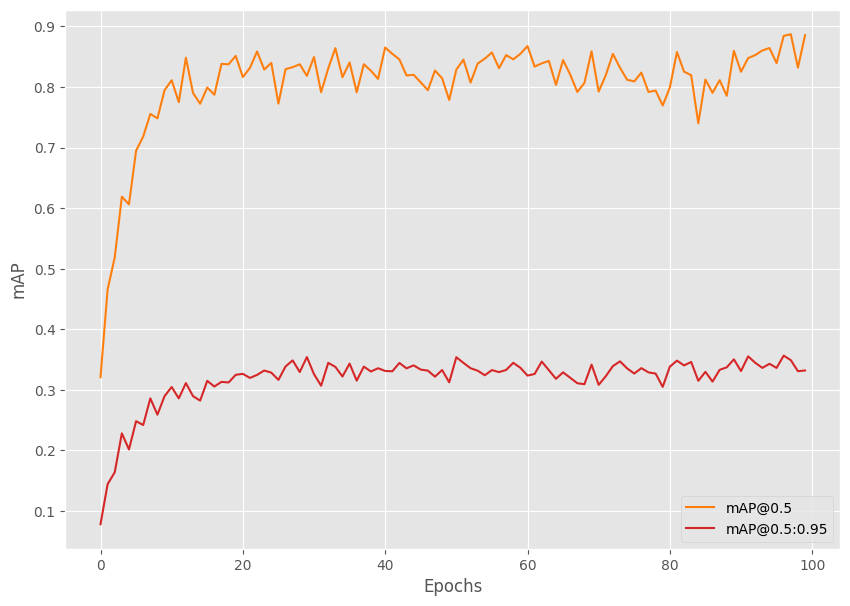

In [ ]:
from tqdm.auto import tqdm
from torchmetrics.detection.mean_ap import MeanAveragePrecision
from torch.optim.lr_scheduler import StepLR
import torch
import matplotlib.pyplot as plt
import time
import os

plt.style.use('ggplot')

seed = 42
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.cuda.manual_seed_all(seed)

# Function for running training iterations.
def train(train_data_loader, model):
    print('Training')
    model.train()

     # initialize tqdm progress bar
    prog_bar = tqdm(train_data_loader, total=len(train_data_loader))

    for i, data in enumerate(prog_bar):
        optimizer.zero_grad()
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]
        loss_dict = model(images, targets)

        losses = sum(loss for loss in loss_dict.values())
        loss_value = losses.item()

        train_loss_hist.send(loss_value)

        losses.backward()
        optimizer.step()

        # update the loss value beside the progress bar for each iteration
        prog_bar.set_description(desc=f"Loss: {loss_value:.4f}")
    return loss_value

# Function for running validation iterations.
def validate(valid_data_loader, model):
    print('Validating')
    model.eval()

    # Initialize tqdm progress bar.
    prog_bar = tqdm(valid_data_loader, total=len(valid_data_loader))
    target = []
    preds = []
    for i, data in enumerate(prog_bar):
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

        with torch.no_grad():
            outputs = model(images, targets)

        # For mAP calculation using Torchmetrics.
        #####################################
        for i in range(len(images)):
            true_dict = dict()
            preds_dict = dict()
            true_dict['boxes'] = targets[i]['boxes'].detach().cpu()
            true_dict['labels'] = targets[i]['labels'].detach().cpu()
            preds_dict['boxes'] = outputs[i]['boxes'].detach().cpu()
            preds_dict['scores'] = outputs[i]['scores'].detach().cpu()
            preds_dict['labels'] = outputs[i]['labels'].detach().cpu()
            preds.append(preds_dict)
            target.append(true_dict)
        #####################################

    metric.reset()
    metric.update(preds, target)
    metric_summary = metric.compute()
    return metric_summary

if __name__ == '__main__':
    os.makedirs('outputs', exist_ok=True)
    train_dataset = create_train_dataset(TRAIN_DIR)
    valid_dataset = create_valid_dataset(VALID_DIR)
    train_loader = create_train_loader(train_dataset, NUM_WORKERS)
    valid_loader = create_valid_loader(valid_dataset, NUM_WORKERS)
    print(f"Number of training samples: {len(train_dataset)}")
    print(f"Number of validation samples: {len(valid_dataset)}\n")

    # Initialize the model and move to the computation device.
    model = create_model(num_classes=NUM_CLASSES)
    model = model.to(DEVICE)
    # print(model)
    # Total parameters and trainable parameters.
    total_params = sum(p.numel() for p in model.parameters())
    print(f"{total_params:,} total parameters.")
    total_trainable_params = sum(
        p.numel() for p in model.parameters() if p.requires_grad)
    print(f"{total_trainable_params:,} training parameters.")
    params = [p for p in model.parameters() if p.requires_grad]
    optimizer = torch.optim.SGD(params, lr=0.001, momentum=0.9, weight_decay=0.0005, nesterov=True)
    scheduler = StepLR(
        optimizer=optimizer, step_size=15, gamma=0.1, verbose=True
    )

    # To monitor training loss
    train_loss_hist = Averager()
    # To store training loss and mAP values.
    train_loss_list = []
    map_50_list = []
    map_list = []

    # Mame to save the trained model with.
    MODEL_NAME = 'model'

    # Whether to show transformed images from data loader or not.
    # if VISUALIZE_TRANSFORMED_IMAGES:
    #     from custom_utils import show_tranformed_image
    #     show_tranformed_image(train_loader)

    # To save best model.
    save_best_model = SaveBestModel()

    metric = MeanAveragePrecision()

    # Training loop.
    for epoch in range(NUM_EPOCHS):
        print(f"\nEPOCH {epoch+1} of {NUM_EPOCHS}")

        # Reset the training loss histories for the current epoch.
        train_loss_hist.reset()

        # Start timer and carry out training and validation.
        start = time.time()
        train_loss = train(train_loader, model)
        metric_summary = validate(valid_loader, model)
        print(f"Epoch #{epoch+1} train loss: {train_loss_hist.value:.3f}")
        print(f"Epoch #{epoch+1} mAP: {metric_summary['map']}")
        end = time.time()
        print(f"Took {((end - start) / 60):.3f} minutes for epoch {epoch}")

        train_loss_list.append(train_loss)
        map_50_list.append(metric_summary['map_50'])
        map_list.append(metric_summary['map'])

        # save the best model till now.
        save_best_model(
            model, float(metric_summary['map_50']), epoch, 'outputs'
        )
        # Save the current epoch model.
        save_model(epoch, model, optimizer)

        # Save loss plot.
        save_loss_plot(OUT_DIR, train_loss_list)

        # Save mAP plot.
        save_mAP(OUT_DIR, map_50_list, map_list)
        # scheduler.step()

In [ ]:
import torch
from tqdm.auto import tqdm
from tqdm import TqdmExperimentalWarning
from torchmetrics.detection.mean_ap import MeanAveragePrecision

# Evaluation function
def validate(valid_data_loader, model):
    model.eval()

    # Initialize tqdm progress bar.
    prog_bar = tqdm(valid_data_loader, total=len(valid_data_loader))
    target = []
    preds = []
    for i, data in enumerate(prog_bar):
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

        with torch.no_grad():
            outputs = model(images, targets)

        # For mAP calculation using Torchmetrics.
        #####################################
        for i in range(len(images)):
            true_dict = dict()
            preds_dict = dict()
            true_dict['boxes'] = targets[i]['boxes'].detach().cpu()
            true_dict['labels'] = targets[i]['labels'].detach().cpu()
            preds_dict['boxes'] = outputs[i]['boxes'].detach().cpu()
            preds_dict['scores'] = outputs[i]['scores'].detach().cpu()
            preds_dict['labels'] = outputs[i]['labels'].detach().cpu()
            preds.append(preds_dict)
            target.append(true_dict)
        #####################################

    metric = MeanAveragePrecision()
    metric.update(preds, target)
    metric_summary = metric.compute()
    return metric_summary

if __name__ == '__main__':
    # Load the best model and trained weights.
    model = create_model(num_classes=NUM_CLASSES)
    checkpoint = torch.load('/content/outputs/best_model.pth', map_location=DEVICE)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.to(DEVICE).eval()

    test_dataset = create_test_dataset(
        '/content/PneumoniaDataset90-10/test'
    )
    test_loader = create_test_loader(test_dataset, num_workers=NUM_WORKERS)

    metric_summary = validate(test_loader, model)
    print(f"mAP_50: {metric_summary['map_50']*100:.3f}")
    print(f"mAP_50_95: {metric_summary['map']*100:.3f}")

  0%|          | 0/30 [00:00<?, ?it/s]

mAP_50: 88.845
mAP_50_95: 35.571


In [ ]:
import shutil
import torch
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
from torchvision.transforms.functional import to_pil_image
from torchvision.ops import box_iou

# Function to calculate Intersection over Union (IoU)
def calculate_iou(box1, box2):
    # Extract coordinates from the bounding box tensors
    box1 = [float(coord) for coord in box1]
    box2 = [float(coord) for coord in box2]

    # Calculate intersection area
    x1_int = max(box1[0], box2[0])
    y1_int = max(box1[1], box2[1])
    x2_int = min(box1[2], box2[2])
    y2_int = min(box1[3], box2[3])

    intersection = max(0, x2_int - x1_int) * max(0, y2_int - y1_int)

    # Calculate union area
    area1 = (box1[2] - box1[0]) * (box1[3] - box1[1])
    area2 = (box2[2] - box2[0]) * (box2[3] - box2[1])
    union = area1 + area2 - intersection

    # Calculate IoU
    iou = intersection / union if union > 0 else 0.0
    return iou

# source_path = "/content/drive/MyDrive/SKRIPSI/Hasil/Model_2/best_model.pth"
# destination_path = "/content/outputs/best_model.pth"

# shutil.copyfile(source_path, destination_path)

def show_iou_graph(images, true_boxes, pred_boxes, threshold=0.5, save_path="/content/iou_graph_model7.png"):
    all_ious = []

    for i in range(len(images)):
        true_boxes_i = true_boxes[i]
        pred_boxes_i = pred_boxes[i]

        ious = []  # To store IoU values for the current image

        for pred_box, score, label in zip(pred_boxes_i['boxes'], pred_boxes_i['scores'], pred_boxes_i['labels']):
            pred_box = [float(b) for b in pred_box]
            if score > threshold:
                # Find the corresponding true bounding box for the label
                true_box = true_boxes_i['boxes'][true_boxes_i['labels'] == label].cpu()
                if len(true_box) > 0:
                    true_box = [float(b) for b in true_box[0]]
                    iou = calculate_iou(pred_box, true_box)
                    ious.append(iou)

        # Store IoU values for the current image
        all_ious.append(ious)

    # Create IoU scatter plot
    plt.figure(figsize=(10, 6))
    plt.scatter(range(1, len(all_ious) + 1), [max(i, default=0) for i in all_ious], color='blue')
    plt.plot(range(1, len(all_ious) + 1), [max(i, default=0) for i in all_ious], linestyle='-', marker='o', color='blue')
    plt.title('Grafik Hasil IoU')
    plt.xlabel('Deteksi Objek ke-')
    plt.ylabel('Nilai IoU')
    plt.savefig(save_path)
    plt.show()

# Update the validate function to return images along with predictions
def validate(valid_data_loader, model):
    model.eval()

    # Initialize tqdm progress bar.
    prog_bar = tqdm(valid_data_loader, total=len(valid_data_loader))
    target = []
    preds = []
    images_list = []

    for i, data in enumerate(prog_bar):
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

        with torch.no_grad():
            outputs = model(images, targets)

        # For mAP calculation using Torchmetrics.
        for i in range(len(images)):
            true_dict = dict()
            preds_dict = dict()
            true_dict['boxes'] = targets[i]['boxes'].detach().cpu()
            true_dict['labels'] = targets[i]['labels'].detach().cpu()
            preds_dict['boxes'] = outputs[i]['boxes'].detach().cpu()
            preds_dict['scores'] = outputs[i]['scores'].detach().cpu()
            preds_dict['labels'] = outputs[i]['labels'].detach().cpu()
            preds.append(preds_dict)
            target.append(true_dict)
            images_list.append(images[i])

    return images_list, preds, target

if __name__ == '__main__':
    model = create_model(num_classes=NUM_CLASSES)
    checkpoint = torch.load('/content/outputs/best_model.pth', map_location=DEVICE)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.to(DEVICE).eval()

    test_dataset = create_test_dataset('/content/PneumoniaDataset90-10/test')
    test_loader = create_test_loader(test_dataset, num_workers=NUM_WORKERS)

    # After calculating metrics, you can display the IoU graph
    images, pred_boxes, true_boxes = validate(test_loader, model)
    # class_names = ['_Background', 'Pneumonia']
    show_iou_graph(images, true_boxes, pred_boxes, save_path='/content/iou_graph_model7.png')

In [ ]:
def make_prediction(model, img, threshold):
    model.eval()
    preds = model(img)
    for id in range(len(preds)) :
        idx_list = []

        for idx, score in enumerate(preds[id]['scores']) :
            if score > threshold :
                idx_list.append(idx)

        preds[id]['boxes'] = preds[id]['boxes'][idx_list]
        preds[id]['labels'] = preds[id]['labels'][idx_list]
        preds[id]['scores'] = preds[id]['scores'][idx_list]

    return preds

def plot_image_from_output(img, annotation):

    img = img.cpu().permute(1,2,0)

    fig,ax = plt.subplots(1)
    ax.imshow(img)

    for idx in range(len(annotation["boxes"])):
        xmin, ymin, xmax, ymax = annotation["boxes"][idx]

        if annotation['labels'][idx] == 1 :
            rect = patches.Rectangle((xmin,ymin),(xmax-xmin),(ymax-ymin),linewidth=1,edgecolor='g',facecolor='none')
        else :
            rect = patches.Rectangle((xmin,ymin),(xmax-xmin),(ymax-ymin),linewidth=1,edgecolor='orange',facecolor='none')

        ax.add_patch(rect)

    plt.show()

In [ ]:
from tqdm import tqdm

labels = []
preds_adj_all = []
annot_all = []

for im, annot in tqdm(test_loader, position = 0, leave = True):
    im = list(img.to(DEVICE) for img in im)
    #annot = [{k: v.to(device) for k, v in t.items()} for t in annot]

    for t in annot:
        labels += t['labels']

    with torch.no_grad():
        preds_adj = make_prediction(model, im, 0.5)
        preds_adj = [{k: v.to(torch.device('cpu')) for k, v in t.items()} for t in preds_adj]
        preds_adj_all.append(preds_adj)
        annot_all.append(annot)


In [ ]:
!git clone https://github.com/Pseudo-Lab/Tutorial-Book-Utils
!python Tutorial-Book-Utils/PL_data_loader.py --data FaceMaskDetection
%cd Tutorial-Book-Utils/
import utils_ObjectDetection as utils

Cloning into 'Tutorial-Book-Utils'...
remote: Enumerating objects: 45, done.
remote: Counting objects: 100% (45/45), done.
remote: Compressing objects: 100% (39/39), done.
remote: Total 45 (delta 18), reused 17 (delta 5), pack-reused 0
Receiving objects: 100% (45/45), 11.62 KiB | 11.62 MiB/s, done.
Resolving deltas: 100% (18/18), done.
Downloading...
From (original): https://drive.google.com/uc?id=16Gzn1w38yZLJpzmzKcRIRveFeHZtCEr7
From (redirected): https://drive.google.com/uc?id=16Gzn1w38yZLJpzmzKcRIRveFeHZtCEr7&confirm=t&uuid=9a4413c3-3b13-43a5-b3d8-e2d50b3fcb84
To: /content/Face Mask Detection.zip
100% 417M/417M [00:04<00:00, 103MB/s]
Face Mask Detection.zip download complete!
/content/Tutorial-Book-Utils


In [ ]:
sample_metrics = []
for batch_i in range(len(preds_adj_all)):
    sample_metrics += utils.get_batch_statistics(preds_adj_all[batch_i], annot_all[batch_i], iou_threshold=0.5)

true_positives, pred_scores, pred_labels = [torch.cat(x, 0) for x in list(zip(*sample_metrics))]  # batch semua disatukan
precision, recall, AP, f1, ap_class = utils.ap_per_class(true_positives, pred_scores, pred_labels, torch.tensor(labels))
mAP = torch.mean(AP)
print(f'mAP : {mAP}')
print(f'AP : {AP}')

mAP : 0.829118380583541
AP : tensor([0.8291], dtype=torch.float64)


In [ ]:
sample_metrics = []
for batch_i in range(len(preds_adj_all)):
    sample_metrics += utils.get_batch_statistics(preds_adj_all[batch_i], annot_all[batch_i], iou_threshold=0.4)

true_positives, pred_scores, pred_labels = [torch.cat(x, 0) for x in list(zip(*sample_metrics))]  # batch semua disatukan
precision, recall, AP, f1, ap_class = utils.ap_per_class(true_positives, pred_scores, pred_labels, torch.tensor(labels))
mAP = torch.mean(AP)
print(f'mAP : {mAP}')
print(f'AP : {AP}')

mAP : 0.9352245940666108
AP : tensor([0.9352], dtype=torch.float64)


In [ ]:
sample_metrics = []
for batch_i in range(len(preds_adj_all)):
    sample_metrics += utils.get_batch_statistics(preds_adj_all[batch_i], annot_all[batch_i], iou_threshold=0.3)

true_positives, pred_scores, pred_labels = [torch.cat(x, 0) for x in list(zip(*sample_metrics))]  # batch semua disatukan
precision, recall, AP, f1, ap_class = utils.ap_per_class(true_positives, pred_scores, pred_labels, torch.tensor(labels))
mAP = torch.mean(AP)
print(f'mAP : {mAP}')
print(f'AP : {AP}')

mAP : 0.9560592100093146
AP : tensor([0.9561], dtype=torch.float64)


In [ ]:
import numpy as np
import cv2
import torch
import glob as glob
import os
import time
import argparse
import csv

os.makedirs('inference_outputs/images', exist_ok=True)

COLORS = np.random.uniform(0, 255, size=(len(CLASSES), 3))

# Load the best model and trained weights.
model = create_model(num_classes=NUM_CLASSES)
checkpoint = torch.load('/content/outputs/best_model.pth', map_location=DEVICE)
model.load_state_dict(checkpoint['model_state_dict'])
model.to(DEVICE).eval()

# Directory where all the images are present.
DIR_TEST = '/content/PneumoniaDataset90-10/test'
test_images = glob.glob(f"{DIR_TEST}/*.jpg")
print(f"Test instances: {len(test_images)}")

frame_count = 0 # To count total frames.
total_fps = 0 # To get the final frames per second.
lung_opacity_files = []

for i in range(len(test_images)):
    # Get the image file name for saving output later on.
    image_name = test_images[i].split(os.path.sep)[-1].split('.')[0]
    image = cv2.imread(test_images[i])
    orig_image = image.copy()
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
    image /= 255.0
    image_input = np.transpose(image, (2, 0, 1)).astype(np.float32)
    image_input = torch.tensor(image_input, dtype=torch.float).cuda()
    image_input = torch.unsqueeze(image_input, 0)
    start_time = time.time()
    # Predictions
    with torch.no_grad():
        outputs = model(image_input.to(DEVICE))
    end_time = time.time()

    # Get the current fps.
    fps = 1 / (end_time - start_time)
    total_fps += fps
    frame_count += 1

    # Load all detection to CPU for further operations.
    outputs = [{k: v.to('cpu') for k, v in t.items()} for t in outputs]
    if len(outputs[0]['boxes']) != 0:
        boxes = outputs[0]['boxes'].data.numpy()
        scores = outputs[0]['scores'].data.numpy()
        boxes = boxes[scores >= 0.5].astype(np.int32)
        draw_boxes = boxes.copy()
        # Get all the predicited class names.
        pred_classes = [CLASSES[i] for i in outputs[0]['labels'].cpu().numpy()]
        # Draw the bounding boxes and write the class name on top of it.
        for j, box in enumerate(draw_boxes):
            print(image_name)
            class_name = pred_classes[j]
            color = COLORS[CLASSES.index(class_name)]
            # Recale boxes.
            xmin = int((box[0] / image.shape[1]) * orig_image.shape[1])
            ymin = int((box[1] / image.shape[0]) * orig_image.shape[0])
            xmax = int((box[2] / image.shape[1]) * orig_image.shape[1])
            ymax = int((box[3] / image.shape[0]) * orig_image.shape[0])
            cv2.rectangle(orig_image,
                        (xmin, ymin),
                        (xmax, ymax),
                        color[::-1],
                        3)
            cv2.putText(orig_image,
                        class_name,
                        (xmin, ymin-5),
                        cv2.FONT_HERSHEY_SIMPLEX,
                        0.8,
                        color[::-1],
                        2,
                        lineType=cv2.LINE_AA)
        plt.imshow(cv2.cvtColor(orig_image, cv2.COLOR_BGR2RGB))
        plt.show()

        # Simpan gambar ke direktori
        # cv2.imwrite(f"inference_outputs/images/{image_name}.jpg", orig_image)
    print(f"Image {i+1} done...")
    print('-'*50)

print('TEST PREDICTIONS COMPLETE')
avg_fps = total_fps / frame_count
print(f"Average FPS: {avg_fps:.3f}")

Output hidden; open in https://colab.research.google.com to view.

# Model 8 | BATCH : 4 | LR : 0.001 | 90:20 - FULL DATASET

In [ ]:
import zipfile
import os

zip_file_path = '/content/drive/MyDrive/SKRIPSI/Dataset/PneumoniaDataset_9010_full.zip'  # Ganti dengan path ke file ZIP Anda
unzip_dir = '/content'  # Ganti dengan direktori di mana Anda ingin mengekstrak file

def extract_zip(zip_file, extract_dir):
    with zipfile.ZipFile(zip_file, 'r') as zip_ref:
        zip_ref.extractall(extract_dir)

def list_files(directory):
    return os.listdir(directory)

# Ekstrak file ZIP
extract_zip(zip_file_path, unzip_dir)

# Tampilkan daftar file yang diekstrak
extracted_files = list_files(unzip_dir)
print(extracted_files)

['.config', '__MACOSX', 'PneumoniaDataset_9010_full', 'drive', 'sample_data']


In [ ]:
import torch
import os


DEVICE = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

BATCH_SIZE = 4 # Increase / decrease according to GPU memeory.
RESIZE_TO = 300 # Resize the image for training and transforms.
NUM_EPOCHS = 100 # Number of epochs to train for.
NUM_WORKERS = 2 # Number of parallel workers for data loading.

CLASSES = [
    '_background','Lung Opacity'
    # 'helmet','head','person'
]



TRAIN_DIR = '/content/PneumoniaDataset_9010_full/train'
VALID_DIR = '/content/PneumoniaDataset_9010_full/test'

# Classes: 0 index is reserved for background.


NUM_CLASSES = len(CLASSES)

# Whether to visualize images after crearing the data loaders.
VISUALIZE_TRANSFORMED_IMAGES = False

# Location to save model and plots.
OUT_DIR = 'outputs'
os.makedirs(OUT_DIR, exist_ok=True)

In [ ]:
import albumentations as A
import cv2
import numpy as np
import torch
import matplotlib.pyplot as plt

from albumentations.pytorch import ToTensorV2


plt.style.use('ggplot')

# This class keeps track of the training and validation loss values
# and helps to get the average for each epoch as well.
class Averager:
    def __init__(self):
        self.current_total = 0.0
        self.iterations = 0.0

    def send(self, value):
        self.current_total += value
        self.iterations += 1

    @property
    def value(self):
        if self.iterations == 0:
            return 0
        else:
            return 1.0 * self.current_total / self.iterations

    def reset(self):
        self.current_total = 0.0
        self.iterations = 0.0

class SaveBestModel:
    """
    Class to save the best model while training. If the current epoch's
    validation mAP @0.5:0.95 IoU higher than the previous highest, then save the
    model state.
    """
    def __init__(
        self, best_valid_map=float(0)
    ):
        self.best_valid_map = best_valid_map

    def __call__(
        self,
        model,
        current_valid_map,
        epoch,
        OUT_DIR,
    ):
        if current_valid_map > self.best_valid_map:
            self.best_valid_map = current_valid_map
            print(f"\nBEST VALIDATION mAP: {self.best_valid_map}")
            print(f"\nSAVING BEST MODEL FOR EPOCH: {epoch+1}\n")
            torch.save({
                'epoch': epoch+1,
                'model_state_dict': model.state_dict(),
                }, f"{OUT_DIR}/best_model.pth")

def collate_fn(batch):
    """
    To handle the data loading as different images may have different number
    of objects and to handle varying size tensors as well.
    """
    return tuple(zip(*batch))

# Define the training tranforms.
def get_train_transform():
    return A.Compose([
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.Rotate(limit=6),
        A.Blur(blur_limit=3, p=0.1),
        A.MotionBlur(blur_limit=3, p=0.1),
        A.MedianBlur(blur_limit=3, p=0.1),
        A.RandomBrightnessContrast(p=0.2),
        ToTensorV2(p=1.0),
    ], bbox_params={
        'format': 'pascal_voc',
        'label_fields': ['labels']
    })


# Define the validation transforms.
def get_valid_transform():
    return A.Compose([
        ToTensorV2(p=1.0),
    ], bbox_params={
        'format': 'pascal_voc',
        'label_fields': ['labels']
    })


def show_tranformed_image(train_loader):
    """
    This function shows the transformed images from the `train_loader`.
    Helps to check whether the tranformed images along with the corresponding
    labels are correct or not.
    Only runs if `VISUALIZE_TRANSFORMED_IMAGES = True` in config.py.
    """
    if len(train_loader) > 0:
        for i in range(1):
            images, targets = next(iter(train_loader))
            images = list(image.to(DEVICE) for image in images)
            targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]
            boxes = targets[i]['boxes'].cpu().numpy().astype(np.int32)
            labels = targets[i]['labels'].cpu().numpy().astype(np.int32)
            sample = images[i].permute(1, 2, 0).cpu().numpy()
            sample = cv2.cvtColor(sample, cv2.COLOR_RGB2BGR)
            for box_num, box in enumerate(boxes):
                cv2.rectangle(sample,
                            (box[0], box[1]),
                            (box[2], box[3]),
                            (0, 0, 255), 2)
                cv2.putText(sample, CLASSES[labels[box_num]],
                            (box[0], box[1]-10), cv2.FONT_HERSHEY_SIMPLEX,
                            1.0, (0, 0, 255), 2)
            cv2.imshow('Transformed image', sample)
            cv2.waitKey(0)
            cv2.destroyAllWindows()

def save_model(epoch, model, optimizer):
    """
    Function to save the trained model till current epoch, or whenver called
    """
    torch.save({
                'epoch': epoch+1,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                }, 'outputs/last_model.pth')

def save_loss_plot(
    OUT_DIR,
    train_loss_list,
    x_label='iterations',
    y_label='train loss',
    save_name='train_loss'
):
    """
    Function to save both train loss graph.

    :param OUT_DIR: Path to save the graphs.
    :param train_loss_list: List containing the training loss values.
    """
    figure_1 = plt.figure(figsize=(10, 7), num=1, clear=True)
    train_ax = figure_1.add_subplot()
    train_ax.plot(train_loss_list, color='tab:blue')
    train_ax.set_xlabel(x_label)
    train_ax.set_ylabel(y_label)
    figure_1.savefig(f"{OUT_DIR}/{save_name}.png")
    print('SAVING PLOTS COMPLETE...')

def save_mAP(OUT_DIR, map_05, map):
    """
    Saves the mAP@0.5 and mAP@0.5:0.95 per epoch.
    :param OUT_DIR: Path to save the graphs.
    :param map_05: List containing mAP values at 0.5 IoU.
    :param map: List containing mAP values at 0.5:0.95 IoU.
    """
    figure = plt.figure(figsize=(10, 7), num=1, clear=True)
    ax = figure.add_subplot()
    ax.plot(
        map_05, color='tab:orange', linestyle='-',
        label='mAP@0.5'
    )
    ax.plot(
        map, color='tab:red', linestyle='-',
        label='mAP@0.5:0.95'
    )
    ax.set_xlabel('Epochs')
    ax.set_ylabel('mAP')
    ax.legend()
    figure.savefig(f"{OUT_DIR}/map.png")

In [ ]:
import torch
import cv2
import numpy as np
import os
import glob as glob
from google.colab.patches import cv2_imshow
from xml.etree import ElementTree as et
from torch.utils.data import Dataset, DataLoader

# The dataset class.
class PneumoniaDataset(Dataset):
    def __init__(self, dir_path, width, height, classes, transforms=None):
        self.transforms = transforms
        self.dir_path = dir_path
        self.height = height
        self.width = width
        self.classes = classes
        self.image_file_types = ['*.jpg', '*.jpeg', '*.png', '*.ppm', '*.JPG']
        self.all_image_paths = []

        # Get all the image paths in sorted order.
        for file_type in self.image_file_types:
            self.all_image_paths.extend(glob.glob(os.path.join(self.dir_path, file_type)))
        self.all_images = [image_path.split(os.path.sep)[-1] for image_path in self.all_image_paths]
        self.all_images = sorted(self.all_images)

    def __getitem__(self, idx):
        # Capture the image name and the full image path.
        image_name = self.all_images[idx]
        image_path = os.path.join(self.dir_path, image_name)

        # Read and preprocess the image.
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
        image_resized = cv2.resize(image, (self.width, self.height))
        image_resized /= 255.0

        # Capture the corresponding XML file for getting the annotations.
        annot_filename = os.path.splitext(image_name)[0] + '.xml'
        annot_file_path = os.path.join(self.dir_path, annot_filename)

        boxes = []
        labels = []
        tree = et.parse(annot_file_path)
        root = tree.getroot()

        # Original image width and height.
        image_width = image.shape[1]
        image_height = image.shape[0]

        # Box coordinates for xml files are extracted
        # and corrected for image size given.
        for member in root.findall('object'):
            # Get label and map the `classes`.
            labels.append(self.classes.index(member.find('name').text))

            # Left corner x-coordinates.
            xmin = int(member.find('bndbox').find('xmin').text)
            # Right corner x-coordinates.
            xmax = int(member.find('bndbox').find('xmax').text)
            # Left corner y-coordinates.
            ymin = int(member.find('bndbox').find('ymin').text)
            # Right corner y-coordinates.
            ymax = int(member.find('bndbox').find('ymax').text)

            # Resize the bounding boxes according
            # to resized image `width`, `height`.
            xmin_final = (xmin/image_width)*self.width
            xmax_final = (xmax/image_width)*self.width
            ymin_final = (ymin/image_height)*self.height
            ymax_final = (ymax/image_height)*self.height

            # Check that max coordinates are at least one pixel
            # larger than min coordinates.
            if xmax_final == xmin_final:
                xmax_final += 1
            if ymax_final == ymin_final:
                ymax_final += 1
            # Check that all coordinates are within the image.
            if xmax_final > self.width:
                xmax_final = self.width
            if ymax_final > self.height:
                ymax_final = self.height

            boxes.append([xmin_final, ymin_final, xmax_final, ymax_final])

        # Bounding box to tensor.
        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        # Area of the bounding boxes.
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0]) if len(boxes) > 0 \
            else torch.as_tensor(boxes, dtype=torch.float32)
        # No crowd instances.
        iscrowd = torch.zeros((boxes.shape[0],), dtype=torch.int64)
        # Labels to tensor.
        labels = torch.as_tensor(labels, dtype=torch.int64)

        # Prepare the final `target` dictionary.
        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["area"] = area
        target["iscrowd"] = iscrowd
        image_id = torch.tensor([idx])
        target["image_id"] = image_id

        # Apply the image transforms.
        if self.transforms:
            sample = self.transforms(image = image_resized,
                                     bboxes = target['boxes'],
                                     labels = labels)
            image_resized = sample['image']
            target['boxes'] = torch.Tensor(sample['bboxes'])

        if np.isnan((target['boxes']).numpy()).any() or target['boxes'].shape == torch.Size([0]):
            target['boxes'] = torch.zeros((0, 4), dtype=torch.int64)
        return image_resized, target

    def __len__(self):
        return len(self.all_images)
        # return 500;

# Prepare the final datasets and data loaders.
def create_train_dataset(DIR):
    train_dataset = PneumoniaDataset(
        DIR, RESIZE_TO, RESIZE_TO, CLASSES, get_train_transform()
    )
    return train_dataset
def create_valid_dataset(DIR):
    valid_dataset = PneumoniaDataset(
        DIR, RESIZE_TO, RESIZE_TO, CLASSES, get_valid_transform()
    )
    return valid_dataset
def create_test_dataset(DIR):
    test_dataset = PneumoniaDataset(
        DIR, RESIZE_TO, RESIZE_TO, CLASSES, get_valid_transform()
    )
    return test_dataset
def create_train_loader(train_dataset, num_workers=0):
    train_loader = DataLoader(
        train_dataset,
        batch_size=BATCH_SIZE,
        shuffle=True,
        num_workers=num_workers,
        collate_fn=collate_fn,
        drop_last=True
    )
    return train_loader
def create_valid_loader(valid_dataset, num_workers=0):
    valid_loader = DataLoader(
        valid_dataset,
        batch_size=BATCH_SIZE,
        shuffle=False,
        num_workers=num_workers,
        collate_fn=collate_fn,
        drop_last=True
    )
    return valid_loader
def create_test_loader(test_dataset, num_workers=0):
    test_loader = DataLoader(
        test_dataset,
        batch_size=1,
        shuffle=False,
        num_workers=num_workers,
        collate_fn=collate_fn,
        drop_last=True
    )
    return test_loader


In [ ]:
import torchvision
import torch

from functools import partial
from torchvision.models.detection import RetinaNet
from torchvision.models.detection.backbone_utils import resnet_fpn_backbone
from torchvision.models.detection.retinanet import RetinaNetClassificationHead
from torchvision.models.detection import RetinaNet_ResNet50_FPN_V2_Weights
from torchvision.models.detection.retinanet import RetinaNetClassificationHead

def create_model(num_classes):
    model = torchvision.models.detection.retinanet_resnet50_fpn_v2(
        weights=RetinaNet_ResNet50_FPN_V2_Weights.COCO_V1
    )
    num_anchors = model.head.classification_head.num_anchors

    model.head.classification_head = RetinaNetClassificationHead(
        in_channels=256,
        num_anchors=num_anchors,
        num_classes=num_classes,
        norm_layer=partial(torch.nn.GroupNorm, 32)
    )
    return model

if __name__ == '__main__':
    model = create_model(2)
    # print(model)
    # Total parameters and trainable parameters.
    total_params = sum(p.numel() for p in model.parameters())
    print(f"{total_params:,} total parameters.")
    total_trainable_params = sum(
        p.numel() for p in model.parameters() if p.requires_grad)
    print(f"{total_trainable_params:,} training parameters.")

Downloading: "https://download.pytorch.org/models/retinanet_resnet50_fpn_v2_coco-5905b1c5.pth" to /root/.cache/torch/hub/checkpoints/retinanet_resnet50_fpn_v2_coco-5905b1c5.pth
100%|██████████| 146M/146M [00:01<00:00, 83.4MB/s]


36,352,630 total parameters.
36,127,286 training parameters.


In [ ]:
!pip install torchmetrics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 840.2/840.2 kB 1.7 MB/s eta 0:00:00


Number of training samples: 5411
Number of validation samples: 601

36,352,630 total parameters.
36,127,286 training parameters.
Adjusting learning rate of group 0 to 1.0000e-03.

EPOCH 1 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torchmetrics/utilities/prints.py:43: UserWarning: Encountered more than 100 detections in a single image. This means that certain detections with the lowest scores will be ignored, that may have an undesirable impact on performance. Please consider adjusting the `max_detection_threshold` to suit your use case. To disable this warning, set attribute class `warn_on_many_detections=False`, after initializing the metric.
  warnings.warn(*args, **kwargs)  # noqa: B028


Epoch #1 train loss: 0.779
Epoch #1 mAP: 0.23668015003204346
Took 3.046 minutes for epoch 0

BEST VALIDATION mAP: 0.6857260465621948

SAVING BEST MODEL FOR EPOCH: 1

SAVING PLOTS COMPLETE...

EPOCH 2 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #2 train loss: 0.682
Epoch #2 mAP: 0.26919248700141907
Took 3.158 minutes for epoch 1

BEST VALIDATION mAP: 0.7289313077926636

SAVING BEST MODEL FOR EPOCH: 2

SAVING PLOTS COMPLETE...

EPOCH 3 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #3 train loss: 0.654
Epoch #3 mAP: 0.28445330262184143
Took 2.808 minutes for epoch 2

BEST VALIDATION mAP: 0.759224534034729

SAVING BEST MODEL FOR EPOCH: 3

SAVING PLOTS COMPLETE...

EPOCH 4 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #4 train loss: 0.637
Epoch #4 mAP: 0.28743162751197815
Took 3.478 minutes for epoch 3
SAVING PLOTS COMPLETE...

EPOCH 5 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #5 train loss: 0.627
Epoch #5 mAP: 0.2980380654335022
Took 2.808 minutes for epoch 4

BEST VALIDATION mAP: 0.771285355091095

SAVING BEST MODEL FOR EPOCH: 5

SAVING PLOTS COMPLETE...

EPOCH 6 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #6 train loss: 0.617
Epoch #6 mAP: 0.2916342318058014
Took 2.965 minutes for epoch 5
SAVING PLOTS COMPLETE...

EPOCH 7 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #7 train loss: 0.612
Epoch #7 mAP: 0.29178881645202637
Took 3.141 minutes for epoch 6
SAVING PLOTS COMPLETE...

EPOCH 8 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #8 train loss: 0.607
Epoch #8 mAP: 0.29533758759498596
Took 2.798 minutes for epoch 7
SAVING PLOTS COMPLETE...

EPOCH 9 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f18ebbd83a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f18ebbd83a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #9 train loss: 0.600
Epoch #9 mAP: 0.30170199275016785
Took 2.799 minutes for epoch 8

BEST VALIDATION mAP: 0.7807676196098328

SAVING BEST MODEL FOR EPOCH: 9

SAVING PLOTS COMPLETE...

EPOCH 10 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #10 train loss: 0.595
Epoch #10 mAP: 0.30475887656211853
Took 3.300 minutes for epoch 9

BEST VALIDATION mAP: 0.790916383266449

SAVING BEST MODEL FOR EPOCH: 10

SAVING PLOTS COMPLETE...

EPOCH 11 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #11 train loss: 0.593
Epoch #11 mAP: 0.3015589714050293
Took 2.963 minutes for epoch 10
SAVING PLOTS COMPLETE...

EPOCH 12 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #12 train loss: 0.588
Epoch #12 mAP: 0.3063821792602539
Took 3.307 minutes for epoch 11
SAVING PLOTS COMPLETE...

EPOCH 13 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #13 train loss: 0.584
Epoch #13 mAP: 0.3037581443786621
Took 2.794 minutes for epoch 12
SAVING PLOTS COMPLETE...

EPOCH 14 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #14 train loss: 0.580
Epoch #14 mAP: 0.314700186252594
Took 3.471 minutes for epoch 13

BEST VALIDATION mAP: 0.7950663566589355

SAVING BEST MODEL FOR EPOCH: 14

SAVING PLOTS COMPLETE...

EPOCH 15 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #15 train loss: 0.577
Epoch #15 mAP: 0.31382840871810913
Took 2.967 minutes for epoch 14
SAVING PLOTS COMPLETE...

EPOCH 16 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #16 train loss: 0.574
Epoch #16 mAP: 0.3141748011112213
Took 3.298 minutes for epoch 15
SAVING PLOTS COMPLETE...

EPOCH 17 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #17 train loss: 0.570
Epoch #17 mAP: 0.29891330003738403
Took 2.799 minutes for epoch 16
SAVING PLOTS COMPLETE...

EPOCH 18 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #18 train loss: 0.569
Epoch #18 mAP: 0.3238023519515991
Took 3.470 minutes for epoch 17

BEST VALIDATION mAP: 0.8005791306495667

SAVING BEST MODEL FOR EPOCH: 18

SAVING PLOTS COMPLETE...

EPOCH 19 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #19 train loss: 0.567
Epoch #19 mAP: 0.31732112169265747
Took 2.964 minutes for epoch 18
SAVING PLOTS COMPLETE...

EPOCH 20 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f18ebbd83a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f18ebbd83a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #20 train loss: 0.561
Epoch #20 mAP: 0.3079695999622345
Took 3.141 minutes for epoch 19
SAVING PLOTS COMPLETE...

EPOCH 21 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #21 train loss: 0.559
Epoch #21 mAP: 0.32078713178634644
Took 2.970 minutes for epoch 20
SAVING PLOTS COMPLETE...

EPOCH 22 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #22 train loss: 0.557
Epoch #22 mAP: 0.32121720910072327
Took 3.301 minutes for epoch 21
SAVING PLOTS COMPLETE...

EPOCH 23 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #23 train loss: 0.554
Epoch #23 mAP: 0.3183717429637909
Took 3.138 minutes for epoch 22
SAVING PLOTS COMPLETE...

EPOCH 24 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #24 train loss: 0.552
Epoch #24 mAP: 0.3104837238788605
Took 2.972 minutes for epoch 23
SAVING PLOTS COMPLETE...

EPOCH 25 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #25 train loss: 0.549
Epoch #25 mAP: 0.31497862935066223
Took 2.959 minutes for epoch 24
SAVING PLOTS COMPLETE...

EPOCH 26 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #26 train loss: 0.547
Epoch #26 mAP: 0.3190944790840149
Took 3.466 minutes for epoch 25

BEST VALIDATION mAP: 0.805364191532135

SAVING BEST MODEL FOR EPOCH: 26

SAVING PLOTS COMPLETE...

EPOCH 27 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #27 train loss: 0.543
Epoch #27 mAP: 0.3152213990688324
Took 2.960 minutes for epoch 26
SAVING PLOTS COMPLETE...

EPOCH 28 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #28 train loss: 0.541
Epoch #28 mAP: 0.3008112907409668
Took 3.308 minutes for epoch 27
SAVING PLOTS COMPLETE...

EPOCH 29 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #29 train loss: 0.540
Epoch #29 mAP: 0.3163183331489563
Took 2.798 minutes for epoch 28
SAVING PLOTS COMPLETE...

EPOCH 30 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #30 train loss: 0.537
Epoch #30 mAP: 0.311660498380661
Took 3.467 minutes for epoch 29
SAVING PLOTS COMPLETE...

EPOCH 31 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #31 train loss: 0.533
Epoch #31 mAP: 0.3045691251754761
Took 2.973 minutes for epoch 30
SAVING PLOTS COMPLETE...

EPOCH 32 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #32 train loss: 0.531
Epoch #32 mAP: 0.30769920349121094
Took 3.301 minutes for epoch 31
SAVING PLOTS COMPLETE...

EPOCH 33 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f18ebbd83a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f18ebbd83a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #33 train loss: 0.529
Epoch #33 mAP: 0.3156515657901764
Took 2.794 minutes for epoch 32
SAVING PLOTS COMPLETE...

EPOCH 34 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #34 train loss: 0.526
Epoch #34 mAP: 0.31021010875701904
Took 3.299 minutes for epoch 33
SAVING PLOTS COMPLETE...

EPOCH 35 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #35 train loss: 0.524
Epoch #35 mAP: 0.30606168508529663
Took 2.959 minutes for epoch 34
SAVING PLOTS COMPLETE...

EPOCH 36 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #36 train loss: 0.521
Epoch #36 mAP: 0.31233641505241394
Took 3.308 minutes for epoch 35
SAVING PLOTS COMPLETE...

EPOCH 37 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #37 train loss: 0.519
Epoch #37 mAP: 0.30794501304626465
Took 2.961 minutes for epoch 36
SAVING PLOTS COMPLETE...

EPOCH 38 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #38 train loss: 0.516
Epoch #38 mAP: 0.31548386812210083
Took 2.960 minutes for epoch 37
SAVING PLOTS COMPLETE...

EPOCH 39 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #39 train loss: 0.513
Epoch #39 mAP: 0.3080763518810272
Took 3.471 minutes for epoch 38
SAVING PLOTS COMPLETE...

EPOCH 40 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #40 train loss: 0.510
Epoch #40 mAP: 0.308707058429718
Took 2.973 minutes for epoch 39
SAVING PLOTS COMPLETE...

EPOCH 41 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #41 train loss: 0.509
Epoch #41 mAP: 0.3069135248661041
Took 3.302 minutes for epoch 40
SAVING PLOTS COMPLETE...

EPOCH 42 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #42 train loss: 0.506
Epoch #42 mAP: 0.2997303009033203
Took 2.968 minutes for epoch 41
SAVING PLOTS COMPLETE...

EPOCH 43 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #43 train loss: 0.504
Epoch #43 mAP: 0.29731911420822144
Took 3.289 minutes for epoch 42
SAVING PLOTS COMPLETE...

EPOCH 44 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #44 train loss: 0.499
Epoch #44 mAP: 0.30220314860343933
Took 2.950 minutes for epoch 43
SAVING PLOTS COMPLETE...

EPOCH 45 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #45 train loss: 0.497
Epoch #45 mAP: 0.3026494085788727
Took 2.950 minutes for epoch 44
SAVING PLOTS COMPLETE...

EPOCH 46 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #46 train loss: 0.495
Epoch #46 mAP: 0.30244067311286926
Took 3.456 minutes for epoch 45
SAVING PLOTS COMPLETE...

EPOCH 47 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #47 train loss: 0.493
Epoch #47 mAP: 0.2989135980606079
Took 2.794 minutes for epoch 46
SAVING PLOTS COMPLETE...

EPOCH 48 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #48 train loss: 0.490
Epoch #48 mAP: 0.29685962200164795
Took 3.450 minutes for epoch 47
SAVING PLOTS COMPLETE...

EPOCH 49 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #49 train loss: 0.486
Epoch #49 mAP: 0.3025749921798706
Took 2.941 minutes for epoch 48
SAVING PLOTS COMPLETE...

EPOCH 50 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #50 train loss: 0.484
Epoch #50 mAP: 0.2886739671230316
Took 2.954 minutes for epoch 49
SAVING PLOTS COMPLETE...

EPOCH 51 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f18ebbd83a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f18ebbd83a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f18ebbd83a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f18ebbd83a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #51 train loss: 0.480
Epoch #51 mAP: 0.2823927700519562
Took 2.803 minutes for epoch 50
SAVING PLOTS COMPLETE...

EPOCH 52 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #52 train loss: 0.478
Epoch #52 mAP: 0.29288724064826965
Took 2.958 minutes for epoch 51
SAVING PLOTS COMPLETE...

EPOCH 53 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #53 train loss: 0.477
Epoch #53 mAP: 0.2870788276195526
Took 3.298 minutes for epoch 52
SAVING PLOTS COMPLETE...

EPOCH 54 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #54 train loss: 0.474
Epoch #54 mAP: 0.29318171739578247
Took 2.946 minutes for epoch 53
SAVING PLOTS COMPLETE...

EPOCH 55 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #55 train loss: 0.469
Epoch #55 mAP: 0.27712830901145935
Took 3.294 minutes for epoch 54
SAVING PLOTS COMPLETE...

EPOCH 56 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #56 train loss: 0.469
Epoch #56 mAP: 0.2829088866710663
Took 2.949 minutes for epoch 55
SAVING PLOTS COMPLETE...

EPOCH 57 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #57 train loss: 0.466
Epoch #57 mAP: 0.29669684171676636
Took 2.780 minutes for epoch 56
SAVING PLOTS COMPLETE...

EPOCH 58 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #58 train loss: 0.462
Epoch #58 mAP: 0.2911789119243622
Took 3.617 minutes for epoch 57
SAVING PLOTS COMPLETE...

EPOCH 59 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #59 train loss: 0.461
Epoch #59 mAP: 0.2799690067768097
Took 2.952 minutes for epoch 58
SAVING PLOTS COMPLETE...

EPOCH 60 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f18ebbd83a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f18ebbd83a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #60 train loss: 0.457
Epoch #60 mAP: 0.2960917055606842
Took 3.118 minutes for epoch 59
SAVING PLOTS COMPLETE...

EPOCH 61 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #61 train loss: 0.454
Epoch #61 mAP: 0.27190783619880676
Took 2.950 minutes for epoch 60
SAVING PLOTS COMPLETE...

EPOCH 62 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #62 train loss: 0.452
Epoch #62 mAP: 0.2720612585544586
Took 2.954 minutes for epoch 61
SAVING PLOTS COMPLETE...

EPOCH 63 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #63 train loss: 0.447
Epoch #63 mAP: 0.2928393483161926
Took 3.447 minutes for epoch 62
SAVING PLOTS COMPLETE...

EPOCH 64 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #64 train loss: 0.447
Epoch #64 mAP: 0.28177008032798767
Took 2.779 minutes for epoch 63
SAVING PLOTS COMPLETE...

EPOCH 65 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #65 train loss: 0.444
Epoch #65 mAP: 0.281820148229599
Took 2.951 minutes for epoch 64
SAVING PLOTS COMPLETE...

EPOCH 66 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #66 train loss: 0.442
Epoch #66 mAP: 0.2732061445713043
Took 3.461 minutes for epoch 65
SAVING PLOTS COMPLETE...

EPOCH 67 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #67 train loss: 0.438
Epoch #67 mAP: 0.2613600492477417
Took 2.951 minutes for epoch 66
SAVING PLOTS COMPLETE...

EPOCH 68 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #68 train loss: 0.437
Epoch #68 mAP: 0.2785153090953827
Took 2.952 minutes for epoch 67
SAVING PLOTS COMPLETE...

EPOCH 69 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #69 train loss: 0.432
Epoch #69 mAP: 0.2745421528816223
Took 3.450 minutes for epoch 68
SAVING PLOTS COMPLETE...

EPOCH 70 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #70 train loss: 0.430
Epoch #70 mAP: 0.2670498788356781
Took 2.959 minutes for epoch 69
SAVING PLOTS COMPLETE...

EPOCH 71 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #71 train loss: 0.424
Epoch #71 mAP: 0.2675924599170685
Took 2.944 minutes for epoch 70
SAVING PLOTS COMPLETE...

EPOCH 72 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #72 train loss: 0.426
Epoch #72 mAP: 0.27481257915496826
Took 2.945 minutes for epoch 71
SAVING PLOTS COMPLETE...

EPOCH 73 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #73 train loss: 0.419
Epoch #73 mAP: 0.2674906253814697
Took 2.951 minutes for epoch 72
SAVING PLOTS COMPLETE...

EPOCH 74 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f18ebbd83a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f18ebbd83a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #74 train loss: 0.419
Epoch #74 mAP: 0.2643343210220337
Took 3.129 minutes for epoch 73
SAVING PLOTS COMPLETE...

EPOCH 75 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #75 train loss: 0.420
Epoch #75 mAP: 0.2610429525375366
Took 2.785 minutes for epoch 74
SAVING PLOTS COMPLETE...

EPOCH 76 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #76 train loss: 0.412
Epoch #76 mAP: 0.2634470760822296
Took 2.786 minutes for epoch 75
SAVING PLOTS COMPLETE...

EPOCH 77 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #77 train loss: 0.411
Epoch #77 mAP: 0.27098795771598816
Took 3.792 minutes for epoch 76
SAVING PLOTS COMPLETE...

EPOCH 78 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #78 train loss: 0.409
Epoch #78 mAP: 0.2618809640407562
Took 2.964 minutes for epoch 77
SAVING PLOTS COMPLETE...

EPOCH 79 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #79 train loss: 0.406
Epoch #79 mAP: 0.25817984342575073
Took 2.947 minutes for epoch 78
SAVING PLOTS COMPLETE...

EPOCH 80 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #80 train loss: 0.402
Epoch #80 mAP: 0.27214884757995605
Took 2.949 minutes for epoch 79
SAVING PLOTS COMPLETE...

EPOCH 81 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #81 train loss: 0.402
Epoch #81 mAP: 0.2682555615901947
Took 2.953 minutes for epoch 80
SAVING PLOTS COMPLETE...

EPOCH 82 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #82 train loss: 0.396
Epoch #82 mAP: 0.26908981800079346
Took 2.785 minutes for epoch 81
SAVING PLOTS COMPLETE...

EPOCH 83 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f18ebbd83a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f18ebbd83a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #83 train loss: 0.395
Epoch #83 mAP: 0.2598380744457245
Took 2.783 minutes for epoch 82
SAVING PLOTS COMPLETE...

EPOCH 84 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #84 train loss: 0.392
Epoch #84 mAP: 0.27156177163124084
Took 2.951 minutes for epoch 83
SAVING PLOTS COMPLETE...

EPOCH 85 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #85 train loss: 0.387
Epoch #85 mAP: 0.26309236884117126
Took 3.298 minutes for epoch 84
SAVING PLOTS COMPLETE...

EPOCH 86 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f18ebbd83a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f18ebbd83a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #86 train loss: 0.387
Epoch #86 mAP: 0.26417940855026245
Took 2.949 minutes for epoch 85
SAVING PLOTS COMPLETE...

EPOCH 87 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #87 train loss: 0.382
Epoch #87 mAP: 0.25658002495765686
Took 2.948 minutes for epoch 86
SAVING PLOTS COMPLETE...

EPOCH 88 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #88 train loss: 0.378
Epoch #88 mAP: 0.26612263917922974
Took 3.450 minutes for epoch 87
SAVING PLOTS COMPLETE...

EPOCH 89 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #89 train loss: 0.376
Epoch #89 mAP: 0.2624795138835907
Took 2.951 minutes for epoch 88
SAVING PLOTS COMPLETE...

EPOCH 90 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #90 train loss: 0.378
Epoch #90 mAP: 0.2576015889644623
Took 2.944 minutes for epoch 89
SAVING PLOTS COMPLETE...

EPOCH 91 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #91 train loss: 0.374
Epoch #91 mAP: 0.26234760880470276
Took 2.945 minutes for epoch 90
SAVING PLOTS COMPLETE...

EPOCH 92 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #92 train loss: 0.370
Epoch #92 mAP: 0.2673950791358948
Took 2.783 minutes for epoch 91
SAVING PLOTS COMPLETE...

EPOCH 93 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #93 train loss: 0.369
Epoch #93 mAP: 0.2539334297180176
Took 2.948 minutes for epoch 92
SAVING PLOTS COMPLETE...

EPOCH 94 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #94 train loss: 0.365
Epoch #94 mAP: 0.2719055414199829
Took 2.945 minutes for epoch 93
SAVING PLOTS COMPLETE...

EPOCH 95 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #95 train loss: 0.362
Epoch #95 mAP: 0.2758013606071472
Took 2.951 minutes for epoch 94
SAVING PLOTS COMPLETE...

EPOCH 96 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #96 train loss: 0.363
Epoch #96 mAP: 0.26873940229415894
Took 2.952 minutes for epoch 95
SAVING PLOTS COMPLETE...

EPOCH 97 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #97 train loss: 0.358
Epoch #97 mAP: 0.24432647228240967
Took 3.285 minutes for epoch 96
SAVING PLOTS COMPLETE...

EPOCH 98 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #98 train loss: 0.352
Epoch #98 mAP: 0.25054219365119934
Took 2.944 minutes for epoch 97
SAVING PLOTS COMPLETE...

EPOCH 99 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Epoch #99 train loss: 0.350
Epoch #99 mAP: 0.25874465703964233
Took 2.939 minutes for epoch 98
SAVING PLOTS COMPLETE...

EPOCH 100 of 100
Training


  0%|          | 0/1352 [00:00<?, ?it/s]

Validating


  0%|          | 0/150 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f18ebbd83a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f18ebbd83a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #100 train loss: 0.347
Epoch #100 mAP: 0.2405986785888672
Took 2.951 minutes for epoch 99
SAVING PLOTS COMPLETE...


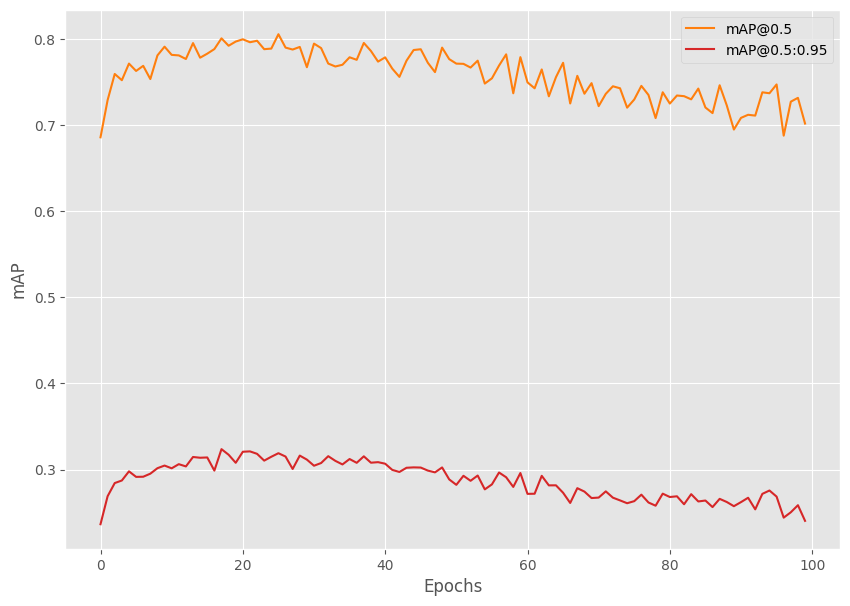

In [ ]:
from tqdm.auto import tqdm
from torchmetrics.detection.mean_ap import MeanAveragePrecision
from torch.optim.lr_scheduler import StepLR
import torch
import matplotlib.pyplot as plt
import time
import os

plt.style.use('ggplot')

seed = 42
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.cuda.manual_seed_all(seed)

# Function for running training iterations.
def train(train_data_loader, model):
    print('Training')
    model.train()

     # initialize tqdm progress bar
    prog_bar = tqdm(train_data_loader, total=len(train_data_loader))

    for i, data in enumerate(prog_bar):
        optimizer.zero_grad()
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]
        loss_dict = model(images, targets)

        losses = sum(loss for loss in loss_dict.values())
        loss_value = losses.item()

        train_loss_hist.send(loss_value)

        losses.backward()
        optimizer.step()

        # update the loss value beside the progress bar for each iteration
        prog_bar.set_description(desc=f"Loss: {loss_value:.4f}")
    return loss_value

# Function for running validation iterations.
def validate(valid_data_loader, model):
    print('Validating')
    model.eval()

    # Initialize tqdm progress bar.
    prog_bar = tqdm(valid_data_loader, total=len(valid_data_loader))
    target = []
    preds = []
    for i, data in enumerate(prog_bar):
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

        with torch.no_grad():
            outputs = model(images, targets)

        # For mAP calculation using Torchmetrics.
        #####################################
        for i in range(len(images)):
            true_dict = dict()
            preds_dict = dict()
            true_dict['boxes'] = targets[i]['boxes'].detach().cpu()
            true_dict['labels'] = targets[i]['labels'].detach().cpu()
            preds_dict['boxes'] = outputs[i]['boxes'].detach().cpu()
            preds_dict['scores'] = outputs[i]['scores'].detach().cpu()
            preds_dict['labels'] = outputs[i]['labels'].detach().cpu()
            preds.append(preds_dict)
            target.append(true_dict)
        #####################################

    metric.reset()
    metric.update(preds, target)
    metric_summary = metric.compute()
    return metric_summary

if __name__ == '__main__':
    os.makedirs('outputs', exist_ok=True)
    train_dataset = create_train_dataset(TRAIN_DIR)
    valid_dataset = create_valid_dataset(VALID_DIR)
    train_loader = create_train_loader(train_dataset, NUM_WORKERS)
    valid_loader = create_valid_loader(valid_dataset, NUM_WORKERS)
    print(f"Number of training samples: {len(train_dataset)}")
    print(f"Number of validation samples: {len(valid_dataset)}\n")

    # Initialize the model and move to the computation device.
    model = create_model(num_classes=NUM_CLASSES)
    model = model.to(DEVICE)
    # print(model)
    # Total parameters and trainable parameters.
    total_params = sum(p.numel() for p in model.parameters())
    print(f"{total_params:,} total parameters.")
    total_trainable_params = sum(
        p.numel() for p in model.parameters() if p.requires_grad)
    print(f"{total_trainable_params:,} training parameters.")
    params = [p for p in model.parameters() if p.requires_grad]
    optimizer = torch.optim.SGD(params, lr=0.001, momentum=0.9, weight_decay=0.0005, nesterov=True)
    scheduler = StepLR(
        optimizer=optimizer, step_size=15, gamma=0.1, verbose=True
    )

    # To monitor training loss
    train_loss_hist = Averager()
    # To store training loss and mAP values.
    train_loss_list = []
    map_50_list = []
    map_list = []

    # Mame to save the trained model with.
    MODEL_NAME = 'model'

    # Whether to show transformed images from data loader or not.
    # if VISUALIZE_TRANSFORMED_IMAGES:
    #     from custom_utils import show_tranformed_image
    #     show_tranformed_image(train_loader)

    # To save best model.
    save_best_model = SaveBestModel()

    metric = MeanAveragePrecision()

    # Training loop.
    for epoch in range(NUM_EPOCHS):
        print(f"\nEPOCH {epoch+1} of {NUM_EPOCHS}")

        # Reset the training loss histories for the current epoch.
        train_loss_hist.reset()

        # Start timer and carry out training and validation.
        start = time.time()
        train_loss = train(train_loader, model)
        metric_summary = validate(valid_loader, model)
        print(f"Epoch #{epoch+1} train loss: {train_loss_hist.value:.3f}")
        print(f"Epoch #{epoch+1} mAP: {metric_summary['map']}")
        end = time.time()
        print(f"Took {((end - start) / 60):.3f} minutes for epoch {epoch}")

        train_loss_list.append(train_loss)
        map_50_list.append(metric_summary['map_50'])
        map_list.append(metric_summary['map'])

        # save the best model till now.
        save_best_model(
            model, float(metric_summary['map_50']), epoch, 'outputs'
        )
        # Save the current epoch model.
        save_model(epoch, model, optimizer)

        # Save loss plot.
        save_loss_plot(OUT_DIR, train_loss_list)

        # Save mAP plot.
        save_mAP(OUT_DIR, map_50_list, map_list)
        # scheduler.step()

In [ ]:
import torch
from tqdm.auto import tqdm
from tqdm import TqdmExperimentalWarning
from torchmetrics.detection.mean_ap import MeanAveragePrecision

# Evaluation function
def validate(valid_data_loader, model):
    model.eval()

    # Initialize tqdm progress bar.
    prog_bar = tqdm(valid_data_loader, total=len(valid_data_loader))
    target = []
    preds = []
    for i, data in enumerate(prog_bar):
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

        with torch.no_grad():
            outputs = model(images, targets)

        # For mAP calculation using Torchmetrics.
        #####################################
        for i in range(len(images)):
            true_dict = dict()
            preds_dict = dict()
            true_dict['boxes'] = targets[i]['boxes'].detach().cpu()
            true_dict['labels'] = targets[i]['labels'].detach().cpu()
            preds_dict['boxes'] = outputs[i]['boxes'].detach().cpu()
            preds_dict['scores'] = outputs[i]['scores'].detach().cpu()
            preds_dict['labels'] = outputs[i]['labels'].detach().cpu()
            preds.append(preds_dict)
            target.append(true_dict)
        #####################################

    metric = MeanAveragePrecision()
    metric.update(preds, target)
    metric_summary = metric.compute()
    return metric_summary

if __name__ == '__main__':
    # Load the best model and trained weights.
    model = create_model(num_classes=NUM_CLASSES)
    checkpoint = torch.load('/content/outputs/best_model.pth', map_location=DEVICE)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.to(DEVICE).eval()

    test_dataset = create_test_dataset(
        '/content/PneumoniaDataset_9010_full/test'
    )
    test_loader = create_test_loader(test_dataset, num_workers=NUM_WORKERS)

    metric_summary = validate(test_loader, model)
    print(f"mAP_50: {metric_summary['map_50']*100:.3f}")
    print(f"mAP_50_95: {metric_summary['map']*100:.3f}")

  0%|          | 0/601 [00:00<?, ?it/s]

mAP_50: 80.522
mAP_50_95: 31.903


In [ ]:
import shutil
import torch
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
from torchvision.transforms.functional import to_pil_image
from torchvision.ops import box_iou

# Function to calculate Intersection over Union (IoU)
def calculate_iou(box1, box2):
    # Extract coordinates from the bounding box tensors
    box1 = [float(coord) for coord in box1]
    box2 = [float(coord) for coord in box2]

    # Calculate intersection area
    x1_int = max(box1[0], box2[0])
    y1_int = max(box1[1], box2[1])
    x2_int = min(box1[2], box2[2])
    y2_int = min(box1[3], box2[3])

    intersection = max(0, x2_int - x1_int) * max(0, y2_int - y1_int)

    # Calculate union area
    area1 = (box1[2] - box1[0]) * (box1[3] - box1[1])
    area2 = (box2[2] - box2[0]) * (box2[3] - box2[1])
    union = area1 + area2 - intersection

    # Calculate IoU
    iou = intersection / union if union > 0 else 0.0
    return iou

# source_path = "/content/drive/MyDrive/SKRIPSI/Hasil/Model_2/best_model.pth"
# destination_path = "/content/outputs/best_model.pth"

# shutil.copyfile(source_path, destination_path)

def show_iou_graph(images, true_boxes, pred_boxes, threshold=0.5, save_path="/content/iou_graph_model8.png"):
    all_ious = []

    for i in range(len(images)):
        true_boxes_i = true_boxes[i]
        pred_boxes_i = pred_boxes[i]

        ious = []  # To store IoU values for the current image

        for pred_box, score, label in zip(pred_boxes_i['boxes'], pred_boxes_i['scores'], pred_boxes_i['labels']):
            pred_box = [float(b) for b in pred_box]
            if score > threshold:
                # Find the corresponding true bounding box for the label
                true_box = true_boxes_i['boxes'][true_boxes_i['labels'] == label].cpu()
                if len(true_box) > 0:
                    true_box = [float(b) for b in true_box[0]]
                    iou = calculate_iou(pred_box, true_box)
                    ious.append(iou)

        # Store IoU values for the current image
        all_ious.append(ious)

    # Create IoU scatter plot
    plt.figure(figsize=(10, 6))
    plt.scatter(range(1, len(all_ious) + 1), [max(i, default=0) for i in all_ious], color='blue')
    plt.plot(range(1, len(all_ious) + 1), [max(i, default=0) for i in all_ious], linestyle='-', marker='o', color='blue')
    plt.title('Grafik Hasil IoU')
    plt.xlabel('Deteksi Objek ke-')
    plt.ylabel('Nilai IoU')
    plt.savefig(save_path)
    plt.show()

# Update the validate function to return images along with predictions
def validate(valid_data_loader, model):
    model.eval()

    # Initialize tqdm progress bar.
    prog_bar = tqdm(valid_data_loader, total=len(valid_data_loader))
    target = []
    preds = []
    images_list = []

    for i, data in enumerate(prog_bar):
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

        with torch.no_grad():
            outputs = model(images, targets)

        # For mAP calculation using Torchmetrics.
        for i in range(len(images)):
            true_dict = dict()
            preds_dict = dict()
            true_dict['boxes'] = targets[i]['boxes'].detach().cpu()
            true_dict['labels'] = targets[i]['labels'].detach().cpu()
            preds_dict['boxes'] = outputs[i]['boxes'].detach().cpu()
            preds_dict['scores'] = outputs[i]['scores'].detach().cpu()
            preds_dict['labels'] = outputs[i]['labels'].detach().cpu()
            preds.append(preds_dict)
            target.append(true_dict)
            images_list.append(images[i])

    return images_list, preds, target

if __name__ == '__main__':
    model = create_model(num_classes=NUM_CLASSES)
    checkpoint = torch.load('/content/outputs/best_model.pth', map_location=DEVICE)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.to(DEVICE).eval()

    test_dataset = create_test_dataset('/content/PneumoniaDataset_9010_full/test')
    test_loader = create_test_loader(test_dataset, num_workers=NUM_WORKERS)

    # After calculating metrics, you can display the IoU graph
    images, pred_boxes, true_boxes = validate(test_loader, model)
    # class_names = ['_Background', 'Pneumonia']
    show_iou_graph(images, true_boxes, pred_boxes, save_path='/content/iou_graph_model8.png')

In [ ]:
def make_prediction(model, img, threshold):
    model.eval()
    preds = model(img)
    for id in range(len(preds)) :
        idx_list = []

        for idx, score in enumerate(preds[id]['scores']) :
            if score > threshold :
                idx_list.append(idx)

        preds[id]['boxes'] = preds[id]['boxes'][idx_list]
        preds[id]['labels'] = preds[id]['labels'][idx_list]
        preds[id]['scores'] = preds[id]['scores'][idx_list]

    return preds

def plot_image_from_output(img, annotation):

    img = img.cpu().permute(1,2,0)

    fig,ax = plt.subplots(1)
    ax.imshow(img)

    for idx in range(len(annotation["boxes"])):
        xmin, ymin, xmax, ymax = annotation["boxes"][idx]

        if annotation['labels'][idx] == 1 :
            rect = patches.Rectangle((xmin,ymin),(xmax-xmin),(ymax-ymin),linewidth=1,edgecolor='g',facecolor='none')
        else :
            rect = patches.Rectangle((xmin,ymin),(xmax-xmin),(ymax-ymin),linewidth=1,edgecolor='orange',facecolor='none')

        ax.add_patch(rect)

    plt.show()

In [ ]:
from tqdm import tqdm

labels = []
preds_adj_all = []
annot_all = []

for im, annot in tqdm(test_loader, position = 0, leave = True):
    im = list(img.to(DEVICE) for img in im)
    #annot = [{k: v.to(device) for k, v in t.items()} for t in annot]

    for t in annot:
        labels += t['labels']

    with torch.no_grad():
        preds_adj = make_prediction(model, im, 0.5)
        preds_adj = [{k: v.to(torch.device('cpu')) for k, v in t.items()} for t in preds_adj]
        preds_adj_all.append(preds_adj)
        annot_all.append(annot)


In [ ]:
!git clone https://github.com/Pseudo-Lab/Tutorial-Book-Utils
!python Tutorial-Book-Utils/PL_data_loader.py --data FaceMaskDetection
%cd Tutorial-Book-Utils/
import utils_ObjectDetection as utils

Cloning into 'Tutorial-Book-Utils'...
remote: Enumerating objects: 45, done.
remote: Counting objects: 100% (45/45), done.
remote: Compressing objects: 100% (39/39), done.
remote: Total 45 (delta 18), reused 17 (delta 5), pack-reused 0
Receiving objects: 100% (45/45), 11.62 KiB | 11.62 MiB/s, done.
Resolving deltas: 100% (18/18), done.
Downloading...
From (original): https://drive.google.com/uc?id=16Gzn1w38yZLJpzmzKcRIRveFeHZtCEr7
From (redirected): https://drive.google.com/uc?id=16Gzn1w38yZLJpzmzKcRIRveFeHZtCEr7&confirm=t&uuid=7539d307-2c43-49bb-bf53-3a5799eac38e
To: /content/Face Mask Detection.zip
100% 417M/417M [00:10<00:00, 40.7MB/s]
Face Mask Detection.zip download complete!
/content/Tutorial-Book-Utils


In [ ]:
sample_metrics = []
for batch_i in range(len(preds_adj_all)):
    sample_metrics += utils.get_batch_statistics(preds_adj_all[batch_i], annot_all[batch_i], iou_threshold=0.5)

true_positives, pred_scores, pred_labels = [torch.cat(x, 0) for x in list(zip(*sample_metrics))]  # batch semua disatukan
precision, recall, AP, f1, ap_class = utils.ap_per_class(true_positives, pred_scores, pred_labels, torch.tensor(labels))
mAP = torch.mean(AP)
print(f'mAP : {mAP}')
print(f'AP : {AP}')

In [ ]:
sample_metrics = []
for batch_i in range(len(preds_adj_all)):
    sample_metrics += utils.get_batch_statistics(preds_adj_all[batch_i], annot_all[batch_i], iou_threshold=0.4)

true_positives, pred_scores, pred_labels = [torch.cat(x, 0) for x in list(zip(*sample_metrics))]  # batch semua disatukan
precision, recall, AP, f1, ap_class = utils.ap_per_class(true_positives, pred_scores, pred_labels, torch.tensor(labels))
mAP = torch.mean(AP)
print(f'mAP : {mAP}')
print(f'AP : {AP}')

In [ ]:
sample_metrics = []
for batch_i in range(len(preds_adj_all)):
    sample_metrics += utils.get_batch_statistics(preds_adj_all[batch_i], annot_all[batch_i], iou_threshold=0.3)

true_positives, pred_scores, pred_labels = [torch.cat(x, 0) for x in list(zip(*sample_metrics))]  # batch semua disatukan
precision, recall, AP, f1, ap_class = utils.ap_per_class(true_positives, pred_scores, pred_labels, torch.tensor(labels))
mAP = torch.mean(AP)
print(f'mAP : {mAP}')
print(f'AP : {AP}')

mAP : 0.7599706626220976
AP : tensor([0.7600], dtype=torch.float64)


In [ ]:
import numpy as np
import cv2
import torch
import glob as glob
import os
import time
import argparse
import csv

os.makedirs('inference_outputs/images', exist_ok=True)

COLORS = np.random.uniform(0, 255, size=(len(CLASSES), 3))

# Load the best model and trained weights.
model = create_model(num_classes=NUM_CLASSES)
checkpoint = torch.load('/content/outputs/best_model.pth', map_location=DEVICE)
model.load_state_dict(checkpoint['model_state_dict'])
model.to(DEVICE).eval()

# Directory where all the images are present.
DIR_TEST = '/content/PneumoniaDataset_9010_full/test'
test_images = glob.glob(f"{DIR_TEST}/*.jpg")
print(f"Test instances: {len(test_images)}")

frame_count = 0 # To count total frames.
total_fps = 0 # To get the final frames per second.
lung_opacity_files = []

for i in range(len(test_images)):
    # Get the image file name for saving output later on.
    image_name = test_images[i].split(os.path.sep)[-1].split('.')[0]
    image = cv2.imread(test_images[i])
    orig_image = image.copy()
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
    image /= 255.0
    image_input = np.transpose(image, (2, 0, 1)).astype(np.float32)
    image_input = torch.tensor(image_input, dtype=torch.float).cuda()
    image_input = torch.unsqueeze(image_input, 0)
    start_time = time.time()
    # Predictions
    with torch.no_grad():
        outputs = model(image_input.to(DEVICE))
    end_time = time.time()

    # Get the current fps.
    fps = 1 / (end_time - start_time)
    total_fps += fps
    frame_count += 1

    # Load all detection to CPU for further operations.
    outputs = [{k: v.to('cpu') for k, v in t.items()} for t in outputs]
    if len(outputs[0]['boxes']) != 0:
        boxes = outputs[0]['boxes'].data.numpy()
        scores = outputs[0]['scores'].data.numpy()
        boxes = boxes[scores >= 0.5].astype(np.int32)
        draw_boxes = boxes.copy()
        # Get all the predicited class names.
        pred_classes = [CLASSES[i] for i in outputs[0]['labels'].cpu().numpy()]
        # Draw the bounding boxes and write the class name on top of it.
        for j, box in enumerate(draw_boxes):
            print(image_name)
            class_name = pred_classes[j]
            color = COLORS[CLASSES.index(class_name)]
            # Recale boxes.
            xmin = int((box[0] / image.shape[1]) * orig_image.shape[1])
            ymin = int((box[1] / image.shape[0]) * orig_image.shape[0])
            xmax = int((box[2] / image.shape[1]) * orig_image.shape[1])
            ymax = int((box[3] / image.shape[0]) * orig_image.shape[0])
            cv2.rectangle(orig_image,
                        (xmin, ymin),
                        (xmax, ymax),
                        color[::-1],
                        3)
            cv2.putText(orig_image,
                        class_name,
                        (xmin, ymin-5),
                        cv2.FONT_HERSHEY_SIMPLEX,
                        0.8,
                        color[::-1],
                        2,
                        lineType=cv2.LINE_AA)
        plt.imshow(cv2.cvtColor(orig_image, cv2.COLOR_BGR2RGB))
        plt.show()

        # Simpan gambar ke direktori
        # cv2.imwrite(f"inference_outputs/images/{image_name}.jpg", orig_image)
    print(f"Image {i+1} done...")
    print('-'*50)

print('TEST PREDICTIONS COMPLETE')
avg_fps = total_fps / frame_count
print(f"Average FPS: {avg_fps:.3f}")

Output hidden; open in https://colab.research.google.com to view.

# Model 9 | BATCH : 2 | LR:0.01 | 80:20 - FULL DATASET

In [ ]:
import zipfile
import os

zip_file_path = '/content/drive/MyDrive/SKRIPSI/Dataset/PneumoniaDataset_8020_full.zip'  # Ganti dengan path ke file ZIP Anda
unzip_dir = '/content'  # Ganti dengan direktori di mana Anda ingin mengekstrak file

def extract_zip(zip_file, extract_dir):
    with zipfile.ZipFile(zip_file, 'r') as zip_ref:
        zip_ref.extractall(extract_dir)

def list_files(directory):
    return os.listdir(directory)

# Ekstrak file ZIP
extract_zip(zip_file_path, unzip_dir)

# Tampilkan daftar file yang diekstrak
extracted_files = list_files(unzip_dir)
print(extracted_files)

['.config', 'drive', 'PneumoniaDataset_8020_full', '__MACOSX', 'sample_data']


In [ ]:
import torch
import os


DEVICE = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

BATCH_SIZE = 2 # Increase / decrease according to GPU memeory.
RESIZE_TO = 300 # Resize the image for training and transforms.
NUM_EPOCHS = 100 # Number of epochs to train for.
NUM_WORKERS = 2 # Number of parallel workers for data loading.

CLASSES = [
    '_background','Lung Opacity'
    # 'helmet','head','person'
]



TRAIN_DIR = '/content/PneumoniaDataset_8020_full/train'
VALID_DIR = '/content/PneumoniaDataset_8020_full/test'

# Classes: 0 index is reserved for background.


NUM_CLASSES = len(CLASSES)

# Whether to visualize images after crearing the data loaders.
VISUALIZE_TRANSFORMED_IMAGES = False

# Location to save model and plots.
OUT_DIR = 'outputs'
os.makedirs(OUT_DIR, exist_ok=True)

In [ ]:
import albumentations as A
import cv2
import numpy as np
import torch
import matplotlib.pyplot as plt

from albumentations.pytorch import ToTensorV2


plt.style.use('ggplot')

# This class keeps track of the training and validation loss values
# and helps to get the average for each epoch as well.
class Averager:
    def __init__(self):
        self.current_total = 0.0
        self.iterations = 0.0

    def send(self, value):
        self.current_total += value
        self.iterations += 1

    @property
    def value(self):
        if self.iterations == 0:
            return 0
        else:
            return 1.0 * self.current_total / self.iterations

    def reset(self):
        self.current_total = 0.0
        self.iterations = 0.0

class SaveBestModel:
    """
    Class to save the best model while training. If the current epoch's
    validation mAP @0.5:0.95 IoU higher than the previous highest, then save the
    model state.
    """
    def __init__(
        self, best_valid_map=float(0)
    ):
        self.best_valid_map = best_valid_map

    def __call__(
        self,
        model,
        current_valid_map,
        epoch,
        OUT_DIR,
    ):
        if current_valid_map > self.best_valid_map:
            self.best_valid_map = current_valid_map
            print(f"\nBEST VALIDATION mAP: {self.best_valid_map}")
            print(f"\nSAVING BEST MODEL FOR EPOCH: {epoch+1}\n")
            torch.save({
                'epoch': epoch+1,
                'model_state_dict': model.state_dict(),
                }, f"{OUT_DIR}/best_model.pth")

def collate_fn(batch):
    """
    To handle the data loading as different images may have different number
    of objects and to handle varying size tensors as well.
    """
    return tuple(zip(*batch))

# Define the training tranforms.
def get_train_transform():
    return A.Compose([
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.Rotate(limit=6),
        A.Blur(blur_limit=3, p=0.1),
        A.MotionBlur(blur_limit=3, p=0.1),
        A.MedianBlur(blur_limit=3, p=0.1),
        A.RandomBrightnessContrast(p=0.2),
        ToTensorV2(p=1.0),
    ], bbox_params={
        'format': 'pascal_voc',
        'label_fields': ['labels']
    })


# Define the validation transforms.
def get_valid_transform():
    return A.Compose([
        ToTensorV2(p=1.0),
    ], bbox_params={
        'format': 'pascal_voc',
        'label_fields': ['labels']
    })


def show_tranformed_image(train_loader):
    """
    This function shows the transformed images from the `train_loader`.
    Helps to check whether the tranformed images along with the corresponding
    labels are correct or not.
    Only runs if `VISUALIZE_TRANSFORMED_IMAGES = True` in config.py.
    """
    if len(train_loader) > 0:
        for i in range(1):
            images, targets = next(iter(train_loader))
            images = list(image.to(DEVICE) for image in images)
            targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]
            boxes = targets[i]['boxes'].cpu().numpy().astype(np.int32)
            labels = targets[i]['labels'].cpu().numpy().astype(np.int32)
            sample = images[i].permute(1, 2, 0).cpu().numpy()
            sample = cv2.cvtColor(sample, cv2.COLOR_RGB2BGR)
            for box_num, box in enumerate(boxes):
                cv2.rectangle(sample,
                            (box[0], box[1]),
                            (box[2], box[3]),
                            (0, 0, 255), 2)
                cv2.putText(sample, CLASSES[labels[box_num]],
                            (box[0], box[1]-10), cv2.FONT_HERSHEY_SIMPLEX,
                            1.0, (0, 0, 255), 2)
            cv2.imshow('Transformed image', sample)
            cv2.waitKey(0)
            cv2.destroyAllWindows()

def save_model(epoch, model, optimizer):
    """
    Function to save the trained model till current epoch, or whenver called
    """
    torch.save({
                'epoch': epoch+1,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                }, 'outputs/last_model.pth')

def save_loss_plot(
    OUT_DIR,
    train_loss_list,
    x_label='iterations',
    y_label='train loss',
    save_name='train_loss'
):
    """
    Function to save both train loss graph.

    :param OUT_DIR: Path to save the graphs.
    :param train_loss_list: List containing the training loss values.
    """
    figure_1 = plt.figure(figsize=(10, 7), num=1, clear=True)
    train_ax = figure_1.add_subplot()
    train_ax.plot(train_loss_list, color='tab:blue')
    train_ax.set_xlabel(x_label)
    train_ax.set_ylabel(y_label)
    figure_1.savefig(f"{OUT_DIR}/{save_name}.png")
    print('SAVING PLOTS COMPLETE...')

def save_mAP(OUT_DIR, map_05, map):
    """
    Saves the mAP@0.5 and mAP@0.5:0.95 per epoch.
    :param OUT_DIR: Path to save the graphs.
    :param map_05: List containing mAP values at 0.5 IoU.
    :param map: List containing mAP values at 0.5:0.95 IoU.
    """
    figure = plt.figure(figsize=(10, 7), num=1, clear=True)
    ax = figure.add_subplot()
    ax.plot(
        map_05, color='tab:orange', linestyle='-',
        label='mAP@0.5'
    )
    ax.plot(
        map, color='tab:red', linestyle='-',
        label='mAP@0.5:0.95'
    )
    ax.set_xlabel('Epochs')
    ax.set_ylabel('mAP')
    ax.legend()
    figure.savefig(f"{OUT_DIR}/map.png")

In [ ]:
import torch
import cv2
import numpy as np
import os
import glob as glob
from google.colab.patches import cv2_imshow
from xml.etree import ElementTree as et
from torch.utils.data import Dataset, DataLoader

# The dataset class.
class PneumoniaDataset(Dataset):
    def __init__(self, dir_path, width, height, classes, transforms=None):
        self.transforms = transforms
        self.dir_path = dir_path
        self.height = height
        self.width = width
        self.classes = classes
        self.image_file_types = ['*.jpg', '*.jpeg', '*.png', '*.ppm', '*.JPG']
        self.all_image_paths = []

        # Get all the image paths in sorted order.
        for file_type in self.image_file_types:
            self.all_image_paths.extend(glob.glob(os.path.join(self.dir_path, file_type)))
        self.all_images = [image_path.split(os.path.sep)[-1] for image_path in self.all_image_paths]
        self.all_images = sorted(self.all_images)

    def __getitem__(self, idx):
        # Capture the image name and the full image path.
        image_name = self.all_images[idx]
        image_path = os.path.join(self.dir_path, image_name)

        # Read and preprocess the image.
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
        image_resized = cv2.resize(image, (self.width, self.height))
        image_resized /= 255.0

        # Capture the corresponding XML file for getting the annotations.
        annot_filename = os.path.splitext(image_name)[0] + '.xml'
        annot_file_path = os.path.join(self.dir_path, annot_filename)

        boxes = []
        labels = []
        tree = et.parse(annot_file_path)
        root = tree.getroot()

        # Original image width and height.
        image_width = image.shape[1]
        image_height = image.shape[0]

        # Box coordinates for xml files are extracted
        # and corrected for image size given.
        for member in root.findall('object'):
            # Get label and map the `classes`.
            labels.append(self.classes.index(member.find('name').text))

            # Left corner x-coordinates.
            xmin = int(member.find('bndbox').find('xmin').text)
            # Right corner x-coordinates.
            xmax = int(member.find('bndbox').find('xmax').text)
            # Left corner y-coordinates.
            ymin = int(member.find('bndbox').find('ymin').text)
            # Right corner y-coordinates.
            ymax = int(member.find('bndbox').find('ymax').text)

            # Resize the bounding boxes according
            # to resized image `width`, `height`.
            xmin_final = (xmin/image_width)*self.width
            xmax_final = (xmax/image_width)*self.width
            ymin_final = (ymin/image_height)*self.height
            ymax_final = (ymax/image_height)*self.height

            # Check that max coordinates are at least one pixel
            # larger than min coordinates.
            if xmax_final == xmin_final:
                xmax_final += 1
            if ymax_final == ymin_final:
                ymax_final += 1
            # Check that all coordinates are within the image.
            if xmax_final > self.width:
                xmax_final = self.width
            if ymax_final > self.height:
                ymax_final = self.height

            boxes.append([xmin_final, ymin_final, xmax_final, ymax_final])

        # Bounding box to tensor.
        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        # Area of the bounding boxes.
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0]) if len(boxes) > 0 \
            else torch.as_tensor(boxes, dtype=torch.float32)
        # No crowd instances.
        iscrowd = torch.zeros((boxes.shape[0],), dtype=torch.int64)
        # Labels to tensor.
        labels = torch.as_tensor(labels, dtype=torch.int64)

        # Prepare the final `target` dictionary.
        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["area"] = area
        target["iscrowd"] = iscrowd
        image_id = torch.tensor([idx])
        target["image_id"] = image_id

        # Apply the image transforms.
        if self.transforms:
            sample = self.transforms(image = image_resized,
                                     bboxes = target['boxes'],
                                     labels = labels)
            image_resized = sample['image']
            target['boxes'] = torch.Tensor(sample['bboxes'])

        if np.isnan((target['boxes']).numpy()).any() or target['boxes'].shape == torch.Size([0]):
            target['boxes'] = torch.zeros((0, 4), dtype=torch.int64)
        return image_resized, target

    def __len__(self):
        return len(self.all_images)
        # return 500;

# Prepare the final datasets and data loaders.
def create_train_dataset(DIR):
    train_dataset = PneumoniaDataset(
        DIR, RESIZE_TO, RESIZE_TO, CLASSES, get_train_transform()
    )
    return train_dataset
def create_valid_dataset(DIR):
    valid_dataset = PneumoniaDataset(
        DIR, RESIZE_TO, RESIZE_TO, CLASSES, get_valid_transform()
    )
    return valid_dataset
def create_test_dataset(DIR):
    test_dataset = PneumoniaDataset(
        DIR, RESIZE_TO, RESIZE_TO, CLASSES, get_valid_transform()
    )
    return test_dataset
def create_train_loader(train_dataset, num_workers=0):
    train_loader = DataLoader(
        train_dataset,
        batch_size=BATCH_SIZE,
        shuffle=True,
        num_workers=num_workers,
        collate_fn=collate_fn,
        drop_last=True
    )
    return train_loader
def create_valid_loader(valid_dataset, num_workers=0):
    valid_loader = DataLoader(
        valid_dataset,
        batch_size=BATCH_SIZE,
        shuffle=False,
        num_workers=num_workers,
        collate_fn=collate_fn,
        drop_last=True
    )
    return valid_loader
def create_test_loader(test_dataset, num_workers=0):
    test_loader = DataLoader(
        test_dataset,
        batch_size=1,
        shuffle=False,
        num_workers=num_workers,
        collate_fn=collate_fn,
        drop_last=True
    )
    return test_loader


In [ ]:
import torchvision
import torch

from functools import partial
from torchvision.models.detection import RetinaNet
from torchvision.models.detection.backbone_utils import resnet_fpn_backbone
from torchvision.models.detection.retinanet import RetinaNetClassificationHead
from torchvision.models.detection import RetinaNet_ResNet50_FPN_V2_Weights
from torchvision.models.detection.retinanet import RetinaNetClassificationHead

def create_model(num_classes):
    model = torchvision.models.detection.retinanet_resnet50_fpn_v2(
        weights=RetinaNet_ResNet50_FPN_V2_Weights.COCO_V1
    )
    num_anchors = model.head.classification_head.num_anchors

    model.head.classification_head = RetinaNetClassificationHead(
        in_channels=256,
        num_anchors=num_anchors,
        num_classes=num_classes,
        norm_layer=partial(torch.nn.GroupNorm, 32)
    )
    return model

if __name__ == '__main__':
    model = create_model(2)
    # print(model)
    # Total parameters and trainable parameters.
    total_params = sum(p.numel() for p in model.parameters())
    print(f"{total_params:,} total parameters.")
    total_trainable_params = sum(
        p.numel() for p in model.parameters() if p.requires_grad)
    print(f"{total_trainable_params:,} training parameters.")

Downloading: "https://download.pytorch.org/models/retinanet_resnet50_fpn_v2_coco-5905b1c5.pth" to /root/.cache/torch/hub/checkpoints/retinanet_resnet50_fpn_v2_coco-5905b1c5.pth
100%|██████████| 146M/146M [00:00<00:00, 176MB/s]


36,352,630 total parameters.
36,127,286 training parameters.


In [ ]:
!pip install torchmetrics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 840.2/840.2 kB 4.7 MB/s eta 0:00:00


Number of training samples: 4809
Number of validation samples: 1203

36,352,630 total parameters.
36,127,286 training parameters.
Adjusting learning rate of group 0 to 1.0000e-02.

EPOCH 1 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torchmetrics/utilities/prints.py:43: UserWarning: Encountered more than 100 detections in a single image. This means that certain detections with the lowest scores will be ignored, that may have an undesirable impact on performance. Please consider adjusting the `max_detection_threshold` to suit your use case. To disable this warning, set attribute class `warn_on_many_detections=False`, after initializing the metric.
  warnings.warn(*args, **kwargs)  # noqa: B028


Epoch #1 train loss: 0.866
Epoch #1 mAP: 0.12778469920158386
Took 3.802 minutes for epoch 0

BEST VALIDATION mAP: 0.42572516202926636

SAVING BEST MODEL FOR EPOCH: 1

SAVING PLOTS COMPLETE...

EPOCH 2 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #2 train loss: 0.666
Epoch #2 mAP: 0.15836986899375916
Took 3.943 minutes for epoch 1

BEST VALIDATION mAP: 0.4828137457370758

SAVING BEST MODEL FOR EPOCH: 2

SAVING PLOTS COMPLETE...

EPOCH 3 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78aa3ffce440>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78aa3ffce440>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #3 train loss: 0.643
Epoch #3 mAP: 0.1477666199207306
Took 3.891 minutes for epoch 2
SAVING PLOTS COMPLETE...

EPOCH 4 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #4 train loss: 0.628
Epoch #4 mAP: 0.1557959020137787
Took 3.901 minutes for epoch 3
SAVING PLOTS COMPLETE...

EPOCH 5 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #5 train loss: 0.622
Epoch #5 mAP: 0.17596174776554108
Took 3.901 minutes for epoch 4

BEST VALIDATION mAP: 0.5344377160072327

SAVING BEST MODEL FOR EPOCH: 5

SAVING PLOTS COMPLETE...

EPOCH 6 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #6 train loss: 0.620
Epoch #6 mAP: 0.1628761887550354
Took 3.880 minutes for epoch 5
SAVING PLOTS COMPLETE...

EPOCH 7 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78aa3ffce440>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78aa3ffce440>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #7 train loss: 0.618
Epoch #7 mAP: 0.17344996333122253
Took 3.757 minutes for epoch 6
SAVING PLOTS COMPLETE...

EPOCH 8 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #8 train loss: 0.618
Epoch #8 mAP: 0.16240139305591583
Took 3.912 minutes for epoch 7
SAVING PLOTS COMPLETE...

EPOCH 9 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #9 train loss: 0.615
Epoch #9 mAP: 0.16789451241493225
Took 3.906 minutes for epoch 8

BEST VALIDATION mAP: 0.535469651222229

SAVING BEST MODEL FOR EPOCH: 9

SAVING PLOTS COMPLETE...

EPOCH 10 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #10 train loss: 0.617
Epoch #10 mAP: 0.17243005335330963
Took 3.872 minutes for epoch 9
SAVING PLOTS COMPLETE...

EPOCH 11 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #11 train loss: 0.615
Epoch #11 mAP: 0.17234840989112854
Took 3.892 minutes for epoch 10
SAVING PLOTS COMPLETE...

EPOCH 12 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #12 train loss: 0.616
Epoch #12 mAP: 0.15446478128433228
Took 3.885 minutes for epoch 11
SAVING PLOTS COMPLETE...

EPOCH 13 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #13 train loss: 0.615
Epoch #13 mAP: 0.1551268994808197
Took 3.904 minutes for epoch 12
SAVING PLOTS COMPLETE...

EPOCH 14 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #14 train loss: 0.615
Epoch #14 mAP: 0.16896124184131622
Took 3.901 minutes for epoch 13
SAVING PLOTS COMPLETE...

EPOCH 15 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #15 train loss: 0.616
Epoch #15 mAP: 0.15262362360954285
Took 3.910 minutes for epoch 14
SAVING PLOTS COMPLETE...

EPOCH 16 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #16 train loss: 0.615
Epoch #16 mAP: 0.15416744351387024
Took 3.932 minutes for epoch 15
SAVING PLOTS COMPLETE...

EPOCH 17 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #17 train loss: 0.615
Epoch #17 mAP: 0.15134723484516144
Took 3.951 minutes for epoch 16
SAVING PLOTS COMPLETE...

EPOCH 18 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #18 train loss: 0.615
Epoch #18 mAP: 0.17738232016563416
Took 3.882 minutes for epoch 17
SAVING PLOTS COMPLETE...

EPOCH 19 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #19 train loss: 0.615
Epoch #19 mAP: 0.1670355647802353
Took 3.921 minutes for epoch 18
SAVING PLOTS COMPLETE...

EPOCH 20 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #20 train loss: 0.615
Epoch #20 mAP: 0.17054972052574158
Took 3.878 minutes for epoch 19
SAVING PLOTS COMPLETE...

EPOCH 21 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #21 train loss: 0.616
Epoch #21 mAP: 0.17302508652210236
Took 3.928 minutes for epoch 20
SAVING PLOTS COMPLETE...

EPOCH 22 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78aa3ffce440>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    Exception ignored in: if w.is_alive():<function _MultiProcessingDataLoaderIter.__del__ at 0x78aa3ffce440>

  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
Traceback (most recent call last):
      File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
assert self._parent_pid == os.getpid(), 'can only test a child process'    
self._shutdown_workers()AssertionError
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
:     can only test a child processif w.is_alive():

  File "/usr/lib/

Epoch #22 train loss: 0.615
Epoch #22 mAP: 0.1729738861322403
Took 3.776 minutes for epoch 21
SAVING PLOTS COMPLETE...

EPOCH 23 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #23 train loss: 0.617
Epoch #23 mAP: 0.15633437037467957
Took 3.927 minutes for epoch 22
SAVING PLOTS COMPLETE...

EPOCH 24 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #24 train loss: 0.615
Epoch #24 mAP: 0.1816253960132599
Took 3.901 minutes for epoch 23
SAVING PLOTS COMPLETE...

EPOCH 25 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #25 train loss: 0.617
Epoch #25 mAP: 0.16190630197525024
Took 3.923 minutes for epoch 24
SAVING PLOTS COMPLETE...

EPOCH 26 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #26 train loss: 0.616
Epoch #26 mAP: 0.15432074666023254
Took 3.886 minutes for epoch 25
SAVING PLOTS COMPLETE...

EPOCH 27 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #27 train loss: 0.618
Epoch #27 mAP: 0.16261501610279083
Took 3.890 minutes for epoch 26
SAVING PLOTS COMPLETE...

EPOCH 28 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #28 train loss: 0.616
Epoch #28 mAP: 0.15820379555225372
Took 3.920 minutes for epoch 27
SAVING PLOTS COMPLETE...

EPOCH 29 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #29 train loss: 0.617
Epoch #29 mAP: 0.15706424415111542
Took 3.880 minutes for epoch 28
SAVING PLOTS COMPLETE...

EPOCH 30 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #30 train loss: 0.618
Epoch #30 mAP: 0.1480276882648468
Took 3.900 minutes for epoch 29
SAVING PLOTS COMPLETE...

EPOCH 31 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #31 train loss: 0.616
Epoch #31 mAP: 0.15855607390403748
Took 3.909 minutes for epoch 30
SAVING PLOTS COMPLETE...

EPOCH 32 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #32 train loss: 0.618
Epoch #32 mAP: 0.17172467708587646
Took 3.887 minutes for epoch 31
SAVING PLOTS COMPLETE...

EPOCH 33 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #33 train loss: 0.618
Epoch #33 mAP: 0.15087173879146576
Took 3.771 minutes for epoch 32
SAVING PLOTS COMPLETE...

EPOCH 34 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #34 train loss: 0.618
Epoch #34 mAP: 0.14980295300483704
Took 3.909 minutes for epoch 33
SAVING PLOTS COMPLETE...

EPOCH 35 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #35 train loss: 0.618
Epoch #35 mAP: 0.17070701718330383
Took 3.903 minutes for epoch 34
SAVING PLOTS COMPLETE...

EPOCH 36 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #36 train loss: 0.617
Epoch #36 mAP: 0.17443211376667023
Took 3.892 minutes for epoch 35
SAVING PLOTS COMPLETE...

EPOCH 37 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #37 train loss: 0.618
Epoch #37 mAP: 0.17730580270290375
Took 3.892 minutes for epoch 36
SAVING PLOTS COMPLETE...

EPOCH 38 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78aa3ffce440>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78aa3ffce440>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #38 train loss: 0.618
Epoch #38 mAP: 0.1765284240245819
Took 3.919 minutes for epoch 37
SAVING PLOTS COMPLETE...

EPOCH 39 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #39 train loss: 0.617
Epoch #39 mAP: 0.15731240808963776
Took 3.960 minutes for epoch 38
SAVING PLOTS COMPLETE...

EPOCH 40 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #40 train loss: 0.616
Epoch #40 mAP: 0.18082691729068756
Took 3.951 minutes for epoch 39

BEST VALIDATION mAP: 0.5370011329650879

SAVING BEST MODEL FOR EPOCH: 40

SAVING PLOTS COMPLETE...

EPOCH 41 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #41 train loss: 0.616
Epoch #41 mAP: 0.17162254452705383
Took 3.930 minutes for epoch 40
SAVING PLOTS COMPLETE...

EPOCH 42 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #42 train loss: 0.618
Epoch #42 mAP: 0.17805787920951843
Took 3.900 minutes for epoch 41
SAVING PLOTS COMPLETE...

EPOCH 43 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #43 train loss: 0.617
Epoch #43 mAP: 0.16210059821605682
Took 3.917 minutes for epoch 42
SAVING PLOTS COMPLETE...

EPOCH 44 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78aa3ffce440>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78aa3ffce440>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #44 train loss: 0.619
Epoch #44 mAP: 0.17718830704689026
Took 3.909 minutes for epoch 43
SAVING PLOTS COMPLETE...

EPOCH 45 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #45 train loss: 0.618
Epoch #45 mAP: 0.15619654953479767
Took 3.881 minutes for epoch 44
SAVING PLOTS COMPLETE...

EPOCH 46 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #46 train loss: 0.616
Epoch #46 mAP: 0.1692884862422943
Took 3.897 minutes for epoch 45
SAVING PLOTS COMPLETE...

EPOCH 47 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #47 train loss: 0.617
Epoch #47 mAP: 0.157854825258255
Took 3.876 minutes for epoch 46
SAVING PLOTS COMPLETE...

EPOCH 48 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #48 train loss: 0.617
Epoch #48 mAP: 0.15955732762813568
Took 3.904 minutes for epoch 47
SAVING PLOTS COMPLETE...

EPOCH 49 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #49 train loss: 0.617
Epoch #49 mAP: 0.17718163132667542
Took 3.939 minutes for epoch 48
SAVING PLOTS COMPLETE...

EPOCH 50 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #50 train loss: 0.616
Epoch #50 mAP: 0.17777638137340546
Took 3.916 minutes for epoch 49

BEST VALIDATION mAP: 0.544187605381012

SAVING BEST MODEL FOR EPOCH: 50

SAVING PLOTS COMPLETE...

EPOCH 51 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #51 train loss: 0.615
Epoch #51 mAP: 0.1746521294116974
Took 3.922 minutes for epoch 50
SAVING PLOTS COMPLETE...

EPOCH 52 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #52 train loss: 0.615
Epoch #52 mAP: 0.16871637105941772
Took 3.910 minutes for epoch 51
SAVING PLOTS COMPLETE...

EPOCH 53 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #53 train loss: 0.617
Epoch #53 mAP: 0.17365732789039612
Took 3.799 minutes for epoch 52
SAVING PLOTS COMPLETE...

EPOCH 54 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #54 train loss: 0.616
Epoch #54 mAP: 0.1744118481874466
Took 3.905 minutes for epoch 53
SAVING PLOTS COMPLETE...

EPOCH 55 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:10<?, ?it/s]

Epoch #55 train loss: 0.617
Epoch #55 mAP: 0.17074333131313324
Took 3.930 minutes for epoch 54
SAVING PLOTS COMPLETE...

EPOCH 56 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #56 train loss: 0.617
Epoch #56 mAP: 0.17045769095420837
Took 3.752 minutes for epoch 55
SAVING PLOTS COMPLETE...

EPOCH 57 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #57 train loss: 0.615
Epoch #57 mAP: 0.17427733540534973
Took 3.918 minutes for epoch 56
SAVING PLOTS COMPLETE...

EPOCH 58 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #58 train loss: 0.616
Epoch #58 mAP: 0.16538654267787933
Took 3.943 minutes for epoch 57
SAVING PLOTS COMPLETE...

EPOCH 59 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #59 train loss: 0.615
Epoch #59 mAP: 0.1778430938720703
Took 3.923 minutes for epoch 58
SAVING PLOTS COMPLETE...

EPOCH 60 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #60 train loss: 0.614
Epoch #60 mAP: 0.15836556255817413
Took 3.909 minutes for epoch 59
SAVING PLOTS COMPLETE...

EPOCH 61 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #61 train loss: 0.616
Epoch #61 mAP: 0.16863131523132324
Took 3.976 minutes for epoch 60
SAVING PLOTS COMPLETE...

EPOCH 62 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #62 train loss: 0.616
Epoch #62 mAP: 0.1720607727766037
Took 3.952 minutes for epoch 61
SAVING PLOTS COMPLETE...

EPOCH 63 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #63 train loss: 0.614
Epoch #63 mAP: 0.1673080027103424
Took 3.932 minutes for epoch 62
SAVING PLOTS COMPLETE...

EPOCH 64 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #64 train loss: 0.615
Epoch #64 mAP: 0.16820216178894043
Took 3.958 minutes for epoch 63
SAVING PLOTS COMPLETE...

EPOCH 65 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78aa3ffce440>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78aa3ffce440>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #65 train loss: 0.616
Epoch #65 mAP: 0.15486852824687958
Took 3.953 minutes for epoch 64
SAVING PLOTS COMPLETE...

EPOCH 66 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #66 train loss: 0.614
Epoch #66 mAP: 0.1814454197883606
Took 3.909 minutes for epoch 65
SAVING PLOTS COMPLETE...

EPOCH 67 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #67 train loss: 0.616
Epoch #67 mAP: 0.1751585304737091
Took 3.954 minutes for epoch 66
SAVING PLOTS COMPLETE...

EPOCH 68 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #68 train loss: 0.614
Epoch #68 mAP: 0.14710886776447296
Took 3.928 minutes for epoch 67
SAVING PLOTS COMPLETE...

EPOCH 69 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #69 train loss: 0.615
Epoch #69 mAP: 0.14543665945529938
Took 3.946 minutes for epoch 68
SAVING PLOTS COMPLETE...

EPOCH 70 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #70 train loss: 0.615
Epoch #70 mAP: 0.1555868536233902
Took 3.962 minutes for epoch 69
SAVING PLOTS COMPLETE...

EPOCH 71 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #71 train loss: 0.613
Epoch #71 mAP: 0.16912579536437988
Took 3.934 minutes for epoch 70
SAVING PLOTS COMPLETE...

EPOCH 72 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #72 train loss: 0.615
Epoch #72 mAP: 0.175506591796875
Took 3.929 minutes for epoch 71
SAVING PLOTS COMPLETE...

EPOCH 73 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #73 train loss: 0.614
Epoch #73 mAP: 0.16817070543766022
Took 3.948 minutes for epoch 72
SAVING PLOTS COMPLETE...

EPOCH 74 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #74 train loss: 0.615
Epoch #74 mAP: 0.17535102367401123
Took 3.963 minutes for epoch 73
SAVING PLOTS COMPLETE...

EPOCH 75 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #75 train loss: 0.614
Epoch #75 mAP: 0.1655648797750473
Took 3.952 minutes for epoch 74
SAVING PLOTS COMPLETE...

EPOCH 76 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #76 train loss: 0.614
Epoch #76 mAP: 0.15235653519630432
Took 3.935 minutes for epoch 75
SAVING PLOTS COMPLETE...

EPOCH 77 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #77 train loss: 0.614
Epoch #77 mAP: 0.1816091537475586
Took 3.952 minutes for epoch 76

BEST VALIDATION mAP: 0.546027421951294

SAVING BEST MODEL FOR EPOCH: 77

SAVING PLOTS COMPLETE...

EPOCH 78 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #78 train loss: 0.613
Epoch #78 mAP: 0.1785702407360077
Took 3.968 minutes for epoch 77
SAVING PLOTS COMPLETE...

EPOCH 79 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #79 train loss: 0.613
Epoch #79 mAP: 0.17551499605178833
Took 3.935 minutes for epoch 78
SAVING PLOTS COMPLETE...

EPOCH 80 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #80 train loss: 0.614
Epoch #80 mAP: 0.18203872442245483
Took 3.946 minutes for epoch 79
SAVING PLOTS COMPLETE...

EPOCH 81 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #81 train loss: 0.615
Epoch #81 mAP: 0.15850122272968292
Took 3.952 minutes for epoch 80
SAVING PLOTS COMPLETE...

EPOCH 82 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #82 train loss: 0.613
Epoch #82 mAP: 0.1632852405309677
Took 3.944 minutes for epoch 81
SAVING PLOTS COMPLETE...

EPOCH 83 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #83 train loss: 0.613
Epoch #83 mAP: 0.16649003326892853
Took 3.996 minutes for epoch 82
SAVING PLOTS COMPLETE...

EPOCH 84 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78aa3ffce440>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78aa3ffce440>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #84 train loss: 0.613
Epoch #84 mAP: 0.16838090121746063
Took 3.932 minutes for epoch 83
SAVING PLOTS COMPLETE...

EPOCH 85 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #85 train loss: 0.612
Epoch #85 mAP: 0.16208218038082123
Took 3.980 minutes for epoch 84
SAVING PLOTS COMPLETE...

EPOCH 86 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #86 train loss: 0.614
Epoch #86 mAP: 0.1778823286294937
Took 3.935 minutes for epoch 85

BEST VALIDATION mAP: 0.5558038949966431

SAVING BEST MODEL FOR EPOCH: 86

SAVING PLOTS COMPLETE...

EPOCH 87 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #87 train loss: 0.613
Epoch #87 mAP: 0.17142382264137268
Took 3.943 minutes for epoch 86
SAVING PLOTS COMPLETE...

EPOCH 88 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #88 train loss: 0.613
Epoch #88 mAP: 0.1699700802564621
Took 3.802 minutes for epoch 87
SAVING PLOTS COMPLETE...

EPOCH 89 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #89 train loss: 0.614
Epoch #89 mAP: 0.1632177084684372
Took 3.957 minutes for epoch 88
SAVING PLOTS COMPLETE...

EPOCH 90 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #90 train loss: 0.612
Epoch #90 mAP: 0.1791822761297226
Took 3.943 minutes for epoch 89
SAVING PLOTS COMPLETE...

EPOCH 91 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #91 train loss: 0.614
Epoch #91 mAP: 0.1844489872455597
Took 3.947 minutes for epoch 90
SAVING PLOTS COMPLETE...

EPOCH 92 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #92 train loss: 0.613
Epoch #92 mAP: 0.1734931617975235
Took 3.959 minutes for epoch 91
SAVING PLOTS COMPLETE...

EPOCH 93 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #93 train loss: 0.612
Epoch #93 mAP: 0.1807234287261963
Took 3.972 minutes for epoch 92
SAVING PLOTS COMPLETE...

EPOCH 94 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78aa3ffce440>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process


Epoch #94 train loss: 0.612
Epoch #94 mAP: 0.17291505634784698
Took 3.931 minutes for epoch 93
SAVING PLOTS COMPLETE...

EPOCH 95 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #95 train loss: 0.613
Epoch #95 mAP: 0.1665310114622116
Took 3.982 minutes for epoch 94
SAVING PLOTS COMPLETE...

EPOCH 96 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78aa3ffce440>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78aa3ffce440>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78aa3ffce440>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78aa3ffce440>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #96 train loss: 0.613
Epoch #96 mAP: 0.14020928740501404
Took 3.631 minutes for epoch 95
SAVING PLOTS COMPLETE...

EPOCH 97 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #97 train loss: 0.614
Epoch #97 mAP: 0.1652548462152481
Took 3.956 minutes for epoch 96
SAVING PLOTS COMPLETE...

EPOCH 98 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #98 train loss: 0.612
Epoch #98 mAP: 0.15773609280586243
Took 3.951 minutes for epoch 97
SAVING PLOTS COMPLETE...

EPOCH 99 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #99 train loss: 0.614
Epoch #99 mAP: 0.1710984706878662
Took 3.790 minutes for epoch 98
SAVING PLOTS COMPLETE...

EPOCH 100 of 100
Training


  0%|          | 0/2404 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #100 train loss: 0.612
Epoch #100 mAP: 0.1714656800031662
Took 3.961 minutes for epoch 99
SAVING PLOTS COMPLETE...


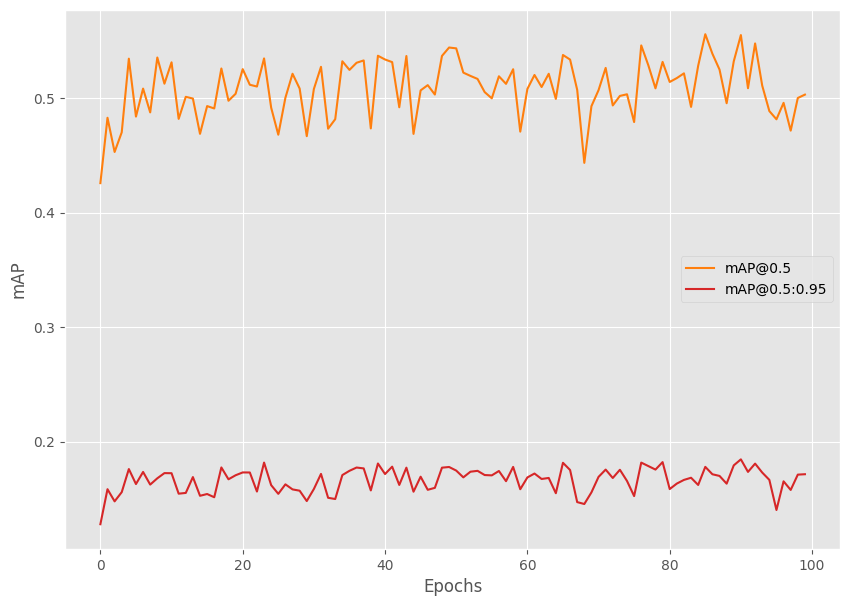

In [ ]:
from tqdm.auto import tqdm
from torchmetrics.detection.mean_ap import MeanAveragePrecision
from torch.optim.lr_scheduler import StepLR
import torch
import matplotlib.pyplot as plt
import time
import os

plt.style.use('ggplot')

seed = 42
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.cuda.manual_seed_all(seed)

# Function for running training iterations.
def train(train_data_loader, model):
    print('Training')
    model.train()

     # initialize tqdm progress bar
    prog_bar = tqdm(train_data_loader, total=len(train_data_loader))

    for i, data in enumerate(prog_bar):
        optimizer.zero_grad()
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]
        loss_dict = model(images, targets)

        losses = sum(loss for loss in loss_dict.values())
        loss_value = losses.item()

        train_loss_hist.send(loss_value)

        losses.backward()
        optimizer.step()

        # update the loss value beside the progress bar for each iteration
        prog_bar.set_description(desc=f"Loss: {loss_value:.4f}")
    return loss_value

# Function for running validation iterations.
def validate(valid_data_loader, model):
    print('Validating')
    model.eval()

    # Initialize tqdm progress bar.
    prog_bar = tqdm(valid_data_loader, total=len(valid_data_loader))
    target = []
    preds = []
    for i, data in enumerate(prog_bar):
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

        with torch.no_grad():
            outputs = model(images, targets)

        # For mAP calculation using Torchmetrics.
        #####################################
        for i in range(len(images)):
            true_dict = dict()
            preds_dict = dict()
            true_dict['boxes'] = targets[i]['boxes'].detach().cpu()
            true_dict['labels'] = targets[i]['labels'].detach().cpu()
            preds_dict['boxes'] = outputs[i]['boxes'].detach().cpu()
            preds_dict['scores'] = outputs[i]['scores'].detach().cpu()
            preds_dict['labels'] = outputs[i]['labels'].detach().cpu()
            preds.append(preds_dict)
            target.append(true_dict)
        #####################################

    metric.reset()
    metric.update(preds, target)
    metric_summary = metric.compute()
    return metric_summary

if __name__ == '__main__':
    os.makedirs('outputs', exist_ok=True)
    train_dataset = create_train_dataset(TRAIN_DIR)
    valid_dataset = create_valid_dataset(VALID_DIR)
    train_loader = create_train_loader(train_dataset, NUM_WORKERS)
    valid_loader = create_valid_loader(valid_dataset, NUM_WORKERS)
    print(f"Number of training samples: {len(train_dataset)}")
    print(f"Number of validation samples: {len(valid_dataset)}\n")

    # Initialize the model and move to the computation device.
    model = create_model(num_classes=NUM_CLASSES)
    model = model.to(DEVICE)
    # print(model)
    # Total parameters and trainable parameters.
    total_params = sum(p.numel() for p in model.parameters())
    print(f"{total_params:,} total parameters.")
    total_trainable_params = sum(
        p.numel() for p in model.parameters() if p.requires_grad)
    print(f"{total_trainable_params:,} training parameters.")
    params = [p for p in model.parameters() if p.requires_grad]
    optimizer = torch.optim.SGD(params, lr=0.01, momentum=0.9, weight_decay=0.0005, nesterov=True)
    scheduler = StepLR(
        optimizer=optimizer, step_size=15, gamma=0.1, verbose=True
    )

    # To monitor training loss
    train_loss_hist = Averager()
    # To store training loss and mAP values.
    train_loss_list = []
    map_50_list = []
    map_list = []

    # Mame to save the trained model with.
    MODEL_NAME = 'model'

    # Whether to show transformed images from data loader or not.
    # if VISUALIZE_TRANSFORMED_IMAGES:
    #     from custom_utils import show_tranformed_image
    #     show_tranformed_image(train_loader)

    # To save best model.
    save_best_model = SaveBestModel()

    metric = MeanAveragePrecision()

    # Training loop.
    for epoch in range(NUM_EPOCHS):
        print(f"\nEPOCH {epoch+1} of {NUM_EPOCHS}")

        # Reset the training loss histories for the current epoch.
        train_loss_hist.reset()

        # Start timer and carry out training and validation.
        start = time.time()
        train_loss = train(train_loader, model)
        metric_summary = validate(valid_loader, model)
        print(f"Epoch #{epoch+1} train loss: {train_loss_hist.value:.3f}")
        print(f"Epoch #{epoch+1} mAP: {metric_summary['map']}")
        end = time.time()
        print(f"Took {((end - start) / 60):.3f} minutes for epoch {epoch}")

        train_loss_list.append(train_loss)
        map_50_list.append(metric_summary['map_50'])
        map_list.append(metric_summary['map'])

        # save the best model till now.
        save_best_model(
            model, float(metric_summary['map_50']), epoch, 'outputs'
        )
        # Save the current epoch model.
        save_model(epoch, model, optimizer)

        # Save loss plot.
        save_loss_plot(OUT_DIR, train_loss_list)

        # Save mAP plot.
        save_mAP(OUT_DIR, map_50_list, map_list)
        # scheduler.step()

In [ ]:
import torch
from tqdm.auto import tqdm
from tqdm import TqdmExperimentalWarning
from torchmetrics.detection.mean_ap import MeanAveragePrecision

# Evaluation function
def validate(valid_data_loader, model):
    model.eval()

    # Initialize tqdm progress bar.
    prog_bar = tqdm(valid_data_loader, total=len(valid_data_loader))
    target = []
    preds = []
    for i, data in enumerate(prog_bar):
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

        with torch.no_grad():
            outputs = model(images, targets)

        # For mAP calculation using Torchmetrics.
        #####################################
        for i in range(len(images)):
            true_dict = dict()
            preds_dict = dict()
            true_dict['boxes'] = targets[i]['boxes'].detach().cpu()
            true_dict['labels'] = targets[i]['labels'].detach().cpu()
            preds_dict['boxes'] = outputs[i]['boxes'].detach().cpu()
            preds_dict['scores'] = outputs[i]['scores'].detach().cpu()
            preds_dict['labels'] = outputs[i]['labels'].detach().cpu()
            preds.append(preds_dict)
            target.append(true_dict)
        #####################################

    metric = MeanAveragePrecision()
    metric.update(preds, target)
    metric_summary = metric.compute()
    return metric_summary

if __name__ == '__main__':
    # Load the best model and trained weights.
    model = create_model(num_classes=NUM_CLASSES)
    checkpoint = torch.load('/content/outputs/best_model.pth', map_location=DEVICE)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.to(DEVICE).eval()

    test_dataset = create_test_dataset(
        '/content/PneumoniaDataset_8020_full/test'
    )
    test_loader = create_test_loader(test_dataset, num_workers=NUM_WORKERS)

    metric_summary = validate(test_loader, model)
    print(f"mAP_50: {metric_summary['map_50']*100:.3f}")
    print(f"mAP_50_95: {metric_summary['map']*100:.3f}")

  0%|          | 0/1203 [00:00<?, ?it/s]

mAP_50: 55.559
mAP_50_95: 17.781


  0%|          | 0/1203 [00:00<?, ?it/s]

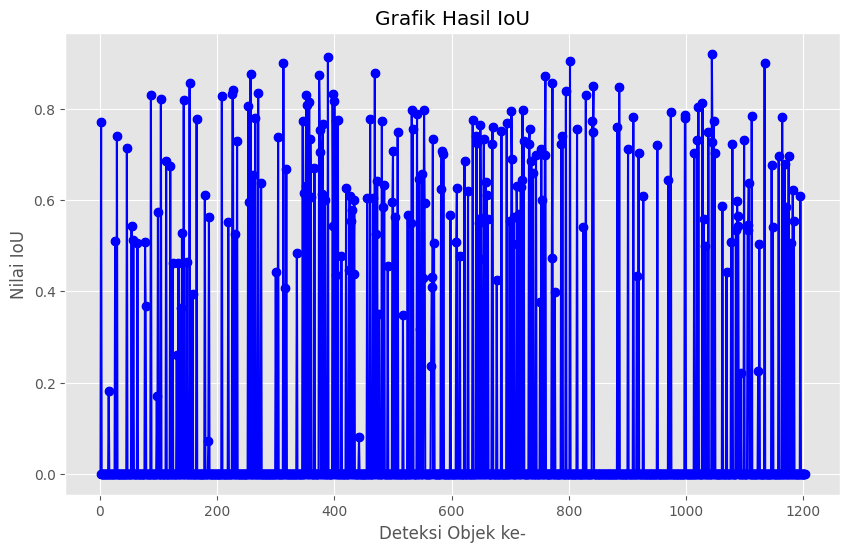

In [ ]:
import shutil
import torch
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
from torchvision.transforms.functional import to_pil_image
from torchvision.ops import box_iou

# Function to calculate Intersection over Union (IoU)
def calculate_iou(box1, box2):
    # Extract coordinates from the bounding box tensors
    box1 = [float(coord) for coord in box1]
    box2 = [float(coord) for coord in box2]

    # Calculate intersection area
    x1_int = max(box1[0], box2[0])
    y1_int = max(box1[1], box2[1])
    x2_int = min(box1[2], box2[2])
    y2_int = min(box1[3], box2[3])

    intersection = max(0, x2_int - x1_int) * max(0, y2_int - y1_int)

    # Calculate union area
    area1 = (box1[2] - box1[0]) * (box1[3] - box1[1])
    area2 = (box2[2] - box2[0]) * (box2[3] - box2[1])
    union = area1 + area2 - intersection

    # Calculate IoU
    iou = intersection / union if union > 0 else 0.0
    return iou

# source_path = "/content/drive/MyDrive/SKRIPSI/Hasil/Model_2/best_model.pth"
# destination_path = "/content/outputs/best_model.pth"

# shutil.copyfile(source_path, destination_path)

def show_iou_graph(images, true_boxes, pred_boxes, threshold=0.5, save_path="/content/iou_graph_model9.png"):
    all_ious = []

    for i in range(len(images)):
        true_boxes_i = true_boxes[i]
        pred_boxes_i = pred_boxes[i]

        ious = []  # To store IoU values for the current image

        for pred_box, score, label in zip(pred_boxes_i['boxes'], pred_boxes_i['scores'], pred_boxes_i['labels']):
            pred_box = [float(b) for b in pred_box]
            if score > threshold:
                # Find the corresponding true bounding box for the label
                true_box = true_boxes_i['boxes'][true_boxes_i['labels'] == label].cpu()
                if len(true_box) > 0:
                    true_box = [float(b) for b in true_box[0]]
                    iou = calculate_iou(pred_box, true_box)
                    ious.append(iou)

        # Store IoU values for the current image
        all_ious.append(ious)

    # Create IoU scatter plot
    plt.figure(figsize=(10, 6))
    plt.scatter(range(1, len(all_ious) + 1), [max(i, default=0) for i in all_ious], color='blue')
    plt.plot(range(1, len(all_ious) + 1), [max(i, default=0) for i in all_ious], linestyle='-', marker='o', color='blue')
    plt.title('Grafik Hasil IoU')
    plt.xlabel('Deteksi Objek ke-')
    plt.ylabel('Nilai IoU')
    plt.savefig(save_path)
    plt.show()

# Update the validate function to return images along with predictions
def validate(valid_data_loader, model):
    model.eval()

    # Initialize tqdm progress bar.
    prog_bar = tqdm(valid_data_loader, total=len(valid_data_loader))
    target = []
    preds = []
    images_list = []

    for i, data in enumerate(prog_bar):
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

        with torch.no_grad():
            outputs = model(images, targets)

        # For mAP calculation using Torchmetrics.
        for i in range(len(images)):
            true_dict = dict()
            preds_dict = dict()
            true_dict['boxes'] = targets[i]['boxes'].detach().cpu()
            true_dict['labels'] = targets[i]['labels'].detach().cpu()
            preds_dict['boxes'] = outputs[i]['boxes'].detach().cpu()
            preds_dict['scores'] = outputs[i]['scores'].detach().cpu()
            preds_dict['labels'] = outputs[i]['labels'].detach().cpu()
            preds.append(preds_dict)
            target.append(true_dict)
            images_list.append(images[i])

    return images_list, preds, target

if __name__ == '__main__':
    model = create_model(num_classes=NUM_CLASSES)
    checkpoint = torch.load('/content/outputs/best_model.pth', map_location=DEVICE)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.to(DEVICE).eval()

    test_dataset = create_test_dataset('/content/PneumoniaDataset_8020_full/test')
    test_loader = create_test_loader(test_dataset, num_workers=NUM_WORKERS)

    # After calculating metrics, you can display the IoU graph
    images, pred_boxes, true_boxes = validate(test_loader, model)
    # class_names = ['_Background', 'Pneumonia']
    show_iou_graph(images, true_boxes, pred_boxes, save_path='/content/iou_graph_model9.png')

In [ ]:
def make_prediction(model, img, threshold):
    model.eval()
    preds = model(img)
    for id in range(len(preds)) :
        idx_list = []

        for idx, score in enumerate(preds[id]['scores']) :
            if score > threshold :
                idx_list.append(idx)

        preds[id]['boxes'] = preds[id]['boxes'][idx_list]
        preds[id]['labels'] = preds[id]['labels'][idx_list]
        preds[id]['scores'] = preds[id]['scores'][idx_list]

    return preds

def plot_image_from_output(img, annotation):

    img = img.cpu().permute(1,2,0)

    fig,ax = plt.subplots(1)
    ax.imshow(img)

    for idx in range(len(annotation["boxes"])):
        xmin, ymin, xmax, ymax = annotation["boxes"][idx]

        if annotation['labels'][idx] == 1 :
            rect = patches.Rectangle((xmin,ymin),(xmax-xmin),(ymax-ymin),linewidth=1,edgecolor='g',facecolor='none')
        else :
            rect = patches.Rectangle((xmin,ymin),(xmax-xmin),(ymax-ymin),linewidth=1,edgecolor='orange',facecolor='none')

        ax.add_patch(rect)

    plt.show()

In [ ]:
from tqdm import tqdm

labels = []
preds_adj_all = []
annot_all = []

for im, annot in tqdm(test_loader, position = 0, leave = True):
    im = list(img.to(DEVICE) for img in im)
    #annot = [{k: v.to(device) for k, v in t.items()} for t in annot]

    for t in annot:
        labels += t['labels']

    with torch.no_grad():
        preds_adj = make_prediction(model, im, 0.5)
        preds_adj = [{k: v.to(torch.device('cpu')) for k, v in t.items()} for t in preds_adj]
        preds_adj_all.append(preds_adj)
        annot_all.append(annot)


100%|██████████| 1203/1203 [00:42<00:00, 28.62it/s]


In [ ]:
!git clone https://github.com/Pseudo-Lab/Tutorial-Book-Utils
!python Tutorial-Book-Utils/PL_data_loader.py --data FaceMaskDetection
%cd Tutorial-Book-Utils/
import utils_ObjectDetection as utils

Cloning into 'Tutorial-Book-Utils'...
remote: Enumerating objects: 45, done.
remote: Counting objects: 100% (45/45), done.
remote: Compressing objects: 100% (39/39), done.
remote: Total 45 (delta 18), reused 17 (delta 5), pack-reused 0
Receiving objects: 100% (45/45), 11.62 KiB | 5.81 MiB/s, done.
Resolving deltas: 100% (18/18), done.
Downloading...
From (original): https://drive.google.com/uc?id=16Gzn1w38yZLJpzmzKcRIRveFeHZtCEr7
From (redirected): https://drive.google.com/uc?id=16Gzn1w38yZLJpzmzKcRIRveFeHZtCEr7&confirm=t&uuid=49875cd9-950a-4133-8481-1691909b2df8
To: /content/Face Mask Detection.zip
100% 417M/417M [00:05<00:00, 71.4MB/s]
Face Mask Detection.zip download complete!
/content/Tutorial-Book-Utils


In [ ]:
sample_metrics = []
for batch_i in range(len(preds_adj_all)):
    sample_metrics += utils.get_batch_statistics(preds_adj_all[batch_i], annot_all[batch_i], iou_threshold=0.5)

true_positives, pred_scores, pred_labels = [torch.cat(x, 0) for x in list(zip(*sample_metrics))]  # batch semua disatukan
precision, recall, AP, f1, ap_class = utils.ap_per_class(true_positives, pred_scores, pred_labels, torch.tensor(labels))
mAP = torch.mean(AP)
print(f'mAP : {mAP}')
print(f'AP : {AP}')

mAP : 0.12705529996781054
AP : tensor([0.1271], dtype=torch.float64)


In [ ]:
sample_metrics = []
for batch_i in range(len(preds_adj_all)):
    sample_metrics += utils.get_batch_statistics(preds_adj_all[batch_i], annot_all[batch_i], iou_threshold=0.4)

true_positives, pred_scores, pred_labels = [torch.cat(x, 0) for x in list(zip(*sample_metrics))]  # batch semua disatukan
precision, recall, AP, f1, ap_class = utils.ap_per_class(true_positives, pred_scores, pred_labels, torch.tensor(labels))
mAP = torch.mean(AP)
print(f'mAP : {mAP}')
print(f'AP : {AP}')

mAP : 0.15413012565708406
AP : tensor([0.1541], dtype=torch.float64)


In [ ]:
sample_metrics = []
for batch_i in range(len(preds_adj_all)):
    sample_metrics += utils.get_batch_statistics(preds_adj_all[batch_i], annot_all[batch_i], iou_threshold=0.3)

true_positives, pred_scores, pred_labels = [torch.cat(x, 0) for x in list(zip(*sample_metrics))]  # batch semua disatukan
precision, recall, AP, f1, ap_class = utils.ap_per_class(true_positives, pred_scores, pred_labels, torch.tensor(labels))
mAP = torch.mean(AP)
print(f'mAP : {mAP}')
print(f'AP : {AP}')

mAP : 0.16476829538642057
AP : tensor([0.1648], dtype=torch.float64)


In [ ]:
import numpy as np
import cv2
import torch
import glob as glob
import os
import time
import argparse
import csv

os.makedirs('inference_outputs/images', exist_ok=True)

COLORS = np.random.uniform(0, 255, size=(len(CLASSES), 3))

# Load the best model and trained weights.
model = create_model(num_classes=NUM_CLASSES)
checkpoint = torch.load('/content/outputs/best_model.pth', map_location=DEVICE)
model.load_state_dict(checkpoint['model_state_dict'])
model.to(DEVICE).eval()

# Directory where all the images are present.
DIR_TEST = '/content/PneumoniaDataset_8020_full/test'
test_images = glob.glob(f"{DIR_TEST}/*.jpg")
print(f"Test instances: {len(test_images)}")

frame_count = 0 # To count total frames.
total_fps = 0 # To get the final frames per second.
lung_opacity_files = []

for i in range(len(test_images)):
    # Get the image file name for saving output later on.
    image_name = test_images[i].split(os.path.sep)[-1].split('.')[0]
    image = cv2.imread(test_images[i])
    orig_image = image.copy()
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
    image /= 255.0
    image_input = np.transpose(image, (2, 0, 1)).astype(np.float32)
    image_input = torch.tensor(image_input, dtype=torch.float).cuda()
    image_input = torch.unsqueeze(image_input, 0)
    start_time = time.time()
    # Predictions
    with torch.no_grad():
        outputs = model(image_input.to(DEVICE))
    end_time = time.time()

    # Get the current fps.
    fps = 1 / (end_time - start_time)
    total_fps += fps
    frame_count += 1

    # Load all detection to CPU for further operations.
    outputs = [{k: v.to('cpu') for k, v in t.items()} for t in outputs]
    if len(outputs[0]['boxes']) != 0:
        boxes = outputs[0]['boxes'].data.numpy()
        scores = outputs[0]['scores'].data.numpy()
        boxes = boxes[scores >= 0.5].astype(np.int32)
        draw_boxes = boxes.copy()
        # Get all the predicited class names.
        pred_classes = [CLASSES[i] for i in outputs[0]['labels'].cpu().numpy()]
        # Draw the bounding boxes and write the class name on top of it.
        for j, box in enumerate(draw_boxes):
            print(image_name)
            class_name = pred_classes[j]
            color = COLORS[CLASSES.index(class_name)]
            # Recale boxes.
            xmin = int((box[0] / image.shape[1]) * orig_image.shape[1])
            ymin = int((box[1] / image.shape[0]) * orig_image.shape[0])
            xmax = int((box[2] / image.shape[1]) * orig_image.shape[1])
            ymax = int((box[3] / image.shape[0]) * orig_image.shape[0])
            cv2.rectangle(orig_image,
                        (xmin, ymin),
                        (xmax, ymax),
                        color[::-1],
                        3)
            cv2.putText(orig_image,
                        class_name,
                        (xmin, ymin-5),
                        cv2.FONT_HERSHEY_SIMPLEX,
                        0.8,
                        color[::-1],
                        2,
                        lineType=cv2.LINE_AA)
        plt.imshow(cv2.cvtColor(orig_image, cv2.COLOR_BGR2RGB))
        plt.show()

        # Simpan gambar ke direktori
        # cv2.imwrite(f"inference_outputs/images/{image_name}.jpg", orig_image)
    print(f"Image {i+1} done...")
    print('-'*50)

print('TEST PREDICTIONS COMPLETE')
avg_fps = total_fps / frame_count
print(f"Average FPS: {avg_fps:.3f}")

# Model 10 | BATCH : 2 | LR:0.01 | 80:20 - FULL DATASET

In [ ]:
import zipfile
import os

zip_file_path = '/content/drive/MyDrive/SKRIPSI/Dataset/PneumoniaDataset_8020_full_2.zip'  # Ganti dengan path ke file ZIP Anda
unzip_dir = '/content'  # Ganti dengan direktori di mana Anda ingin mengekstrak file

def extract_zip(zip_file, extract_dir):
    with zipfile.ZipFile(zip_file, 'r') as zip_ref:
        zip_ref.extractall(extract_dir)

def list_files(directory):
    return os.listdir(directory)

# Ekstrak file ZIP
extract_zip(zip_file_path, unzip_dir)

# Tampilkan daftar file yang diekstrak
extracted_files = list_files(unzip_dir)
print(extracted_files)

['.config', '__MACOSX', 'drive', 'PneumoniaDataset_8020_full_2', 'sample_data']


In [ ]:
import torch
import os


DEVICE = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

BATCH_SIZE = 2 # Increase / decrease according to GPU memeory.
RESIZE_TO = 300 # Resize the image for training and transforms.
NUM_EPOCHS = 100 # Number of epochs to train for.
NUM_WORKERS = 2 # Number of parallel workers for data loading.

CLASSES = [
    '_background','Lung Opacity'
    # 'helmet','head','person'
]



TRAIN_DIR = '/content/PneumoniaDataset_8020_full_2/train'
VALID_DIR = '/content/PneumoniaDataset_8020_full_2/test'

# Classes: 0 index is reserved for background.


NUM_CLASSES = len(CLASSES)

# Whether to visualize images after crearing the data loaders.
VISUALIZE_TRANSFORMED_IMAGES = False

# Location to save model and plots.
OUT_DIR = 'outputs'
os.makedirs(OUT_DIR, exist_ok=True)

In [ ]:
import albumentations as A
import cv2
import numpy as np
import torch
import matplotlib.pyplot as plt

from albumentations.pytorch import ToTensorV2


plt.style.use('ggplot')

# This class keeps track of the training and validation loss values
# and helps to get the average for each epoch as well.
class Averager:
    def __init__(self):
        self.current_total = 0.0
        self.iterations = 0.0

    def send(self, value):
        self.current_total += value
        self.iterations += 1

    @property
    def value(self):
        if self.iterations == 0:
            return 0
        else:
            return 1.0 * self.current_total / self.iterations

    def reset(self):
        self.current_total = 0.0
        self.iterations = 0.0

class SaveBestModel:
    """
    Class to save the best model while training. If the current epoch's
    validation mAP @0.5:0.95 IoU higher than the previous highest, then save the
    model state.
    """
    def __init__(
        self, best_valid_map=float(0)
    ):
        self.best_valid_map = best_valid_map

    def __call__(
        self,
        model,
        current_valid_map,
        epoch,
        OUT_DIR,
    ):
        if current_valid_map > self.best_valid_map:
            self.best_valid_map = current_valid_map
            print(f"\nBEST VALIDATION mAP: {self.best_valid_map}")
            print(f"\nSAVING BEST MODEL FOR EPOCH: {epoch+1}\n")
            torch.save({
                'epoch': epoch+1,
                'model_state_dict': model.state_dict(),
                }, f"{OUT_DIR}/best_model.pth")

def collate_fn(batch):
    """
    To handle the data loading as different images may have different number
    of objects and to handle varying size tensors as well.
    """
    return tuple(zip(*batch))

# Define the training tranforms.
def get_train_transform():
    return A.Compose([
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.Rotate(limit=6),
        A.Blur(blur_limit=3, p=0.1),
        A.MotionBlur(blur_limit=3, p=0.1),
        A.MedianBlur(blur_limit=3, p=0.1),
        A.RandomBrightnessContrast(p=0.2),
        ToTensorV2(p=1.0),
    ], bbox_params={
        'format': 'pascal_voc',
        'label_fields': ['labels']
    })


# Define the validation transforms.
def get_valid_transform():
    return A.Compose([
        ToTensorV2(p=1.0),
    ], bbox_params={
        'format': 'pascal_voc',
        'label_fields': ['labels']
    })


def show_tranformed_image(train_loader):
    """
    This function shows the transformed images from the `train_loader`.
    Helps to check whether the tranformed images along with the corresponding
    labels are correct or not.
    Only runs if `VISUALIZE_TRANSFORMED_IMAGES = True` in config.py.
    """
    if len(train_loader) > 0:
        for i in range(1):
            images, targets = next(iter(train_loader))
            images = list(image.to(DEVICE) for image in images)
            targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]
            boxes = targets[i]['boxes'].cpu().numpy().astype(np.int32)
            labels = targets[i]['labels'].cpu().numpy().astype(np.int32)
            sample = images[i].permute(1, 2, 0).cpu().numpy()
            sample = cv2.cvtColor(sample, cv2.COLOR_RGB2BGR)
            for box_num, box in enumerate(boxes):
                cv2.rectangle(sample,
                            (box[0], box[1]),
                            (box[2], box[3]),
                            (0, 0, 255), 2)
                cv2.putText(sample, CLASSES[labels[box_num]],
                            (box[0], box[1]-10), cv2.FONT_HERSHEY_SIMPLEX,
                            1.0, (0, 0, 255), 2)
            cv2.imshow('Transformed image', sample)
            cv2.waitKey(0)
            cv2.destroyAllWindows()

def save_model(epoch, model, optimizer):
    """
    Function to save the trained model till current epoch, or whenver called
    """
    torch.save({
                'epoch': epoch+1,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                }, 'outputs/last_model.pth')

def save_loss_plot(
    OUT_DIR,
    train_loss_list,
    x_label='iterations',
    y_label='train loss',
    save_name='train_loss'
):
    """
    Function to save both train loss graph.

    :param OUT_DIR: Path to save the graphs.
    :param train_loss_list: List containing the training loss values.
    """
    figure_1 = plt.figure(figsize=(10, 7), num=1, clear=True)
    train_ax = figure_1.add_subplot()
    train_ax.plot(train_loss_list, color='tab:blue')
    train_ax.set_xlabel(x_label)
    train_ax.set_ylabel(y_label)
    figure_1.savefig(f"{OUT_DIR}/{save_name}.png")
    print('SAVING PLOTS COMPLETE...')

def save_mAP(OUT_DIR, map_05, map):
    """
    Saves the mAP@0.5 and mAP@0.5:0.95 per epoch.
    :param OUT_DIR: Path to save the graphs.
    :param map_05: List containing mAP values at 0.5 IoU.
    :param map: List containing mAP values at 0.5:0.95 IoU.
    """
    figure = plt.figure(figsize=(10, 7), num=1, clear=True)
    ax = figure.add_subplot()
    ax.plot(
        map_05, color='tab:orange', linestyle='-',
        label='mAP@0.5'
    )
    ax.plot(
        map, color='tab:red', linestyle='-',
        label='mAP@0.5:0.95'
    )
    ax.set_xlabel('Epochs')
    ax.set_ylabel('mAP')
    ax.legend()
    figure.savefig(f"{OUT_DIR}/map.png")

In [ ]:
import torch
import cv2
import numpy as np
import os
import glob as glob
from google.colab.patches import cv2_imshow
from xml.etree import ElementTree as et
from torch.utils.data import Dataset, DataLoader

# The dataset class.
class PneumoniaDataset(Dataset):
    def __init__(self, dir_path, width, height, classes, transforms=None):
        self.transforms = transforms
        self.dir_path = dir_path
        self.height = height
        self.width = width
        self.classes = classes
        self.image_file_types = ['*.jpg', '*.jpeg', '*.png', '*.ppm', '*.JPG']
        self.all_image_paths = []

        # Get all the image paths in sorted order.
        for file_type in self.image_file_types:
            self.all_image_paths.extend(glob.glob(os.path.join(self.dir_path, file_type)))
        self.all_images = [image_path.split(os.path.sep)[-1] for image_path in self.all_image_paths]
        self.all_images = sorted(self.all_images)

    def __getitem__(self, idx):
        # Capture the image name and the full image path.
        image_name = self.all_images[idx]
        image_path = os.path.join(self.dir_path, image_name)

        # Read and preprocess the image.
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
        image_resized = cv2.resize(image, (self.width, self.height))
        image_resized /= 255.0

        # Capture the corresponding XML file for getting the annotations.
        annot_filename = os.path.splitext(image_name)[0] + '.xml'
        annot_file_path = os.path.join(self.dir_path, annot_filename)

        boxes = []
        labels = []
        tree = et.parse(annot_file_path)
        root = tree.getroot()

        # Original image width and height.
        image_width = image.shape[1]
        image_height = image.shape[0]

        # Box coordinates for xml files are extracted
        # and corrected for image size given.
        for member in root.findall('object'):
            # Get label and map the `classes`.
            labels.append(self.classes.index(member.find('name').text))

            # Left corner x-coordinates.
            xmin = int(member.find('bndbox').find('xmin').text)
            # Right corner x-coordinates.
            xmax = int(member.find('bndbox').find('xmax').text)
            # Left corner y-coordinates.
            ymin = int(member.find('bndbox').find('ymin').text)
            # Right corner y-coordinates.
            ymax = int(member.find('bndbox').find('ymax').text)

            # Resize the bounding boxes according
            # to resized image `width`, `height`.
            xmin_final = (xmin/image_width)*self.width
            xmax_final = (xmax/image_width)*self.width
            ymin_final = (ymin/image_height)*self.height
            ymax_final = (ymax/image_height)*self.height

            # Check that max coordinates are at least one pixel
            # larger than min coordinates.
            if xmax_final == xmin_final:
                xmax_final += 1
            if ymax_final == ymin_final:
                ymax_final += 1
            # Check that all coordinates are within the image.
            if xmax_final > self.width:
                xmax_final = self.width
            if ymax_final > self.height:
                ymax_final = self.height

            boxes.append([xmin_final, ymin_final, xmax_final, ymax_final])

        # Bounding box to tensor.
        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        # Area of the bounding boxes.
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0]) if len(boxes) > 0 \
            else torch.as_tensor(boxes, dtype=torch.float32)
        # No crowd instances.
        iscrowd = torch.zeros((boxes.shape[0],), dtype=torch.int64)
        # Labels to tensor.
        labels = torch.as_tensor(labels, dtype=torch.int64)

        # Prepare the final `target` dictionary.
        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["area"] = area
        target["iscrowd"] = iscrowd
        image_id = torch.tensor([idx])
        target["image_id"] = image_id

        # Apply the image transforms.
        if self.transforms:
            sample = self.transforms(image = image_resized,
                                     bboxes = target['boxes'],
                                     labels = labels)
            image_resized = sample['image']
            target['boxes'] = torch.Tensor(sample['bboxes'])

        if np.isnan((target['boxes']).numpy()).any() or target['boxes'].shape == torch.Size([0]):
            target['boxes'] = torch.zeros((0, 4), dtype=torch.int64)
        return image_resized, target

    def __len__(self):
        return len(self.all_images)
        # return 500;

# Prepare the final datasets and data loaders.
def create_train_dataset(DIR):
    train_dataset = PneumoniaDataset(
        DIR, RESIZE_TO, RESIZE_TO, CLASSES, get_train_transform()
    )
    return train_dataset
def create_valid_dataset(DIR):
    valid_dataset = PneumoniaDataset(
        DIR, RESIZE_TO, RESIZE_TO, CLASSES, get_valid_transform()
    )
    return valid_dataset
def create_test_dataset(DIR):
    test_dataset = PneumoniaDataset(
        DIR, RESIZE_TO, RESIZE_TO, CLASSES, get_valid_transform()
    )
    return test_dataset
def create_train_loader(train_dataset, num_workers=0):
    train_loader = DataLoader(
        train_dataset,
        batch_size=BATCH_SIZE,
        shuffle=True,
        num_workers=num_workers,
        collate_fn=collate_fn,
        drop_last=True
    )
    return train_loader
def create_valid_loader(valid_dataset, num_workers=0):
    valid_loader = DataLoader(
        valid_dataset,
        batch_size=BATCH_SIZE,
        shuffle=False,
        num_workers=num_workers,
        collate_fn=collate_fn,
        drop_last=True
    )
    return valid_loader
def create_test_loader(test_dataset, num_workers=0):
    test_loader = DataLoader(
        test_dataset,
        batch_size=1,
        shuffle=False,
        num_workers=num_workers,
        collate_fn=collate_fn,
        drop_last=True
    )
    return test_loader


In [ ]:
import torchvision
import torch

from functools import partial
from torchvision.models.detection import RetinaNet
from torchvision.models.detection.backbone_utils import resnet_fpn_backbone
from torchvision.models.detection.retinanet import RetinaNetClassificationHead
from torchvision.models.detection import RetinaNet_ResNet50_FPN_V2_Weights
from torchvision.models.detection.retinanet import RetinaNetClassificationHead

def create_model(num_classes):
    model = torchvision.models.detection.retinanet_resnet50_fpn_v2(
        weights=RetinaNet_ResNet50_FPN_V2_Weights.COCO_V1
    )
    num_anchors = model.head.classification_head.num_anchors

    model.head.classification_head = RetinaNetClassificationHead(
        in_channels=256,
        num_anchors=num_anchors,
        num_classes=num_classes,
        norm_layer=partial(torch.nn.GroupNorm, 32)
    )
    return model

if __name__ == '__main__':
    model = create_model(2)
    # print(model)
    # Total parameters and trainable parameters.
    total_params = sum(p.numel() for p in model.parameters())
    print(f"{total_params:,} total parameters.")
    total_trainable_params = sum(
        p.numel() for p in model.parameters() if p.requires_grad)
    print(f"{total_trainable_params:,} training parameters.")

Downloading: "https://download.pytorch.org/models/retinanet_resnet50_fpn_v2_coco-5905b1c5.pth" to /root/.cache/torch/hub/checkpoints/retinanet_resnet50_fpn_v2_coco-5905b1c5.pth
100%|██████████| 146M/146M [00:02<00:00, 65.6MB/s]


36,352,630 total parameters.
36,127,286 training parameters.


In [ ]:
!pip install torchmetrics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 840.4/840.4 kB 5.3 MB/s eta 0:00:00


Number of training samples: 4810
Number of validation samples: 1202

36,352,630 total parameters.
36,127,286 training parameters.
Adjusting learning rate of group 0 to 1.0000e-02.

EPOCH 1 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b1f38aa0160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    Exception ignored in: if w.is_alive():
<function _MultiProcessingDataLoaderIter.__del__ at 0x7b1f38aa0160>  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    assert self._parent_pid == os.getpid(), 'can only test a child process'    
self._shutdown_workers()AssertionError
:   File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
can only test a child process
    if w.is_alive():
  File "/usr/lib/

Epoch #1 train loss: 1.136
Epoch #1 mAP: 0.013062872923910618
Took 3.697 minutes for epoch 0

BEST VALIDATION mAP: 0.056198734790086746

SAVING BEST MODEL FOR EPOCH: 1

SAVING PLOTS COMPLETE...

EPOCH 2 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #2 train loss: 0.963
Epoch #2 mAP: 0.03235235810279846
Took 3.757 minutes for epoch 1

BEST VALIDATION mAP: 0.12954312562942505

SAVING BEST MODEL FOR EPOCH: 2

SAVING PLOTS COMPLETE...

EPOCH 3 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #3 train loss: 0.913
Epoch #3 mAP: 0.07739359140396118
Took 3.891 minutes for epoch 2

BEST VALIDATION mAP: 0.29421669244766235

SAVING BEST MODEL FOR EPOCH: 3

SAVING PLOTS COMPLETE...

EPOCH 4 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #4 train loss: 0.789
Epoch #4 mAP: 0.14613966643810272
Took 3.869 minutes for epoch 3

BEST VALIDATION mAP: 0.49751710891723633

SAVING BEST MODEL FOR EPOCH: 4

SAVING PLOTS COMPLETE...

EPOCH 5 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b1f38aa0160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    Exception ignored in: if w.is_alive():
<function _MultiProcessingDataLoaderIter.__del__ at 0x7b1f38aa0160>
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #5 train loss: 0.741
Epoch #5 mAP: 0.19794505834579468
Took 3.677 minutes for epoch 4

BEST VALIDATION mAP: 0.566145658493042

SAVING BEST MODEL FOR EPOCH: 5

SAVING PLOTS COMPLETE...

EPOCH 6 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #6 train loss: 0.718
Epoch #6 mAP: 0.2131321132183075
Took 3.840 minutes for epoch 5

BEST VALIDATION mAP: 0.6217402219772339

SAVING BEST MODEL FOR EPOCH: 6

SAVING PLOTS COMPLETE...

EPOCH 7 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b1f38aa0160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
Exception ignored in:   File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
<function _MultiProcessingDataLoaderIter.__del__ at 0x7b1f38aa0160>
    Traceback (most recent call last):
if w.is_alive():  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__

  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    self._shutdown_workers()    assert self._parent_pid == os.getpid(), 'can only test a child process'
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers

AssertionError    : if w.is_alive():can only test a child process

  File "/usr/lib/

Epoch #7 train loss: 0.701
Epoch #7 mAP: 0.21413274109363556
Took 3.697 minutes for epoch 6
SAVING PLOTS COMPLETE...

EPOCH 8 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #8 train loss: 0.690
Epoch #8 mAP: 0.21787065267562866
Took 3.828 minutes for epoch 7

BEST VALIDATION mAP: 0.647520899772644

SAVING BEST MODEL FOR EPOCH: 8

SAVING PLOTS COMPLETE...

EPOCH 9 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #9 train loss: 0.684
Epoch #9 mAP: 0.2273726612329483
Took 3.859 minutes for epoch 8

BEST VALIDATION mAP: 0.6517795324325562

SAVING BEST MODEL FOR EPOCH: 9

SAVING PLOTS COMPLETE...

EPOCH 10 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #10 train loss: 0.676
Epoch #10 mAP: 0.25260865688323975
Took 3.835 minutes for epoch 9

BEST VALIDATION mAP: 0.6920446753501892

SAVING BEST MODEL FOR EPOCH: 10

SAVING PLOTS COMPLETE...

EPOCH 11 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b1f38aa0160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b1f38aa0160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    
if w.is_alive():
  File "/usr/lib

Epoch #11 train loss: 0.674
Epoch #11 mAP: 0.24533671140670776
Took 3.682 minutes for epoch 10
SAVING PLOTS COMPLETE...

EPOCH 12 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #12 train loss: 0.668
Epoch #12 mAP: 0.23370304703712463
Took 3.811 minutes for epoch 11
SAVING PLOTS COMPLETE...

EPOCH 13 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #13 train loss: 0.665
Epoch #13 mAP: 0.2386326789855957
Took 3.806 minutes for epoch 12

BEST VALIDATION mAP: 0.7014004588127136

SAVING BEST MODEL FOR EPOCH: 13

SAVING PLOTS COMPLETE...

EPOCH 14 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #14 train loss: 0.664
Epoch #14 mAP: 0.24282079935073853
Took 3.814 minutes for epoch 13
SAVING PLOTS COMPLETE...

EPOCH 15 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #15 train loss: 0.661
Epoch #15 mAP: 0.2181994467973709
Took 3.800 minutes for epoch 14
SAVING PLOTS COMPLETE...

EPOCH 16 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #16 train loss: 0.661
Epoch #16 mAP: 0.2550538182258606
Took 3.787 minutes for epoch 15
SAVING PLOTS COMPLETE...

EPOCH 17 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #17 train loss: 0.658
Epoch #17 mAP: 0.24041222035884857
Took 3.778 minutes for epoch 16
SAVING PLOTS COMPLETE...

EPOCH 18 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #18 train loss: 0.658
Epoch #18 mAP: 0.24467383325099945
Took 3.797 minutes for epoch 17
SAVING PLOTS COMPLETE...

EPOCH 19 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #19 train loss: 0.659
Epoch #19 mAP: 0.2621302008628845
Took 3.797 minutes for epoch 18

BEST VALIDATION mAP: 0.7119312286376953

SAVING BEST MODEL FOR EPOCH: 19

SAVING PLOTS COMPLETE...

EPOCH 20 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #20 train loss: 0.656
Epoch #20 mAP: 0.25924333930015564
Took 3.776 minutes for epoch 19
SAVING PLOTS COMPLETE...

EPOCH 21 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #21 train loss: 0.654
Epoch #21 mAP: 0.2595136761665344
Took 3.786 minutes for epoch 20

BEST VALIDATION mAP: 0.7224342823028564

SAVING BEST MODEL FOR EPOCH: 21

SAVING PLOTS COMPLETE...

EPOCH 22 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b1f38aa0160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b1f38aa0160>    
self._shutdown_workers()Traceback (most recent call last):

  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
        self._shutdown_workers()if w.is_alive():
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers

  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    if w.is_alive():    assert self._parent_pid == os.getpid(), 'can only test a child process'
  File "/usr/lib/python3.10/multiprocessing/process.py", line 16

Epoch #22 train loss: 0.655
Epoch #22 mAP: 0.2536690831184387
Took 3.668 minutes for epoch 21
SAVING PLOTS COMPLETE...

EPOCH 23 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #23 train loss: 0.655
Epoch #23 mAP: 0.23948246240615845
Took 3.820 minutes for epoch 22
SAVING PLOTS COMPLETE...

EPOCH 24 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #24 train loss: 0.654
Epoch #24 mAP: 0.20972655713558197
Took 3.809 minutes for epoch 23
SAVING PLOTS COMPLETE...

EPOCH 25 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #25 train loss: 0.655
Epoch #25 mAP: 0.24609841406345367
Took 3.807 minutes for epoch 24
SAVING PLOTS COMPLETE...

EPOCH 26 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #26 train loss: 0.655
Epoch #26 mAP: 0.2609712481498718
Took 3.837 minutes for epoch 25
SAVING PLOTS COMPLETE...

EPOCH 27 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #27 train loss: 0.654
Epoch #27 mAP: 0.26261940598487854
Took 3.803 minutes for epoch 26

BEST VALIDATION mAP: 0.7303795218467712

SAVING BEST MODEL FOR EPOCH: 27

SAVING PLOTS COMPLETE...

EPOCH 28 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #28 train loss: 0.654
Epoch #28 mAP: 0.23172812163829803
Took 3.825 minutes for epoch 27
SAVING PLOTS COMPLETE...

EPOCH 29 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b1f38aa0160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b1f38aa0160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #29 train loss: 0.656
Epoch #29 mAP: 0.25940266251564026
Took 3.621 minutes for epoch 28
SAVING PLOTS COMPLETE...

EPOCH 30 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #30 train loss: 0.655
Epoch #30 mAP: 0.26188430190086365
Took 3.810 minutes for epoch 29

BEST VALIDATION mAP: 0.7388903498649597

SAVING BEST MODEL FOR EPOCH: 30

SAVING PLOTS COMPLETE...

EPOCH 31 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #31 train loss: 0.653
Epoch #31 mAP: 0.2526363432407379
Took 3.787 minutes for epoch 30
SAVING PLOTS COMPLETE...

EPOCH 32 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b1f38aa0160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b1f38aa0160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #32 train loss: 0.653
Epoch #32 mAP: 0.2494530975818634
Took 3.672 minutes for epoch 31
SAVING PLOTS COMPLETE...

EPOCH 33 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #33 train loss: 0.655
Epoch #33 mAP: 0.18568304181098938
Took 3.811 minutes for epoch 32
SAVING PLOTS COMPLETE...

EPOCH 34 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #34 train loss: 0.651
Epoch #34 mAP: 0.22211827337741852
Took 3.743 minutes for epoch 33
SAVING PLOTS COMPLETE...

EPOCH 35 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #35 train loss: 0.654
Epoch #35 mAP: 0.24880249798297882
Took 3.776 minutes for epoch 34
SAVING PLOTS COMPLETE...

EPOCH 36 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #36 train loss: 0.653
Epoch #36 mAP: 0.2491084635257721
Took 3.752 minutes for epoch 35
SAVING PLOTS COMPLETE...

EPOCH 37 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #37 train loss: 0.653
Epoch #37 mAP: 0.24972784519195557
Took 3.735 minutes for epoch 36
SAVING PLOTS COMPLETE...

EPOCH 38 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #38 train loss: 0.653
Epoch #38 mAP: 0.24255527555942535
Took 3.806 minutes for epoch 37
SAVING PLOTS COMPLETE...

EPOCH 39 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #39 train loss: 0.651
Epoch #39 mAP: 0.23622965812683105
Took 3.843 minutes for epoch 38
SAVING PLOTS COMPLETE...

EPOCH 40 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #40 train loss: 0.648
Epoch #40 mAP: 0.25439950823783875
Took 3.792 minutes for epoch 39
SAVING PLOTS COMPLETE...

EPOCH 41 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #41 train loss: 0.650
Epoch #41 mAP: 0.26697325706481934
Took 3.775 minutes for epoch 40
SAVING PLOTS COMPLETE...

EPOCH 42 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #42 train loss: 0.651
Epoch #42 mAP: 0.24915139377117157
Took 3.792 minutes for epoch 41
SAVING PLOTS COMPLETE...

EPOCH 43 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #43 train loss: 0.650
Epoch #43 mAP: 0.2608535885810852
Took 3.764 minutes for epoch 42
SAVING PLOTS COMPLETE...

EPOCH 44 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b1f38aa0160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b1f38aa0160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #44 train loss: 0.648
Epoch #44 mAP: 0.2461119443178177
Took 3.777 minutes for epoch 43
SAVING PLOTS COMPLETE...

EPOCH 45 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #45 train loss: 0.649
Epoch #45 mAP: 0.2563697397708893
Took 3.575 minutes for epoch 44
SAVING PLOTS COMPLETE...

EPOCH 46 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #46 train loss: 0.648
Epoch #46 mAP: 0.2550574541091919
Took 3.944 minutes for epoch 45
SAVING PLOTS COMPLETE...

EPOCH 47 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #47 train loss: 0.649
Epoch #47 mAP: 0.24823740124702454
Took 3.749 minutes for epoch 46
SAVING PLOTS COMPLETE...

EPOCH 48 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #48 train loss: 0.648
Epoch #48 mAP: 0.23795323073863983
Took 3.773 minutes for epoch 47
SAVING PLOTS COMPLETE...

EPOCH 49 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #49 train loss: 0.651
Epoch #49 mAP: 0.26375705003738403
Took 3.608 minutes for epoch 48
SAVING PLOTS COMPLETE...

EPOCH 50 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #50 train loss: 0.650
Epoch #50 mAP: 0.23053039610385895
Took 3.790 minutes for epoch 49
SAVING PLOTS COMPLETE...

EPOCH 51 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #51 train loss: 0.649
Epoch #51 mAP: 0.24727369844913483
Took 3.803 minutes for epoch 50
SAVING PLOTS COMPLETE...

EPOCH 52 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b1f38aa0160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b1f38aa0160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #52 train loss: 0.649
Epoch #52 mAP: 0.22121895849704742
Took 3.586 minutes for epoch 51
SAVING PLOTS COMPLETE...

EPOCH 53 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #53 train loss: 0.649
Epoch #53 mAP: 0.2580214738845825
Took 3.659 minutes for epoch 52
SAVING PLOTS COMPLETE...

EPOCH 54 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #54 train loss: 0.647
Epoch #54 mAP: 0.22747212648391724
Took 3.773 minutes for epoch 53
SAVING PLOTS COMPLETE...

EPOCH 55 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #55 train loss: 0.648
Epoch #55 mAP: 0.25019571185112
Took 3.802 minutes for epoch 54
SAVING PLOTS COMPLETE...

EPOCH 56 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #56 train loss: 0.648
Epoch #56 mAP: 0.25601187348365784
Took 3.792 minutes for epoch 55
SAVING PLOTS COMPLETE...

EPOCH 57 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #57 train loss: 0.647
Epoch #57 mAP: 0.2547500729560852
Took 3.765 minutes for epoch 56
SAVING PLOTS COMPLETE...

EPOCH 58 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #58 train loss: 0.647
Epoch #58 mAP: 0.23596596717834473
Took 3.759 minutes for epoch 57
SAVING PLOTS COMPLETE...

EPOCH 59 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #59 train loss: 0.650
Epoch #59 mAP: 0.2493813931941986
Took 3.777 minutes for epoch 58
SAVING PLOTS COMPLETE...

EPOCH 60 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b1f38aa0160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b1f38aa0160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #60 train loss: 0.646
Epoch #60 mAP: 0.2622385621070862
Took 3.796 minutes for epoch 59
SAVING PLOTS COMPLETE...

EPOCH 61 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #61 train loss: 0.647
Epoch #61 mAP: 0.25684788823127747
Took 3.837 minutes for epoch 60
SAVING PLOTS COMPLETE...

EPOCH 62 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #62 train loss: 0.647
Epoch #62 mAP: 0.24411387741565704
Took 3.796 minutes for epoch 61
SAVING PLOTS COMPLETE...

EPOCH 63 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #63 train loss: 0.647
Epoch #63 mAP: 0.26136013865470886
Took 3.807 minutes for epoch 62
SAVING PLOTS COMPLETE...

EPOCH 64 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #64 train loss: 0.646
Epoch #64 mAP: 0.2535248398780823
Took 3.810 minutes for epoch 63

BEST VALIDATION mAP: 0.7427977919578552

SAVING BEST MODEL FOR EPOCH: 64

SAVING PLOTS COMPLETE...

EPOCH 65 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #65 train loss: 0.646
Epoch #65 mAP: 0.2480146586894989
Took 3.797 minutes for epoch 64
SAVING PLOTS COMPLETE...

EPOCH 66 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #66 train loss: 0.645
Epoch #66 mAP: 0.25638481974601746
Took 3.808 minutes for epoch 65
SAVING PLOTS COMPLETE...

EPOCH 67 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #67 train loss: 0.644
Epoch #67 mAP: 0.26216259598731995
Took 3.809 minutes for epoch 66
SAVING PLOTS COMPLETE...

EPOCH 68 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #68 train loss: 0.645
Epoch #68 mAP: 0.2621355652809143
Took 3.795 minutes for epoch 67
SAVING PLOTS COMPLETE...

EPOCH 69 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b1f38aa0160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b1f38aa0160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b1f38aa0160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b1f38aa0160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #69 train loss: 0.644
Epoch #69 mAP: 0.24404871463775635
Took 3.648 minutes for epoch 68
SAVING PLOTS COMPLETE...

EPOCH 70 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b1f38aa0160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b1f38aa0160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #70 train loss: 0.644
Epoch #70 mAP: 0.23068194091320038
Took 3.817 minutes for epoch 69
SAVING PLOTS COMPLETE...

EPOCH 71 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b1f38aa0160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b1f38aa0160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #71 train loss: 0.644
Epoch #71 mAP: 0.26393163204193115
Took 3.838 minutes for epoch 70
SAVING PLOTS COMPLETE...

EPOCH 72 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b1f38aa0160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b1f38aa0160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #72 train loss: 0.646
Epoch #72 mAP: 0.2648453414440155
Took 3.819 minutes for epoch 71
SAVING PLOTS COMPLETE...

EPOCH 73 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #73 train loss: 0.643
Epoch #73 mAP: 0.2565985321998596
Took 3.802 minutes for epoch 72
SAVING PLOTS COMPLETE...

EPOCH 74 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #74 train loss: 0.644
Epoch #74 mAP: 0.22667333483695984
Took 3.820 minutes for epoch 73
SAVING PLOTS COMPLETE...

EPOCH 75 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #75 train loss: 0.645
Epoch #75 mAP: 0.23297299444675446
Took 3.882 minutes for epoch 74
SAVING PLOTS COMPLETE...

EPOCH 76 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #76 train loss: 0.646
Epoch #76 mAP: 0.261246919631958
Took 3.869 minutes for epoch 75

BEST VALIDATION mAP: 0.748292863368988

SAVING BEST MODEL FOR EPOCH: 76

SAVING PLOTS COMPLETE...

EPOCH 77 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #77 train loss: 0.643
Epoch #77 mAP: 0.25165072083473206
Took 3.798 minutes for epoch 76
SAVING PLOTS COMPLETE...

EPOCH 78 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b1f38aa0160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b1f38aa0160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #78 train loss: 0.643
Epoch #78 mAP: 0.23730608820915222
Took 3.668 minutes for epoch 77
SAVING PLOTS COMPLETE...

EPOCH 79 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #79 train loss: 0.643
Epoch #79 mAP: 0.25516292452812195
Took 3.820 minutes for epoch 78
SAVING PLOTS COMPLETE...

EPOCH 80 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #80 train loss: 0.644
Epoch #80 mAP: 0.24208584427833557
Took 3.826 minutes for epoch 79
SAVING PLOTS COMPLETE...

EPOCH 81 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #81 train loss: 0.643
Epoch #81 mAP: 0.253685861825943
Took 3.826 minutes for epoch 80
SAVING PLOTS COMPLETE...

EPOCH 82 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #82 train loss: 0.644
Epoch #82 mAP: 0.24761717021465302
Took 3.826 minutes for epoch 81
SAVING PLOTS COMPLETE...

EPOCH 83 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #83 train loss: 0.644
Epoch #83 mAP: 0.25094330310821533
Took 3.838 minutes for epoch 82
SAVING PLOTS COMPLETE...

EPOCH 84 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #84 train loss: 0.644
Epoch #84 mAP: 0.25500258803367615
Took 3.842 minutes for epoch 83
SAVING PLOTS COMPLETE...

EPOCH 85 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #85 train loss: 0.644
Epoch #85 mAP: 0.26005321741104126
Took 3.896 minutes for epoch 84
SAVING PLOTS COMPLETE...

EPOCH 86 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #86 train loss: 0.643
Epoch #86 mAP: 0.24707524478435516
Took 3.903 minutes for epoch 85
SAVING PLOTS COMPLETE...

EPOCH 87 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #87 train loss: 0.642
Epoch #87 mAP: 0.26578596234321594
Took 3.851 minutes for epoch 86
SAVING PLOTS COMPLETE...

EPOCH 88 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #88 train loss: 0.643
Epoch #88 mAP: 0.24758711457252502
Took 3.870 minutes for epoch 87
SAVING PLOTS COMPLETE...

EPOCH 89 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b1f38aa0160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b1f38aa0160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #89 train loss: 0.644
Epoch #89 mAP: 0.26444706320762634
Took 3.871 minutes for epoch 88
SAVING PLOTS COMPLETE...

EPOCH 90 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #90 train loss: 0.643
Epoch #90 mAP: 0.2560259997844696
Took 3.901 minutes for epoch 89
SAVING PLOTS COMPLETE...

EPOCH 91 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b1f38aa0160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b1f38aa0160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #91 train loss: 0.643
Epoch #91 mAP: 0.2591792047023773
Took 3.884 minutes for epoch 90
SAVING PLOTS COMPLETE...

EPOCH 92 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #92 train loss: 0.643
Epoch #92 mAP: 0.2551598846912384
Took 3.850 minutes for epoch 91
SAVING PLOTS COMPLETE...

EPOCH 93 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #93 train loss: 0.644
Epoch #93 mAP: 0.24862170219421387
Took 3.916 minutes for epoch 92
SAVING PLOTS COMPLETE...

EPOCH 94 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #94 train loss: 0.642
Epoch #94 mAP: 0.2560362219810486
Took 3.525 minutes for epoch 93
SAVING PLOTS COMPLETE...

EPOCH 95 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #95 train loss: 0.642
Epoch #95 mAP: 0.26128825545310974
Took 4.230 minutes for epoch 94
SAVING PLOTS COMPLETE...

EPOCH 96 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #96 train loss: 0.641
Epoch #96 mAP: 0.26091712713241577
Took 3.961 minutes for epoch 95
SAVING PLOTS COMPLETE...

EPOCH 97 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b1f38aa0160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b1f38aa0160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #97 train loss: 0.642
Epoch #97 mAP: 0.2413913756608963
Took 3.923 minutes for epoch 96
SAVING PLOTS COMPLETE...

EPOCH 98 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b1f38aa0160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b1f38aa0160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #98 train loss: 0.642
Epoch #98 mAP: 0.2503042221069336
Took 3.907 minutes for epoch 97
SAVING PLOTS COMPLETE...

EPOCH 99 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #99 train loss: 0.642
Epoch #99 mAP: 0.2545647919178009
Took 3.899 minutes for epoch 98
SAVING PLOTS COMPLETE...

EPOCH 100 of 100
Training


  0%|          | 0/2405 [00:00<?, ?it/s]

Validating


  0%|          | 0/601 [00:00<?, ?it/s]

Epoch #100 train loss: 0.641
Epoch #100 mAP: 0.23895332217216492
Took 3.902 minutes for epoch 99
SAVING PLOTS COMPLETE...


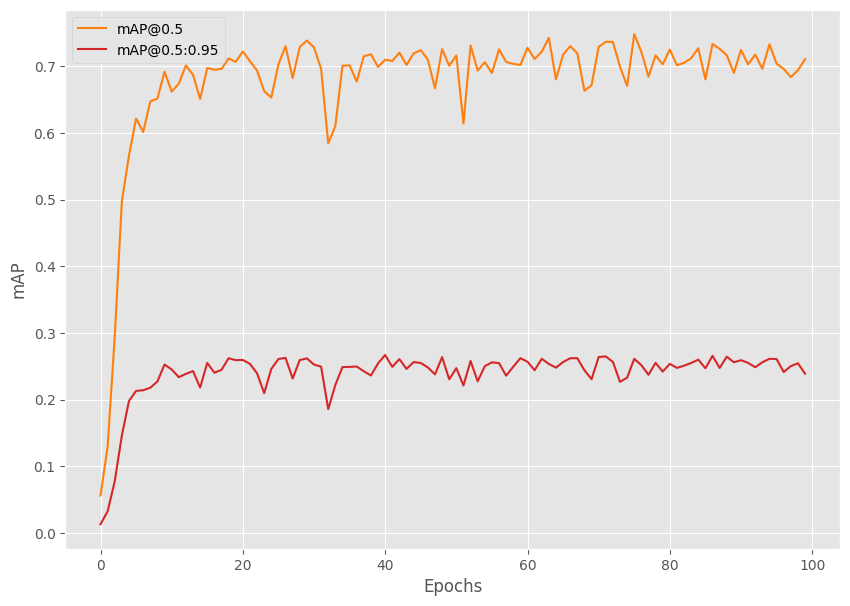

In [ ]:
from tqdm.auto import tqdm
from torchmetrics.detection.mean_ap import MeanAveragePrecision
from torch.optim.lr_scheduler import StepLR
import torch
import matplotlib.pyplot as plt
import time
import os

plt.style.use('ggplot')

seed = 42
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.cuda.manual_seed_all(seed)

# Function for running training iterations.
def train(train_data_loader, model):
    print('Training')
    model.train()

     # initialize tqdm progress bar
    prog_bar = tqdm(train_data_loader, total=len(train_data_loader))

    for i, data in enumerate(prog_bar):
        optimizer.zero_grad()
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]
        loss_dict = model(images, targets)

        losses = sum(loss for loss in loss_dict.values())
        loss_value = losses.item()

        train_loss_hist.send(loss_value)

        losses.backward()
        optimizer.step()

        # update the loss value beside the progress bar for each iteration
        prog_bar.set_description(desc=f"Loss: {loss_value:.4f}")
    return loss_value

# Function for running validation iterations.
def validate(valid_data_loader, model):
    print('Validating')
    model.eval()

    # Initialize tqdm progress bar.
    prog_bar = tqdm(valid_data_loader, total=len(valid_data_loader))
    target = []
    preds = []
    for i, data in enumerate(prog_bar):
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

        with torch.no_grad():
            outputs = model(images, targets)

        # For mAP calculation using Torchmetrics.
        #####################################
        for i in range(len(images)):
            true_dict = dict()
            preds_dict = dict()
            true_dict['boxes'] = targets[i]['boxes'].detach().cpu()
            true_dict['labels'] = targets[i]['labels'].detach().cpu()
            preds_dict['boxes'] = outputs[i]['boxes'].detach().cpu()
            preds_dict['scores'] = outputs[i]['scores'].detach().cpu()
            preds_dict['labels'] = outputs[i]['labels'].detach().cpu()
            preds.append(preds_dict)
            target.append(true_dict)
        #####################################

    metric.reset()
    metric.update(preds, target)
    metric_summary = metric.compute()
    return metric_summary

if __name__ == '__main__':
    os.makedirs('outputs', exist_ok=True)
    train_dataset = create_train_dataset(TRAIN_DIR)
    valid_dataset = create_valid_dataset(VALID_DIR)
    train_loader = create_train_loader(train_dataset, NUM_WORKERS)
    valid_loader = create_valid_loader(valid_dataset, NUM_WORKERS)
    print(f"Number of training samples: {len(train_dataset)}")
    print(f"Number of validation samples: {len(valid_dataset)}\n")

    # Initialize the model and move to the computation device.
    model = create_model(num_classes=NUM_CLASSES)
    model = model.to(DEVICE)
    # print(model)
    # Total parameters and trainable parameters.
    total_params = sum(p.numel() for p in model.parameters())
    print(f"{total_params:,} total parameters.")
    total_trainable_params = sum(
        p.numel() for p in model.parameters() if p.requires_grad)
    print(f"{total_trainable_params:,} training parameters.")
    params = [p for p in model.parameters() if p.requires_grad]
    optimizer = torch.optim.SGD(params, lr=0.01, momentum=0.9, weight_decay=0.0005, nesterov=True)
    scheduler = StepLR(
        optimizer=optimizer, step_size=15, gamma=0.1, verbose=True
    )

    # To monitor training loss
    train_loss_hist = Averager()
    # To store training loss and mAP values.
    train_loss_list = []
    map_50_list = []
    map_list = []

    # Mame to save the trained model with.
    MODEL_NAME = 'model'

    # Whether to show transformed images from data loader or not.
    # if VISUALIZE_TRANSFORMED_IMAGES:
    #     from custom_utils import show_tranformed_image
    #     show_tranformed_image(train_loader)

    # To save best model.
    save_best_model = SaveBestModel()

    metric = MeanAveragePrecision()

    # Training loop.
    for epoch in range(NUM_EPOCHS):
        print(f"\nEPOCH {epoch+1} of {NUM_EPOCHS}")

        # Reset the training loss histories for the current epoch.
        train_loss_hist.reset()

        # Start timer and carry out training and validation.
        start = time.time()
        train_loss = train(train_loader, model)
        metric_summary = validate(valid_loader, model)
        print(f"Epoch #{epoch+1} train loss: {train_loss_hist.value:.3f}")
        print(f"Epoch #{epoch+1} mAP: {metric_summary['map']}")
        end = time.time()
        print(f"Took {((end - start) / 60):.3f} minutes for epoch {epoch}")

        train_loss_list.append(train_loss)
        map_50_list.append(metric_summary['map_50'])
        map_list.append(metric_summary['map'])

        # save the best model till now.
        save_best_model(
            model, float(metric_summary['map_50']), epoch, 'outputs'
        )
        # Save the current epoch model.
        save_model(epoch, model, optimizer)

        # Save loss plot.
        save_loss_plot(OUT_DIR, train_loss_list)

        # Save mAP plot.
        save_mAP(OUT_DIR, map_50_list, map_list)
        # scheduler.step()

In [ ]:
import shutil

source_path = "/content/drive/MyDrive/SKRIPSI/Hasil/Model_9_8020_full/best_model.pth"
destination_path = "/content/outputs/best_model.pth"

shutil.copyfile(source_path, destination_path)

'/content/outputs/best_model.pth'

In [ ]:
import torch
from tqdm.auto import tqdm
from tqdm import TqdmExperimentalWarning
from torchmetrics.detection.mean_ap import MeanAveragePrecision

# Evaluation function
def validate(valid_data_loader, model):
    model.eval()

    # Initialize tqdm progress bar.
    prog_bar = tqdm(valid_data_loader, total=len(valid_data_loader))
    target = []
    preds = []
    for i, data in enumerate(prog_bar):
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

        with torch.no_grad():
            outputs = model(images, targets)

        # For mAP calculation using Torchmetrics.
        #####################################
        for i in range(len(images)):
            true_dict = dict()
            preds_dict = dict()
            true_dict['boxes'] = targets[i]['boxes'].detach().cpu()
            true_dict['labels'] = targets[i]['labels'].detach().cpu()
            preds_dict['boxes'] = outputs[i]['boxes'].detach().cpu()
            preds_dict['scores'] = outputs[i]['scores'].detach().cpu()
            preds_dict['labels'] = outputs[i]['labels'].detach().cpu()
            preds.append(preds_dict)
            target.append(true_dict)
        #####################################

    metric = MeanAveragePrecision()
    metric.update(preds, target)
    metric_summary = metric.compute()
    return metric_summary

if __name__ == '__main__':
    # Load the best model and trained weights.
    model = create_model(num_classes=NUM_CLASSES)
    checkpoint = torch.load('/content/outputs/best_model.pth', map_location=DEVICE)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.to(DEVICE).eval()

    test_dataset = create_test_dataset(
        '/content/PneumoniaDataset_8020_full_2/test'
    )
    test_loader = create_test_loader(test_dataset, num_workers=NUM_WORKERS)

    metric_summary = validate(test_loader, model)
    print(f"mAP_50: {metric_summary['map_50']*100:.3f}")
    print(f"mAP_50_95: {metric_summary['map']*100:.3f}")

  0%|          | 0/1202 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torchmetrics/utilities/prints.py:43: UserWarning: Encountered more than 100 detections in a single image. This means that certain detections with the lowest scores will be ignored, that may have an undesirable impact on performance. Please consider adjusting the `max_detection_threshold` to suit your use case. To disable this warning, set attribute class `warn_on_many_detections=False`, after initializing the metric.
  warnings.warn(*args, **kwargs)  # noqa: B028


mAP_50: 74.809
mAP_50_95: 26.132


  0%|          | 0/1202 [00:00<?, ?it/s]

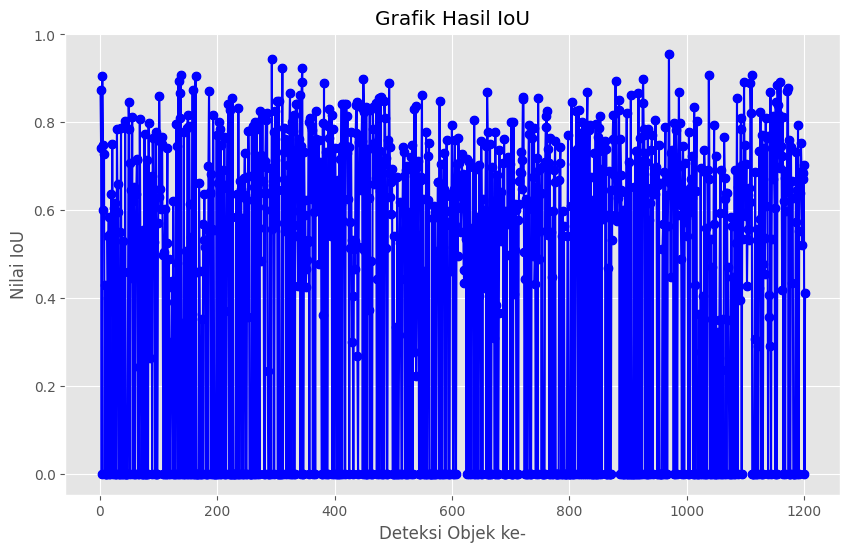

In [ ]:
import shutil
import torch
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
from torchvision.transforms.functional import to_pil_image
from torchvision.ops import box_iou

# Function to calculate Intersection over Union (IoU)
def calculate_iou(box1, box2):
    # Extract coordinates from the bounding box tensors
    box1 = [float(coord) for coord in box1]
    box2 = [float(coord) for coord in box2]

    # Calculate intersection area
    x1_int = max(box1[0], box2[0])
    y1_int = max(box1[1], box2[1])
    x2_int = min(box1[2], box2[2])
    y2_int = min(box1[3], box2[3])

    intersection = max(0, x2_int - x1_int) * max(0, y2_int - y1_int)

    # Calculate union area
    area1 = (box1[2] - box1[0]) * (box1[3] - box1[1])
    area2 = (box2[2] - box2[0]) * (box2[3] - box2[1])
    union = area1 + area2 - intersection

    # Calculate IoU
    iou = intersection / union if union > 0 else 0.0
    return iou

# source_path = "/content/drive/MyDrive/SKRIPSI/Hasil/Model_2/best_model.pth"
# destination_path = "/content/outputs/best_model.pth"

# shutil.copyfile(source_path, destination_path)

def show_iou_graph(images, true_boxes, pred_boxes, threshold=0.5, save_path="/content/iou_graph_model10.png"):
    all_ious = []

    for i in range(len(images)):
        true_boxes_i = true_boxes[i]
        pred_boxes_i = pred_boxes[i]

        ious = []  # To store IoU values for the current image

        for pred_box, score, label in zip(pred_boxes_i['boxes'], pred_boxes_i['scores'], pred_boxes_i['labels']):
            pred_box = [float(b) for b in pred_box]
            if score > threshold:
                # Find the corresponding true bounding box for the label
                true_box = true_boxes_i['boxes'][true_boxes_i['labels'] == label].cpu()
                if len(true_box) > 0:
                    true_box = [float(b) for b in true_box[0]]
                    iou = calculate_iou(pred_box, true_box)
                    ious.append(iou)

        # Store IoU values for the current image
        all_ious.append(ious)

    # Create IoU scatter plot
    plt.figure(figsize=(10, 6))
    plt.scatter(range(1, len(all_ious) + 1), [max(i, default=0) for i in all_ious], color='blue')
    plt.plot(range(1, len(all_ious) + 1), [max(i, default=0) for i in all_ious], linestyle='-', marker='o', color='blue')
    plt.title('Grafik Hasil IoU')
    plt.xlabel('Deteksi Objek ke-')
    plt.ylabel('Nilai IoU')
    plt.savefig(save_path)
    plt.show()

# Update the validate function to return images along with predictions
def validate(valid_data_loader, model):
    model.eval()

    # Initialize tqdm progress bar.
    prog_bar = tqdm(valid_data_loader, total=len(valid_data_loader))
    target = []
    preds = []
    images_list = []

    for i, data in enumerate(prog_bar):
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

        with torch.no_grad():
            outputs = model(images, targets)

        # For mAP calculation using Torchmetrics.
        for i in range(len(images)):
            true_dict = dict()
            preds_dict = dict()
            true_dict['boxes'] = targets[i]['boxes'].detach().cpu()
            true_dict['labels'] = targets[i]['labels'].detach().cpu()
            preds_dict['boxes'] = outputs[i]['boxes'].detach().cpu()
            preds_dict['scores'] = outputs[i]['scores'].detach().cpu()
            preds_dict['labels'] = outputs[i]['labels'].detach().cpu()
            preds.append(preds_dict)
            target.append(true_dict)
            images_list.append(images[i])

    return images_list, preds, target

if __name__ == '__main__':
    model = create_model(num_classes=NUM_CLASSES)
    checkpoint = torch.load('/content/outputs/best_model.pth', map_location=DEVICE)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.to(DEVICE).eval()

    test_dataset = create_test_dataset('/content/PneumoniaDataset_8020_full_2/test')
    test_loader = create_test_loader(test_dataset, num_workers=NUM_WORKERS)

    # After calculating metrics, you can display the IoU graph
    images, pred_boxes, true_boxes = validate(test_loader, model)
    # class_names = ['_Background', 'Pneumonia']
    show_iou_graph(images, true_boxes, pred_boxes, save_path='/content/iou_graph_model10.png')

In [ ]:
def make_prediction(model, img, threshold):
    model.eval()
    preds = model(img)
    for id in range(len(preds)) :
        idx_list = []

        for idx, score in enumerate(preds[id]['scores']) :
            if score > threshold :
                idx_list.append(idx)

        preds[id]['boxes'] = preds[id]['boxes'][idx_list]
        preds[id]['labels'] = preds[id]['labels'][idx_list]
        preds[id]['scores'] = preds[id]['scores'][idx_list]

    return preds

def plot_image_from_output(img, annotation):

    img = img.cpu().permute(1,2,0)

    fig,ax = plt.subplots(1)
    ax.imshow(img)

    for idx in range(len(annotation["boxes"])):
        xmin, ymin, xmax, ymax = annotation["boxes"][idx]

        if annotation['labels'][idx] == 1 :
            rect = patches.Rectangle((xmin,ymin),(xmax-xmin),(ymax-ymin),linewidth=1,edgecolor='g',facecolor='none')
        else :
            rect = patches.Rectangle((xmin,ymin),(xmax-xmin),(ymax-ymin),linewidth=1,edgecolor='orange',facecolor='none')

        ax.add_patch(rect)

    plt.show()

In [ ]:
from tqdm import tqdm

labels = []
preds_adj_all = []
annot_all = []

for im, annot in tqdm(test_loader, position = 0, leave = True):
    im = list(img.to(DEVICE) for img in im)
    #annot = [{k: v.to(device) for k, v in t.items()} for t in annot]

    for t in annot:
        labels += t['labels']

    with torch.no_grad():
        preds_adj = make_prediction(model, im, 0.5)
        preds_adj = [{k: v.to(torch.device('cpu')) for k, v in t.items()} for t in preds_adj]
        preds_adj_all.append(preds_adj)
        annot_all.append(annot)


100%|██████████| 1202/1202 [01:41<00:00, 11.86it/s]


In [ ]:
!git clone https://github.com/Pseudo-Lab/Tutorial-Book-Utils
!python Tutorial-Book-Utils/PL_data_loader.py --data FaceMaskDetection
%cd Tutorial-Book-Utils/
import utils_ObjectDetection as utils

Cloning into 'Tutorial-Book-Utils'...
remote: Enumerating objects: 45, done.
remote: Counting objects: 100% (45/45), done.
remote: Compressing objects: 100% (39/39), done.
remote: Total 45 (delta 18), reused 17 (delta 5), pack-reused 0
Receiving objects: 100% (45/45), 11.62 KiB | 1.94 MiB/s, done.
Resolving deltas: 100% (18/18), done.
Downloading...
From (original): https://drive.google.com/uc?id=16Gzn1w38yZLJpzmzKcRIRveFeHZtCEr7
From (redirected): https://drive.google.com/uc?id=16Gzn1w38yZLJpzmzKcRIRveFeHZtCEr7&confirm=t&uuid=2ccbf586-576a-4486-bfda-ea83f4e569ea
To: /content/Face Mask Detection.zip
100% 417M/417M [00:05<00:00, 80.4MB/s]
Face Mask Detection.zip download complete!
/content/Tutorial-Book-Utils


In [ ]:
sample_metrics = []
for batch_i in range(len(preds_adj_all)):
    sample_metrics += utils.get_batch_statistics(preds_adj_all[batch_i], annot_all[batch_i], iou_threshold=0.5)

true_positives, pred_scores, pred_labels = [torch.cat(x, 0) for x in list(zip(*sample_metrics))]  # batch semua disatukan
precision, recall, AP, f1, ap_class = utils.ap_per_class(true_positives, pred_scores, pred_labels, torch.tensor(labels))
mAP = torch.mean(AP)
print(f'mAP : {mAP}')
print(f'AP : {AP}')

mAP : 0.4941996291903447
AP : tensor([0.4942], dtype=torch.float64)


In [ ]:
sample_metrics = []
for batch_i in range(len(preds_adj_all)):
    sample_metrics += utils.get_batch_statistics(preds_adj_all[batch_i], annot_all[batch_i], iou_threshold=0.4)

true_positives, pred_scores, pred_labels = [torch.cat(x, 0) for x in list(zip(*sample_metrics))]  # batch semua disatukan
precision, recall, AP, f1, ap_class = utils.ap_per_class(true_positives, pred_scores, pred_labels, torch.tensor(labels))
mAP = torch.mean(AP)
print(f'mAP : {mAP}')
print(f'AP : {AP}')

mAP : 0.5768208733981393
AP : tensor([0.5768], dtype=torch.float64)


In [ ]:
sample_metrics = []
for batch_i in range(len(preds_adj_all)):
    sample_metrics += utils.get_batch_statistics(preds_adj_all[batch_i], annot_all[batch_i], iou_threshold=0.3)

true_positives, pred_scores, pred_labels = [torch.cat(x, 0) for x in list(zip(*sample_metrics))]  # batch semua disatukan
precision, recall, AP, f1, ap_class = utils.ap_per_class(true_positives, pred_scores, pred_labels, torch.tensor(labels))
mAP = torch.mean(AP)
print(f'mAP : {mAP}')
print(f'AP : {AP}')

mAP : 0.6196086851427083
AP : tensor([0.6196], dtype=torch.float64)


In [ ]:
sample_metrics = []
for batch_i in range(len(preds_adj_all)):
    sample_metrics += utils.get_batch_statistics(preds_adj_all[batch_i], annot_all[batch_i], iou_threshold=0.3)

true_positives, pred_scores, pred_labels = [torch.cat(x, 0) for x in list(zip(*sample_metrics))]  # batch semua disatukan
precision, recall, AP, f1, ap_class = utils.ap_per_class(true_positives, pred_scores, pred_labels, torch.tensor(labels))
mAP = torch.mean(AP)
print(f'mAP : {mAP}')
print(f'AP : {AP}')

mAP : 0.6196137027175328
AP : tensor([0.6196], dtype=torch.float64)


In [ ]:
import numpy as np
import cv2
import torch
import glob as glob
import os
import time
import argparse
import csv

os.makedirs('inference_outputs/images', exist_ok=True)

COLORS = np.random.uniform(0, 255, size=(len(CLASSES), 3))

# Load the best model and trained weights.
model = create_model(num_classes=NUM_CLASSES)
checkpoint = torch.load('/content/outputs/best_model.pth', map_location=DEVICE)
model.load_state_dict(checkpoint['model_state_dict'])
model.to(DEVICE).eval()

# Directory where all the images are present.
DIR_TEST = '/content/PneumoniaDataset_8020_full_2/test'
test_images = glob.glob(f"{DIR_TEST}/*.jpg")
print(f"Test instances: {len(test_images)}")

frame_count = 0 # To count total frames.
total_fps = 0 # To get the final frames per second.
lung_opacity_files = []

for i in range(len(test_images)):
    # Get the image file name for saving output later on.
    image_name = test_images[i].split(os.path.sep)[-1].split('.')[0]
    image = cv2.imread(test_images[i])
    orig_image = image.copy()
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
    image /= 255.0
    image_input = np.transpose(image, (2, 0, 1)).astype(np.float32)
    image_input = torch.tensor(image_input, dtype=torch.float).cuda()
    image_input = torch.unsqueeze(image_input, 0)
    start_time = time.time()
    # Predictions
    with torch.no_grad():
        outputs = model(image_input.to(DEVICE))
    end_time = time.time()

    # Get the current fps.
    fps = 1 / (end_time - start_time)
    total_fps += fps
    frame_count += 1

    # Load all detection to CPU for further operations.
    outputs = [{k: v.to('cpu') for k, v in t.items()} for t in outputs]
    if len(outputs[0]['boxes']) != 0:
        boxes = outputs[0]['boxes'].data.numpy()
        scores = outputs[0]['scores'].data.numpy()
        boxes = boxes[scores >= 0.5].astype(np.int32)
        draw_boxes = boxes.copy()
        # Get all the predicited class names.
        pred_classes = [CLASSES[i] for i in outputs[0]['labels'].cpu().numpy()]
        # Draw the bounding boxes and write the class name on top of it.
        for j, box in enumerate(draw_boxes):
            print(image_name)
            class_name = pred_classes[j]
            color = COLORS[CLASSES.index(class_name)]
            # Recale boxes.
            xmin = int((box[0] / image.shape[1]) * orig_image.shape[1])
            ymin = int((box[1] / image.shape[0]) * orig_image.shape[0])
            xmax = int((box[2] / image.shape[1]) * orig_image.shape[1])
            ymax = int((box[3] / image.shape[0]) * orig_image.shape[0])
            cv2.rectangle(orig_image,
                        (xmin, ymin),
                        (xmax, ymax),
                        color[::-1],
                        3)
            cv2.putText(orig_image,
                        class_name,
                        (xmin, ymin-5),
                        cv2.FONT_HERSHEY_SIMPLEX,
                        0.8,
                        color[::-1],
                        2,
                        lineType=cv2.LINE_AA)
        plt.imshow(cv2.cvtColor(orig_image, cv2.COLOR_BGR2RGB))
        plt.show()

        # Simpan gambar ke direktori
        # cv2.imwrite(f"inference_outputs/images/{image_name}.jpg", orig_image)
    print(f"Image {i+1} done...")
    print('-'*50)

print('TEST PREDICTIONS COMPLETE')
avg_fps = total_fps / frame_count
print(f"Average FPS: {avg_fps:.3f}")

Output hidden; open in https://colab.research.google.com to view.

# Model 11 | BATCH : 4 | LR : 0.001 | 90:20 - 5000 DATASET

In [ ]:
import zipfile
import os

zip_file_path = '/content/drive/MyDrive/SKRIPSI/Dataset/PneumoniaDataset_9010_5000.zip'  # Ganti dengan path ke file ZIP Anda
unzip_dir = '/content'  # Ganti dengan direktori di mana Anda ingin mengekstrak file

def extract_zip(zip_file, extract_dir):
    with zipfile.ZipFile(zip_file, 'r') as zip_ref:
        zip_ref.extractall(extract_dir)

def list_files(directory):
    return os.listdir(directory)

# Ekstrak file ZIP
extract_zip(zip_file_path, unzip_dir)

# Tampilkan daftar file yang diekstrak
extracted_files = list_files(unzip_dir)
print(extracted_files)

['.config', '__MACOSX', 'PneumoniaDataset_9010_5000', 'drive', 'sample_data']


In [ ]:
import torch
import os


DEVICE = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

BATCH_SIZE = 4 # Increase / decrease according to GPU memeory.
RESIZE_TO = 300 # Resize the image for training and transforms.
NUM_EPOCHS = 100 # Number of epochs to train for.
NUM_WORKERS = 2 # Number of parallel workers for data loading.

CLASSES = [
    '_background','Lung Opacity'
    # 'helmet','head','person'
]



TRAIN_DIR = '/content/PneumoniaDataset_9010_5000/train'
VALID_DIR = '/content/PneumoniaDataset_9010_5000/test'

# Classes: 0 index is reserved for background.


NUM_CLASSES = len(CLASSES)

# Whether to visualize images after crearing the data loaders.
VISUALIZE_TRANSFORMED_IMAGES = False

# Location to save model and plots.
OUT_DIR = 'outputs'
os.makedirs(OUT_DIR, exist_ok=True)

In [ ]:
import albumentations as A
import cv2
import numpy as np
import torch
import matplotlib.pyplot as plt

from albumentations.pytorch import ToTensorV2


plt.style.use('ggplot')

# This class keeps track of the training and validation loss values
# and helps to get the average for each epoch as well.
class Averager:
    def __init__(self):
        self.current_total = 0.0
        self.iterations = 0.0

    def send(self, value):
        self.current_total += value
        self.iterations += 1

    @property
    def value(self):
        if self.iterations == 0:
            return 0
        else:
            return 1.0 * self.current_total / self.iterations

    def reset(self):
        self.current_total = 0.0
        self.iterations = 0.0

class SaveBestModel:
    """
    Class to save the best model while training. If the current epoch's
    validation mAP @0.5:0.95 IoU higher than the previous highest, then save the
    model state.
    """
    def __init__(
        self, best_valid_map=float(0)
    ):
        self.best_valid_map = best_valid_map

    def __call__(
        self,
        model,
        current_valid_map,
        epoch,
        OUT_DIR,
    ):
        if current_valid_map > self.best_valid_map:
            self.best_valid_map = current_valid_map
            print(f"\nBEST VALIDATION mAP: {self.best_valid_map}")
            print(f"\nSAVING BEST MODEL FOR EPOCH: {epoch+1}\n")
            torch.save({
                'epoch': epoch+1,
                'model_state_dict': model.state_dict(),
                }, f"{OUT_DIR}/best_model.pth")

def collate_fn(batch):
    """
    To handle the data loading as different images may have different number
    of objects and to handle varying size tensors as well.
    """
    return tuple(zip(*batch))

# Define the training tranforms.
def get_train_transform():
    return A.Compose([
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.Rotate(limit=6),
        A.Blur(blur_limit=3, p=0.1),
        A.MotionBlur(blur_limit=3, p=0.1),
        A.MedianBlur(blur_limit=3, p=0.1),
        A.RandomBrightnessContrast(p=0.2),
        ToTensorV2(p=1.0),
    ], bbox_params={
        'format': 'pascal_voc',
        'label_fields': ['labels']
    })


# Define the validation transforms.
def get_valid_transform():
    return A.Compose([
        ToTensorV2(p=1.0),
    ], bbox_params={
        'format': 'pascal_voc',
        'label_fields': ['labels']
    })


def show_tranformed_image(train_loader):
    """
    This function shows the transformed images from the `train_loader`.
    Helps to check whether the tranformed images along with the corresponding
    labels are correct or not.
    Only runs if `VISUALIZE_TRANSFORMED_IMAGES = True` in config.py.
    """
    if len(train_loader) > 0:
        for i in range(1):
            images, targets = next(iter(train_loader))
            images = list(image.to(DEVICE) for image in images)
            targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]
            boxes = targets[i]['boxes'].cpu().numpy().astype(np.int32)
            labels = targets[i]['labels'].cpu().numpy().astype(np.int32)
            sample = images[i].permute(1, 2, 0).cpu().numpy()
            sample = cv2.cvtColor(sample, cv2.COLOR_RGB2BGR)
            for box_num, box in enumerate(boxes):
                cv2.rectangle(sample,
                            (box[0], box[1]),
                            (box[2], box[3]),
                            (0, 0, 255), 2)
                cv2.putText(sample, CLASSES[labels[box_num]],
                            (box[0], box[1]-10), cv2.FONT_HERSHEY_SIMPLEX,
                            1.0, (0, 0, 255), 2)
            cv2.imshow('Transformed image', sample)
            cv2.waitKey(0)
            cv2.destroyAllWindows()

def save_model(epoch, model, optimizer):
    """
    Function to save the trained model till current epoch, or whenver called
    """
    torch.save({
                'epoch': epoch+1,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                }, 'outputs/last_model.pth')

def save_loss_plot(
    OUT_DIR,
    train_loss_list,
    x_label='iterations',
    y_label='train loss',
    save_name='train_loss'
):
    """
    Function to save both train loss graph.

    :param OUT_DIR: Path to save the graphs.
    :param train_loss_list: List containing the training loss values.
    """
    figure_1 = plt.figure(figsize=(10, 7), num=1, clear=True)
    train_ax = figure_1.add_subplot()
    train_ax.plot(train_loss_list, color='tab:blue')
    train_ax.set_xlabel(x_label)
    train_ax.set_ylabel(y_label)
    figure_1.savefig(f"{OUT_DIR}/{save_name}.png")
    print('SAVING PLOTS COMPLETE...')

def save_mAP(OUT_DIR, map_05, map):
    """
    Saves the mAP@0.5 and mAP@0.5:0.95 per epoch.
    :param OUT_DIR: Path to save the graphs.
    :param map_05: List containing mAP values at 0.5 IoU.
    :param map: List containing mAP values at 0.5:0.95 IoU.
    """
    figure = plt.figure(figsize=(10, 7), num=1, clear=True)
    ax = figure.add_subplot()
    ax.plot(
        map_05, color='tab:orange', linestyle='-',
        label='mAP@0.5'
    )
    ax.plot(
        map, color='tab:red', linestyle='-',
        label='mAP@0.5:0.95'
    )
    ax.set_xlabel('Epochs')
    ax.set_ylabel('mAP')
    ax.legend()
    figure.savefig(f"{OUT_DIR}/map.png")

In [ ]:
import torch
import cv2
import numpy as np
import os
import glob as glob
from google.colab.patches import cv2_imshow
from xml.etree import ElementTree as et
from torch.utils.data import Dataset, DataLoader

# The dataset class.
class PneumoniaDataset(Dataset):
    def __init__(self, dir_path, width, height, classes, transforms=None):
        self.transforms = transforms
        self.dir_path = dir_path
        self.height = height
        self.width = width
        self.classes = classes
        self.image_file_types = ['*.jpg', '*.jpeg', '*.png', '*.ppm', '*.JPG']
        self.all_image_paths = []

        # Get all the image paths in sorted order.
        for file_type in self.image_file_types:
            self.all_image_paths.extend(glob.glob(os.path.join(self.dir_path, file_type)))
        self.all_images = [image_path.split(os.path.sep)[-1] for image_path in self.all_image_paths]
        self.all_images = sorted(self.all_images)

    def __getitem__(self, idx):
        # Capture the image name and the full image path.
        image_name = self.all_images[idx]
        image_path = os.path.join(self.dir_path, image_name)

        # Read and preprocess the image.
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
        image_resized = cv2.resize(image, (self.width, self.height))
        image_resized /= 255.0

        # Capture the corresponding XML file for getting the annotations.
        annot_filename = os.path.splitext(image_name)[0] + '.xml'
        annot_file_path = os.path.join(self.dir_path, annot_filename)

        boxes = []
        labels = []
        tree = et.parse(annot_file_path)
        root = tree.getroot()

        # Original image width and height.
        image_width = image.shape[1]
        image_height = image.shape[0]

        # Box coordinates for xml files are extracted
        # and corrected for image size given.
        for member in root.findall('object'):
            # Get label and map the `classes`.
            labels.append(self.classes.index(member.find('name').text))

            # Left corner x-coordinates.
            xmin = int(member.find('bndbox').find('xmin').text)
            # Right corner x-coordinates.
            xmax = int(member.find('bndbox').find('xmax').text)
            # Left corner y-coordinates.
            ymin = int(member.find('bndbox').find('ymin').text)
            # Right corner y-coordinates.
            ymax = int(member.find('bndbox').find('ymax').text)

            # Resize the bounding boxes according
            # to resized image `width`, `height`.
            xmin_final = (xmin/image_width)*self.width
            xmax_final = (xmax/image_width)*self.width
            ymin_final = (ymin/image_height)*self.height
            ymax_final = (ymax/image_height)*self.height

            # Check that max coordinates are at least one pixel
            # larger than min coordinates.
            if xmax_final == xmin_final:
                xmax_final += 1
            if ymax_final == ymin_final:
                ymax_final += 1
            # Check that all coordinates are within the image.
            if xmax_final > self.width:
                xmax_final = self.width
            if ymax_final > self.height:
                ymax_final = self.height

            boxes.append([xmin_final, ymin_final, xmax_final, ymax_final])

        # Bounding box to tensor.
        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        # Area of the bounding boxes.
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0]) if len(boxes) > 0 \
            else torch.as_tensor(boxes, dtype=torch.float32)
        # No crowd instances.
        iscrowd = torch.zeros((boxes.shape[0],), dtype=torch.int64)
        # Labels to tensor.
        labels = torch.as_tensor(labels, dtype=torch.int64)

        # Prepare the final `target` dictionary.
        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["area"] = area
        target["iscrowd"] = iscrowd
        image_id = torch.tensor([idx])
        target["image_id"] = image_id

        # Apply the image transforms.
        if self.transforms:
            sample = self.transforms(image = image_resized,
                                     bboxes = target['boxes'],
                                     labels = labels)
            image_resized = sample['image']
            target['boxes'] = torch.Tensor(sample['bboxes'])

        if np.isnan((target['boxes']).numpy()).any() or target['boxes'].shape == torch.Size([0]):
            target['boxes'] = torch.zeros((0, 4), dtype=torch.int64)
        return image_resized, target

    def __len__(self):
        return len(self.all_images)
        # return 500;

# Prepare the final datasets and data loaders.
def create_train_dataset(DIR):
    train_dataset = PneumoniaDataset(
        DIR, RESIZE_TO, RESIZE_TO, CLASSES, get_train_transform()
    )
    return train_dataset
def create_valid_dataset(DIR):
    valid_dataset = PneumoniaDataset(
        DIR, RESIZE_TO, RESIZE_TO, CLASSES, get_valid_transform()
    )
    return valid_dataset
def create_test_dataset(DIR):
    test_dataset = PneumoniaDataset(
        DIR, RESIZE_TO, RESIZE_TO, CLASSES, get_valid_transform()
    )
    return test_dataset
def create_train_loader(train_dataset, num_workers=0):
    train_loader = DataLoader(
        train_dataset,
        batch_size=BATCH_SIZE,
        shuffle=True,
        num_workers=num_workers,
        collate_fn=collate_fn,
        drop_last=True
    )
    return train_loader
def create_valid_loader(valid_dataset, num_workers=0):
    valid_loader = DataLoader(
        valid_dataset,
        batch_size=BATCH_SIZE,
        shuffle=False,
        num_workers=num_workers,
        collate_fn=collate_fn,
        drop_last=True
    )
    return valid_loader
def create_test_loader(test_dataset, num_workers=0):
    test_loader = DataLoader(
        test_dataset,
        batch_size=1,
        shuffle=False,
        num_workers=num_workers,
        collate_fn=collate_fn,
        drop_last=True
    )
    return test_loader


In [ ]:
import torchvision
import torch

from functools import partial
from torchvision.models.detection import RetinaNet
from torchvision.models.detection.backbone_utils import resnet_fpn_backbone
from torchvision.models.detection.retinanet import RetinaNetClassificationHead
from torchvision.models.detection import RetinaNet_ResNet50_FPN_V2_Weights
from torchvision.models.detection.retinanet import RetinaNetClassificationHead

def create_model(num_classes):
    model = torchvision.models.detection.retinanet_resnet50_fpn_v2(
        weights=RetinaNet_ResNet50_FPN_V2_Weights.COCO_V1
    )
    num_anchors = model.head.classification_head.num_anchors

    model.head.classification_head = RetinaNetClassificationHead(
        in_channels=256,
        num_anchors=num_anchors,
        num_classes=num_classes,
        norm_layer=partial(torch.nn.GroupNorm, 32)
    )
    return model

if __name__ == '__main__':
    model = create_model(2)
    # print(model)
    # Total parameters and trainable parameters.
    total_params = sum(p.numel() for p in model.parameters())
    print(f"{total_params:,} total parameters.")
    total_trainable_params = sum(
        p.numel() for p in model.parameters() if p.requires_grad)
    print(f"{total_trainable_params:,} training parameters.")

Downloading: "https://download.pytorch.org/models/retinanet_resnet50_fpn_v2_coco-5905b1c5.pth" to /root/.cache/torch/hub/checkpoints/retinanet_resnet50_fpn_v2_coco-5905b1c5.pth
100%|██████████| 146M/146M [00:00<00:00, 177MB/s]


36,352,630 total parameters.
36,127,286 training parameters.


In [ ]:
!pip install torchmetrics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 840.4/840.4 kB 15.2 MB/s eta 0:00:00


Number of training samples: 4500
Number of validation samples: 500

36,352,630 total parameters.
36,127,286 training parameters.
Adjusting learning rate of group 0 to 1.0000e-03.

EPOCH 1 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torchmetrics/utilities/prints.py:43: UserWarning: Encountered more than 100 detections in a single image. This means that certain detections with the lowest scores will be ignored, that may have an undesirable impact on performance. Please consider adjusting the `max_detection_threshold` to suit your use case. To disable this warning, set attribute class `warn_on_many_detections=False`, after initializing the metric.
  warnings.warn(*args, **kwargs)  # noqa: B028


Epoch #1 train loss: 0.793
Epoch #1 mAP: 0.19325615465641022
Took 2.550 minutes for epoch 0

BEST VALIDATION mAP: 0.5864655375480652

SAVING BEST MODEL FOR EPOCH: 1

SAVING PLOTS COMPLETE...

EPOCH 2 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #2 train loss: 0.696
Epoch #2 mAP: 0.26623329520225525
Took 2.462 minutes for epoch 1

BEST VALIDATION mAP: 0.7507659196853638

SAVING BEST MODEL FOR EPOCH: 2

SAVING PLOTS COMPLETE...

EPOCH 3 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #3 train loss: 0.664
Epoch #3 mAP: 0.2883879244327545
Took 2.803 minutes for epoch 2

BEST VALIDATION mAP: 0.7647498250007629

SAVING BEST MODEL FOR EPOCH: 3

SAVING PLOTS COMPLETE...

EPOCH 4 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #4 train loss: 0.648
Epoch #4 mAP: 0.29632341861724854
Took 2.633 minutes for epoch 3
SAVING PLOTS COMPLETE...

EPOCH 5 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #5 train loss: 0.635
Epoch #5 mAP: 0.30624568462371826
Took 2.463 minutes for epoch 4

BEST VALIDATION mAP: 0.7940171957015991

SAVING BEST MODEL FOR EPOCH: 5

SAVING PLOTS COMPLETE...

EPOCH 6 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #6 train loss: 0.624
Epoch #6 mAP: 0.30790796875953674
Took 2.289 minutes for epoch 5
SAVING PLOTS COMPLETE...

EPOCH 7 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #7 train loss: 0.615
Epoch #7 mAP: 0.30190718173980713
Took 2.787 minutes for epoch 6
SAVING PLOTS COMPLETE...

EPOCH 8 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #8 train loss: 0.611
Epoch #8 mAP: 0.3034156858921051
Took 2.448 minutes for epoch 7
SAVING PLOTS COMPLETE...

EPOCH 9 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #9 train loss: 0.607
Epoch #9 mAP: 0.3140411674976349
Took 2.285 minutes for epoch 8

BEST VALIDATION mAP: 0.8068646192550659

SAVING BEST MODEL FOR EPOCH: 9

SAVING PLOTS COMPLETE...

EPOCH 10 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #10 train loss: 0.600
Epoch #10 mAP: 0.31496211886405945
Took 2.464 minutes for epoch 9
SAVING PLOTS COMPLETE...

EPOCH 11 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7c6cfc004160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7c6cfc004160>Traceback (most recent call last):

  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #11 train loss: 0.595
Epoch #11 mAP: 0.30904245376586914
Took 2.287 minutes for epoch 10
SAVING PLOTS COMPLETE...

EPOCH 12 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #12 train loss: 0.594
Epoch #12 mAP: 0.3139687478542328
Took 2.300 minutes for epoch 11
SAVING PLOTS COMPLETE...

EPOCH 13 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #13 train loss: 0.588
Epoch #13 mAP: 0.32564577460289
Took 2.803 minutes for epoch 12
SAVING PLOTS COMPLETE...

EPOCH 14 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #14 train loss: 0.585
Epoch #14 mAP: 0.3200339376926422
Took 2.471 minutes for epoch 13
SAVING PLOTS COMPLETE...

EPOCH 15 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #15 train loss: 0.581
Epoch #15 mAP: 0.3185254633426666
Took 2.462 minutes for epoch 14
SAVING PLOTS COMPLETE...

EPOCH 16 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #16 train loss: 0.579
Epoch #16 mAP: 0.3150629699230194
Took 2.467 minutes for epoch 15
SAVING PLOTS COMPLETE...

EPOCH 17 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #17 train loss: 0.576
Epoch #17 mAP: 0.31777817010879517
Took 2.465 minutes for epoch 16
SAVING PLOTS COMPLETE...

EPOCH 18 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7c6cfc004160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7c6cfc004160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #18 train loss: 0.572
Epoch #18 mAP: 0.32832562923431396
Took 2.627 minutes for epoch 17

BEST VALIDATION mAP: 0.8250330686569214

SAVING BEST MODEL FOR EPOCH: 18

SAVING PLOTS COMPLETE...

EPOCH 19 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #19 train loss: 0.569
Epoch #19 mAP: 0.32046544551849365
Took 2.461 minutes for epoch 18
SAVING PLOTS COMPLETE...

EPOCH 20 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #20 train loss: 0.568
Epoch #20 mAP: 0.3130068778991699
Took 2.792 minutes for epoch 19
SAVING PLOTS COMPLETE...

EPOCH 21 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #21 train loss: 0.563
Epoch #21 mAP: 0.32191339135169983
Took 2.453 minutes for epoch 20
SAVING PLOTS COMPLETE...

EPOCH 22 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #22 train loss: 0.562
Epoch #22 mAP: 0.3281311094760895
Took 2.448 minutes for epoch 21
SAVING PLOTS COMPLETE...

EPOCH 23 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #23 train loss: 0.558
Epoch #23 mAP: 0.31624719500541687
Took 2.451 minutes for epoch 22
SAVING PLOTS COMPLETE...

EPOCH 24 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #24 train loss: 0.557
Epoch #24 mAP: 0.30824965238571167
Took 2.452 minutes for epoch 23
SAVING PLOTS COMPLETE...

EPOCH 25 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #25 train loss: 0.555
Epoch #25 mAP: 0.3224109411239624
Took 2.791 minutes for epoch 24
SAVING PLOTS COMPLETE...

EPOCH 26 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7c6cfc004160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7c6cfc004160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #26 train loss: 0.552
Epoch #26 mAP: 0.3225836753845215
Took 2.288 minutes for epoch 25
SAVING PLOTS COMPLETE...

EPOCH 27 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #27 train loss: 0.545
Epoch #27 mAP: 0.3036179840564728
Took 2.788 minutes for epoch 26
SAVING PLOTS COMPLETE...

EPOCH 28 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #28 train loss: 0.546
Epoch #28 mAP: 0.3133697509765625
Took 2.452 minutes for epoch 27
SAVING PLOTS COMPLETE...

EPOCH 29 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #29 train loss: 0.543
Epoch #29 mAP: 0.31981396675109863
Took 2.442 minutes for epoch 28
SAVING PLOTS COMPLETE...

EPOCH 30 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #30 train loss: 0.540
Epoch #30 mAP: 0.32347023487091064
Took 2.956 minutes for epoch 29
SAVING PLOTS COMPLETE...

EPOCH 31 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #31 train loss: 0.536
Epoch #31 mAP: 0.3177352249622345
Took 2.290 minutes for epoch 30
SAVING PLOTS COMPLETE...

EPOCH 32 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #32 train loss: 0.535
Epoch #32 mAP: 0.31595906615257263
Took 2.460 minutes for epoch 31
SAVING PLOTS COMPLETE...

EPOCH 33 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7c6cfc004160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7c6cfc004160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #33 train loss: 0.531
Epoch #33 mAP: 0.3178943395614624
Took 3.126 minutes for epoch 32
SAVING PLOTS COMPLETE...

EPOCH 34 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #34 train loss: 0.530
Epoch #34 mAP: 0.31470969319343567
Took 2.460 minutes for epoch 33
SAVING PLOTS COMPLETE...

EPOCH 35 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #35 train loss: 0.527
Epoch #35 mAP: 0.321017861366272
Took 2.800 minutes for epoch 34
SAVING PLOTS COMPLETE...

EPOCH 36 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #36 train loss: 0.522
Epoch #36 mAP: 0.30257952213287354
Took 2.457 minutes for epoch 35
SAVING PLOTS COMPLETE...

EPOCH 37 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #37 train loss: 0.521
Epoch #37 mAP: 0.316305011510849
Took 2.455 minutes for epoch 36
SAVING PLOTS COMPLETE...

EPOCH 38 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #38 train loss: 0.519
Epoch #38 mAP: 0.30324169993400574
Took 2.958 minutes for epoch 37
SAVING PLOTS COMPLETE...

EPOCH 39 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #39 train loss: 0.517
Epoch #39 mAP: 0.3141011595726013
Took 2.286 minutes for epoch 38
SAVING PLOTS COMPLETE...

EPOCH 40 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #40 train loss: 0.512
Epoch #40 mAP: 0.29970502853393555
Took 2.954 minutes for epoch 39
SAVING PLOTS COMPLETE...

EPOCH 41 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #41 train loss: 0.511
Epoch #41 mAP: 0.31109485030174255
Took 2.454 minutes for epoch 40
SAVING PLOTS COMPLETE...

EPOCH 42 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #42 train loss: 0.507
Epoch #42 mAP: 0.30550625920295715
Took 2.450 minutes for epoch 41
SAVING PLOTS COMPLETE...

EPOCH 43 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #43 train loss: 0.505
Epoch #43 mAP: 0.30768606066703796
Took 2.449 minutes for epoch 42
SAVING PLOTS COMPLETE...

EPOCH 44 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #44 train loss: 0.505
Epoch #44 mAP: 0.315017431974411
Took 2.453 minutes for epoch 43
SAVING PLOTS COMPLETE...

EPOCH 45 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7c6cfc004160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7c6cfc004160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #45 train loss: 0.498
Epoch #45 mAP: 0.31085219979286194
Took 2.449 minutes for epoch 44
SAVING PLOTS COMPLETE...

EPOCH 46 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #46 train loss: 0.496
Epoch #46 mAP: 0.3033764362335205
Took 2.782 minutes for epoch 45
SAVING PLOTS COMPLETE...

EPOCH 47 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #47 train loss: 0.495
Epoch #47 mAP: 0.3059893548488617
Took 2.441 minutes for epoch 46
SAVING PLOTS COMPLETE...

EPOCH 48 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #48 train loss: 0.491
Epoch #48 mAP: 0.30957305431365967
Took 2.443 minutes for epoch 47
SAVING PLOTS COMPLETE...

EPOCH 49 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #49 train loss: 0.488
Epoch #49 mAP: 0.30935367941856384
Took 2.945 minutes for epoch 48
SAVING PLOTS COMPLETE...

EPOCH 50 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7c6cfc004160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process


Epoch #50 train loss: 0.486
Epoch #50 mAP: 0.2829627990722656
Took 2.444 minutes for epoch 49
SAVING PLOTS COMPLETE...

EPOCH 51 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #51 train loss: 0.485
Epoch #51 mAP: 0.3015173077583313
Took 2.445 minutes for epoch 50
SAVING PLOTS COMPLETE...

EPOCH 52 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7c6cfc004160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process


Epoch #52 train loss: 0.479
Epoch #52 mAP: 0.29723331332206726
Took 2.944 minutes for epoch 51
SAVING PLOTS COMPLETE...

EPOCH 53 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #53 train loss: 0.476
Epoch #53 mAP: 0.3062056601047516
Took 2.447 minutes for epoch 52
SAVING PLOTS COMPLETE...

EPOCH 54 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #54 train loss: 0.475
Epoch #54 mAP: 0.27987855672836304
Took 2.451 minutes for epoch 53
SAVING PLOTS COMPLETE...

EPOCH 55 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #55 train loss: 0.472
Epoch #55 mAP: 0.3060484826564789
Took 2.950 minutes for epoch 54
SAVING PLOTS COMPLETE...

EPOCH 56 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #56 train loss: 0.468
Epoch #56 mAP: 0.2901294231414795
Took 2.446 minutes for epoch 55
SAVING PLOTS COMPLETE...

EPOCH 57 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #57 train loss: 0.465
Epoch #57 mAP: 0.30044025182724
Took 2.444 minutes for epoch 56
SAVING PLOTS COMPLETE...

EPOCH 58 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #58 train loss: 0.463
Epoch #58 mAP: 0.29279738664627075
Took 2.277 minutes for epoch 57
SAVING PLOTS COMPLETE...

EPOCH 59 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #59 train loss: 0.461
Epoch #59 mAP: 0.3029525578022003
Took 2.441 minutes for epoch 58
SAVING PLOTS COMPLETE...

EPOCH 60 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #60 train loss: 0.458
Epoch #60 mAP: 0.29299840331077576
Took 2.441 minutes for epoch 59
SAVING PLOTS COMPLETE...

EPOCH 61 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7c6cfc004160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process


Epoch #61 train loss: 0.454
Epoch #61 mAP: 0.2940957248210907
Took 2.443 minutes for epoch 60
SAVING PLOTS COMPLETE...

EPOCH 62 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #62 train loss: 0.451
Epoch #62 mAP: 0.2942304015159607
Took 2.948 minutes for epoch 61
SAVING PLOTS COMPLETE...

EPOCH 63 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #63 train loss: 0.447
Epoch #63 mAP: 0.28875067830085754
Took 2.444 minutes for epoch 62
SAVING PLOTS COMPLETE...

EPOCH 64 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #64 train loss: 0.447
Epoch #64 mAP: 0.2770468294620514
Took 2.278 minutes for epoch 63
SAVING PLOTS COMPLETE...

EPOCH 65 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #65 train loss: 0.443
Epoch #65 mAP: 0.2812403440475464
Took 3.114 minutes for epoch 64
SAVING PLOTS COMPLETE...

EPOCH 66 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #66 train loss: 0.437
Epoch #66 mAP: 0.28969916701316833
Took 2.449 minutes for epoch 65
SAVING PLOTS COMPLETE...

EPOCH 67 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #67 train loss: 0.438
Epoch #67 mAP: 0.2947227358818054
Took 2.445 minutes for epoch 66
SAVING PLOTS COMPLETE...

EPOCH 68 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7c6cfc004160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process


Epoch #68 train loss: 0.434
Epoch #68 mAP: 0.2799243927001953
Took 2.442 minutes for epoch 67
SAVING PLOTS COMPLETE...

EPOCH 69 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #69 train loss: 0.430
Epoch #69 mAP: 0.27247363328933716
Took 2.442 minutes for epoch 68
SAVING PLOTS COMPLETE...

EPOCH 70 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #70 train loss: 0.430
Epoch #70 mAP: 0.29697906970977783
Took 2.440 minutes for epoch 69
SAVING PLOTS COMPLETE...

EPOCH 71 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #71 train loss: 0.427
Epoch #71 mAP: 0.2935415804386139
Took 2.950 minutes for epoch 70
SAVING PLOTS COMPLETE...

EPOCH 72 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #72 train loss: 0.423
Epoch #72 mAP: 0.2841169536113739
Took 2.441 minutes for epoch 71
SAVING PLOTS COMPLETE...

EPOCH 73 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #73 train loss: 0.422
Epoch #73 mAP: 0.2873342037200928
Took 2.445 minutes for epoch 72
SAVING PLOTS COMPLETE...

EPOCH 74 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #74 train loss: 0.419
Epoch #74 mAP: 0.28157877922058105
Took 2.953 minutes for epoch 73
SAVING PLOTS COMPLETE...

EPOCH 75 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #75 train loss: 0.415
Epoch #75 mAP: 0.28439247608184814
Took 2.447 minutes for epoch 74
SAVING PLOTS COMPLETE...

EPOCH 76 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #76 train loss: 0.412
Epoch #76 mAP: 0.27497339248657227
Took 2.442 minutes for epoch 75
SAVING PLOTS COMPLETE...

EPOCH 77 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #77 train loss: 0.407
Epoch #77 mAP: 0.2643664479255676
Took 2.948 minutes for epoch 76
SAVING PLOTS COMPLETE...

EPOCH 78 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #78 train loss: 0.404
Epoch #78 mAP: 0.2825911343097687
Took 2.452 minutes for epoch 77
SAVING PLOTS COMPLETE...

EPOCH 79 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #79 train loss: 0.403
Epoch #79 mAP: 0.27651137113571167
Took 2.276 minutes for epoch 78
SAVING PLOTS COMPLETE...

EPOCH 80 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #80 train loss: 0.402
Epoch #80 mAP: 0.2712435722351074
Took 3.117 minutes for epoch 79
SAVING PLOTS COMPLETE...

EPOCH 81 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #81 train loss: 0.398
Epoch #81 mAP: 0.2806437611579895
Took 2.446 minutes for epoch 80
SAVING PLOTS COMPLETE...

EPOCH 82 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #82 train loss: 0.397
Epoch #82 mAP: 0.2749776840209961
Took 2.440 minutes for epoch 81
SAVING PLOTS COMPLETE...

EPOCH 83 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #83 train loss: 0.392
Epoch #83 mAP: 0.2733183205127716
Took 2.270 minutes for epoch 82
SAVING PLOTS COMPLETE...

EPOCH 84 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #84 train loss: 0.389
Epoch #84 mAP: 0.2673815190792084
Took 3.110 minutes for epoch 83
SAVING PLOTS COMPLETE...

EPOCH 85 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #85 train loss: 0.386
Epoch #85 mAP: 0.2783171832561493
Took 2.440 minutes for epoch 84
SAVING PLOTS COMPLETE...

EPOCH 86 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #86 train loss: 0.385
Epoch #86 mAP: 0.2723231315612793
Took 2.439 minutes for epoch 85
SAVING PLOTS COMPLETE...

EPOCH 87 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #87 train loss: 0.380
Epoch #87 mAP: 0.2728220820426941
Took 2.447 minutes for epoch 86
SAVING PLOTS COMPLETE...

EPOCH 88 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #88 train loss: 0.378
Epoch #88 mAP: 0.2842285633087158
Took 3.107 minutes for epoch 87
SAVING PLOTS COMPLETE...

EPOCH 89 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #89 train loss: 0.373
Epoch #89 mAP: 0.28632882237434387
Took 2.437 minutes for epoch 88
SAVING PLOTS COMPLETE...

EPOCH 90 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #90 train loss: 0.373
Epoch #90 mAP: 0.27627304196357727
Took 2.435 minutes for epoch 89
SAVING PLOTS COMPLETE...

EPOCH 91 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #91 train loss: 0.372
Epoch #91 mAP: 0.26284682750701904
Took 2.437 minutes for epoch 90
SAVING PLOTS COMPLETE...

EPOCH 92 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #92 train loss: 0.367
Epoch #92 mAP: 0.26098883152008057
Took 3.109 minutes for epoch 91
SAVING PLOTS COMPLETE...

EPOCH 93 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #93 train loss: 0.364
Epoch #93 mAP: 0.25648611783981323
Took 2.453 minutes for epoch 92
SAVING PLOTS COMPLETE...

EPOCH 94 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #94 train loss: 0.363
Epoch #94 mAP: 0.2721730172634125
Took 2.436 minutes for epoch 93
SAVING PLOTS COMPLETE...

EPOCH 95 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #95 train loss: 0.360
Epoch #95 mAP: 0.2648102641105652
Took 2.946 minutes for epoch 94
SAVING PLOTS COMPLETE...

EPOCH 96 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #96 train loss: 0.357
Epoch #96 mAP: 0.26413390040397644
Took 2.438 minutes for epoch 95
SAVING PLOTS COMPLETE...

EPOCH 97 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #97 train loss: 0.356
Epoch #97 mAP: 0.2587830126285553
Took 2.444 minutes for epoch 96
SAVING PLOTS COMPLETE...

EPOCH 98 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #98 train loss: 0.351
Epoch #98 mAP: 0.2590886950492859
Took 2.440 minutes for epoch 97
SAVING PLOTS COMPLETE...

EPOCH 99 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #99 train loss: 0.345
Epoch #99 mAP: 0.27263450622558594
Took 3.109 minutes for epoch 98
SAVING PLOTS COMPLETE...

EPOCH 100 of 100
Training


  0%|          | 0/1125 [00:00<?, ?it/s]

Validating


  0%|          | 0/125 [00:00<?, ?it/s]

Epoch #100 train loss: 0.347
Epoch #100 mAP: 0.26887544989585876
Took 2.441 minutes for epoch 99
SAVING PLOTS COMPLETE...


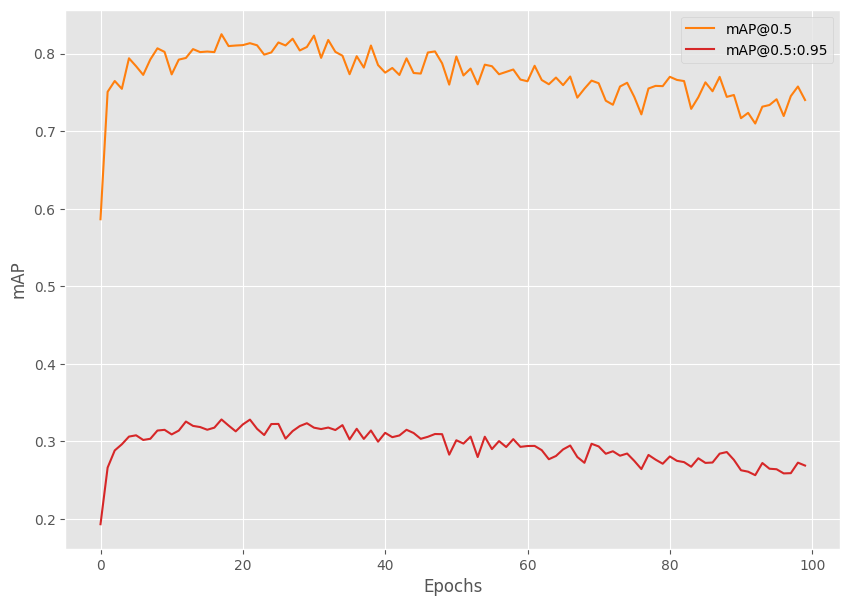

In [ ]:
from tqdm.auto import tqdm
from torchmetrics.detection.mean_ap import MeanAveragePrecision
from torch.optim.lr_scheduler import StepLR
import torch
import matplotlib.pyplot as plt
import time
import os

plt.style.use('ggplot')

seed = 42
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.cuda.manual_seed_all(seed)

# Function for running training iterations.
def train(train_data_loader, model):
    print('Training')
    model.train()

     # initialize tqdm progress bar
    prog_bar = tqdm(train_data_loader, total=len(train_data_loader))

    for i, data in enumerate(prog_bar):
        optimizer.zero_grad()
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]
        loss_dict = model(images, targets)

        losses = sum(loss for loss in loss_dict.values())
        loss_value = losses.item()

        train_loss_hist.send(loss_value)

        losses.backward()
        optimizer.step()

        # update the loss value beside the progress bar for each iteration
        prog_bar.set_description(desc=f"Loss: {loss_value:.4f}")
    return loss_value

# Function for running validation iterations.
def validate(valid_data_loader, model):
    print('Validating')
    model.eval()

    # Initialize tqdm progress bar.
    prog_bar = tqdm(valid_data_loader, total=len(valid_data_loader))
    target = []
    preds = []
    for i, data in enumerate(prog_bar):
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

        with torch.no_grad():
            outputs = model(images, targets)

        # For mAP calculation using Torchmetrics.
        #####################################
        for i in range(len(images)):
            true_dict = dict()
            preds_dict = dict()
            true_dict['boxes'] = targets[i]['boxes'].detach().cpu()
            true_dict['labels'] = targets[i]['labels'].detach().cpu()
            preds_dict['boxes'] = outputs[i]['boxes'].detach().cpu()
            preds_dict['scores'] = outputs[i]['scores'].detach().cpu()
            preds_dict['labels'] = outputs[i]['labels'].detach().cpu()
            preds.append(preds_dict)
            target.append(true_dict)
        #####################################

    metric.reset()
    metric.update(preds, target)
    metric_summary = metric.compute()
    return metric_summary

if __name__ == '__main__':
    os.makedirs('outputs', exist_ok=True)
    train_dataset = create_train_dataset(TRAIN_DIR)
    valid_dataset = create_valid_dataset(VALID_DIR)
    train_loader = create_train_loader(train_dataset, NUM_WORKERS)
    valid_loader = create_valid_loader(valid_dataset, NUM_WORKERS)
    print(f"Number of training samples: {len(train_dataset)}")
    print(f"Number of validation samples: {len(valid_dataset)}\n")

    # Initialize the model and move to the computation device.
    model = create_model(num_classes=NUM_CLASSES)
    model = model.to(DEVICE)
    # print(model)
    # Total parameters and trainable parameters.
    total_params = sum(p.numel() for p in model.parameters())
    print(f"{total_params:,} total parameters.")
    total_trainable_params = sum(
        p.numel() for p in model.parameters() if p.requires_grad)
    print(f"{total_trainable_params:,} training parameters.")
    params = [p for p in model.parameters() if p.requires_grad]
    optimizer = torch.optim.SGD(params, lr=0.001, momentum=0.9, weight_decay=0.0005, nesterov=True)
    scheduler = StepLR(
        optimizer=optimizer, step_size=15, gamma=0.1, verbose=True
    )

    # To monitor training loss
    train_loss_hist = Averager()
    # To store training loss and mAP values.
    train_loss_list = []
    map_50_list = []
    map_list = []

    # Mame to save the trained model with.
    MODEL_NAME = 'model'

    # Whether to show transformed images from data loader or not.
    # if VISUALIZE_TRANSFORMED_IMAGES:
    #     from custom_utils import show_tranformed_image
    #     show_tranformed_image(train_loader)

    # To save best model.
    save_best_model = SaveBestModel()

    metric = MeanAveragePrecision()

    # Training loop.
    for epoch in range(NUM_EPOCHS):
        print(f"\nEPOCH {epoch+1} of {NUM_EPOCHS}")

        # Reset the training loss histories for the current epoch.
        train_loss_hist.reset()

        # Start timer and carry out training and validation.
        start = time.time()
        train_loss = train(train_loader, model)
        metric_summary = validate(valid_loader, model)
        print(f"Epoch #{epoch+1} train loss: {train_loss_hist.value:.3f}")
        print(f"Epoch #{epoch+1} mAP: {metric_summary['map']}")
        end = time.time()
        print(f"Took {((end - start) / 60):.3f} minutes for epoch {epoch}")

        train_loss_list.append(train_loss)
        map_50_list.append(metric_summary['map_50'])
        map_list.append(metric_summary['map'])

        # save the best model till now.
        save_best_model(
            model, float(metric_summary['map_50']), epoch, 'outputs'
        )
        # Save the current epoch model.
        save_model(epoch, model, optimizer)

        # Save loss plot.
        save_loss_plot(OUT_DIR, train_loss_list)

        # Save mAP plot.
        save_mAP(OUT_DIR, map_50_list, map_list)
        # scheduler.step()

  0%|          | 0/500 [00:00<?, ?it/s]

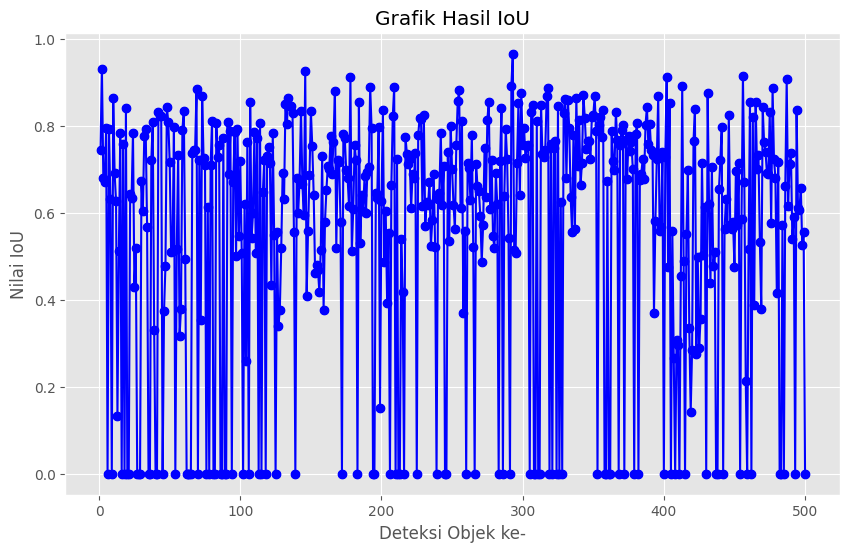

In [ ]:
import shutil
import torch
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
from torchvision.transforms.functional import to_pil_image
from torchvision.ops import box_iou

# Function to calculate Intersection over Union (IoU)
def calculate_iou(box1, box2):
    # Extract coordinates from the bounding box tensors
    box1 = [float(coord) for coord in box1]
    box2 = [float(coord) for coord in box2]

    # Calculate intersection area
    x1_int = max(box1[0], box2[0])
    y1_int = max(box1[1], box2[1])
    x2_int = min(box1[2], box2[2])
    y2_int = min(box1[3], box2[3])

    intersection = max(0, x2_int - x1_int) * max(0, y2_int - y1_int)

    # Calculate union area
    area1 = (box1[2] - box1[0]) * (box1[3] - box1[1])
    area2 = (box2[2] - box2[0]) * (box2[3] - box2[1])
    union = area1 + area2 - intersection

    # Calculate IoU
    iou = intersection / union if union > 0 else 0.0
    return iou

# source_path = "/content/drive/MyDrive/SKRIPSI/Hasil/Model_2/best_model.pth"
# destination_path = "/content/outputs/best_model.pth"

# shutil.copyfile(source_path, destination_path)

def show_iou_graph(images, true_boxes, pred_boxes, threshold=0.5, save_path="/content/iou_graph_model8.png"):
    all_ious = []

    for i in range(len(images)):
        true_boxes_i = true_boxes[i]
        pred_boxes_i = pred_boxes[i]

        ious = []  # To store IoU values for the current image

        for pred_box, score, label in zip(pred_boxes_i['boxes'], pred_boxes_i['scores'], pred_boxes_i['labels']):
            pred_box = [float(b) for b in pred_box]
            if score > threshold:
                # Find the corresponding true bounding box for the label
                true_box = true_boxes_i['boxes'][true_boxes_i['labels'] == label].cpu()
                if len(true_box) > 0:
                    true_box = [float(b) for b in true_box[0]]
                    iou = calculate_iou(pred_box, true_box)
                    ious.append(iou)

        # Store IoU values for the current image
        all_ious.append(ious)

    # Create IoU scatter plot
    plt.figure(figsize=(10, 6))
    plt.scatter(range(1, len(all_ious) + 1), [max(i, default=0) for i in all_ious], color='blue')
    plt.plot(range(1, len(all_ious) + 1), [max(i, default=0) for i in all_ious], linestyle='-', marker='o', color='blue')
    plt.title('Grafik Hasil IoU')
    plt.xlabel('Deteksi Objek ke-')
    plt.ylabel('Nilai IoU')
    plt.savefig(save_path)
    plt.show()

# Update the validate function to return images along with predictions
def validate(valid_data_loader, model):
    model.eval()

    # Initialize tqdm progress bar.
    prog_bar = tqdm(valid_data_loader, total=len(valid_data_loader))
    target = []
    preds = []
    images_list = []

    for i, data in enumerate(prog_bar):
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

        with torch.no_grad():
            outputs = model(images, targets)

        # For mAP calculation using Torchmetrics.
        for i in range(len(images)):
            true_dict = dict()
            preds_dict = dict()
            true_dict['boxes'] = targets[i]['boxes'].detach().cpu()
            true_dict['labels'] = targets[i]['labels'].detach().cpu()
            preds_dict['boxes'] = outputs[i]['boxes'].detach().cpu()
            preds_dict['scores'] = outputs[i]['scores'].detach().cpu()
            preds_dict['labels'] = outputs[i]['labels'].detach().cpu()
            preds.append(preds_dict)
            target.append(true_dict)
            images_list.append(images[i])

    return images_list, preds, target

if __name__ == '__main__':
    model = create_model(num_classes=NUM_CLASSES)
    checkpoint = torch.load('/content/outputs/best_model.pth', map_location=DEVICE)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.to(DEVICE).eval()

    test_dataset = create_test_dataset('/content/PneumoniaDataset_9010_5000/test')
    test_loader = create_test_loader(test_dataset, num_workers=NUM_WORKERS)

    # After calculating metrics, you can display the IoU graph
    images, pred_boxes, true_boxes = validate(test_loader, model)
    # class_names = ['_Background', 'Pneumonia']
    show_iou_graph(images, true_boxes, pred_boxes, save_path='/content/iou_graph_model8.png')

In [ ]:
def make_prediction(model, img, threshold):
    model.eval()
    preds = model(img)
    for id in range(len(preds)) :
        idx_list = []

        for idx, score in enumerate(preds[id]['scores']) :
            if score > threshold :
                idx_list.append(idx)

        preds[id]['boxes'] = preds[id]['boxes'][idx_list]
        preds[id]['labels'] = preds[id]['labels'][idx_list]
        preds[id]['scores'] = preds[id]['scores'][idx_list]

    return preds

def plot_image_from_output(img, annotation):

    img = img.cpu().permute(1,2,0)

    fig,ax = plt.subplots(1)
    ax.imshow(img)

    for idx in range(len(annotation["boxes"])):
        xmin, ymin, xmax, ymax = annotation["boxes"][idx]

        if annotation['labels'][idx] == 1 :
            rect = patches.Rectangle((xmin,ymin),(xmax-xmin),(ymax-ymin),linewidth=1,edgecolor='g',facecolor='none')
        else :
            rect = patches.Rectangle((xmin,ymin),(xmax-xmin),(ymax-ymin),linewidth=1,edgecolor='orange',facecolor='none')

        ax.add_patch(rect)

    plt.show()

In [ ]:
from tqdm import tqdm

labels = []
preds_adj_all = []
annot_all = []

for im, annot in tqdm(test_loader, position = 0, leave = True):
    im = list(img.to(DEVICE) for img in im)
    #annot = [{k: v.to(device) for k, v in t.items()} for t in annot]

    for t in annot:
        labels += t['labels']

    with torch.no_grad():
        preds_adj = make_prediction(model, im, 0.5)
        preds_adj = [{k: v.to(torch.device('cpu')) for k, v in t.items()} for t in preds_adj]
        preds_adj_all.append(preds_adj)
        annot_all.append(annot)


100%|██████████| 500/500 [00:16<00:00, 30.34it/s]


In [ ]:
!git clone https://github.com/Pseudo-Lab/Tutorial-Book-Utils
!python Tutorial-Book-Utils/PL_data_loader.py --data FaceMaskDetection
%cd Tutorial-Book-Utils/
import utils_ObjectDetection as utils

Cloning into 'Tutorial-Book-Utils'...
remote: Enumerating objects: 45, done.
remote: Counting objects: 100% (45/45), done.
remote: Compressing objects: 100% (39/39), done.
remote: Total 45 (delta 18), reused 17 (delta 5), pack-reused 0
Receiving objects: 100% (45/45), 11.62 KiB | 5.81 MiB/s, done.
Resolving deltas: 100% (18/18), done.
Downloading...
From (original): https://drive.google.com/uc?id=16Gzn1w38yZLJpzmzKcRIRveFeHZtCEr7
From (redirected): https://drive.google.com/uc?id=16Gzn1w38yZLJpzmzKcRIRveFeHZtCEr7&confirm=t&uuid=62609736-cbf2-404b-adf4-d0fe3ea5b1f8
To: /content/Face Mask Detection.zip
100% 417M/417M [00:08<00:00, 49.5MB/s]
Face Mask Detection.zip download complete!
/content/Tutorial-Book-Utils


In [ ]:
sample_metrics = []
for batch_i in range(len(preds_adj_all)):
    sample_metrics += utils.get_batch_statistics(preds_adj_all[batch_i], annot_all[batch_i], iou_threshold=0.5)

true_positives, pred_scores, pred_labels = [torch.cat(x, 0) for x in list(zip(*sample_metrics))]  # batch semua disatukan
precision, recall, AP, f1, ap_class = utils.ap_per_class(true_positives, pred_scores, pred_labels, torch.tensor(labels))
mAP = torch.mean(AP)
print(f'mAP : {mAP}')
print(f'AP : {AP}')

mAP : 0.6542423672061151
AP : tensor([0.6542], dtype=torch.float64)


In [ ]:
sample_metrics = []
for batch_i in range(len(preds_adj_all)):
    sample_metrics += utils.get_batch_statistics(preds_adj_all[batch_i], annot_all[batch_i], iou_threshold=0.4)

true_positives, pred_scores, pred_labels = [torch.cat(x, 0) for x in list(zip(*sample_metrics))]  # batch semua disatukan
precision, recall, AP, f1, ap_class = utils.ap_per_class(true_positives, pred_scores, pred_labels, torch.tensor(labels))
mAP = torch.mean(AP)
print(f'mAP : {mAP}')
print(f'AP : {AP}')

mAP : 0.7150604305338386
AP : tensor([0.7151], dtype=torch.float64)


In [ ]:
sample_metrics = []
for batch_i in range(len(preds_adj_all)):
    sample_metrics += utils.get_batch_statistics(preds_adj_all[batch_i], annot_all[batch_i], iou_threshold=0.3)

true_positives, pred_scores, pred_labels = [torch.cat(x, 0) for x in list(zip(*sample_metrics))]  # batch semua disatukan
precision, recall, AP, f1, ap_class = utils.ap_per_class(true_positives, pred_scores, pred_labels, torch.tensor(labels))
mAP = torch.mean(AP)
print(f'mAP : {mAP}')
print(f'AP : {AP}')

mAP : 0.7623933327386831
AP : tensor([0.7624], dtype=torch.float64)


# Model 12 | BATCH : 4 | LR : 0.001 | 90:20 - 3000 DATASET

In [ ]:
import zipfile
import os

zip_file_path = '/content/drive/MyDrive/SKRIPSI/Dataset/PneumoniaDataset_9010_3000.zip'  # Ganti dengan path ke file ZIP Anda
unzip_dir = '/content'  # Ganti dengan direktori di mana Anda ingin mengekstrak file

def extract_zip(zip_file, extract_dir):
    with zipfile.ZipFile(zip_file, 'r') as zip_ref:
        zip_ref.extractall(extract_dir)

def list_files(directory):
    return os.listdir(directory)

# Ekstrak file ZIP
extract_zip(zip_file_path, unzip_dir)

# Tampilkan daftar file yang diekstrak
extracted_files = list_files(unzip_dir)
print(extracted_files)

['.config', '__MACOSX', 'drive', 'PneumoniaDataset_9010_3000', 'sample_data']


In [ ]:
import torch
import os


DEVICE = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

BATCH_SIZE = 4 # Increase / decrease according to GPU memeory.
RESIZE_TO = 300 # Resize the image for training and transforms.
NUM_EPOCHS = 100 # Number of epochs to train for.
NUM_WORKERS = 2 # Number of parallel workers for data loading.

CLASSES = [
    '_background','Lung Opacity'
    # 'helmet','head','person'
]



TRAIN_DIR = '/content/PneumoniaDataset_9010_3000/train'
VALID_DIR = '/content/PneumoniaDataset_9010_3000/test'

# Classes: 0 index is reserved for background.


NUM_CLASSES = len(CLASSES)

# Whether to visualize images after crearing the data loaders.
VISUALIZE_TRANSFORMED_IMAGES = False

# Location to save model and plots.
OUT_DIR = 'outputs'
os.makedirs(OUT_DIR, exist_ok=True)

In [ ]:
import albumentations as A
import cv2
import numpy as np
import torch
import matplotlib.pyplot as plt

from albumentations.pytorch import ToTensorV2


plt.style.use('ggplot')

# This class keeps track of the training and validation loss values
# and helps to get the average for each epoch as well.
class Averager:
    def __init__(self):
        self.current_total = 0.0
        self.iterations = 0.0

    def send(self, value):
        self.current_total += value
        self.iterations += 1

    @property
    def value(self):
        if self.iterations == 0:
            return 0
        else:
            return 1.0 * self.current_total / self.iterations

    def reset(self):
        self.current_total = 0.0
        self.iterations = 0.0

class SaveBestModel:
    """
    Class to save the best model while training. If the current epoch's
    validation mAP @0.5:0.95 IoU higher than the previous highest, then save the
    model state.
    """
    def __init__(
        self, best_valid_map=float(0)
    ):
        self.best_valid_map = best_valid_map

    def __call__(
        self,
        model,
        current_valid_map,
        epoch,
        OUT_DIR,
    ):
        if current_valid_map > self.best_valid_map:
            self.best_valid_map = current_valid_map
            print(f"\nBEST VALIDATION mAP: {self.best_valid_map}")
            print(f"\nSAVING BEST MODEL FOR EPOCH: {epoch+1}\n")
            torch.save({
                'epoch': epoch+1,
                'model_state_dict': model.state_dict(),
                }, f"{OUT_DIR}/best_model.pth")

def collate_fn(batch):
    """
    To handle the data loading as different images may have different number
    of objects and to handle varying size tensors as well.
    """
    return tuple(zip(*batch))

# Define the training tranforms.
def get_train_transform():
    return A.Compose([
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.Rotate(limit=6),
        A.Blur(blur_limit=3, p=0.1),
        A.MotionBlur(blur_limit=3, p=0.1),
        A.MedianBlur(blur_limit=3, p=0.1),
        A.RandomBrightnessContrast(p=0.2),
        ToTensorV2(p=1.0),
    ], bbox_params={
        'format': 'pascal_voc',
        'label_fields': ['labels']
    })


# Define the validation transforms.
def get_valid_transform():
    return A.Compose([
        ToTensorV2(p=1.0),
    ], bbox_params={
        'format': 'pascal_voc',
        'label_fields': ['labels']
    })


def show_tranformed_image(train_loader):
    """
    This function shows the transformed images from the `train_loader`.
    Helps to check whether the tranformed images along with the corresponding
    labels are correct or not.
    Only runs if `VISUALIZE_TRANSFORMED_IMAGES = True` in config.py.
    """
    if len(train_loader) > 0:
        for i in range(1):
            images, targets = next(iter(train_loader))
            images = list(image.to(DEVICE) for image in images)
            targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]
            boxes = targets[i]['boxes'].cpu().numpy().astype(np.int32)
            labels = targets[i]['labels'].cpu().numpy().astype(np.int32)
            sample = images[i].permute(1, 2, 0).cpu().numpy()
            sample = cv2.cvtColor(sample, cv2.COLOR_RGB2BGR)
            for box_num, box in enumerate(boxes):
                cv2.rectangle(sample,
                            (box[0], box[1]),
                            (box[2], box[3]),
                            (0, 0, 255), 2)
                cv2.putText(sample, CLASSES[labels[box_num]],
                            (box[0], box[1]-10), cv2.FONT_HERSHEY_SIMPLEX,
                            1.0, (0, 0, 255), 2)
            cv2.imshow('Transformed image', sample)
            cv2.waitKey(0)
            cv2.destroyAllWindows()

def save_model(epoch, model, optimizer):
    """
    Function to save the trained model till current epoch, or whenver called
    """
    torch.save({
                'epoch': epoch+1,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                }, 'outputs/last_model.pth')

def save_loss_plot(
    OUT_DIR,
    train_loss_list,
    x_label='iterations',
    y_label='train loss',
    save_name='train_loss'
):
    """
    Function to save both train loss graph.

    :param OUT_DIR: Path to save the graphs.
    :param train_loss_list: List containing the training loss values.
    """
    figure_1 = plt.figure(figsize=(10, 7), num=1, clear=True)
    train_ax = figure_1.add_subplot()
    train_ax.plot(train_loss_list, color='tab:blue')
    train_ax.set_xlabel(x_label)
    train_ax.set_ylabel(y_label)
    figure_1.savefig(f"{OUT_DIR}/{save_name}.png")
    print('SAVING PLOTS COMPLETE...')

def save_mAP(OUT_DIR, map_05, map):
    """
    Saves the mAP@0.5 and mAP@0.5:0.95 per epoch.
    :param OUT_DIR: Path to save the graphs.
    :param map_05: List containing mAP values at 0.5 IoU.
    :param map: List containing mAP values at 0.5:0.95 IoU.
    """
    figure = plt.figure(figsize=(10, 7), num=1, clear=True)
    ax = figure.add_subplot()
    ax.plot(
        map_05, color='tab:orange', linestyle='-',
        label='mAP@0.5'
    )
    ax.plot(
        map, color='tab:red', linestyle='-',
        label='mAP@0.5:0.95'
    )
    ax.set_xlabel('Epochs')
    ax.set_ylabel('mAP')
    ax.legend()
    figure.savefig(f"{OUT_DIR}/map.png")

In [ ]:
import torch
import cv2
import numpy as np
import os
import glob as glob
from google.colab.patches import cv2_imshow
from xml.etree import ElementTree as et
from torch.utils.data import Dataset, DataLoader

# The dataset class.
class PneumoniaDataset(Dataset):
    def __init__(self, dir_path, width, height, classes, transforms=None):
        self.transforms = transforms
        self.dir_path = dir_path
        self.height = height
        self.width = width
        self.classes = classes
        self.image_file_types = ['*.jpg', '*.jpeg', '*.png', '*.ppm', '*.JPG']
        self.all_image_paths = []

        # Get all the image paths in sorted order.
        for file_type in self.image_file_types:
            self.all_image_paths.extend(glob.glob(os.path.join(self.dir_path, file_type)))
        self.all_images = [image_path.split(os.path.sep)[-1] for image_path in self.all_image_paths]
        self.all_images = sorted(self.all_images)

    def __getitem__(self, idx):
        # Capture the image name and the full image path.
        image_name = self.all_images[idx]
        image_path = os.path.join(self.dir_path, image_name)

        # Read and preprocess the image.
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
        image_resized = cv2.resize(image, (self.width, self.height))
        image_resized /= 255.0

        # Capture the corresponding XML file for getting the annotations.
        annot_filename = os.path.splitext(image_name)[0] + '.xml'
        annot_file_path = os.path.join(self.dir_path, annot_filename)

        boxes = []
        labels = []
        tree = et.parse(annot_file_path)
        root = tree.getroot()

        # Original image width and height.
        image_width = image.shape[1]
        image_height = image.shape[0]

        # Box coordinates for xml files are extracted
        # and corrected for image size given.
        for member in root.findall('object'):
            # Get label and map the `classes`.
            labels.append(self.classes.index(member.find('name').text))

            # Left corner x-coordinates.
            xmin = int(member.find('bndbox').find('xmin').text)
            # Right corner x-coordinates.
            xmax = int(member.find('bndbox').find('xmax').text)
            # Left corner y-coordinates.
            ymin = int(member.find('bndbox').find('ymin').text)
            # Right corner y-coordinates.
            ymax = int(member.find('bndbox').find('ymax').text)

            # Resize the bounding boxes according
            # to resized image `width`, `height`.
            xmin_final = (xmin/image_width)*self.width
            xmax_final = (xmax/image_width)*self.width
            ymin_final = (ymin/image_height)*self.height
            ymax_final = (ymax/image_height)*self.height

            # Check that max coordinates are at least one pixel
            # larger than min coordinates.
            if xmax_final == xmin_final:
                xmax_final += 1
            if ymax_final == ymin_final:
                ymax_final += 1
            # Check that all coordinates are within the image.
            if xmax_final > self.width:
                xmax_final = self.width
            if ymax_final > self.height:
                ymax_final = self.height

            boxes.append([xmin_final, ymin_final, xmax_final, ymax_final])

        # Bounding box to tensor.
        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        # Area of the bounding boxes.
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0]) if len(boxes) > 0 \
            else torch.as_tensor(boxes, dtype=torch.float32)
        # No crowd instances.
        iscrowd = torch.zeros((boxes.shape[0],), dtype=torch.int64)
        # Labels to tensor.
        labels = torch.as_tensor(labels, dtype=torch.int64)

        # Prepare the final `target` dictionary.
        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["area"] = area
        target["iscrowd"] = iscrowd
        image_id = torch.tensor([idx])
        target["image_id"] = image_id

        # Apply the image transforms.
        if self.transforms:
            sample = self.transforms(image = image_resized,
                                     bboxes = target['boxes'],
                                     labels = labels)
            image_resized = sample['image']
            target['boxes'] = torch.Tensor(sample['bboxes'])

        if np.isnan((target['boxes']).numpy()).any() or target['boxes'].shape == torch.Size([0]):
            target['boxes'] = torch.zeros((0, 4), dtype=torch.int64)
        return image_resized, target

    def __len__(self):
        return len(self.all_images)
        # return 500;

# Prepare the final datasets and data loaders.
def create_train_dataset(DIR):
    train_dataset = PneumoniaDataset(
        DIR, RESIZE_TO, RESIZE_TO, CLASSES, get_train_transform()
    )
    return train_dataset
def create_valid_dataset(DIR):
    valid_dataset = PneumoniaDataset(
        DIR, RESIZE_TO, RESIZE_TO, CLASSES, get_valid_transform()
    )
    return valid_dataset
def create_test_dataset(DIR):
    test_dataset = PneumoniaDataset(
        DIR, RESIZE_TO, RESIZE_TO, CLASSES, get_valid_transform()
    )
    return test_dataset
def create_train_loader(train_dataset, num_workers=0):
    train_loader = DataLoader(
        train_dataset,
        batch_size=BATCH_SIZE,
        shuffle=True,
        num_workers=num_workers,
        collate_fn=collate_fn,
        drop_last=True
    )
    return train_loader
def create_valid_loader(valid_dataset, num_workers=0):
    valid_loader = DataLoader(
        valid_dataset,
        batch_size=BATCH_SIZE,
        shuffle=False,
        num_workers=num_workers,
        collate_fn=collate_fn,
        drop_last=True
    )
    return valid_loader
def create_test_loader(test_dataset, num_workers=0):
    test_loader = DataLoader(
        test_dataset,
        batch_size=1,
        shuffle=False,
        num_workers=num_workers,
        collate_fn=collate_fn,
        drop_last=True
    )
    return test_loader


In [ ]:
import torchvision
import torch

from functools import partial
from torchvision.models.detection import RetinaNet
from torchvision.models.detection.backbone_utils import resnet_fpn_backbone
from torchvision.models.detection.retinanet import RetinaNetClassificationHead
from torchvision.models.detection import RetinaNet_ResNet50_FPN_V2_Weights
from torchvision.models.detection.retinanet import RetinaNetClassificationHead

def create_model(num_classes):
    model = torchvision.models.detection.retinanet_resnet50_fpn_v2(
        weights=RetinaNet_ResNet50_FPN_V2_Weights.COCO_V1
    )
    num_anchors = model.head.classification_head.num_anchors

    model.head.classification_head = RetinaNetClassificationHead(
        in_channels=256,
        num_anchors=num_anchors,
        num_classes=num_classes,
        norm_layer=partial(torch.nn.GroupNorm, 32)
    )
    return model

if __name__ == '__main__':
    model = create_model(2)
    # print(model)
    # Total parameters and trainable parameters.
    total_params = sum(p.numel() for p in model.parameters())
    print(f"{total_params:,} total parameters.")
    total_trainable_params = sum(
        p.numel() for p in model.parameters() if p.requires_grad)
    print(f"{total_trainable_params:,} training parameters.")

Downloading: "https://download.pytorch.org/models/retinanet_resnet50_fpn_v2_coco-5905b1c5.pth" to /root/.cache/torch/hub/checkpoints/retinanet_resnet50_fpn_v2_coco-5905b1c5.pth
100%|██████████| 146M/146M [00:02<00:00, 73.3MB/s]


36,352,630 total parameters.
36,127,286 training parameters.


In [ ]:
!pip install torchmetrics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 840.4/840.4 kB 15.7 MB/s eta 0:00:00


Number of training samples: 2700
Number of validation samples: 300

36,352,630 total parameters.
36,127,286 training parameters.
Adjusting learning rate of group 0 to 1.0000e-03.

EPOCH 1 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torchmetrics/utilities/prints.py:43: UserWarning: Encountered more than 100 detections in a single image. This means that certain detections with the lowest scores will be ignored, that may have an undesirable impact on performance. Please consider adjusting the `max_detection_threshold` to suit your use case. To disable this warning, set attribute class `warn_on_many_detections=False`, after initializing the metric.
  warnings.warn(*args, **kwargs)  # noqa: B028


Epoch #1 train loss: 0.829
Epoch #1 mAP: 0.16428904235363007
Took 1.633 minutes for epoch 0

BEST VALIDATION mAP: 0.5251370668411255

SAVING BEST MODEL FOR EPOCH: 1

SAVING PLOTS COMPLETE...

EPOCH 2 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #2 train loss: 0.729
Epoch #2 mAP: 0.2620319724082947
Took 1.729 minutes for epoch 1

BEST VALIDATION mAP: 0.7138376235961914

SAVING BEST MODEL FOR EPOCH: 2

SAVING PLOTS COMPLETE...

EPOCH 3 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #3 train loss: 0.693
Epoch #3 mAP: 0.28575772047042847
Took 1.566 minutes for epoch 2

BEST VALIDATION mAP: 0.7576814889907837

SAVING BEST MODEL FOR EPOCH: 3

SAVING PLOTS COMPLETE...

EPOCH 4 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #4 train loss: 0.671
Epoch #4 mAP: 0.30899715423583984
Took 1.555 minutes for epoch 3

BEST VALIDATION mAP: 0.8014139533042908

SAVING BEST MODEL FOR EPOCH: 4

SAVING PLOTS COMPLETE...

EPOCH 5 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #5 train loss: 0.654
Epoch #5 mAP: 0.2897949516773224
Took 1.553 minutes for epoch 4
SAVING PLOTS COMPLETE...

EPOCH 6 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #6 train loss: 0.642
Epoch #6 mAP: 0.3161170482635498
Took 1.890 minutes for epoch 5
SAVING PLOTS COMPLETE...

EPOCH 7 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #7 train loss: 0.636
Epoch #7 mAP: 0.31942638754844666
Took 1.548 minutes for epoch 6

BEST VALIDATION mAP: 0.801784336566925

SAVING BEST MODEL FOR EPOCH: 7

SAVING PLOTS COMPLETE...

EPOCH 8 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #8 train loss: 0.628
Epoch #8 mAP: 0.32336148619651794
Took 1.551 minutes for epoch 7

BEST VALIDATION mAP: 0.8110160827636719

SAVING BEST MODEL FOR EPOCH: 8

SAVING PLOTS COMPLETE...

EPOCH 9 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #9 train loss: 0.622
Epoch #9 mAP: 0.32858648896217346
Took 1.547 minutes for epoch 8

BEST VALIDATION mAP: 0.834191083908081

SAVING BEST MODEL FOR EPOCH: 9

SAVING PLOTS COMPLETE...

EPOCH 10 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #10 train loss: 0.615
Epoch #10 mAP: 0.33356666564941406
Took 1.553 minutes for epoch 9

BEST VALIDATION mAP: 0.8376657366752625

SAVING BEST MODEL FOR EPOCH: 10

SAVING PLOTS COMPLETE...

EPOCH 11 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #11 train loss: 0.610
Epoch #11 mAP: 0.3181445598602295
Took 1.887 minutes for epoch 10
SAVING PLOTS COMPLETE...

EPOCH 12 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #12 train loss: 0.608
Epoch #12 mAP: 0.33589938282966614
Took 1.543 minutes for epoch 11
SAVING PLOTS COMPLETE...

EPOCH 13 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #13 train loss: 0.601
Epoch #13 mAP: 0.33203190565109253
Took 1.545 minutes for epoch 12
SAVING PLOTS COMPLETE...

EPOCH 14 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #14 train loss: 0.597
Epoch #14 mAP: 0.3378385901451111
Took 1.553 minutes for epoch 13

BEST VALIDATION mAP: 0.8510962128639221

SAVING BEST MODEL FOR EPOCH: 14

SAVING PLOTS COMPLETE...

EPOCH 15 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #15 train loss: 0.593
Epoch #15 mAP: 0.3319975733757019
Took 1.549 minutes for epoch 14
SAVING PLOTS COMPLETE...

EPOCH 16 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #16 train loss: 0.587
Epoch #16 mAP: 0.33666297793388367
Took 1.546 minutes for epoch 15
SAVING PLOTS COMPLETE...

EPOCH 17 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #17 train loss: 0.586
Epoch #17 mAP: 0.3393028676509857
Took 1.550 minutes for epoch 16
SAVING PLOTS COMPLETE...

EPOCH 18 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #18 train loss: 0.582
Epoch #18 mAP: 0.33261802792549133
Took 2.056 minutes for epoch 17
SAVING PLOTS COMPLETE...

EPOCH 19 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7dcc7c204160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
Exception ignored in:     <function _MultiProcessingDataLoaderIter.__del__ at 0x7dcc7c204160>assert self._parent_pid == os.getpid(), 'can only test a child process'
Traceback (most recent call last):

  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
AssertionError:     can only test a child processself._shutdown_workers()

  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #19 train loss: 0.577
Epoch #19 mAP: 0.33335503935813904
Took 1.381 minutes for epoch 18
SAVING PLOTS COMPLETE...

EPOCH 20 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #20 train loss: 0.577
Epoch #20 mAP: 0.3324679434299469
Took 1.551 minutes for epoch 19
SAVING PLOTS COMPLETE...

EPOCH 21 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #21 train loss: 0.572
Epoch #21 mAP: 0.3420158624649048
Took 2.058 minutes for epoch 20
SAVING PLOTS COMPLETE...

EPOCH 22 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Exception ignored in: Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7dcc7c204160><function _MultiProcessingDataLoaderIter.__del__ at 0x7dcc7c204160>

Traceback (most recent call last):
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
        self._shutdown_workers()self._shutdown_workers()

  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
        if w.is_alive():if w.is_alive():

  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
        assert self._parent_pid == os.getpid(), 'can only te

Epoch #22 train loss: 0.568
Epoch #22 mAP: 0.3449985086917877
Took 1.547 minutes for epoch 21
SAVING PLOTS COMPLETE...

EPOCH 23 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #23 train loss: 0.565
Epoch #23 mAP: 0.33252590894699097
Took 1.550 minutes for epoch 22
SAVING PLOTS COMPLETE...

EPOCH 24 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #24 train loss: 0.564
Epoch #24 mAP: 0.33677589893341064
Took 1.543 minutes for epoch 23
SAVING PLOTS COMPLETE...

EPOCH 25 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7dcc7c204160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7dcc7c204160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #25 train loss: 0.558
Epoch #25 mAP: 0.3420546054840088
Took 2.053 minutes for epoch 24
SAVING PLOTS COMPLETE...

EPOCH 26 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #26 train loss: 0.555
Epoch #26 mAP: 0.3392026722431183
Took 1.381 minutes for epoch 25
SAVING PLOTS COMPLETE...

EPOCH 27 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #27 train loss: 0.555
Epoch #27 mAP: 0.33386754989624023
Took 1.553 minutes for epoch 26

BEST VALIDATION mAP: 0.8528867959976196

SAVING BEST MODEL FOR EPOCH: 27

SAVING PLOTS COMPLETE...

EPOCH 28 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #28 train loss: 0.551
Epoch #28 mAP: 0.3432066738605499
Took 1.554 minutes for epoch 27
SAVING PLOTS COMPLETE...

EPOCH 29 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #29 train loss: 0.546
Epoch #29 mAP: 0.3305753767490387
Took 1.559 minutes for epoch 28
SAVING PLOTS COMPLETE...

EPOCH 30 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #30 train loss: 0.543
Epoch #30 mAP: 0.33019426465034485
Took 1.388 minutes for epoch 29
SAVING PLOTS COMPLETE...

EPOCH 31 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #31 train loss: 0.542
Epoch #31 mAP: 0.332132488489151
Took 1.556 minutes for epoch 30
SAVING PLOTS COMPLETE...

EPOCH 32 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7dcc7c204160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7dcc7c204160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7dcc7c204160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
Exception ignored in:     assert self._parent_pid == os.getpid(), 'can only test a child process'<function _MultiProcessingDataLoaderIter.__del__ at 0x7dcc7c204160>

AssertionErrorTraceback (most recent call last):
:   File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
can only test a child process
    self._shutdown_workers()
Exception ignored in:   File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
<function _Multi

Epoch #32 train loss: 0.538
Epoch #32 mAP: 0.34385398030281067
Took 1.401 minutes for epoch 31
SAVING PLOTS COMPLETE...

EPOCH 33 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #33 train loss: 0.539
Epoch #33 mAP: 0.34186074137687683
Took 1.551 minutes for epoch 32
SAVING PLOTS COMPLETE...

EPOCH 34 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #34 train loss: 0.531
Epoch #34 mAP: 0.33975666761398315
Took 1.388 minutes for epoch 33
SAVING PLOTS COMPLETE...

EPOCH 35 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #35 train loss: 0.531
Epoch #35 mAP: 0.34006476402282715
Took 1.542 minutes for epoch 34
SAVING PLOTS COMPLETE...

EPOCH 36 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7dcc7c204160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7dcc7c204160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #36 train loss: 0.525
Epoch #36 mAP: 0.33221831917762756
Took 2.217 minutes for epoch 35
SAVING PLOTS COMPLETE...

EPOCH 37 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #37 train loss: 0.526
Epoch #37 mAP: 0.33682239055633545
Took 1.543 minutes for epoch 36
SAVING PLOTS COMPLETE...

EPOCH 38 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #38 train loss: 0.520
Epoch #38 mAP: 0.32545575499534607
Took 1.544 minutes for epoch 37
SAVING PLOTS COMPLETE...

EPOCH 39 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #39 train loss: 0.521
Epoch #39 mAP: 0.3359644412994385
Took 2.049 minutes for epoch 38
SAVING PLOTS COMPLETE...

EPOCH 40 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #40 train loss: 0.515
Epoch #40 mAP: 0.32830825448036194
Took 1.541 minutes for epoch 39
SAVING PLOTS COMPLETE...

EPOCH 41 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #41 train loss: 0.513
Epoch #41 mAP: 0.33582934737205505
Took 1.544 minutes for epoch 40
SAVING PLOTS COMPLETE...

EPOCH 42 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #42 train loss: 0.509
Epoch #42 mAP: 0.3361724615097046
Took 1.373 minutes for epoch 41
SAVING PLOTS COMPLETE...

EPOCH 43 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #43 train loss: 0.508
Epoch #43 mAP: 0.32943668961524963
Took 1.542 minutes for epoch 42
SAVING PLOTS COMPLETE...

EPOCH 44 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #44 train loss: 0.503
Epoch #44 mAP: 0.3277459442615509
Took 2.548 minutes for epoch 43
SAVING PLOTS COMPLETE...

EPOCH 45 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #45 train loss: 0.502
Epoch #45 mAP: 0.33420446515083313
Took 1.544 minutes for epoch 44
SAVING PLOTS COMPLETE...

EPOCH 46 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7dcc7c204160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7dcc7c204160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #46 train loss: 0.496
Epoch #46 mAP: 0.32835909724235535
Took 1.543 minutes for epoch 45
SAVING PLOTS COMPLETE...

EPOCH 47 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #47 train loss: 0.495
Epoch #47 mAP: 0.3297259211540222
Took 1.542 minutes for epoch 46
SAVING PLOTS COMPLETE...

EPOCH 48 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #48 train loss: 0.489
Epoch #48 mAP: 0.320026159286499
Took 2.215 minutes for epoch 47
SAVING PLOTS COMPLETE...

EPOCH 49 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #49 train loss: 0.488
Epoch #49 mAP: 0.3284897208213806
Took 1.543 minutes for epoch 48
SAVING PLOTS COMPLETE...

EPOCH 50 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7dcc7c204160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7dcc7c204160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #50 train loss: 0.488
Epoch #50 mAP: 0.31585389375686646
Took 1.377 minutes for epoch 49
SAVING PLOTS COMPLETE...

EPOCH 51 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #51 train loss: 0.484
Epoch #51 mAP: 0.329405277967453
Took 1.540 minutes for epoch 50
SAVING PLOTS COMPLETE...

EPOCH 52 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #52 train loss: 0.477
Epoch #52 mAP: 0.30161717534065247
Took 1.541 minutes for epoch 51
SAVING PLOTS COMPLETE...

EPOCH 53 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #53 train loss: 0.475
Epoch #53 mAP: 0.3189466893672943
Took 2.380 minutes for epoch 52
SAVING PLOTS COMPLETE...

EPOCH 54 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #54 train loss: 0.472
Epoch #54 mAP: 0.31922101974487305
Took 1.540 minutes for epoch 53
SAVING PLOTS COMPLETE...

EPOCH 55 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #55 train loss: 0.469
Epoch #55 mAP: 0.31581050157546997
Took 1.543 minutes for epoch 54
SAVING PLOTS COMPLETE...

EPOCH 56 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #56 train loss: 0.465
Epoch #56 mAP: 0.32142481207847595
Took 1.539 minutes for epoch 55
SAVING PLOTS COMPLETE...

EPOCH 57 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #57 train loss: 0.461
Epoch #57 mAP: 0.31726834177970886
Took 1.539 minutes for epoch 56
SAVING PLOTS COMPLETE...

EPOCH 58 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #58 train loss: 0.459
Epoch #58 mAP: 0.3140681982040405
Took 2.376 minutes for epoch 57
SAVING PLOTS COMPLETE...

EPOCH 59 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #59 train loss: 0.455
Epoch #59 mAP: 0.3207186460494995
Took 1.372 minutes for epoch 58
SAVING PLOTS COMPLETE...

EPOCH 60 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #60 train loss: 0.451
Epoch #60 mAP: 0.3210826814174652
Took 1.537 minutes for epoch 59
SAVING PLOTS COMPLETE...

EPOCH 61 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #61 train loss: 0.450
Epoch #61 mAP: 0.32075953483581543
Took 1.541 minutes for epoch 60
SAVING PLOTS COMPLETE...

EPOCH 62 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #62 train loss: 0.445
Epoch #62 mAP: 0.30531468987464905
Took 1.540 minutes for epoch 61
SAVING PLOTS COMPLETE...

EPOCH 63 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #63 train loss: 0.441
Epoch #63 mAP: 0.320142537355423
Took 1.542 minutes for epoch 62
SAVING PLOTS COMPLETE...

EPOCH 64 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #64 train loss: 0.435
Epoch #64 mAP: 0.3073131740093231
Took 1.543 minutes for epoch 63
SAVING PLOTS COMPLETE...

EPOCH 65 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #65 train loss: 0.435
Epoch #65 mAP: 0.31554776430130005
Took 1.539 minutes for epoch 64
SAVING PLOTS COMPLETE...

EPOCH 66 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #66 train loss: 0.433
Epoch #66 mAP: 0.29587438702583313
Took 1.566 minutes for epoch 65
SAVING PLOTS COMPLETE...

EPOCH 67 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #67 train loss: 0.429
Epoch #67 mAP: 0.3096869885921478
Took 2.212 minutes for epoch 66
SAVING PLOTS COMPLETE...

EPOCH 68 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #68 train loss: 0.431
Epoch #68 mAP: 0.3109237551689148
Took 1.539 minutes for epoch 67
SAVING PLOTS COMPLETE...

EPOCH 69 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #69 train loss: 0.426
Epoch #69 mAP: 0.2896638810634613
Took 1.541 minutes for epoch 68
SAVING PLOTS COMPLETE...

EPOCH 70 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #70 train loss: 0.420
Epoch #70 mAP: 0.31119829416275024
Took 1.541 minutes for epoch 69
SAVING PLOTS COMPLETE...

EPOCH 71 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #71 train loss: 0.417
Epoch #71 mAP: 0.28703346848487854
Took 1.539 minutes for epoch 70
SAVING PLOTS COMPLETE...

EPOCH 72 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #72 train loss: 0.411
Epoch #72 mAP: 0.29429349303245544
Took 2.376 minutes for epoch 71
SAVING PLOTS COMPLETE...

EPOCH 73 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #73 train loss: 0.410
Epoch #73 mAP: 0.29029738903045654
Took 1.372 minutes for epoch 72
SAVING PLOTS COMPLETE...

EPOCH 74 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #74 train loss: 0.411
Epoch #74 mAP: 0.29790475964546204
Took 1.539 minutes for epoch 73
SAVING PLOTS COMPLETE...

EPOCH 75 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #75 train loss: 0.404
Epoch #75 mAP: 0.30773356556892395
Took 1.546 minutes for epoch 74
SAVING PLOTS COMPLETE...

EPOCH 76 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #76 train loss: 0.398
Epoch #76 mAP: 0.3016664981842041
Took 1.548 minutes for epoch 75
SAVING PLOTS COMPLETE...

EPOCH 77 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #77 train loss: 0.400
Epoch #77 mAP: 0.3126814365386963
Took 2.551 minutes for epoch 76
SAVING PLOTS COMPLETE...

EPOCH 78 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #78 train loss: 0.395
Epoch #78 mAP: 0.29568734765052795
Took 1.540 minutes for epoch 77
SAVING PLOTS COMPLETE...

EPOCH 79 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #79 train loss: 0.393
Epoch #79 mAP: 0.3091925084590912
Took 1.540 minutes for epoch 78
SAVING PLOTS COMPLETE...

EPOCH 80 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #80 train loss: 0.391
Epoch #80 mAP: 0.30645090341567993
Took 1.541 minutes for epoch 79
SAVING PLOTS COMPLETE...

EPOCH 81 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #81 train loss: 0.387
Epoch #81 mAP: 0.2902070879936218
Took 1.372 minutes for epoch 80
SAVING PLOTS COMPLETE...

EPOCH 82 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #82 train loss: 0.385
Epoch #82 mAP: 0.2889513671398163
Took 2.545 minutes for epoch 81
SAVING PLOTS COMPLETE...

EPOCH 83 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #83 train loss: 0.381
Epoch #83 mAP: 0.2881188988685608
Took 1.541 minutes for epoch 82
SAVING PLOTS COMPLETE...

EPOCH 84 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #84 train loss: 0.380
Epoch #84 mAP: 0.2900353968143463
Took 1.545 minutes for epoch 83
SAVING PLOTS COMPLETE...

EPOCH 85 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #85 train loss: 0.376
Epoch #85 mAP: 0.28498443961143494
Took 1.542 minutes for epoch 84
SAVING PLOTS COMPLETE...

EPOCH 86 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7dcc7c204160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7dcc7c204160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #86 train loss: 0.373
Epoch #86 mAP: 0.29043906927108765
Took 1.547 minutes for epoch 85
SAVING PLOTS COMPLETE...

EPOCH 87 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #87 train loss: 0.369
Epoch #87 mAP: 0.2928733825683594
Took 2.383 minutes for epoch 86
SAVING PLOTS COMPLETE...

EPOCH 88 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #88 train loss: 0.371
Epoch #88 mAP: 0.30084851384162903
Took 1.383 minutes for epoch 87
SAVING PLOTS COMPLETE...

EPOCH 89 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #89 train loss: 0.364
Epoch #89 mAP: 0.286245733499527
Took 1.546 minutes for epoch 88
SAVING PLOTS COMPLETE...

EPOCH 90 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #90 train loss: 0.359
Epoch #90 mAP: 0.29276731610298157
Took 1.544 minutes for epoch 89
SAVING PLOTS COMPLETE...

EPOCH 91 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #91 train loss: 0.357
Epoch #91 mAP: 0.2891833186149597
Took 1.545 minutes for epoch 90
SAVING PLOTS COMPLETE...

EPOCH 92 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #92 train loss: 0.355
Epoch #92 mAP: 0.29113438725471497
Took 1.543 minutes for epoch 91
SAVING PLOTS COMPLETE...

EPOCH 93 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7dcc7c204160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
      File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7dcc7c204160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #93 train loss: 0.355
Epoch #93 mAP: 0.2867077589035034
Took 2.718 minutes for epoch 92
SAVING PLOTS COMPLETE...

EPOCH 94 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #94 train loss: 0.351
Epoch #94 mAP: 0.2883833050727844
Took 1.548 minutes for epoch 93
SAVING PLOTS COMPLETE...

EPOCH 95 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7dcc7c204160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7dcc7c204160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #95 train loss: 0.349
Epoch #95 mAP: 0.29017385840415955
Took 1.548 minutes for epoch 94
SAVING PLOTS COMPLETE...

EPOCH 96 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #96 train loss: 0.345
Epoch #96 mAP: 0.3005846440792084
Took 1.546 minutes for epoch 95
SAVING PLOTS COMPLETE...

EPOCH 97 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #97 train loss: 0.344
Epoch #97 mAP: 0.3078462779521942
Took 1.544 minutes for epoch 96
SAVING PLOTS COMPLETE...

EPOCH 98 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #98 train loss: 0.341
Epoch #98 mAP: 0.2863105535507202
Took 1.541 minutes for epoch 97
SAVING PLOTS COMPLETE...

EPOCH 99 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7dcc7c204160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7dcc7c204160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #99 train loss: 0.333
Epoch #99 mAP: 0.28783079981803894
Took 1.543 minutes for epoch 98
SAVING PLOTS COMPLETE...

EPOCH 100 of 100
Training


  0%|          | 0/675 [00:00<?, ?it/s]

Validating


  0%|          | 0/75 [00:00<?, ?it/s]

Epoch #100 train loss: 0.331
Epoch #100 mAP: 0.2830573618412018
Took 1.542 minutes for epoch 99
SAVING PLOTS COMPLETE...


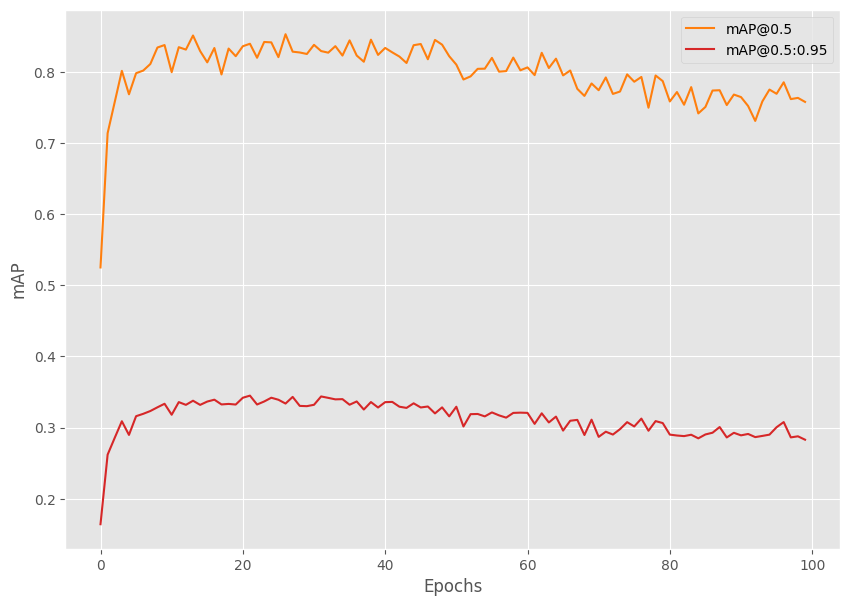

In [ ]:
from tqdm.auto import tqdm
from torchmetrics.detection.mean_ap import MeanAveragePrecision
from torch.optim.lr_scheduler import StepLR
import torch
import matplotlib.pyplot as plt
import time
import os

plt.style.use('ggplot')

seed = 42
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.cuda.manual_seed_all(seed)

# Function for running training iterations.
def train(train_data_loader, model):
    print('Training')
    model.train()

     # initialize tqdm progress bar
    prog_bar = tqdm(train_data_loader, total=len(train_data_loader))

    for i, data in enumerate(prog_bar):
        optimizer.zero_grad()
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]
        loss_dict = model(images, targets)

        losses = sum(loss for loss in loss_dict.values())
        loss_value = losses.item()

        train_loss_hist.send(loss_value)

        losses.backward()
        optimizer.step()

        # update the loss value beside the progress bar for each iteration
        prog_bar.set_description(desc=f"Loss: {loss_value:.4f}")
    return loss_value

# Function for running validation iterations.
def validate(valid_data_loader, model):
    print('Validating')
    model.eval()

    # Initialize tqdm progress bar.
    prog_bar = tqdm(valid_data_loader, total=len(valid_data_loader))
    target = []
    preds = []
    for i, data in enumerate(prog_bar):
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

        with torch.no_grad():
            outputs = model(images, targets)

        # For mAP calculation using Torchmetrics.
        #####################################
        for i in range(len(images)):
            true_dict = dict()
            preds_dict = dict()
            true_dict['boxes'] = targets[i]['boxes'].detach().cpu()
            true_dict['labels'] = targets[i]['labels'].detach().cpu()
            preds_dict['boxes'] = outputs[i]['boxes'].detach().cpu()
            preds_dict['scores'] = outputs[i]['scores'].detach().cpu()
            preds_dict['labels'] = outputs[i]['labels'].detach().cpu()
            preds.append(preds_dict)
            target.append(true_dict)
        #####################################

    metric.reset()
    metric.update(preds, target)
    metric_summary = metric.compute()
    return metric_summary

if __name__ == '__main__':
    os.makedirs('outputs', exist_ok=True)
    train_dataset = create_train_dataset(TRAIN_DIR)
    valid_dataset = create_valid_dataset(VALID_DIR)
    train_loader = create_train_loader(train_dataset, NUM_WORKERS)
    valid_loader = create_valid_loader(valid_dataset, NUM_WORKERS)
    print(f"Number of training samples: {len(train_dataset)}")
    print(f"Number of validation samples: {len(valid_dataset)}\n")

    # Initialize the model and move to the computation device.
    model = create_model(num_classes=NUM_CLASSES)
    model = model.to(DEVICE)
    # print(model)
    # Total parameters and trainable parameters.
    total_params = sum(p.numel() for p in model.parameters())
    print(f"{total_params:,} total parameters.")
    total_trainable_params = sum(
        p.numel() for p in model.parameters() if p.requires_grad)
    print(f"{total_trainable_params:,} training parameters.")
    params = [p for p in model.parameters() if p.requires_grad]
    optimizer = torch.optim.SGD(params, lr=0.001, momentum=0.9, weight_decay=0.0005, nesterov=True)
    scheduler = StepLR(
        optimizer=optimizer, step_size=15, gamma=0.1, verbose=True
    )

    # To monitor training loss
    train_loss_hist = Averager()
    # To store training loss and mAP values.
    train_loss_list = []
    map_50_list = []
    map_list = []

    # Mame to save the trained model with.
    MODEL_NAME = 'model'

    # Whether to show transformed images from data loader or not.
    # if VISUALIZE_TRANSFORMED_IMAGES:
    #     from custom_utils import show_tranformed_image
    #     show_tranformed_image(train_loader)

    # To save best model.
    save_best_model = SaveBestModel()

    metric = MeanAveragePrecision()

    # Training loop.
    for epoch in range(NUM_EPOCHS):
        print(f"\nEPOCH {epoch+1} of {NUM_EPOCHS}")

        # Reset the training loss histories for the current epoch.
        train_loss_hist.reset()

        # Start timer and carry out training and validation.
        start = time.time()
        train_loss = train(train_loader, model)
        metric_summary = validate(valid_loader, model)
        print(f"Epoch #{epoch+1} train loss: {train_loss_hist.value:.3f}")
        print(f"Epoch #{epoch+1} mAP: {metric_summary['map']}")
        end = time.time()
        print(f"Took {((end - start) / 60):.3f} minutes for epoch {epoch}")

        train_loss_list.append(train_loss)
        map_50_list.append(metric_summary['map_50'])
        map_list.append(metric_summary['map'])

        # save the best model till now.
        save_best_model(
            model, float(metric_summary['map_50']), epoch, 'outputs'
        )
        # Save the current epoch model.
        save_model(epoch, model, optimizer)

        # Save loss plot.
        save_loss_plot(OUT_DIR, train_loss_list)

        # Save mAP plot.
        save_mAP(OUT_DIR, map_50_list, map_list)
        # scheduler.step()

In [ ]:
import shutil

source_path = "/content/drive/MyDrive/SKRIPSI/Hasil/Model_11_9010_3000/best_model.pth"
destination_path = "/content/outputs/best_model.pth"

shutil.copyfile(source_path, destination_path)

'/content/outputs/best_model.pth'

In [ ]:
import torch
from tqdm.auto import tqdm
from tqdm import TqdmExperimentalWarning
from torchmetrics.detection.mean_ap import MeanAveragePrecision

# Evaluation function
def validate(valid_data_loader, model):
    model.eval()

    # Initialize tqdm progress bar.
    prog_bar = tqdm(valid_data_loader, total=len(valid_data_loader))
    target = []
    preds = []
    for i, data in enumerate(prog_bar):
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

        with torch.no_grad():
            outputs = model(images, targets)

        # For mAP calculation using Torchmetrics.
        #####################################
        for i in range(len(images)):
            true_dict = dict()
            preds_dict = dict()
            true_dict['boxes'] = targets[i]['boxes'].detach().cpu()
            true_dict['labels'] = targets[i]['labels'].detach().cpu()
            preds_dict['boxes'] = outputs[i]['boxes'].detach().cpu()
            preds_dict['scores'] = outputs[i]['scores'].detach().cpu()
            preds_dict['labels'] = outputs[i]['labels'].detach().cpu()
            preds.append(preds_dict)
            target.append(true_dict)
        #####################################

    metric = MeanAveragePrecision()
    metric.update(preds, target)
    metric_summary = metric.compute()
    return metric_summary

if __name__ == '__main__':
    # Load the best model and trained weights.
    model = create_model(num_classes=NUM_CLASSES)
    checkpoint = torch.load('/content/outputs/best_model.pth', map_location=DEVICE)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.to(DEVICE).eval()

    test_dataset = create_test_dataset(
        '/content/PneumoniaDataset_9010_3000/test'
    )
    test_loader = create_test_loader(test_dataset, num_workers=NUM_WORKERS)

    metric_summary = validate(test_loader, model)
    print(f"mAP_50: {metric_summary['map_50']*100:.3f}")
    print(f"mAP_50_95: {metric_summary['map']*100:.3f}")

  0%|          | 0/300 [00:00<?, ?it/s]

mAP_50: 85.291
mAP_50_95: 33.342


  0%|          | 0/300 [00:00<?, ?it/s]

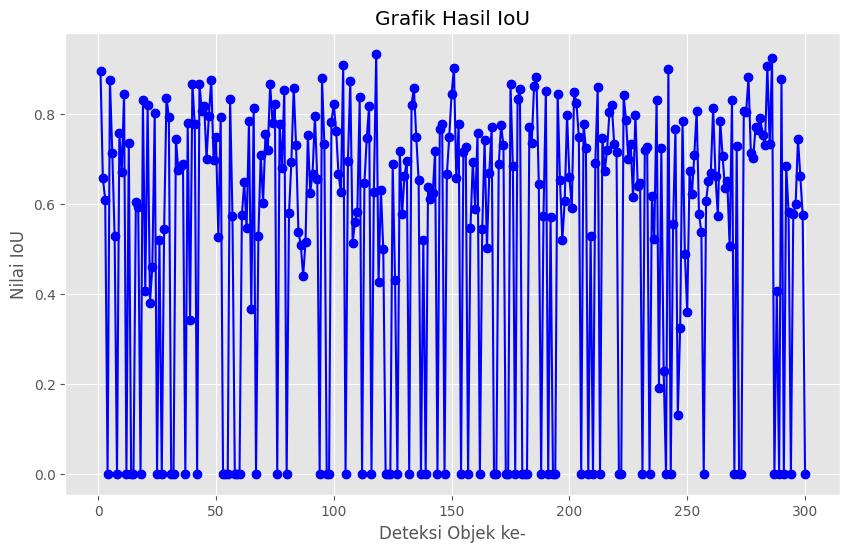

In [ ]:
import shutil
import torch
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
from torchvision.transforms.functional import to_pil_image
from torchvision.ops import box_iou

# Function to calculate Intersection over Union (IoU)
def calculate_iou(box1, box2):
    # Extract coordinates from the bounding box tensors
    box1 = [float(coord) for coord in box1]
    box2 = [float(coord) for coord in box2]

    # Calculate intersection area
    x1_int = max(box1[0], box2[0])
    y1_int = max(box1[1], box2[1])
    x2_int = min(box1[2], box2[2])
    y2_int = min(box1[3], box2[3])

    intersection = max(0, x2_int - x1_int) * max(0, y2_int - y1_int)

    # Calculate union area
    area1 = (box1[2] - box1[0]) * (box1[3] - box1[1])
    area2 = (box2[2] - box2[0]) * (box2[3] - box2[1])
    union = area1 + area2 - intersection

    # Calculate IoU
    iou = intersection / union if union > 0 else 0.0
    return iou

# source_path = "/content/drive/MyDrive/SKRIPSI/Hasil/Model_2/best_model.pth"
# destination_path = "/content/outputs/best_model.pth"

# shutil.copyfile(source_path, destination_path)

def show_iou_graph(images, true_boxes, pred_boxes, threshold=0.5, save_path="/content/iou_graph_model8.png"):
    all_ious = []

    for i in range(len(images)):
        true_boxes_i = true_boxes[i]
        pred_boxes_i = pred_boxes[i]

        ious = []  # To store IoU values for the current image

        for pred_box, score, label in zip(pred_boxes_i['boxes'], pred_boxes_i['scores'], pred_boxes_i['labels']):
            pred_box = [float(b) for b in pred_box]
            if score > threshold:
                # Find the corresponding true bounding box for the label
                true_box = true_boxes_i['boxes'][true_boxes_i['labels'] == label].cpu()
                if len(true_box) > 0:
                    true_box = [float(b) for b in true_box[0]]
                    iou = calculate_iou(pred_box, true_box)
                    ious.append(iou)

        # Store IoU values for the current image
        all_ious.append(ious)

    # Create IoU scatter plot
    plt.figure(figsize=(10, 6))
    plt.scatter(range(1, len(all_ious) + 1), [max(i, default=0) for i in all_ious], color='blue')
    plt.plot(range(1, len(all_ious) + 1), [max(i, default=0) for i in all_ious], linestyle='-', marker='o', color='blue')
    plt.title('Grafik Hasil IoU')
    plt.xlabel('Deteksi Objek ke-')
    plt.ylabel('Nilai IoU')
    plt.savefig(save_path)
    plt.show()

# Update the validate function to return images along with predictions
def validate(valid_data_loader, model):
    model.eval()

    # Initialize tqdm progress bar.
    prog_bar = tqdm(valid_data_loader, total=len(valid_data_loader))
    target = []
    preds = []
    images_list = []

    for i, data in enumerate(prog_bar):
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

        with torch.no_grad():
            outputs = model(images, targets)

        # For mAP calculation using Torchmetrics.
        for i in range(len(images)):
            true_dict = dict()
            preds_dict = dict()
            true_dict['boxes'] = targets[i]['boxes'].detach().cpu()
            true_dict['labels'] = targets[i]['labels'].detach().cpu()
            preds_dict['boxes'] = outputs[i]['boxes'].detach().cpu()
            preds_dict['scores'] = outputs[i]['scores'].detach().cpu()
            preds_dict['labels'] = outputs[i]['labels'].detach().cpu()
            preds.append(preds_dict)
            target.append(true_dict)
            images_list.append(images[i])

    return images_list, preds, target

if __name__ == '__main__':
    model = create_model(num_classes=NUM_CLASSES)
    checkpoint = torch.load('/content/outputs/best_model.pth', map_location=DEVICE)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.to(DEVICE).eval()

    test_dataset = create_test_dataset('/content/PneumoniaDataset_9010_3000/test')
    test_loader = create_test_loader(test_dataset, num_workers=NUM_WORKERS)

    # After calculating metrics, you can display the IoU graph
    images, pred_boxes, true_boxes = validate(test_loader, model)
    # class_names = ['_Background', 'Pneumonia']
    show_iou_graph(images, true_boxes, pred_boxes, save_path='/content/iou_graph_model8.png')

In [ ]:
def make_prediction(model, img, threshold):
    model.eval()
    preds = model(img)
    for id in range(len(preds)) :
        idx_list = []

        for idx, score in enumerate(preds[id]['scores']) :
            if score > threshold :
                idx_list.append(idx)

        preds[id]['boxes'] = preds[id]['boxes'][idx_list]
        preds[id]['labels'] = preds[id]['labels'][idx_list]
        preds[id]['scores'] = preds[id]['scores'][idx_list]

    return preds

def plot_image_from_output(img, annotation):

    img = img.cpu().permute(1,2,0)

    fig,ax = plt.subplots(1)
    ax.imshow(img)

    for idx in range(len(annotation["boxes"])):
        xmin, ymin, xmax, ymax = annotation["boxes"][idx]

        if annotation['labels'][idx] == 1 :
            rect = patches.Rectangle((xmin,ymin),(xmax-xmin),(ymax-ymin),linewidth=1,edgecolor='g',facecolor='none')
        else :
            rect = patches.Rectangle((xmin,ymin),(xmax-xmin),(ymax-ymin),linewidth=1,edgecolor='orange',facecolor='none')

        ax.add_patch(rect)

    plt.show()

In [ ]:
from tqdm import tqdm

labels = []
preds_adj_all = []
annot_all = []

for im, annot in tqdm(test_loader, position = 0, leave = True):
    im = list(img.to(DEVICE) for img in im)
    #annot = [{k: v.to(device) for k, v in t.items()} for t in annot]

    for t in annot:
        labels += t['labels']

    with torch.no_grad():
        preds_adj = make_prediction(model, im, 0.5)
        preds_adj = [{k: v.to(torch.device('cpu')) for k, v in t.items()} for t in preds_adj]
        preds_adj_all.append(preds_adj)
        annot_all.append(annot)


100%|██████████| 300/300 [00:23<00:00, 12.61it/s]


In [ ]:
!git clone https://github.com/Pseudo-Lab/Tutorial-Book-Utils
!python Tutorial-Book-Utils/PL_data_loader.py --data FaceMaskDetection
%cd Tutorial-Book-Utils/
import utils_ObjectDetection as utils

Cloning into 'Tutorial-Book-Utils'...
remote: Enumerating objects: 45, done.
remote: Counting objects: 100% (45/45), done.
remote: Compressing objects: 100% (39/39), done.
remote: Total 45 (delta 18), reused 17 (delta 5), pack-reused 0
Receiving objects: 100% (45/45), 11.62 KiB | 5.81 MiB/s, done.
Resolving deltas: 100% (18/18), done.
Downloading...
From (original): https://drive.google.com/uc?id=16Gzn1w38yZLJpzmzKcRIRveFeHZtCEr7
From (redirected): https://drive.google.com/uc?id=16Gzn1w38yZLJpzmzKcRIRveFeHZtCEr7&confirm=t&uuid=52395b92-c358-496c-98cf-784936358112
To: /content/Face Mask Detection.zip
100% 417M/417M [00:06<00:00, 68.3MB/s]
Face Mask Detection.zip download complete!
/content/Tutorial-Book-Utils


In [ ]:
sample_metrics = []
for batch_i in range(len(preds_adj_all)):
    sample_metrics += utils.get_batch_statistics(preds_adj_all[batch_i], annot_all[batch_i], iou_threshold=0.5)

true_positives, pred_scores, pred_labels = [torch.cat(x, 0) for x in list(zip(*sample_metrics))]  # batch semua disatukan
precision, recall, AP, f1, ap_class = utils.ap_per_class(true_positives, pred_scores, pred_labels, torch.tensor(labels))
mAP = torch.mean(AP)
print(f'mAP : {mAP}')
print(f'AP : {AP}')

mAP : 0.6257334225458151
AP : tensor([0.6257], dtype=torch.float64)


In [ ]:
sample_metrics = []
for batch_i in range(len(preds_adj_all)):
    sample_metrics += utils.get_batch_statistics(preds_adj_all[batch_i], annot_all[batch_i], iou_threshold=0.4)

true_positives, pred_scores, pred_labels = [torch.cat(x, 0) for x in list(zip(*sample_metrics))]  # batch semua disatukan
precision, recall, AP, f1, ap_class = utils.ap_per_class(true_positives, pred_scores, pred_labels, torch.tensor(labels))
mAP = torch.mean(AP)
print(f'mAP : {mAP}')
print(f'AP : {AP}')

mAP : 0.68997478110564
AP : tensor([0.6900], dtype=torch.float64)


In [ ]:
sample_metrics = []
for batch_i in range(len(preds_adj_all)):
    sample_metrics += utils.get_batch_statistics(preds_adj_all[batch_i], annot_all[batch_i], iou_threshold=0.3)

true_positives, pred_scores, pred_labels = [torch.cat(x, 0) for x in list(zip(*sample_metrics))]  # batch semua disatukan
precision, recall, AP, f1, ap_class = utils.ap_per_class(true_positives, pred_scores, pred_labels, torch.tensor(labels))
mAP = torch.mean(AP)
print(f'mAP : {mAP}')
print(f'AP : {AP}')

mAP : 0.7166656443375032
AP : tensor([0.7167], dtype=torch.float64)


# Model 13 | BATCH : 4 | LR : 0.001 | 90:20 - 1000 DATASET

In [ ]:
import zipfile
import os

zip_file_path = '/content/drive/MyDrive/SKRIPSI/Dataset/PneumoniaDataset_9010_1000.zip'  # Ganti dengan path ke file ZIP Anda
unzip_dir = '/content'  # Ganti dengan direktori di mana Anda ingin mengekstrak file

def extract_zip(zip_file, extract_dir):
    with zipfile.ZipFile(zip_file, 'r') as zip_ref:
        zip_ref.extractall(extract_dir)

def list_files(directory):
    return os.listdir(directory)

# Ekstrak file ZIP
extract_zip(zip_file_path, unzip_dir)

# Tampilkan daftar file yang diekstrak
extracted_files = list_files(unzip_dir)
print(extracted_files)

['.config', '__MACOSX', 'drive', 'PneumoniaDataset_9010_1000', 'sample_data']


In [ ]:
import torch
import os


DEVICE = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

BATCH_SIZE = 4 # Increase / decrease according to GPU memeory.
RESIZE_TO = 300 # Resize the image for training and transforms.
NUM_EPOCHS = 100 # Number of epochs to train for.
NUM_WORKERS = 2 # Number of parallel workers for data loading.

CLASSES = [
    '_background','Lung Opacity'
    # 'helmet','head','person'
]



TRAIN_DIR = '/content/PneumoniaDataset_9010_1000/train'
VALID_DIR = '/content/PneumoniaDataset_9010_1000/test'

# Classes: 0 index is reserved for background.


NUM_CLASSES = len(CLASSES)

# Whether to visualize images after crearing the data loaders.
VISUALIZE_TRANSFORMED_IMAGES = False

# Location to save model and plots.
OUT_DIR = 'outputs'
os.makedirs(OUT_DIR, exist_ok=True)

In [ ]:
import albumentations as A
import cv2
import numpy as np
import torch
import matplotlib.pyplot as plt

from albumentations.pytorch import ToTensorV2


plt.style.use('ggplot')

# This class keeps track of the training and validation loss values
# and helps to get the average for each epoch as well.
class Averager:
    def __init__(self):
        self.current_total = 0.0
        self.iterations = 0.0

    def send(self, value):
        self.current_total += value
        self.iterations += 1

    @property
    def value(self):
        if self.iterations == 0:
            return 0
        else:
            return 1.0 * self.current_total / self.iterations

    def reset(self):
        self.current_total = 0.0
        self.iterations = 0.0

class SaveBestModel:
    """
    Class to save the best model while training. If the current epoch's
    validation mAP @0.5:0.95 IoU higher than the previous highest, then save the
    model state.
    """
    def __init__(
        self, best_valid_map=float(0)
    ):
        self.best_valid_map = best_valid_map

    def __call__(
        self,
        model,
        current_valid_map,
        epoch,
        OUT_DIR,
    ):
        if current_valid_map > self.best_valid_map:
            self.best_valid_map = current_valid_map
            print(f"\nBEST VALIDATION mAP: {self.best_valid_map}")
            print(f"\nSAVING BEST MODEL FOR EPOCH: {epoch+1}\n")
            torch.save({
                'epoch': epoch+1,
                'model_state_dict': model.state_dict(),
                }, f"{OUT_DIR}/best_model.pth")

def collate_fn(batch):
    """
    To handle the data loading as different images may have different number
    of objects and to handle varying size tensors as well.
    """
    return tuple(zip(*batch))

# Define the training tranforms.
def get_train_transform():
    return A.Compose([
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.Rotate(limit=6),
        A.Blur(blur_limit=3, p=0.1),
        A.MotionBlur(blur_limit=3, p=0.1),
        A.MedianBlur(blur_limit=3, p=0.1),
        A.RandomBrightnessContrast(p=0.2),
        ToTensorV2(p=1.0),
    ], bbox_params={
        'format': 'pascal_voc',
        'label_fields': ['labels']
    })


# Define the validation transforms.
def get_valid_transform():
    return A.Compose([
        ToTensorV2(p=1.0),
    ], bbox_params={
        'format': 'pascal_voc',
        'label_fields': ['labels']
    })


def show_tranformed_image(train_loader):
    """
    This function shows the transformed images from the `train_loader`.
    Helps to check whether the tranformed images along with the corresponding
    labels are correct or not.
    Only runs if `VISUALIZE_TRANSFORMED_IMAGES = True` in config.py.
    """
    if len(train_loader) > 0:
        for i in range(1):
            images, targets = next(iter(train_loader))
            images = list(image.to(DEVICE) for image in images)
            targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]
            boxes = targets[i]['boxes'].cpu().numpy().astype(np.int32)
            labels = targets[i]['labels'].cpu().numpy().astype(np.int32)
            sample = images[i].permute(1, 2, 0).cpu().numpy()
            sample = cv2.cvtColor(sample, cv2.COLOR_RGB2BGR)
            for box_num, box in enumerate(boxes):
                cv2.rectangle(sample,
                            (box[0], box[1]),
                            (box[2], box[3]),
                            (0, 0, 255), 2)
                cv2.putText(sample, CLASSES[labels[box_num]],
                            (box[0], box[1]-10), cv2.FONT_HERSHEY_SIMPLEX,
                            1.0, (0, 0, 255), 2)
            cv2.imshow('Transformed image', sample)
            cv2.waitKey(0)
            cv2.destroyAllWindows()

def save_model(epoch, model, optimizer):
    """
    Function to save the trained model till current epoch, or whenver called
    """
    torch.save({
                'epoch': epoch+1,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                }, 'outputs/last_model.pth')

def save_loss_plot(
    OUT_DIR,
    train_loss_list,
    x_label='iterations',
    y_label='train loss',
    save_name='train_loss'
):
    """
    Function to save both train loss graph.

    :param OUT_DIR: Path to save the graphs.
    :param train_loss_list: List containing the training loss values.
    """
    figure_1 = plt.figure(figsize=(10, 7), num=1, clear=True)
    train_ax = figure_1.add_subplot()
    train_ax.plot(train_loss_list, color='tab:blue')
    train_ax.set_xlabel(x_label)
    train_ax.set_ylabel(y_label)
    figure_1.savefig(f"{OUT_DIR}/{save_name}.png")
    print('SAVING PLOTS COMPLETE...')

def save_mAP(OUT_DIR, map_05, map):
    """
    Saves the mAP@0.5 and mAP@0.5:0.95 per epoch.
    :param OUT_DIR: Path to save the graphs.
    :param map_05: List containing mAP values at 0.5 IoU.
    :param map: List containing mAP values at 0.5:0.95 IoU.
    """
    figure = plt.figure(figsize=(10, 7), num=1, clear=True)
    ax = figure.add_subplot()
    ax.plot(
        map_05, color='tab:orange', linestyle='-',
        label='mAP@0.5'
    )
    ax.plot(
        map, color='tab:red', linestyle='-',
        label='mAP@0.5:0.95'
    )
    ax.set_xlabel('Epochs')
    ax.set_ylabel('mAP')
    ax.legend()
    figure.savefig(f"{OUT_DIR}/map.png")

In [ ]:
import torch
import cv2
import numpy as np
import os
import glob as glob
from google.colab.patches import cv2_imshow
from xml.etree import ElementTree as et
from torch.utils.data import Dataset, DataLoader

# The dataset class.
class PneumoniaDataset(Dataset):
    def __init__(self, dir_path, width, height, classes, transforms=None):
        self.transforms = transforms
        self.dir_path = dir_path
        self.height = height
        self.width = width
        self.classes = classes
        self.image_file_types = ['*.jpg', '*.jpeg', '*.png', '*.ppm', '*.JPG']
        self.all_image_paths = []

        # Get all the image paths in sorted order.
        for file_type in self.image_file_types:
            self.all_image_paths.extend(glob.glob(os.path.join(self.dir_path, file_type)))
        self.all_images = [image_path.split(os.path.sep)[-1] for image_path in self.all_image_paths]
        self.all_images = sorted(self.all_images)

    def __getitem__(self, idx):
        # Capture the image name and the full image path.
        image_name = self.all_images[idx]
        image_path = os.path.join(self.dir_path, image_name)

        # Read and preprocess the image.
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
        image_resized = cv2.resize(image, (self.width, self.height))
        image_resized /= 255.0

        # Capture the corresponding XML file for getting the annotations.
        annot_filename = os.path.splitext(image_name)[0] + '.xml'
        annot_file_path = os.path.join(self.dir_path, annot_filename)

        boxes = []
        labels = []
        tree = et.parse(annot_file_path)
        root = tree.getroot()

        # Original image width and height.
        image_width = image.shape[1]
        image_height = image.shape[0]

        # Box coordinates for xml files are extracted
        # and corrected for image size given.
        for member in root.findall('object'):
            # Get label and map the `classes`.
            labels.append(self.classes.index(member.find('name').text))

            # Left corner x-coordinates.
            xmin = int(member.find('bndbox').find('xmin').text)
            # Right corner x-coordinates.
            xmax = int(member.find('bndbox').find('xmax').text)
            # Left corner y-coordinates.
            ymin = int(member.find('bndbox').find('ymin').text)
            # Right corner y-coordinates.
            ymax = int(member.find('bndbox').find('ymax').text)

            # Resize the bounding boxes according
            # to resized image `width`, `height`.
            xmin_final = (xmin/image_width)*self.width
            xmax_final = (xmax/image_width)*self.width
            ymin_final = (ymin/image_height)*self.height
            ymax_final = (ymax/image_height)*self.height

            # Check that max coordinates are at least one pixel
            # larger than min coordinates.
            if xmax_final == xmin_final:
                xmax_final += 1
            if ymax_final == ymin_final:
                ymax_final += 1
            # Check that all coordinates are within the image.
            if xmax_final > self.width:
                xmax_final = self.width
            if ymax_final > self.height:
                ymax_final = self.height

            boxes.append([xmin_final, ymin_final, xmax_final, ymax_final])

        # Bounding box to tensor.
        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        # Area of the bounding boxes.
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0]) if len(boxes) > 0 \
            else torch.as_tensor(boxes, dtype=torch.float32)
        # No crowd instances.
        iscrowd = torch.zeros((boxes.shape[0],), dtype=torch.int64)
        # Labels to tensor.
        labels = torch.as_tensor(labels, dtype=torch.int64)

        # Prepare the final `target` dictionary.
        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["area"] = area
        target["iscrowd"] = iscrowd
        image_id = torch.tensor([idx])
        target["image_id"] = image_id

        # Apply the image transforms.
        if self.transforms:
            sample = self.transforms(image = image_resized,
                                     bboxes = target['boxes'],
                                     labels = labels)
            image_resized = sample['image']
            target['boxes'] = torch.Tensor(sample['bboxes'])

        if np.isnan((target['boxes']).numpy()).any() or target['boxes'].shape == torch.Size([0]):
            target['boxes'] = torch.zeros((0, 4), dtype=torch.int64)
        return image_resized, target

    def __len__(self):
        return len(self.all_images)
        # return 500;

# Prepare the final datasets and data loaders.
def create_train_dataset(DIR):
    train_dataset = PneumoniaDataset(
        DIR, RESIZE_TO, RESIZE_TO, CLASSES, get_train_transform()
    )
    return train_dataset
def create_valid_dataset(DIR):
    valid_dataset = PneumoniaDataset(
        DIR, RESIZE_TO, RESIZE_TO, CLASSES, get_valid_transform()
    )
    return valid_dataset
def create_test_dataset(DIR):
    test_dataset = PneumoniaDataset(
        DIR, RESIZE_TO, RESIZE_TO, CLASSES, get_valid_transform()
    )
    return test_dataset
def create_train_loader(train_dataset, num_workers=0):
    train_loader = DataLoader(
        train_dataset,
        batch_size=BATCH_SIZE,
        shuffle=True,
        num_workers=num_workers,
        collate_fn=collate_fn,
        drop_last=True
    )
    return train_loader
def create_valid_loader(valid_dataset, num_workers=0):
    valid_loader = DataLoader(
        valid_dataset,
        batch_size=BATCH_SIZE,
        shuffle=False,
        num_workers=num_workers,
        collate_fn=collate_fn,
        drop_last=True
    )
    return valid_loader
def create_test_loader(test_dataset, num_workers=0):
    test_loader = DataLoader(
        test_dataset,
        batch_size=1,
        shuffle=False,
        num_workers=num_workers,
        collate_fn=collate_fn,
        drop_last=True
    )
    return test_loader


In [ ]:
import torchvision
import torch

from functools import partial
from torchvision.models.detection import RetinaNet
from torchvision.models.detection.backbone_utils import resnet_fpn_backbone
from torchvision.models.detection.retinanet import RetinaNetClassificationHead
from torchvision.models.detection import RetinaNet_ResNet50_FPN_V2_Weights
from torchvision.models.detection.retinanet import RetinaNetClassificationHead

def create_model(num_classes):
    model = torchvision.models.detection.retinanet_resnet50_fpn_v2(
        weights=RetinaNet_ResNet50_FPN_V2_Weights.COCO_V1
    )
    num_anchors = model.head.classification_head.num_anchors

    model.head.classification_head = RetinaNetClassificationHead(
        in_channels=256,
        num_anchors=num_anchors,
        num_classes=num_classes,
        norm_layer=partial(torch.nn.GroupNorm, 32)
    )
    return model

if __name__ == '__main__':
    model = create_model(2)
    # print(model)
    # Total parameters and trainable parameters.
    total_params = sum(p.numel() for p in model.parameters())
    print(f"{total_params:,} total parameters.")
    total_trainable_params = sum(
        p.numel() for p in model.parameters() if p.requires_grad)
    print(f"{total_trainable_params:,} training parameters.")

Downloading: "https://download.pytorch.org/models/retinanet_resnet50_fpn_v2_coco-5905b1c5.pth" to /root/.cache/torch/hub/checkpoints/retinanet_resnet50_fpn_v2_coco-5905b1c5.pth
100%|██████████| 146M/146M [00:01<00:00, 89.3MB/s]


36,352,630 total parameters.
36,127,286 training parameters.


In [ ]:
!pip install torchmetrics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 840.4/840.4 kB 14.8 MB/s eta 0:00:00


Number of training samples: 900
Number of validation samples: 100

36,352,630 total parameters.
36,127,286 training parameters.
Adjusting learning rate of group 0 to 1.0000e-03.

EPOCH 1 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torchmetrics/utilities/prints.py:43: UserWarning: Encountered more than 100 detections in a single image. This means that certain detections with the lowest scores will be ignored, that may have an undesirable impact on performance. Please consider adjusting the `max_detection_threshold` to suit your use case. To disable this warning, set attribute class `warn_on_many_detections=False`, after initializing the metric.
  warnings.warn(*args, **kwargs)  # noqa: B028


Epoch #1 train loss: 0.879
Epoch #1 mAP: 0.16899877786636353
Took 0.705 minutes for epoch 0

BEST VALIDATION mAP: 0.5142585039138794

SAVING BEST MODEL FOR EPOCH: 1

SAVING PLOTS COMPLETE...

EPOCH 2 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #2 train loss: 0.749
Epoch #2 mAP: 0.21298430860042572
Took 0.468 minutes for epoch 1

BEST VALIDATION mAP: 0.6256737112998962

SAVING BEST MODEL FOR EPOCH: 2

SAVING PLOTS COMPLETE...

EPOCH 3 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #3 train loss: 0.705
Epoch #3 mAP: 0.27965056896209717
Took 0.635 minutes for epoch 2

BEST VALIDATION mAP: 0.7363923192024231

SAVING BEST MODEL FOR EPOCH: 3

SAVING PLOTS COMPLETE...

EPOCH 4 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #4 train loss: 0.677
Epoch #4 mAP: 0.3077720105648041
Took 0.632 minutes for epoch 3

BEST VALIDATION mAP: 0.7715744376182556

SAVING BEST MODEL FOR EPOCH: 4

SAVING PLOTS COMPLETE...

EPOCH 5 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #5 train loss: 0.656
Epoch #5 mAP: 0.3148770034313202
Took 0.634 minutes for epoch 4

BEST VALIDATION mAP: 0.7858555912971497

SAVING BEST MODEL FOR EPOCH: 5

SAVING PLOTS COMPLETE...

EPOCH 6 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #6 train loss: 0.639
Epoch #6 mAP: 0.31035858392715454
Took 0.467 minutes for epoch 5

BEST VALIDATION mAP: 0.7862441539764404

SAVING BEST MODEL FOR EPOCH: 6

SAVING PLOTS COMPLETE...

EPOCH 7 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #7 train loss: 0.626
Epoch #7 mAP: 0.32612890005111694
Took 0.464 minutes for epoch 6

BEST VALIDATION mAP: 0.8062675595283508

SAVING BEST MODEL FOR EPOCH: 7

SAVING PLOTS COMPLETE...

EPOCH 8 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #8 train loss: 0.614
Epoch #8 mAP: 0.3276125192642212
Took 0.631 minutes for epoch 7
SAVING PLOTS COMPLETE...

EPOCH 9 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #9 train loss: 0.609
Epoch #9 mAP: 0.3295091390609741
Took 1.638 minutes for epoch 8

BEST VALIDATION mAP: 0.8255277872085571

SAVING BEST MODEL FOR EPOCH: 9

SAVING PLOTS COMPLETE...

EPOCH 10 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #10 train loss: 0.602
Epoch #10 mAP: 0.34022313356399536
Took 0.630 minutes for epoch 9
SAVING PLOTS COMPLETE...

EPOCH 11 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #11 train loss: 0.593
Epoch #11 mAP: 0.34837833046913147
Took 0.631 minutes for epoch 10

BEST VALIDATION mAP: 0.8501619696617126

SAVING BEST MODEL FOR EPOCH: 11

SAVING PLOTS COMPLETE...

EPOCH 12 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #12 train loss: 0.585
Epoch #12 mAP: 0.350379079580307
Took 0.465 minutes for epoch 11
SAVING PLOTS COMPLETE...

EPOCH 13 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #13 train loss: 0.585
Epoch #13 mAP: 0.3555448651313782
Took 0.631 minutes for epoch 12
SAVING PLOTS COMPLETE...

EPOCH 14 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #14 train loss: 0.579
Epoch #14 mAP: 0.3508286774158478
Took 0.633 minutes for epoch 13
SAVING PLOTS COMPLETE...

EPOCH 15 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #15 train loss: 0.572
Epoch #15 mAP: 0.3518179655075073
Took 0.464 minutes for epoch 14
SAVING PLOTS COMPLETE...

EPOCH 16 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #16 train loss: 0.566
Epoch #16 mAP: 0.36083224415779114
Took 0.464 minutes for epoch 15

BEST VALIDATION mAP: 0.850594162940979

SAVING BEST MODEL FOR EPOCH: 16

SAVING PLOTS COMPLETE...

EPOCH 17 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #17 train loss: 0.562
Epoch #17 mAP: 0.3652115762233734
Took 0.629 minutes for epoch 16
SAVING PLOTS COMPLETE...

EPOCH 18 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #18 train loss: 0.561
Epoch #18 mAP: 0.3535082936286926
Took 0.629 minutes for epoch 17
SAVING PLOTS COMPLETE...

EPOCH 19 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #19 train loss: 0.552
Epoch #19 mAP: 0.3421165645122528
Took 0.627 minutes for epoch 18
SAVING PLOTS COMPLETE...

EPOCH 20 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #20 train loss: 0.551
Epoch #20 mAP: 0.36154311895370483
Took 0.462 minutes for epoch 19

BEST VALIDATION mAP: 0.8564029932022095

SAVING BEST MODEL FOR EPOCH: 20

SAVING PLOTS COMPLETE...

EPOCH 21 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b5f0ebfc160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b5f0ebfc160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #21 train loss: 0.546
Epoch #21 mAP: 0.361939936876297
Took 0.464 minutes for epoch 20
SAVING PLOTS COMPLETE...

EPOCH 22 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #22 train loss: 0.542
Epoch #22 mAP: 0.37098926305770874
Took 0.628 minutes for epoch 21

BEST VALIDATION mAP: 0.867431104183197

SAVING BEST MODEL FOR EPOCH: 22

SAVING PLOTS COMPLETE...

EPOCH 23 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b5f0ebfc160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process


Epoch #23 train loss: 0.538
Epoch #23 mAP: 0.36120691895484924
Took 0.628 minutes for epoch 22
SAVING PLOTS COMPLETE...

EPOCH 24 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #24 train loss: 0.537
Epoch #24 mAP: 0.36011743545532227
Took 0.629 minutes for epoch 23
SAVING PLOTS COMPLETE...

EPOCH 25 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #25 train loss: 0.534
Epoch #25 mAP: 0.37398654222488403
Took 0.628 minutes for epoch 24

BEST VALIDATION mAP: 0.8716351389884949

SAVING BEST MODEL FOR EPOCH: 25

SAVING PLOTS COMPLETE...

EPOCH 26 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #26 train loss: 0.530
Epoch #26 mAP: 0.35861271619796753
Took 1.802 minutes for epoch 25
SAVING PLOTS COMPLETE...

EPOCH 27 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #27 train loss: 0.524
Epoch #27 mAP: 0.3617718815803528
Took 0.631 minutes for epoch 26
SAVING PLOTS COMPLETE...

EPOCH 28 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #28 train loss: 0.521
Epoch #28 mAP: 0.3668828308582306
Took 0.463 minutes for epoch 27
SAVING PLOTS COMPLETE...

EPOCH 29 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #29 train loss: 0.518
Epoch #29 mAP: 0.3704061508178711
Took 0.628 minutes for epoch 28
SAVING PLOTS COMPLETE...

EPOCH 30 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #30 train loss: 0.519
Epoch #30 mAP: 0.359146386384964
Took 0.631 minutes for epoch 29
SAVING PLOTS COMPLETE...

EPOCH 31 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b5f0ebfc160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
: AssertionErrorcan only test a child process


Epoch #31 train loss: 0.512
Epoch #31 mAP: 0.3593319058418274
Took 0.630 minutes for epoch 30
SAVING PLOTS COMPLETE...

EPOCH 32 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #32 train loss: 0.507
Epoch #32 mAP: 0.360995352268219
Took 0.629 minutes for epoch 31
SAVING PLOTS COMPLETE...

EPOCH 33 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #33 train loss: 0.505
Epoch #33 mAP: 0.3504398465156555
Took 0.628 minutes for epoch 32
SAVING PLOTS COMPLETE...

EPOCH 34 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #34 train loss: 0.498
Epoch #34 mAP: 0.35933810472488403
Took 0.629 minutes for epoch 33
SAVING PLOTS COMPLETE...

EPOCH 35 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #35 train loss: 0.501
Epoch #35 mAP: 0.369182288646698
Took 0.628 minutes for epoch 34

BEST VALIDATION mAP: 0.8720798492431641

SAVING BEST MODEL FOR EPOCH: 35

SAVING PLOTS COMPLETE...

EPOCH 36 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #36 train loss: 0.498
Epoch #36 mAP: 0.36080390214920044
Took 0.629 minutes for epoch 35
SAVING PLOTS COMPLETE...

EPOCH 37 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b5f0ebfc160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b5f0ebfc160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #37 train loss: 0.495
Epoch #37 mAP: 0.3608587682247162
Took 0.463 minutes for epoch 36
SAVING PLOTS COMPLETE...

EPOCH 38 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #38 train loss: 0.489
Epoch #38 mAP: 0.36367669701576233
Took 0.626 minutes for epoch 37
SAVING PLOTS COMPLETE...

EPOCH 39 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #39 train loss: 0.487
Epoch #39 mAP: 0.3683474361896515
Took 0.628 minutes for epoch 38
SAVING PLOTS COMPLETE...

EPOCH 40 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #40 train loss: 0.486
Epoch #40 mAP: 0.367610365152359
Took 0.630 minutes for epoch 39

BEST VALIDATION mAP: 0.8734153509140015

SAVING BEST MODEL FOR EPOCH: 40

SAVING PLOTS COMPLETE...

EPOCH 41 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #41 train loss: 0.480
Epoch #41 mAP: 0.3795935809612274
Took 1.801 minutes for epoch 40
SAVING PLOTS COMPLETE...

EPOCH 42 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #42 train loss: 0.477
Epoch #42 mAP: 0.35517826676368713
Took 0.629 minutes for epoch 41
SAVING PLOTS COMPLETE...

EPOCH 43 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b5f0ebfc160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b5f0ebfc160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #43 train loss: 0.472
Epoch #43 mAP: 0.36096951365470886
Took 0.627 minutes for epoch 42
SAVING PLOTS COMPLETE...

EPOCH 44 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #44 train loss: 0.470
Epoch #44 mAP: 0.3717968165874481
Took 0.460 minutes for epoch 43
SAVING PLOTS COMPLETE...

EPOCH 45 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #45 train loss: 0.463
Epoch #45 mAP: 0.35804861783981323
Took 0.461 minutes for epoch 44
SAVING PLOTS COMPLETE...

EPOCH 46 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #46 train loss: 0.465
Epoch #46 mAP: 0.3610546588897705
Took 0.461 minutes for epoch 45
SAVING PLOTS COMPLETE...

EPOCH 47 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #47 train loss: 0.462
Epoch #47 mAP: 0.3611416816711426
Took 0.461 minutes for epoch 46
SAVING PLOTS COMPLETE...

EPOCH 48 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #48 train loss: 0.457
Epoch #48 mAP: 0.3543729782104492
Took 0.628 minutes for epoch 47
SAVING PLOTS COMPLETE...

EPOCH 49 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #49 train loss: 0.453
Epoch #49 mAP: 0.3778071105480194
Took 0.629 minutes for epoch 48
SAVING PLOTS COMPLETE...

EPOCH 50 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #50 train loss: 0.455
Epoch #50 mAP: 0.3703762888908386
Took 0.630 minutes for epoch 49
SAVING PLOTS COMPLETE...

EPOCH 51 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #51 train loss: 0.450
Epoch #51 mAP: 0.368020623922348
Took 0.629 minutes for epoch 50
SAVING PLOTS COMPLETE...

EPOCH 52 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b5f0ebfc160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b5f0ebfc160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #52 train loss: 0.445
Epoch #52 mAP: 0.3702714443206787
Took 0.627 minutes for epoch 51
SAVING PLOTS COMPLETE...

EPOCH 53 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b5f0ebfc160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b5f0ebfc160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/

Epoch #53 train loss: 0.434
Epoch #53 mAP: 0.3564409017562866
Took 0.627 minutes for epoch 52
SAVING PLOTS COMPLETE...

EPOCH 54 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #54 train loss: 0.436
Epoch #54 mAP: 0.3538142144680023
Took 0.629 minutes for epoch 53
SAVING PLOTS COMPLETE...

EPOCH 55 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #55 train loss: 0.432
Epoch #55 mAP: 0.3667571544647217
Took 0.462 minutes for epoch 54
SAVING PLOTS COMPLETE...

EPOCH 56 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #56 train loss: 0.437
Epoch #56 mAP: 0.36222362518310547
Took 0.627 minutes for epoch 55
SAVING PLOTS COMPLETE...

EPOCH 57 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #57 train loss: 0.428
Epoch #57 mAP: 0.3607195317745209
Took 2.135 minutes for epoch 56
SAVING PLOTS COMPLETE...

EPOCH 58 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #58 train loss: 0.421
Epoch #58 mAP: 0.3704766035079956
Took 0.627 minutes for epoch 57

BEST VALIDATION mAP: 0.8773655891418457

SAVING BEST MODEL FOR EPOCH: 58

SAVING PLOTS COMPLETE...

EPOCH 59 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #59 train loss: 0.423
Epoch #59 mAP: 0.37148067355155945
Took 0.628 minutes for epoch 58

BEST VALIDATION mAP: 0.8832798004150391

SAVING BEST MODEL FOR EPOCH: 59

SAVING PLOTS COMPLETE...

EPOCH 60 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #60 train loss: 0.422
Epoch #60 mAP: 0.36853519082069397
Took 0.460 minutes for epoch 59

BEST VALIDATION mAP: 0.8844757080078125

SAVING BEST MODEL FOR EPOCH: 60

SAVING PLOTS COMPLETE...

EPOCH 61 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #61 train loss: 0.416
Epoch #61 mAP: 0.35967206954956055
Took 0.628 minutes for epoch 60
SAVING PLOTS COMPLETE...

EPOCH 62 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #62 train loss: 0.408
Epoch #62 mAP: 0.377346396446228
Took 0.627 minutes for epoch 61
SAVING PLOTS COMPLETE...

EPOCH 63 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #63 train loss: 0.408
Epoch #63 mAP: 0.3654845952987671
Took 0.627 minutes for epoch 62
SAVING PLOTS COMPLETE...

EPOCH 64 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #64 train loss: 0.407
Epoch #64 mAP: 0.3732348382472992
Took 0.461 minutes for epoch 63
SAVING PLOTS COMPLETE...

EPOCH 65 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #65 train loss: 0.398
Epoch #65 mAP: 0.36228275299072266
Took 2.134 minutes for epoch 64
SAVING PLOTS COMPLETE...

EPOCH 66 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #66 train loss: 0.405
Epoch #66 mAP: 0.3712788224220276
Took 0.629 minutes for epoch 65
SAVING PLOTS COMPLETE...

EPOCH 67 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #67 train loss: 0.395
Epoch #67 mAP: 0.3522525429725647
Took 0.628 minutes for epoch 66
SAVING PLOTS COMPLETE...

EPOCH 68 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #68 train loss: 0.396
Epoch #68 mAP: 0.35632696747779846
Took 0.627 minutes for epoch 67
SAVING PLOTS COMPLETE...

EPOCH 69 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #69 train loss: 0.383
Epoch #69 mAP: 0.36677250266075134
Took 0.626 minutes for epoch 68
SAVING PLOTS COMPLETE...

EPOCH 70 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #70 train loss: 0.389
Epoch #70 mAP: 0.3661297559738159
Took 0.626 minutes for epoch 69
SAVING PLOTS COMPLETE...

EPOCH 71 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #71 train loss: 0.385
Epoch #71 mAP: 0.34752386808395386
Took 0.627 minutes for epoch 70
SAVING PLOTS COMPLETE...

EPOCH 72 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #72 train loss: 0.384
Epoch #72 mAP: 0.3618744909763336
Took 0.628 minutes for epoch 71
SAVING PLOTS COMPLETE...

EPOCH 73 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #73 train loss: 0.372
Epoch #73 mAP: 0.3512592315673828
Took 0.627 minutes for epoch 72
SAVING PLOTS COMPLETE...

EPOCH 74 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #74 train loss: 0.378
Epoch #74 mAP: 0.3542105555534363
Took 0.627 minutes for epoch 73
SAVING PLOTS COMPLETE...

EPOCH 75 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #75 train loss: 0.376
Epoch #75 mAP: 0.3538471758365631
Took 0.628 minutes for epoch 74
SAVING PLOTS COMPLETE...

EPOCH 76 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #76 train loss: 0.361
Epoch #76 mAP: 0.33072981238365173
Took 2.478 minutes for epoch 75
SAVING PLOTS COMPLETE...

EPOCH 77 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #77 train loss: 0.367
Epoch #77 mAP: 0.3503097593784332
Took 0.628 minutes for epoch 76
SAVING PLOTS COMPLETE...

EPOCH 78 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #78 train loss: 0.363
Epoch #78 mAP: 0.35042980313301086
Took 0.628 minutes for epoch 77
SAVING PLOTS COMPLETE...

EPOCH 79 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #79 train loss: 0.363
Epoch #79 mAP: 0.3440376818180084
Took 0.627 minutes for epoch 78
SAVING PLOTS COMPLETE...

EPOCH 80 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #80 train loss: 0.349
Epoch #80 mAP: 0.3496747612953186
Took 0.628 minutes for epoch 79
SAVING PLOTS COMPLETE...

EPOCH 81 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #81 train loss: 0.350
Epoch #81 mAP: 0.35011422634124756
Took 0.627 minutes for epoch 80
SAVING PLOTS COMPLETE...

EPOCH 82 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #82 train loss: 0.345
Epoch #82 mAP: 0.33233532309532166
Took 0.627 minutes for epoch 81
SAVING PLOTS COMPLETE...

EPOCH 83 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #83 train loss: 0.356
Epoch #83 mAP: 0.3307861387729645
Took 0.628 minutes for epoch 82
SAVING PLOTS COMPLETE...

EPOCH 84 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #84 train loss: 0.344
Epoch #84 mAP: 0.3304760456085205
Took 0.460 minutes for epoch 83
SAVING PLOTS COMPLETE...

EPOCH 85 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #85 train loss: 0.338
Epoch #85 mAP: 0.32027333974838257
Took 0.459 minutes for epoch 84
SAVING PLOTS COMPLETE...

EPOCH 86 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b5f0ebfc160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process


Epoch #86 train loss: 0.344
Epoch #86 mAP: 0.3374948501586914
Took 0.466 minutes for epoch 85
SAVING PLOTS COMPLETE...

EPOCH 87 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #87 train loss: 0.339
Epoch #87 mAP: 0.32457807660102844
Took 0.458 minutes for epoch 86
SAVING PLOTS COMPLETE...

EPOCH 88 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #88 train loss: 0.331
Epoch #88 mAP: 0.3272812068462372
Took 0.459 minutes for epoch 87
SAVING PLOTS COMPLETE...

EPOCH 89 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #89 train loss: 0.335
Epoch #89 mAP: 0.34007251262664795
Took 0.460 minutes for epoch 88
SAVING PLOTS COMPLETE...

EPOCH 90 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b5f0ebfc160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7b5f0ebfc160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1478, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1461, in _shutdown_workers
    Exception ignored in: if w.is_aliv

Epoch #90 train loss: 0.332
Epoch #90 mAP: 0.3303140699863434
Took 0.464 minutes for epoch 89
SAVING PLOTS COMPLETE...

EPOCH 91 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #91 train loss: 0.325
Epoch #91 mAP: 0.3326196074485779
Took 0.628 minutes for epoch 90
SAVING PLOTS COMPLETE...

EPOCH 92 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #92 train loss: 0.320
Epoch #92 mAP: 0.3454422354698181
Took 0.629 minutes for epoch 91
SAVING PLOTS COMPLETE...

EPOCH 93 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #93 train loss: 0.327
Epoch #93 mAP: 0.3366202116012573
Took 0.627 minutes for epoch 92
SAVING PLOTS COMPLETE...

EPOCH 94 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #94 train loss: 0.311
Epoch #94 mAP: 0.3420790731906891
Took 0.462 minutes for epoch 93
SAVING PLOTS COMPLETE...

EPOCH 95 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #95 train loss: 0.318
Epoch #95 mAP: 0.3206850290298462
Took 0.630 minutes for epoch 94
SAVING PLOTS COMPLETE...

EPOCH 96 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #96 train loss: 0.309
Epoch #96 mAP: 0.319052517414093
Took 0.628 minutes for epoch 95
SAVING PLOTS COMPLETE...

EPOCH 97 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #97 train loss: 0.309
Epoch #97 mAP: 0.3308272361755371
Took 0.628 minutes for epoch 96
SAVING PLOTS COMPLETE...

EPOCH 98 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #98 train loss: 0.308
Epoch #98 mAP: 0.32333558797836304
Took 0.461 minutes for epoch 97
SAVING PLOTS COMPLETE...

EPOCH 99 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #99 train loss: 0.301
Epoch #99 mAP: 0.32153528928756714
Took 0.624 minutes for epoch 98
SAVING PLOTS COMPLETE...

EPOCH 100 of 100
Training


  0%|          | 0/225 [00:00<?, ?it/s]

Validating


  0%|          | 0/25 [00:00<?, ?it/s]

Epoch #100 train loss: 0.299
Epoch #100 mAP: 0.32322296500205994
Took 0.630 minutes for epoch 99
SAVING PLOTS COMPLETE...


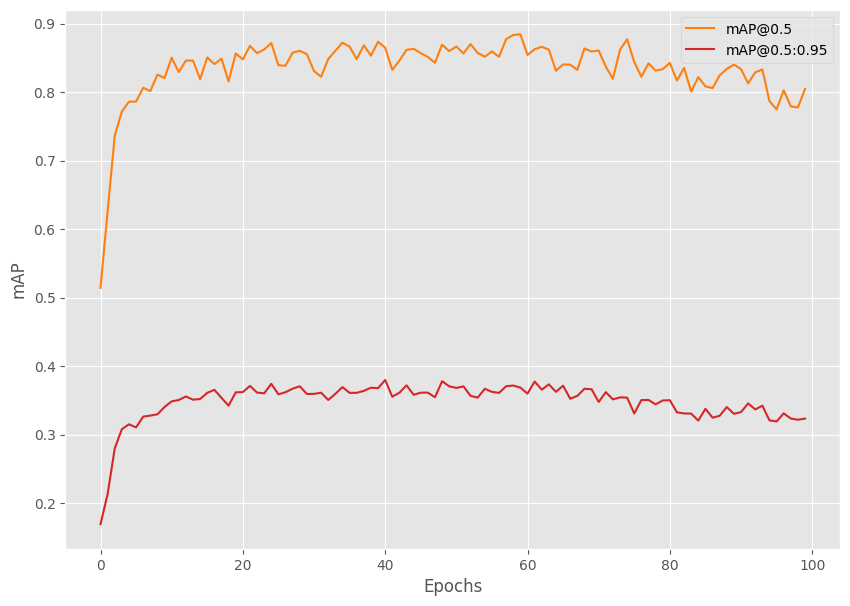

In [ ]:
from tqdm.auto import tqdm
from torchmetrics.detection.mean_ap import MeanAveragePrecision
from torch.optim.lr_scheduler import StepLR
import torch
import matplotlib.pyplot as plt
import time
import os

plt.style.use('ggplot')

seed = 42
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.cuda.manual_seed_all(seed)

# Function for running training iterations.
def train(train_data_loader, model):
    print('Training')
    model.train()

     # initialize tqdm progress bar
    prog_bar = tqdm(train_data_loader, total=len(train_data_loader))

    for i, data in enumerate(prog_bar):
        optimizer.zero_grad()
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]
        loss_dict = model(images, targets)

        losses = sum(loss for loss in loss_dict.values())
        loss_value = losses.item()

        train_loss_hist.send(loss_value)

        losses.backward()
        optimizer.step()

        # update the loss value beside the progress bar for each iteration
        prog_bar.set_description(desc=f"Loss: {loss_value:.4f}")
    return loss_value

# Function for running validation iterations.
def validate(valid_data_loader, model):
    print('Validating')
    model.eval()

    # Initialize tqdm progress bar.
    prog_bar = tqdm(valid_data_loader, total=len(valid_data_loader))
    target = []
    preds = []
    for i, data in enumerate(prog_bar):
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

        with torch.no_grad():
            outputs = model(images, targets)

        # For mAP calculation using Torchmetrics.
        #####################################
        for i in range(len(images)):
            true_dict = dict()
            preds_dict = dict()
            true_dict['boxes'] = targets[i]['boxes'].detach().cpu()
            true_dict['labels'] = targets[i]['labels'].detach().cpu()
            preds_dict['boxes'] = outputs[i]['boxes'].detach().cpu()
            preds_dict['scores'] = outputs[i]['scores'].detach().cpu()
            preds_dict['labels'] = outputs[i]['labels'].detach().cpu()
            preds.append(preds_dict)
            target.append(true_dict)
        #####################################

    metric.reset()
    metric.update(preds, target)
    metric_summary = metric.compute()
    return metric_summary

if __name__ == '__main__':
    os.makedirs('outputs', exist_ok=True)
    train_dataset = create_train_dataset(TRAIN_DIR)
    valid_dataset = create_valid_dataset(VALID_DIR)
    train_loader = create_train_loader(train_dataset, NUM_WORKERS)
    valid_loader = create_valid_loader(valid_dataset, NUM_WORKERS)
    print(f"Number of training samples: {len(train_dataset)}")
    print(f"Number of validation samples: {len(valid_dataset)}\n")

    # Initialize the model and move to the computation device.
    model = create_model(num_classes=NUM_CLASSES)
    model = model.to(DEVICE)
    # print(model)
    # Total parameters and trainable parameters.
    total_params = sum(p.numel() for p in model.parameters())
    print(f"{total_params:,} total parameters.")
    total_trainable_params = sum(
        p.numel() for p in model.parameters() if p.requires_grad)
    print(f"{total_trainable_params:,} training parameters.")
    params = [p for p in model.parameters() if p.requires_grad]
    optimizer = torch.optim.SGD(params, lr=0.001, momentum=0.9, weight_decay=0.0005, nesterov=True)
    scheduler = StepLR(
        optimizer=optimizer, step_size=15, gamma=0.1, verbose=True
    )

    # To monitor training loss
    train_loss_hist = Averager()
    # To store training loss and mAP values.
    train_loss_list = []
    map_50_list = []
    map_list = []

    # Mame to save the trained model with.
    MODEL_NAME = 'model'

    # Whether to show transformed images from data loader or not.
    # if VISUALIZE_TRANSFORMED_IMAGES:
    #     from custom_utils import show_tranformed_image
    #     show_tranformed_image(train_loader)

    # To save best model.
    save_best_model = SaveBestModel()

    metric = MeanAveragePrecision()

    # Training loop.
    for epoch in range(NUM_EPOCHS):
        print(f"\nEPOCH {epoch+1} of {NUM_EPOCHS}")

        # Reset the training loss histories for the current epoch.
        train_loss_hist.reset()

        # Start timer and carry out training and validation.
        start = time.time()
        train_loss = train(train_loader, model)
        metric_summary = validate(valid_loader, model)
        print(f"Epoch #{epoch+1} train loss: {train_loss_hist.value:.3f}")
        print(f"Epoch #{epoch+1} mAP: {metric_summary['map']}")
        end = time.time()
        print(f"Took {((end - start) / 60):.3f} minutes for epoch {epoch}")

        train_loss_list.append(train_loss)
        map_50_list.append(metric_summary['map_50'])
        map_list.append(metric_summary['map'])

        # save the best model till now.
        save_best_model(
            model, float(metric_summary['map_50']), epoch, 'outputs'
        )
        # Save the current epoch model.
        save_model(epoch, model, optimizer)

        # Save loss plot.
        save_loss_plot(OUT_DIR, train_loss_list)

        # Save mAP plot.
        save_mAP(OUT_DIR, map_50_list, map_list)
        # scheduler.step()

In [ ]:
import torch
from tqdm.auto import tqdm
from tqdm import TqdmExperimentalWarning
from torchmetrics.detection.mean_ap import MeanAveragePrecision

# Evaluation function
def validate(valid_data_loader, model):
    model.eval()

    # Initialize tqdm progress bar.
    prog_bar = tqdm(valid_data_loader, total=len(valid_data_loader))
    target = []
    preds = []
    for i, data in enumerate(prog_bar):
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

        with torch.no_grad():
            outputs = model(images, targets)

        # For mAP calculation using Torchmetrics.
        #####################################
        for i in range(len(images)):
            true_dict = dict()
            preds_dict = dict()
            true_dict['boxes'] = targets[i]['boxes'].detach().cpu()
            true_dict['labels'] = targets[i]['labels'].detach().cpu()
            preds_dict['boxes'] = outputs[i]['boxes'].detach().cpu()
            preds_dict['scores'] = outputs[i]['scores'].detach().cpu()
            preds_dict['labels'] = outputs[i]['labels'].detach().cpu()
            preds.append(preds_dict)
            target.append(true_dict)
        #####################################

    metric = MeanAveragePrecision()
    metric.update(preds, target)
    metric_summary = metric.compute()
    return metric_summary

if __name__ == '__main__':
    # Load the best model and trained weights.
    model = create_model(num_classes=NUM_CLASSES)
    checkpoint = torch.load('/content/outputs/best_model.pth', map_location=DEVICE)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.to(DEVICE).eval()

    test_dataset = create_test_dataset(
        '/content/PneumoniaDataset_9010_1000/test'
    )
    test_loader = create_test_loader(test_dataset, num_workers=NUM_WORKERS)

    metric_summary = validate(test_loader, model)
    print(f"mAP_50: {metric_summary['map_50']*100:.3f}")
    print(f"mAP_50_95: {metric_summary['map']*100:.3f}")

  0%|          | 0/100 [00:00<?, ?it/s]

mAP_50: 88.446
mAP_50_95: 36.794


  0%|          | 0/100 [00:00<?, ?it/s]

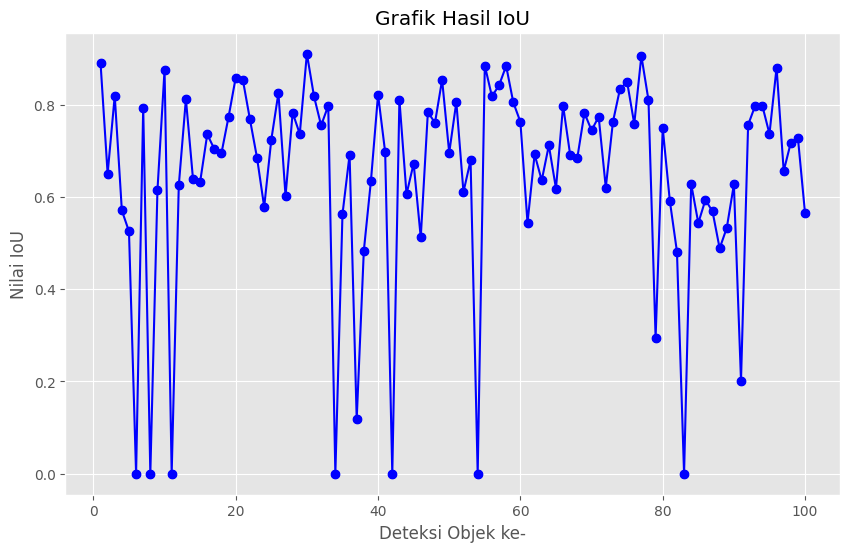

In [ ]:
import shutil
import torch
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
from torchvision.transforms.functional import to_pil_image
from torchvision.ops import box_iou

# Function to calculate Intersection over Union (IoU)
def calculate_iou(box1, box2):
    # Extract coordinates from the bounding box tensors
    box1 = [float(coord) for coord in box1]
    box2 = [float(coord) for coord in box2]

    # Calculate intersection area
    x1_int = max(box1[0], box2[0])
    y1_int = max(box1[1], box2[1])
    x2_int = min(box1[2], box2[2])
    y2_int = min(box1[3], box2[3])

    intersection = max(0, x2_int - x1_int) * max(0, y2_int - y1_int)

    # Calculate union area
    area1 = (box1[2] - box1[0]) * (box1[3] - box1[1])
    area2 = (box2[2] - box2[0]) * (box2[3] - box2[1])
    union = area1 + area2 - intersection

    # Calculate IoU
    iou = intersection / union if union > 0 else 0.0
    return iou

# source_path = "/content/drive/MyDrive/SKRIPSI/Hasil/Model_2/best_model.pth"
# destination_path = "/content/outputs/best_model.pth"

# shutil.copyfile(source_path, destination_path)

def show_iou_graph(images, true_boxes, pred_boxes, threshold=0.5, save_path="/content/iou_graph_model8.png"):
    all_ious = []

    for i in range(len(images)):
        true_boxes_i = true_boxes[i]
        pred_boxes_i = pred_boxes[i]

        ious = []  # To store IoU values for the current image

        for pred_box, score, label in zip(pred_boxes_i['boxes'], pred_boxes_i['scores'], pred_boxes_i['labels']):
            pred_box = [float(b) for b in pred_box]
            if score > threshold:
                # Find the corresponding true bounding box for the label
                true_box = true_boxes_i['boxes'][true_boxes_i['labels'] == label].cpu()
                if len(true_box) > 0:
                    true_box = [float(b) for b in true_box[0]]
                    iou = calculate_iou(pred_box, true_box)
                    ious.append(iou)

        # Store IoU values for the current image
        all_ious.append(ious)

    # Create IoU scatter plot
    plt.figure(figsize=(10, 6))
    plt.scatter(range(1, len(all_ious) + 1), [max(i, default=0) for i in all_ious], color='blue')
    plt.plot(range(1, len(all_ious) + 1), [max(i, default=0) for i in all_ious], linestyle='-', marker='o', color='blue')
    plt.title('Grafik Hasil IoU')
    plt.xlabel('Deteksi Objek ke-')
    plt.ylabel('Nilai IoU')
    plt.savefig(save_path)
    plt.show()

# Update the validate function to return images along with predictions
def validate(valid_data_loader, model):
    model.eval()

    # Initialize tqdm progress bar.
    prog_bar = tqdm(valid_data_loader, total=len(valid_data_loader))
    target = []
    preds = []
    images_list = []

    for i, data in enumerate(prog_bar):
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

        with torch.no_grad():
            outputs = model(images, targets)

        # For mAP calculation using Torchmetrics.
        for i in range(len(images)):
            true_dict = dict()
            preds_dict = dict()
            true_dict['boxes'] = targets[i]['boxes'].detach().cpu()
            true_dict['labels'] = targets[i]['labels'].detach().cpu()
            preds_dict['boxes'] = outputs[i]['boxes'].detach().cpu()
            preds_dict['scores'] = outputs[i]['scores'].detach().cpu()
            preds_dict['labels'] = outputs[i]['labels'].detach().cpu()
            preds.append(preds_dict)
            target.append(true_dict)
            images_list.append(images[i])

    return images_list, preds, target

if __name__ == '__main__':
    model = create_model(num_classes=NUM_CLASSES)
    checkpoint = torch.load('/content/outputs/best_model.pth', map_location=DEVICE)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.to(DEVICE).eval()

    test_dataset = create_test_dataset('/content/PneumoniaDataset_9010_1000/test')
    test_loader = create_test_loader(test_dataset, num_workers=NUM_WORKERS)

    # After calculating metrics, you can display the IoU graph
    images, pred_boxes, true_boxes = validate(test_loader, model)
    # class_names = ['_Background', 'Pneumonia']
    show_iou_graph(images, true_boxes, pred_boxes, save_path='/content/iou_graph_model8.png')

In [ ]:
def make_prediction(model, img, threshold):
    model.eval()
    preds = model(img)
    for id in range(len(preds)) :
        idx_list = []

        for idx, score in enumerate(preds[id]['scores']) :
            if score > threshold :
                idx_list.append(idx)

        preds[id]['boxes'] = preds[id]['boxes'][idx_list]
        preds[id]['labels'] = preds[id]['labels'][idx_list]
        preds[id]['scores'] = preds[id]['scores'][idx_list]

    return preds

def plot_image_from_output(img, annotation):

    img = img.cpu().permute(1,2,0)

    fig,ax = plt.subplots(1)
    ax.imshow(img)

    for idx in range(len(annotation["boxes"])):
        xmin, ymin, xmax, ymax = annotation["boxes"][idx]

        if annotation['labels'][idx] == 1 :
            rect = patches.Rectangle((xmin,ymin),(xmax-xmin),(ymax-ymin),linewidth=1,edgecolor='g',facecolor='none')
        else :
            rect = patches.Rectangle((xmin,ymin),(xmax-xmin),(ymax-ymin),linewidth=1,edgecolor='orange',facecolor='none')

        ax.add_patch(rect)

    plt.show()

In [ ]:
from tqdm import tqdm

labels = []
preds_adj_all = []
annot_all = []

for im, annot in tqdm(test_loader, position = 0, leave = True):
    im = list(img.to(DEVICE) for img in im)
    #annot = [{k: v.to(device) for k, v in t.items()} for t in annot]

    for t in annot:
        labels += t['labels']

    with torch.no_grad():
        preds_adj = make_prediction(model, im, 0.5)
        preds_adj = [{k: v.to(torch.device('cpu')) for k, v in t.items()} for t in preds_adj]
        preds_adj_all.append(preds_adj)
        annot_all.append(annot)


100%|██████████| 100/100 [00:13<00:00,  7.28it/s]


In [ ]:
!git clone https://github.com/Pseudo-Lab/Tutorial-Book-Utils
!python Tutorial-Book-Utils/PL_data_loader.py --data FaceMaskDetection
%cd Tutorial-Book-Utils/
import utils_ObjectDetection as utils

Cloning into 'Tutorial-Book-Utils'...
remote: Enumerating objects: 45, done.
remote: Counting objects: 100% (45/45), done.
remote: Compressing objects: 100% (39/39), done.
remote: Total 45 (delta 18), reused 17 (delta 5), pack-reused 0
Receiving objects: 100% (45/45), 11.62 KiB | 11.62 MiB/s, done.
Resolving deltas: 100% (18/18), done.
Downloading...
From (original): https://drive.google.com/uc?id=16Gzn1w38yZLJpzmzKcRIRveFeHZtCEr7
From (redirected): https://drive.google.com/uc?id=16Gzn1w38yZLJpzmzKcRIRveFeHZtCEr7&confirm=t&uuid=6bfb3830-18c6-4791-9de4-a15385bf5f65
To: /content/Face Mask Detection.zip
100% 417M/417M [00:09<00:00, 44.5MB/s]
Face Mask Detection.zip download complete!
/content/Tutorial-Book-Utils


In [ ]:
sample_metrics = []
for batch_i in range(len(preds_adj_all)):
    sample_metrics += utils.get_batch_statistics(preds_adj_all[batch_i], annot_all[batch_i], iou_threshold=0.5)

true_positives, pred_scores, pred_labels = [torch.cat(x, 0) for x in list(zip(*sample_metrics))]  # batch semua disatukan
precision, recall, AP, f1, ap_class = utils.ap_per_class(true_positives, pred_scores, pred_labels, torch.tensor(labels))
mAP = torch.mean(AP)
print(f'mAP : {mAP}')
print(f'AP : {AP}')

mAP : 0.8016891894849962
AP : tensor([0.8017], dtype=torch.float64)


In [ ]:
sample_metrics = []
for batch_i in range(len(preds_adj_all)):
    sample_metrics += utils.get_batch_statistics(preds_adj_all[batch_i], annot_all[batch_i], iou_threshold=0.4)

true_positives, pred_scores, pred_labels = [torch.cat(x, 0) for x in list(zip(*sample_metrics))]  # batch semua disatukan
precision, recall, AP, f1, ap_class = utils.ap_per_class(true_positives, pred_scores, pred_labels, torch.tensor(labels))
mAP = torch.mean(AP)
print(f'mAP : {mAP}')
print(f'AP : {AP}')

mAP : 0.8519449758873705
AP : tensor([0.8519], dtype=torch.float64)


In [ ]:
sample_metrics = []
for batch_i in range(len(preds_adj_all)):
    sample_metrics += utils.get_batch_statistics(preds_adj_all[batch_i], annot_all[batch_i], iou_threshold=0.3)

true_positives, pred_scores, pred_labels = [torch.cat(x, 0) for x in list(zip(*sample_metrics))]  # batch semua disatukan
precision, recall, AP, f1, ap_class = utils.ap_per_class(true_positives, pred_scores, pred_labels, torch.tensor(labels))
mAP = torch.mean(AP)
print(f'mAP : {mAP}')
print(f'AP : {AP}')

mAP : 0.8834417006620328
AP : tensor([0.8834], dtype=torch.float64)
